In [1]:

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


# from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../..') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。
from util import *

In [2]:
torch.cuda.set_device(1) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
# implementation of PINNsformer
# paper: PINNsFormer: A Transformer-Based Framework For Physics-Informed Neural Networks
# link: https://arxiv.org/abs/2307.11833

import torch
import torch.nn as nn
import pdb

from util import get_clones


#自定义激活函数Wavelet：w1 * sin(x) + w2 * cos(x)
class WaveAct(nn.Module):
    def __init__(self):
        super(WaveAct, self).__init__() 
        #自定义两个可学习参数w1和w2，初始化为1，训练过程中会更新这两个参数
        self.w1 = nn.Parameter(torch.ones(1), requires_grad=True)
        self.w2 = nn.Parameter(torch.ones(1), requires_grad=True)

    def forward(self, x):
        return self.w1 * torch.sin(x)+ self.w2 * torch.cos(x)

#MLP组件，第一层形状为(d_model, d_ff)，第二层形状为(d_ff, d_ff)，第三层形状为(d_ff, d_model)，前两个使用自定义激活函数WaveAct
class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff=256):
        super(FeedForward, self).__init__() 
        self.linear = nn.Sequential(*[
            nn.Linear(d_model, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_model)
        ])

    def forward(self, x):
        return self.linear(x)

#编码器层
class EncoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(EncoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数
        
    def forward(self, x): #形状为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #对输入x应用激活函数
        # pdb.set_trace()
        x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #对自注意力的输出应用激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
        return x 


class DecoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(DecoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) # 多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数

    def forward(self, x, e_outputs): #输入形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #将解码器输入x通过激活函数
        x = x + self.attn(x2, e_outputs, e_outputs)[0] #多头注意力机制，查询为解码器输入经过激活函数后的x2，键和值为编码器的输出e_outputs，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #将自注意力的输出通过激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到解码器的输出
        return x

#编码器层，包含多个堆叠的编码器架构
class Encoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表编码器的头数，N代表包含几个编码器，d_model是数据的嵌入维度（用于每个编码器），heads是头的数量
        super(Encoder, self).__init__()
        self.N = N 
        self.layers = get_clones(EncoderLayer(d_model, heads), N) #N个编码器
        self.act = WaveAct()

    def forward(self, x): #输入一次通过N个编码器，x的形状为(点的数量，序列长度，d_model)
        for i in range(self.N):
            x = self.layers[i](x)
        return self.act(x) #编码器的输出要经过激活函数

#解码器层，包含多个堆叠的解码器架构
class Decoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表解码器的头数，N代表包含几个解码器，d_model是数据的嵌入维度（用于每个解码器），heads是头的数量
        super(Decoder, self).__init__()
        self.N = N
        self.layers = get_clones(DecoderLayer(d_model, heads), N) #N个解码器
        self.act = WaveAct()
        
    def forward(self, x, e_outputs): #输入一次通过N个解码器层，x的形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        for i in range(self.N): #输入和编码器输出依次通过N个解码器
            x = self.layers[i](x, e_outputs) 
        return self.act(x) #解码器的输出要经过激活函数



class DNN(nn.Module):
    def __init__(self, d_out, d_model, d_hidden, N, heads): #接受参数为：d_out代表整个模型的输出的维度（就是最后的mlp层的输出维度），d_model代表每个点的特征嵌入维度，d_hidden代表最后的output layer模块中的隐藏层的维度，N代表编码器和解码器的层数，heads代表多头注意力机制的头数
        super(DNN, self).__init__()

        self.linear_emb = nn.Linear(2, d_model) #线性层，将输入的2维数据映射到d_model维度

        self.encoder = Encoder(d_model, N, heads) #编码器层
        self.decoder = Decoder(d_model, N, heads) #解码器层

        #输出的mlp模块，包含三个线性层，前两个使用自定义激活函数WaveAct，最终将feature从d_model维度映射到d_hidden维度，最后将d_hidden维度映射到d_out维度
        self.linear_hidden = nn.Sequential(*[
            nn.Linear(d_model, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, 2),
        ])
        self.linear_out = nn.Sequential(*[
            WaveAct(),
            nn.Linear(2, d_out)
        ])

    def forward(self, x): #输入的x形状一般为(点的数量, 序列长度, 2)
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output #(点的数量，序列长度，d_out)
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        # output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output_hidden #(点的数量，序列长度，2)

    
   

In [4]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, b_left, b_right, b_upper, b_lower, X_f, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        
        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)

        X_f = make_time_sequence(X_f, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 

        b_left = make_time_sequence(b_left, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        b_right = make_time_sequence(b_right, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        b_upper = make_time_sequence(b_upper, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        b_lower = make_time_sequence(b_lower, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        
        # data
        #配位点数据
        self.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)

        self.x_left = torch.tensor(b_left[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1)\n",
        self.t_left = torch.tensor(b_left[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_right = torch.tensor(b_right[:,:, 0:1], requires_grad=True).float().to(device) 
        self.t_right = torch.tensor(b_right[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_upper = torch.tensor(b_upper[:,:, 0:1], requires_grad=True).float().to(device) 
        self.t_upper = torch.tensor(b_upper[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_lower = torch.tensor(b_lower[:,:, 0:1], requires_grad=True).float().to(device)
        self.t_lower = torch.tensor(b_lower[:,:, 1:2], requires_grad=True).float().to(device)
        
        
        # deep neural networks
        self.dnn = DNN(d_out=1, d_hidden=512, d_model=32, N=1, heads=2).to(device) 
        # self.dnn.apply(self.init_weights) #初始化模型中线性层的权重和偏置
        
        # optimizers: using the same settings
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        # self.optimizer_LBFGS = torch.optim.LBFGS(
        #     self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重与偏置）
        #     lr=1.0,  #学习率设置为1
        #     max_iter=50000,  #最大迭代次数为50000
        #     max_eval=50000,  #最大评估次数为50000
        #     history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
        #     # tolerance_grad=1e-10,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
        #     # tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
        #     line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        # )
        self.optimizer_LBFGS = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe') #使用LBFGS优化器，line_search_fn='strong_wolfe'表示使用强Wolfe线搜索方法

        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())

        #创建第三个优化器，括号内为要优化的参数，使用SGD优化方法
        self.optimizer_SGD = torch.optim.SGD(self.dnn.parameters(), lr=0.01, momentum=0.9)

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

    #初始化神经网络的线性层权重参数，使用Xavier初始化权重，偏置则初始化为0.01
    def init_weights(self, m):
        if isinstance(m, nn.Linear): #判断是否是线性层
            torch.nn.init.xavier_uniform(m.weight)
            m.bias.data.fill_(0.01)
        
    #输入是两个(点的数量，序列长度，1)，输出(点的数量，序列长度，1)
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #合并为(点的数量，序列长度，2)
        return u
    
    #输入是两个(点的数量，序列长度，1)
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x, t) #输出(点的数量，序列长度，1)
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        u_x = torch.autograd.grad(
            u, x,  #输入的张量，要计算u关于x的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0]

        u_xx = torch.autograd.grad(
            u_x, x,  #输入的张量，要计算u_x关于x的
            grad_outputs=torch.ones_like(u_x), #生成一个与u_x形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0]

        u_tt = torch.autograd.grad(
            u_t, t,  #输入的张量，要计算u_t关于t的
            grad_outputs=torch.ones_like(u_t), #生成一个与u_t形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0]

        
        f=u_tt - 4 * u_xx #计算f，定义见论文
        return f #(点的数量，序列长度，1)
    
    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
        
        pred_upper = self.net_u(self.x_upper, self.t_upper) #输出(点的数量，序列长度，1)\n",
        pred_lower = self.net_u(self.x_lower, self.t_lower) #输出(点的数量，序列长度，1)\n",
        pred_left = self.net_u(self.x_left, self.t_left) #输出(点的数量，序列长度，1)\n",
        f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)\n",

        pi = torch.tensor(np.pi, dtype=torch.float32, requires_grad=False).to(device)

        #计算损失，共三项损失
        loss_res = torch.mean(f_pred ** 2)
        loss_bc = torch.mean((pred_upper) ** 2) + torch.mean((pred_lower) ** 2)
        ui_t = torch.autograd.grad(pred_left, self.t_left, grad_outputs=torch.ones_like(pred_left), retain_graph=True, create_graph=True)[0]

        loss_ic_1 = torch.mean((pred_left[:,0] - torch.sin(pi*self.x_left[:,0]) - 0.5 * torch.sin(3*pi*self.x_left[:,0])) ** 2)
        loss_ic_2 = torch.mean((ui_t)**2)

        loss_ic = loss_ic_1 + loss_ic_2

        loss = loss_res + loss_bc + loss_ic

        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数

        self.iter += 1 #每调用一次损失函数，迭代次数加1

        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        return loss #返回loss

      
    
    def train(self, nIter, nIterLBFGS):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式
        #先使用Adam优化器优化nIter次\n",
        for epoch in tqdm(range(nIter), desc='Adam'):
            pred_upper = self.net_u(self.x_upper, self.t_upper) #输出(点的数量，序列长度，1)\n",
            pred_lower = self.net_u(self.x_lower, self.t_lower) #输出(点的数量，序列长度，1)\n",
            pred_left = self.net_u(self.x_left, self.t_left) #输出(点的数量，序列长度，1)\n",
            f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)\n",

            pi = torch.tensor(np.pi, dtype=torch.float32, requires_grad=False).to(device)

            #计算损失，共三项损失
            loss_res = torch.mean(f_pred ** 2)
            loss_bc = torch.mean((pred_upper) ** 2) + torch.mean((pred_lower) ** 2)
            ui_t = torch.autograd.grad(pred_left, self.t_left, grad_outputs=torch.ones_like(pred_left), retain_graph=True, create_graph=True)[0]

            loss_ic_1 = torch.mean((pred_left[:,0] - torch.sin(pi*self.x_left[:,0]) - 0.5 * torch.sin(3*pi*self.x_left[:,0])) ** 2)
            loss_ic_2 = torch.mean((ui_t)**2)

            loss_ic = loss_ic_1 + loss_ic_2

            loss = loss_res + loss_bc + loss_ic

            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）\n",
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数\n",
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化\n",

            #record the loss value\n",
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中\n",

        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次\n",
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式\n",
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   \n",

 

  


    def predict(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u = self.net_u(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
            u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
            u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上

        return u #u形状是(点的数量，1)，f形状是(点的数量，1)
    
    def residual(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        
        f = self.net_f(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
        f = torch.mean(f, dim=1).reshape(-1,1) #对f在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差
        # f = f[:,0:1].reshape(-1,1) #将f的形状从(点的数量，序列长度，1)变为(点的数量，1)
        f = f.detach().cpu().numpy()
        return f #u形状是(点的数量，1)，f形状是(点的数量，1)
    

    def hidden_predict(self, X):#形状(点的数量，序列长度，2)
        x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)
        self.dnn.eval()
        with torch.no_grad():
            hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=-1)) #(点的数量，序列长度，2)
            hidden_output = hidden_output.detach().cpu().numpy()
        # hidden_output_x = hidden_output[:, 0]
        # hidden_output_t = hidden_output[:, 1]
        # hidden_output_x = hidden_output_x.detach().cpu().numpy()
        # hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output #(点的数量，序列长度，2)
    

In [5]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [6]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter): #输入是(点的数量，2)
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    X0 = X
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    xs = []
    X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X = model.hidden_predict(X0) #(点的数量，序列长度，2)
    
    for i in range(num_iter): #循环num_iter次
        X = model.hidden_predict(X) #(点的数量，序列长度，2)
        xs.append(X) #新添加(点的数量，序列长度，2)

    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    X1 = np.concatenate((x1, t1), axis=1) #(N_f_new,2)形状
    X1 = make_time_sequence(X1, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X1 = model.hidden_predict(X1) #(N_f_new,序列长度,2)

    for i in range(num_iter): #循环num_iter次
        X1 = model.hidden_predict(X1) #(N_f_new,序列长度,
        xs1.append(X1) #新添加(N_f_new,序列长度,2)

    

    # # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t,使用chunchaos要注释掉
    # last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    # last_iter_xs1 = np.array(xs1[-1])
    # distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=(1,2))
    # distances = distances.flatten()







    #chunchaos方法
    num_elements_to_average = 20
    # 提取最后 20 个元素
    last_20_xs = xs[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    last_20_xs1 = xs1[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # 存储每个时间步（列表中的每个元素）的混沌度分数
    step_chaos_scores = []
    # 遍历最后 20 个元素,zip 将两个列表的对应元素配对
    for step_xs, step_xs1 in zip(last_20_xs, last_20_xs1):
        # step_xs 和 step_xs1 都是形状为 (N_f_new, sequence_length, 2) 的数组/张量
        difference_step = step_xs - step_xs1 # 计算差异
        # 计算每个数据点在当前步的混沌度分数 (形状 (N_f_new,))
        # 假设使用 NumPy 进行计算
        step_scores = np.linalg.norm(difference_step, axis=(1, 2))
        # 将这 N_f_new 个分数添加到列表中
        step_chaos_scores.append(step_scores)

    # step_chaos_scores 是一个包含 20 个元素的列表，每个元素都是形状为 (N_f_new,) 的 NumPy 数组
    # 将列表转换成一个单一的 NumPy 数组，形状为 (20, N_f_new)
    all_step_scores = np.stack(step_chaos_scores)
    # 现在 all_step_scores 的形状是 (num_elements_to_average, N_f_new)
    # axis 0 是时间步 (20)，axis 1 是原始数据点 (N_f_new)
    # 计算最后 20 个时间步在每个数据点上的平均混沌度分数
    # 沿着时间步轴 (axis=0) 求平均
    distances = np.mean(all_step_scores, axis=0)
    # 结果形状是 (N_f_new,)







    return distances

In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子\n",
# seeds = [0]

N_f = 51*51

lb = np.array([0.0, 0.0])
ub = np.array([2 * np.pi, 1.0])

# Train PINNsformer
_, b_left, b_right, b_upper, b_lower = get_data([0,2*np.pi], [0,1], 51, 51) #51代表初值点、边界值点数量！！
X_star, _, _, _, _ = get_data([0,2*np.pi], [0,1], 101, 101) #生成测试数据，采样点数为101x101,这里的X_star就是res_test

error_u = [] #创建一个空列表，用于存储误差
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

nIter = 10000 #设置迭代次数为10000
nIterLBFGS = 1000 #设置LBFGS迭代次数为500

def u_ana(x,t):
    return np.sin(np.pi*x) * np.cos(2*np.pi*t) + 0.5 * np.sin(3*np.pi*x) * np.cos(6*np.pi*t)

for seed in seeds:
    set_seed(seed) #设置随机数种子
    # --- 1. 参数设置 ---
    nIter = 10000
    nIterLBFGS = 500
    # ... 其他参数 ...

    # --- 2. 初始化 ---
    N_f_1 = N_f // 20
    X_f_train = lb + (ub - lb) * lhs(2, N_f_1)
    model = PhysicsInformedNN(b_left, b_right, b_upper, b_lower, X_f_train, lb, ub)

    # 【新】创建巨大、固定的候选点池
    N_f_candidate = N_f * 2
    X_f_candidate = lb + (ub - lb) * lhs(2, N_f_candidate)
    is_point_selected_mask = np.zeros(N_f_candidate, dtype=bool) #布尔掩码，形状是(N_f_candidate,)，初始值为False，表示所有点都未被选择
    

    # --- 3. 初始训练 ---
    start_time = time.time()
    model.train(nIter // 20, 0)

    # --- 4. 主动学习循环 ---
    # 计算总轮数,这里是19
    num_active_rounds = (nIter - nIter // 20) // (nIter // 20)
    # 每轮训练中记录的检查点数量，其实就是后面的T
    num_checkpoints_per_round = 10
    # 两次检查点之间的训练迭代次数
    epochs_between_checkpoints = (nIter // 20) // num_checkpoints_per_round

    # 用于存储每一轮最终预测的全局历史
    global_final_predictions = []

    for i in range(num_active_rounds):        
        # a. 训练并记录预测历史
        prediction_history = []
        # 记录当前模型在整个候选池上的预测输出
        
        for j in range(num_checkpoints_per_round):
            model.train(epochs_between_checkpoints, 0)
            
            # 记录当前模型在整个候选池上的预测输出
            predictions = model.predict(X_f_candidate) # 返回 (N, 1) 的Numpy数组
            # prediction_history.append(predictions.flatten()) # 存为一维数组，每个元素形状为 (N, ) 
            prediction_history.append(predictions) # 存为二维数组，每个元素形状为 (N, 1)
        local_prediction_history = prediction_history

        # b. 计算不稳定性分数 g(x) = Σ v_t * a_t(x)
        # 将历史记录转为矩阵 (T+1, N_candidates,1)
        local_history_matrix = np.array(local_prediction_history)
        T_local, num_candidates, _ = local_history_matrix.shape #T表示共存储了多少个模型的预测结果，num_candidates表示候选点的数量

        # 获取最终预测u_T(x)
        local_final_prediction = local_history_matrix[-1, :, :] # (N_candidates, 1) 的数组

        # 计算不一致性矩阵 a_t(x) = |u_t(x) - u_T(x)|
        # 利用 NumPy 的广播机制高效计算，具体为(T, N_candidates,1)-(N_candidates,1)（相当于用T个元素分别和最后一个元素相减）,最后得到的形状是(T, N_candidates)
        # disagreement_matrix_A = np.abs(prediction_history_matrix - final_prediction_vec)
        local_disagreement = np.linalg.norm(local_history_matrix - local_final_prediction, ord=2, axis=-1)

        # 计算时间权重向量 v_t = (t/T)^k
        t_local = np.arange(1, T_local + 1) #形状是(T,)的数组
        k_local = 1.0  # 权重指数，可以作为超参数调整
        v_local = (t_local / T_local) ** k_local #形状是(T,)

        # 计算最终不稳定性分数 g(x)
        # g = V^T * A (矩阵乘法概念)
        # 实际操作：将权重向量V变形以进行逐元素乘法，然后在时间轴上求和
        # v_local（也就是V）的形状是(T,)，local_disagreement（也就是A）的形状是(T, N_candidates)
        # V[:, np.newaxis] 将V变为 (T, 1)，可以与A进行广播乘法
        g_micro = np.sum(v_local[:, np.newaxis] * local_disagreement, axis=0) #求和前形状为 (T, N_candidates)，求和后形状为(N_candidates,)

        
        # c. 更新并计算【宏观不稳定性 g_macro】
        # ------------------------------------------------------------------
        # 将本轮的最终预测加入全局历史列表
        global_final_predictions.append(local_final_prediction)
        
        g_macro = np.zeros(num_candidates) # 如果历史太短，宏观不稳定性为0
        
        # 只有当全局历史足够长时（至少有两次最终预测），计算才有意义
        if len(global_final_predictions) > 1:
            global_history_matrix = np.array(global_final_predictions)
            T_global, _, _ = global_history_matrix.shape # T_global 是当前的主动学习轮数 i+1
            
            # 使用全局最新的预测作为基准
            global_final_prediction = global_history_matrix[-1, :, :]
            
            # 计算宏观不一致性
            global_disagreement = np.linalg.norm(global_history_matrix - global_final_prediction, ord=2, axis=-1)
            
            # 【宏观 t, k】
            t_global = np.arange(1, T_global + 1)
            k_macro = 2.0 # 宏观时间尺度上，可以给后期变化更大的惩罚，所以k可以更大
            v_global = (t_global / T_global) ** k_macro
            
            # 计算宏观不稳定性分数
            g_macro = np.sum(v_global[:, np.newaxis] * global_disagreement, axis=0)


        # d. 融合分数
        # ------------------------------------------------------------------
        # 在融合前，对两种分数进行归一化，使其尺度相当，避免其中一个主导
        # 这是一个很好的实践，可以防止数值问题
        if np.std(g_micro) > 1e-6:
            g_micro_norm = (g_micro - np.mean(g_micro)) / np.std(g_micro)
        else:
            g_micro_norm = np.zeros_like(g_micro)

        if np.std(g_macro) > 1e-6:
            g_macro_norm = (g_macro - np.mean(g_macro)) / np.std(g_macro)
        else:
            g_macro_norm = np.zeros_like(g_macro)
            
        # 设置融合权重
        w_micro = 0.5
        w_macro = 0.5
        
        instability_scores_g = w_micro * g_micro_norm + w_macro * g_macro_norm



        batch_size = N_f_candidate // 10 # 设置批处理大小为候选点数量的十分之一，避免显存爆炸
        all_residuals = [] # 创建一个空列表来存储每个批次的残差结果


        # 循环处理每个批次
        for i in range(0, N_f_candidate, batch_size):
            # 获取当前批次的数据
            X_batch = X_f_candidate[i : i + batch_size]
            
            # 对当前批次计算残差
            # model.residual 内部的计算量大大减小，不会爆显存了
            residual_batch = model.residual(X_batch) # 返回 (batch_size, 1) 的 NumPy 数组
            
            # 将当前批次的结果添加到列表中
            all_residuals.append(residual_batch)

        # 将所有批次的结果拼接成一个大的 NumPy 数组
        residual = np.vstack(all_residuals) # vstack 用于垂直堆叠

        # --- 后续处理不变 ---
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        # 将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()

        num_iter=100
        #计算混沌度
        distances = calculate_chaos(model, X_f_candidate, num_iter)




        #进行归一化
        epsilon = 1e-5
        
        norm_residual = np.linalg.norm(abs_residual)
        if norm_residual > epsilon:
            abs_residual = abs_residual / norm_residual
        else:
            abs_residual = np.zeros_like(abs_residual)
        norm_distances = np.linalg.norm(distances)
        if norm_distances > epsilon:
            distances = distances / norm_distances
        else:
            distances = np.zeros_like(distances)

        norm_instability = np.linalg.norm(instability_scores_g)
        if norm_instability > epsilon:
            instability_scores_g = instability_scores_g / norm_instability
        else:
            instability_scores_g = np.zeros_like(instability_scores_g)

        xinxi = instability_scores_g + distances #将残差和不稳定性分数相加，得到新的分数


        # e. 选择新的点
        # 屏蔽已选中的点，防止重复选择
        xinxi[is_point_selected_mask] = -1.0
        
        # 找出分数最高的 N_f_1 个点的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:]
        
        # 提取新点
        X_f_train_topk = X_f_candidate[topk_indices]
        
        # f. 更新训练集和掩码
        X_f_train = np.vstack((X_f_train, X_f_train_topk))
        is_point_selected_mask[topk_indices] = True


        # e. 更新模型内部的配位点
        X_f = make_time_sequence(X_f_train, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        
        #配位点数据
        model.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)



    model.train(0,nIterLBFGS) #使用LBFGS训练500次
    #训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))


    #用训练好的模型进行预测，返回四个值（均为数组）  
    u_pred = model.predict(X_star).flatten()

    # u_pred = u_pred.reshape(101,101)

    u_star = u_ana(X_star[:,0], X_star[:,1])
    # .reshape(101,101)\n",


    #计算误差（基于2范数）        
    error_u.append(np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)) #计算误差，然后将误差添加到error_u列表中             
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:04,  4.00it/s]

Adam:   0%|          | 2/500 [00:00<01:20,  6.16it/s]

Adam:   1%|          | 4/500 [00:00<00:52,  9.51it/s]

Adam:   1%|          | 6/500 [00:00<00:44, 11.18it/s]

Adam:   2%|▏         | 8/500 [00:00<00:40, 12.09it/s]

Adam:   2%|▏         | 10/500 [00:00<00:38, 12.59it/s]

Adam:   2%|▏         | 12/500 [00:01<00:37, 12.96it/s]

Adam:   3%|▎         | 14/500 [00:01<00:36, 13.20it/s]

Adam:   3%|▎         | 16/500 [00:01<00:36, 13.42it/s]

Adam:   4%|▎         | 18/500 [00:01<00:35, 13.59it/s]

Adam:   4%|▍         | 20/500 [00:01<00:34, 13.87it/s]

Adam:   4%|▍         | 22/500 [00:01<00:31, 14.98it/s]

Adam:   5%|▍         | 24/500 [00:01<00:31, 15.24it/s]

Adam:   5%|▌         | 26/500 [00:02<00:31, 15.05it/s]

Adam:   6%|▌         | 28/500 [00:02<00:31, 15.05it/s]

Adam:   6%|▌         | 30/500 [00:02<00:32, 14.65it/s]

Adam:   6%|▋         | 32/500 [00:02<00:31, 14.92it/s]

Adam:   7%|▋         | 34/500 [00:02<00:30, 15.17it/s]

Adam:   7%|▋         | 36/500 [00:02<00:31, 14.65it/s]

Adam:   8%|▊         | 38/500 [00:02<00:32, 14.43it/s]

Adam:   8%|▊         | 40/500 [00:02<00:32, 14.15it/s]

Adam:   8%|▊         | 42/500 [00:03<00:32, 14.12it/s]

Adam:   9%|▉         | 44/500 [00:03<00:32, 14.07it/s]

Adam:   9%|▉         | 46/500 [00:03<00:31, 14.46it/s]

Adam:  10%|▉         | 48/500 [00:03<00:31, 14.24it/s]

Adam:  10%|█         | 50/500 [00:03<00:32, 13.96it/s]

Adam:  10%|█         | 52/500 [00:03<00:32, 13.98it/s]

Adam:  11%|█         | 54/500 [00:03<00:32, 13.88it/s]

Adam:  11%|█         | 56/500 [00:04<00:31, 13.88it/s]

Adam:  12%|█▏        | 58/500 [00:04<00:31, 13.84it/s]

Adam:  12%|█▏        | 60/500 [00:04<00:31, 13.80it/s]

Adam:  12%|█▏        | 62/500 [00:04<00:31, 13.86it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:31, 13.79it/s]

Adam:  13%|█▎        | 66/500 [00:04<00:31, 13.84it/s]

Adam:  14%|█▎        | 68/500 [00:05<00:31, 13.84it/s]

Adam:  14%|█▍        | 70/500 [00:05<00:30, 13.89it/s]

Adam:  14%|█▍        | 72/500 [00:05<00:31, 13.54it/s]

Adam:  15%|█▍        | 74/500 [00:05<00:29, 14.53it/s]

Adam:  15%|█▌        | 76/500 [00:05<00:29, 14.55it/s]

Adam:  16%|█▌        | 78/500 [00:05<00:28, 14.71it/s]

Adam:  16%|█▌        | 80/500 [00:05<00:28, 14.53it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:30, 13.91it/s]

Adam:  17%|█▋        | 84/500 [00:06<00:28, 14.46it/s]

Adam:  17%|█▋        | 86/500 [00:06<00:29, 14.09it/s]

Adam:  18%|█▊        | 88/500 [00:06<00:29, 13.96it/s]

Adam:  18%|█▊        | 90/500 [00:06<00:29, 13.88it/s]

Adam:  18%|█▊        | 92/500 [00:06<00:32, 12.65it/s]

Adam:  19%|█▉        | 94/500 [00:06<00:31, 12.82it/s]

Adam:  19%|█▉        | 96/500 [00:07<00:30, 13.05it/s]

Adam:  20%|█▉        | 98/500 [00:07<00:30, 13.08it/s]

Adam:  20%|██        | 100/500 [00:07<00:30, 13.22it/s]

Adam:  20%|██        | 102/500 [00:07<00:29, 13.27it/s]

Adam:  21%|██        | 104/500 [00:07<00:29, 13.36it/s]

Adam:  21%|██        | 106/500 [00:07<00:29, 13.23it/s]

Adam:  22%|██▏       | 108/500 [00:07<00:29, 13.27it/s]

Adam:  22%|██▏       | 110/500 [00:08<00:31, 12.50it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:28, 13.70it/s]

Adam:  23%|██▎       | 114/500 [00:08<00:28, 13.56it/s]

Adam:  23%|██▎       | 116/500 [00:08<00:28, 13.51it/s]

Adam:  24%|██▎       | 118/500 [00:08<00:28, 13.39it/s]

Adam:  24%|██▍       | 120/500 [00:08<00:28, 13.36it/s]

Adam:  24%|██▍       | 122/500 [00:08<00:28, 13.41it/s]

Adam:  25%|██▍       | 124/500 [00:09<00:28, 13.41it/s]

Adam:  25%|██▌       | 126/500 [00:09<00:27, 13.38it/s]

Adam:  26%|██▌       | 128/500 [00:09<00:27, 13.40it/s]

Adam:  26%|██▌       | 130/500 [00:09<00:27, 13.44it/s]

Adam:  26%|██▋       | 132/500 [00:09<00:27, 13.56it/s]

Adam:  27%|██▋       | 134/500 [00:09<00:25, 14.30it/s]

Adam:  27%|██▋       | 136/500 [00:10<00:26, 13.86it/s]

Adam:  28%|██▊       | 138/500 [00:10<00:26, 13.73it/s]

Adam:  28%|██▊       | 140/500 [00:10<00:26, 13.68it/s]

Adam:  28%|██▊       | 142/500 [00:10<00:26, 13.56it/s]

Adam:  29%|██▉       | 144/500 [00:10<00:26, 13.54it/s]

Adam:  29%|██▉       | 146/500 [00:10<00:26, 13.51it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:26, 13.54it/s]

Adam:  30%|███       | 150/500 [00:11<00:25, 13.52it/s]

Adam:  30%|███       | 152/500 [00:11<00:24, 13.95it/s]

Adam:  31%|███       | 154/500 [00:11<00:23, 14.44it/s]

Adam:  31%|███       | 156/500 [00:11<00:24, 14.18it/s]

Adam:  32%|███▏      | 158/500 [00:11<00:24, 13.93it/s]

Adam:  32%|███▏      | 160/500 [00:11<00:24, 13.83it/s]

Adam:  32%|███▏      | 162/500 [00:11<00:23, 14.11it/s]

Adam:  33%|███▎      | 164/500 [00:12<00:24, 13.92it/s]

Adam:  33%|███▎      | 166/500 [00:12<00:24, 13.74it/s]

Adam:  34%|███▎      | 168/500 [00:12<00:23, 13.99it/s]

Adam:  34%|███▍      | 170/500 [00:12<00:22, 14.40it/s]

Adam:  34%|███▍      | 172/500 [00:12<00:22, 14.59it/s]

Adam:  35%|███▍      | 174/500 [00:12<00:22, 14.24it/s]

Adam:  35%|███▌      | 176/500 [00:12<00:23, 13.96it/s]

Adam:  36%|███▌      | 178/500 [00:13<00:26, 12.31it/s]

Adam:  36%|███▌      | 180/500 [00:13<00:25, 12.60it/s]

Adam:  36%|███▋      | 182/500 [00:13<00:24, 12.87it/s]

Adam:  37%|███▋      | 184/500 [00:13<00:24, 13.13it/s]

Adam:  37%|███▋      | 186/500 [00:13<00:23, 13.21it/s]

Adam:  38%|███▊      | 188/500 [00:13<00:23, 13.18it/s]

Adam:  38%|███▊      | 190/500 [00:13<00:23, 13.23it/s]

Adam:  38%|███▊      | 192/500 [00:14<00:23, 13.31it/s]

Adam:  39%|███▉      | 194/500 [00:14<00:22, 13.36it/s]

Adam:  39%|███▉      | 196/500 [00:14<00:22, 13.42it/s]

Adam:  40%|███▉      | 198/500 [00:14<00:22, 13.46it/s]

Adam:  40%|████      | 200/500 [00:14<00:22, 13.50it/s]

Adam:  40%|████      | 202/500 [00:14<00:22, 13.49it/s]

Adam:  41%|████      | 204/500 [00:15<00:22, 13.38it/s]

Adam:  41%|████      | 206/500 [00:15<00:21, 13.39it/s]

Adam:  42%|████▏     | 208/500 [00:15<00:21, 13.42it/s]

Adam:  42%|████▏     | 210/500 [00:15<00:21, 13.49it/s]

Adam:  42%|████▏     | 212/500 [00:15<00:21, 13.53it/s]

Adam:  43%|████▎     | 214/500 [00:15<00:21, 13.52it/s]

Adam:  43%|████▎     | 216/500 [00:15<00:21, 13.33it/s]

Adam:  44%|████▎     | 218/500 [00:16<00:21, 13.41it/s]

Adam:  44%|████▍     | 220/500 [00:16<00:20, 13.41it/s]

Adam:  44%|████▍     | 222/500 [00:16<00:20, 13.82it/s]

Adam:  45%|████▍     | 224/500 [00:16<00:20, 13.75it/s]

Adam:  45%|████▌     | 226/500 [00:16<00:20, 13.61it/s]

Adam:  46%|████▌     | 228/500 [00:16<00:20, 13.59it/s]

Adam:  46%|████▌     | 230/500 [00:16<00:19, 13.55it/s]

Adam:  46%|████▋     | 232/500 [00:17<00:19, 13.53it/s]

Adam:  47%|████▋     | 234/500 [00:17<00:19, 13.49it/s]

Adam:  47%|████▋     | 236/500 [00:17<00:19, 13.54it/s]

Adam:  48%|████▊     | 238/500 [00:17<00:19, 13.46it/s]

Adam:  48%|████▊     | 240/500 [00:17<00:19, 13.48it/s]

Adam:  48%|████▊     | 242/500 [00:17<00:20, 12.44it/s]

Adam:  49%|████▉     | 244/500 [00:18<00:20, 12.76it/s]

Adam:  49%|████▉     | 246/500 [00:18<00:19, 12.99it/s]

Adam:  50%|████▉     | 248/500 [00:18<00:19, 13.18it/s]

Adam:  50%|█████     | 250/500 [00:18<00:18, 13.20it/s]

Adam:  50%|█████     | 252/500 [00:18<00:18, 13.24it/s]

Adam:  51%|█████     | 254/500 [00:18<00:18, 13.33it/s]

Adam:  51%|█████     | 256/500 [00:18<00:18, 13.34it/s]

Adam:  52%|█████▏    | 258/500 [00:19<00:18, 13.37it/s]

Adam:  52%|█████▏    | 260/500 [00:19<00:17, 13.37it/s]

Adam:  52%|█████▏    | 262/500 [00:19<00:17, 13.41it/s]

Adam:  53%|█████▎    | 264/500 [00:19<00:17, 13.33it/s]

Adam:  53%|█████▎    | 266/500 [00:19<00:17, 13.26it/s]

Adam:  54%|█████▎    | 268/500 [00:19<00:17, 13.29it/s]

Adam:  54%|█████▍    | 270/500 [00:20<00:19, 11.96it/s]

Adam:  54%|█████▍    | 272/500 [00:20<00:18, 12.37it/s]

Adam:  55%|█████▍    | 274/500 [00:20<00:17, 12.69it/s]

Adam:  55%|█████▌    | 276/500 [00:20<00:17, 12.92it/s]

Adam:  56%|█████▌    | 278/500 [00:20<00:16, 13.10it/s]

Adam:  56%|█████▌    | 280/500 [00:20<00:16, 13.24it/s]

Adam:  56%|█████▋    | 282/500 [00:20<00:16, 13.33it/s]

Adam:  57%|█████▋    | 284/500 [00:21<00:15, 13.82it/s]

Adam:  57%|█████▋    | 286/500 [00:21<00:15, 13.67it/s]

Adam:  58%|█████▊    | 288/500 [00:21<00:15, 13.62it/s]

Adam:  58%|█████▊    | 290/500 [00:21<00:15, 13.60it/s]

Adam:  58%|█████▊    | 292/500 [00:21<00:15, 13.41it/s]

Adam:  59%|█████▉    | 294/500 [00:21<00:15, 13.45it/s]

Adam:  59%|█████▉    | 296/500 [00:21<00:15, 13.46it/s]

Adam:  60%|█████▉    | 298/500 [00:22<00:14, 13.49it/s]

Adam:  60%|██████    | 300/500 [00:22<00:14, 13.47it/s]

Adam:  60%|██████    | 302/500 [00:22<00:14, 13.39it/s]

Adam:  61%|██████    | 304/500 [00:22<00:14, 13.47it/s]

Adam:  61%|██████    | 306/500 [00:22<00:14, 13.57it/s]

Adam:  62%|██████▏   | 308/500 [00:22<00:14, 13.51it/s]

Adam:  62%|██████▏   | 310/500 [00:22<00:14, 13.56it/s]

Adam:  62%|██████▏   | 312/500 [00:23<00:13, 13.62it/s]

Adam:  63%|██████▎   | 314/500 [00:23<00:13, 13.56it/s]

Adam:  63%|██████▎   | 316/500 [00:23<00:13, 13.62it/s]

Adam:  64%|██████▎   | 318/500 [00:23<00:13, 13.68it/s]

Adam:  64%|██████▍   | 320/500 [00:23<00:13, 13.66it/s]

Adam:  64%|██████▍   | 322/500 [00:23<00:13, 13.66it/s]

Adam:  65%|██████▍   | 324/500 [00:23<00:13, 13.52it/s]

Adam:  65%|██████▌   | 326/500 [00:24<00:12, 13.54it/s]

Adam:  66%|██████▌   | 328/500 [00:24<00:12, 13.59it/s]

Adam:  66%|██████▌   | 330/500 [00:24<00:12, 13.63it/s]

Adam:  66%|██████▋   | 332/500 [00:24<00:12, 13.66it/s]

Adam:  67%|██████▋   | 334/500 [00:24<00:12, 13.65it/s]

Adam:  67%|██████▋   | 336/500 [00:24<00:12, 13.55it/s]

Adam:  68%|██████▊   | 338/500 [00:25<00:11, 13.57it/s]

Adam:  68%|██████▊   | 340/500 [00:25<00:11, 13.61it/s]

Adam:  68%|██████▊   | 342/500 [00:25<00:11, 13.67it/s]

Adam:  69%|██████▉   | 344/500 [00:25<00:11, 13.67it/s]

Adam:  69%|██████▉   | 346/500 [00:25<00:11, 13.68it/s]

Adam:  70%|██████▉   | 348/500 [00:25<00:11, 13.67it/s]

Adam:  70%|███████   | 350/500 [00:25<00:10, 13.72it/s]

Adam:  70%|███████   | 352/500 [00:26<00:10, 13.68it/s]

Adam:  71%|███████   | 354/500 [00:26<00:10, 13.69it/s]

Adam:  71%|███████   | 356/500 [00:26<00:10, 13.72it/s]

Adam:  72%|███████▏  | 358/500 [00:26<00:10, 13.63it/s]

Adam:  72%|███████▏  | 360/500 [00:26<00:10, 13.66it/s]

Adam:  72%|███████▏  | 362/500 [00:26<00:10, 13.64it/s]

Adam:  73%|███████▎  | 364/500 [00:26<00:10, 13.55it/s]

Adam:  73%|███████▎  | 366/500 [00:27<00:09, 13.60it/s]

Adam:  74%|███████▎  | 368/500 [00:27<00:09, 13.65it/s]

Adam:  74%|███████▍  | 370/500 [00:27<00:09, 13.66it/s]

Adam:  74%|███████▍  | 372/500 [00:27<00:09, 13.68it/s]

Adam:  75%|███████▍  | 374/500 [00:27<00:09, 13.71it/s]

Adam:  75%|███████▌  | 376/500 [00:27<00:09, 13.69it/s]

Adam:  76%|███████▌  | 378/500 [00:27<00:09, 13.32it/s]

Adam:  76%|███████▌  | 380/500 [00:28<00:09, 13.10it/s]

Adam:  76%|███████▋  | 382/500 [00:28<00:08, 13.79it/s]

Adam:  77%|███████▋  | 384/500 [00:28<00:08, 14.15it/s]

Adam:  77%|███████▋  | 386/500 [00:28<00:08, 14.07it/s]

Adam:  78%|███████▊  | 388/500 [00:28<00:08, 13.83it/s]

Adam:  78%|███████▊  | 390/500 [00:28<00:08, 13.71it/s]

Adam:  78%|███████▊  | 392/500 [00:28<00:08, 13.37it/s]

Adam:  79%|███████▉  | 394/500 [00:29<00:07, 13.42it/s]

Adam:  79%|███████▉  | 396/500 [00:29<00:07, 13.43it/s]

Adam:  80%|███████▉  | 398/500 [00:29<00:07, 13.46it/s]

Adam:  80%|████████  | 400/500 [00:29<00:07, 13.48it/s]

Adam:  80%|████████  | 402/500 [00:29<00:07, 13.50it/s]

Adam:  81%|████████  | 404/500 [00:29<00:07, 13.47it/s]

Adam:  81%|████████  | 406/500 [00:30<00:07, 13.36it/s]

Adam:  82%|████████▏ | 408/500 [00:30<00:06, 13.40it/s]

Adam:  82%|████████▏ | 410/500 [00:30<00:06, 13.43it/s]

Adam:  82%|████████▏ | 412/500 [00:30<00:06, 13.44it/s]

Adam:  83%|████████▎ | 414/500 [00:30<00:06, 13.36it/s]

Adam:  83%|████████▎ | 416/500 [00:30<00:06, 13.55it/s]

Adam:  84%|████████▎ | 418/500 [00:30<00:05, 13.91it/s]

Adam:  84%|████████▍ | 420/500 [00:31<00:05, 13.82it/s]

Adam:  84%|████████▍ | 422/500 [00:31<00:05, 13.78it/s]

Adam:  85%|████████▍ | 424/500 [00:31<00:05, 13.71it/s]

Adam:  85%|████████▌ | 426/500 [00:31<00:05, 13.72it/s]

Adam:  86%|████████▌ | 428/500 [00:31<00:05, 13.82it/s]

Adam:  86%|████████▌ | 430/500 [00:31<00:04, 14.10it/s]

Adam:  86%|████████▋ | 432/500 [00:31<00:04, 13.75it/s]

Adam:  87%|████████▋ | 434/500 [00:32<00:04, 13.71it/s]

Adam:  87%|████████▋ | 436/500 [00:32<00:04, 13.64it/s]

Adam:  88%|████████▊ | 438/500 [00:32<00:04, 13.78it/s]

Adam:  88%|████████▊ | 440/500 [00:32<00:04, 14.05it/s]

Adam:  88%|████████▊ | 442/500 [00:32<00:04, 13.88it/s]

Adam:  89%|████████▉ | 444/500 [00:32<00:04, 13.79it/s]

Adam:  89%|████████▉ | 446/500 [00:32<00:03, 13.63it/s]

Adam:  90%|████████▉ | 448/500 [00:33<00:03, 13.60it/s]

Adam:  90%|█████████ | 450/500 [00:33<00:03, 13.59it/s]

Adam:  90%|█████████ | 452/500 [00:33<00:03, 13.53it/s]

Adam:  91%|█████████ | 454/500 [00:33<00:03, 13.53it/s]

Adam:  91%|█████████ | 456/500 [00:33<00:03, 13.54it/s]

Adam:  92%|█████████▏| 458/500 [00:33<00:03, 13.42it/s]

Adam:  92%|█████████▏| 460/500 [00:33<00:02, 13.60it/s]

Adam:  92%|█████████▏| 462/500 [00:34<00:02, 13.80it/s]

Adam:  93%|█████████▎| 464/500 [00:34<00:02, 13.67it/s]

Adam:  93%|█████████▎| 466/500 [00:34<00:02, 13.49it/s]

Adam:  94%|█████████▎| 468/500 [00:34<00:02, 13.45it/s]

Adam:  94%|█████████▍| 470/500 [00:34<00:02, 13.47it/s]

Adam:  94%|█████████▍| 472/500 [00:34<00:02, 13.75it/s]

Adam:  95%|█████████▍| 474/500 [00:34<00:01, 14.13it/s]

Adam:  95%|█████████▌| 476/500 [00:35<00:01, 13.94it/s]

Adam:  96%|█████████▌| 478/500 [00:35<00:01, 13.83it/s]

Adam:  96%|█████████▌| 480/500 [00:35<00:01, 13.72it/s]

Adam:  96%|█████████▋| 482/500 [00:35<00:01, 13.62it/s]

Adam:  97%|█████████▋| 484/500 [00:35<00:01, 13.57it/s]

Adam:  97%|█████████▋| 486/500 [00:35<00:01, 13.54it/s]

Adam:  98%|█████████▊| 488/500 [00:36<00:00, 13.39it/s]

Adam:  98%|█████████▊| 490/500 [00:36<00:00, 13.32it/s]

Adam:  98%|█████████▊| 492/500 [00:36<00:00, 13.40it/s]

Adam:  99%|█████████▉| 494/500 [00:36<00:00, 13.36it/s]

Adam:  99%|█████████▉| 496/500 [00:36<00:00, 13.42it/s]

Adam: 100%|█████████▉| 498/500 [00:36<00:00, 13.45it/s]

Adam: 100%|██████████| 500/500 [00:36<00:00, 13.45it/s]

Adam: 100%|██████████| 500/500 [00:36<00:00, 13.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 10.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.11it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.88it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.88it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02, 10.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.90it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.13it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.45it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.10it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.83it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.94it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.81it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.96it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.99it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.99it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.08it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.74it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.05it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.37it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.40it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.36it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.05it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.04it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.99it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.67it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.51it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.49it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.48it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.47it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.40it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.41it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.42it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.46it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.45it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.48it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.40it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.30it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.29it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.28it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.28it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.23it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.97it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.29it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.62it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.52it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.48it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.47it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.48it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.44it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.48it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.50it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.47it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.44it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.45it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.46it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.48it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.47it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.44it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.43it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.46it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.46it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.47it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.49it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.49it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.49it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.51it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.52it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.52it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.48it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.47it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.48it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.49it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.49it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.47it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.49it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.51it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.47it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.43it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.44it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.44it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.43it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.48it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.45it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.27it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.22it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.92it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.97it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.96it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.96it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.92it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.93it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.94it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.95it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.96it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.96it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.97it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.93it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.98it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.97it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.95it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.95it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.96it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.96it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.46it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.79it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.77it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.67it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.67it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.69it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.72it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.72it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.70it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.72it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.73it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.71it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.71it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.72it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.66it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.65it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.76it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.78it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.82it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.84it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.83it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.70it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.76it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.78it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.74it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.72it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.69it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.73it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.76it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.70it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.70it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.76it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.70it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.70it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.74it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.73it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.77it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.75it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.67it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.72it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.72it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.71it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.73it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.73it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.70it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.79it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.75it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.72it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.75it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.74it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.74it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.71it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.73it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.74it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.73it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.72it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.53it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.47it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.96it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.70it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.56it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.58it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.86it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.02it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.98it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.75it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.37it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.28it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.30it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.31it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.31it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.31it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.29it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.29it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.35it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.31it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.34it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.27it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.69it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.64it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.17it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.17it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.19it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.19it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.18it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.20it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.17it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.16it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.14it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.17it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.15it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.15it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.18it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.16it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.16it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.18it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.14it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.11it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.16it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.17it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.17it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.16it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.15it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.15it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.16it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.16it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.15it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.14it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.14it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.14it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.19it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.25it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.41it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.50it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.16it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.11it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.12it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.09it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.11it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.10it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.13it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.17it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.18it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.11it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.12it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.12it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.15it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.18it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.14it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.15it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.14it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.13it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.15it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.13it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.13it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.12it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.12it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.08it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.11it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.34it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.14it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.14it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.10it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.09it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.10it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.11it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.11it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.29it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.24it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.16it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.13it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.14it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.13it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.10it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.09it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.11it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.12it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.10it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.11it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.16it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.19it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.18it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.16it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.16it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.15it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.17it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.14it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.15it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.18it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.15it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.16it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.18it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.14it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.09it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.13it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.15it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.13it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.11it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.15it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.16it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.13it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.13it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.13it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.11it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.10it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.18it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.13it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.12it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.10it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.17it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.17it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.15it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.17it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.12it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.12it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.12it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.16it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.17it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.14it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.14it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.11it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.14it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.19it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.20it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.12it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.15it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.15it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.40it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.35it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.31it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.27it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.27it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.24it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.19it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.16it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.17it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.16it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.16it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.16it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.16it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.14it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.11it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.20it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.14it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.15it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.13it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.12it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.15it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.14it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.16it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.15it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.10it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.13it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.11it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.14it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.89it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.99it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.95it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.96it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.90it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.58it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.68it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.21it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.24it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.11it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.06it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.90it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.89it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.08it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.08it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.02it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.00it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.00it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.14it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.26it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.82it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.72it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.73it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.74it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.71it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.28it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.15it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.12it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.18it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.23it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.29it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.20it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.07it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.94it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.91it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.85it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.98it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.07it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.09it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.14it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.03it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.90it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.85it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.82it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.93it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.11it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.73it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.62it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.61it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.61it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.59it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.58it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.59it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.61it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.61it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.58it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.59it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.62it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.72it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.73it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.80it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.99it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.08it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.50it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.18it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.08it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.04it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.04it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.05it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.91it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.83it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.77it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.57it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.64it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.60it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.59it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.63it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.74it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.54it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.56it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.61it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.56it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.55it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.58it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.55it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.55it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.57it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.60it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.59it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.62it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.58it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.58it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.57it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.58it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.58it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.60it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.60it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.61it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.68it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.79it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.63it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.60it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.57it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.57it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.58it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.61it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.56it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.58it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.67it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.77it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.53it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.61it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.74it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.69it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.70it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.59it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.64it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.61it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.65it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.59it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.65it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.66it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.57it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.57it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.63it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.58it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.50it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.51it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.58it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.57it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.58it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.59it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.55it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.58it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.58it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.56it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.73it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.81it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.88it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.95it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.96it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.83it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.78it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.62it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.58it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.62it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.61it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.82it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.83it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.68it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.58it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.52it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.50it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.50it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.53it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.52it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.75it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.77it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.74it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.60it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.62it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.63it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.61it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.61it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.60it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.61it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.63it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.76it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.77it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.72it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.69it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.69it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.64it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.60it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.56it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.70it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.93it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.25it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.15it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.44it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.60it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.95it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.12it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.60it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.60it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.73it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.88it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.08it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.20it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.47it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.52it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.22it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.05it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.89it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.79it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.75it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.66it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.64it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.63it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.65it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.59it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.58it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.61it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.59it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.59it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.59it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.60it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.60it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.59it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.56it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.56it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.62it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.58it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.58it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.56it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.55it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.58it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.60it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.62it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.59it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.56it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.57it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.58it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.58it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.58it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.58it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.57it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.60it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.57it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.61it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.76it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.78it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.01it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.19it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.11it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.64it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.57it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.56it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.59it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.59it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.61it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.59it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.59it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.63it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.60it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.59it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.57it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.61it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.64it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.73it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.63it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.58it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.60it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.62it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.58it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.59it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.60it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.42it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.40it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.38it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.52it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.56it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.68it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.60it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.50it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.45it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.42it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.37it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.38it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.35it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.34it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.34it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.34it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.37it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.38it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.50it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.45it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.72it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.89it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.91it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.71it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.51it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.54it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.60it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.61it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.60it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.72it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.56it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.72it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.67it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.67it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.52it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.27it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.27it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.25it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.25it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.25it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.24it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.24it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.24it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.27it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.26it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.26it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.23it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.22it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.33it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.44it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.48it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.37it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.27it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.27it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.38it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.59it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.10it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.09it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.11it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.11it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.09it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.10it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.11it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.11it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.09it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.12it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.28it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.40it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.53it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.62it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.78it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.74it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.63it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.58it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.61it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.71it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.94it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.70it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.61it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.55it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.54it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.42it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.24it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.23it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.21it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.12it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.14it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.24it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.42it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.44it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.53it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.54it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.66it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.68it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.17it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.85it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.63it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.47it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.31it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.29it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.21it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.19it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.15it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.11it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.13it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.03it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.02it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.95it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.89it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.81it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.71it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.54it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.56it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.55it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.47it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.50it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.63it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.78it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.15it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.18it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.19it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.19it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.21it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.41it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.53it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.53it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.53it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.59it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.71it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.73it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.79it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.85it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.64it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.48it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.39it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.31it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.28it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.24it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.22it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.21it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.20it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.20it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.25it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.30it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.42it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.55it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.64it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.63it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.72it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.19it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.39it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.49it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.44it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.47it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.43it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.52it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.52it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.77it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.85it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.88it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.78it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.62it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.61it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.56it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.57it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.45it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.37it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.30it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.27it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.23it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.22it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.24it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.32it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.38it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.40it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.37it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.45it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.48it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.70it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.77it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.67it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.55it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.48it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.48it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.34it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.28it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.18it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.15it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.33it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.37it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.42it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.54it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.50it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.62it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.68it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:00,  6.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.23it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.90it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.66it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.41it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.18it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.41it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.53it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.55it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.65it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.73it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.73it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.03it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.75it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.55it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.42it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.36it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.41it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.44it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.38it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.48it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.30it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.36it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.48it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.40it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.45it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.48it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.50it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.54it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.81it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.83it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.95it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.73it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.48it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.24it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.16it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.14it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.16it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.18it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.44it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.56it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.69it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.74it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.69it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.81it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.09it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.79it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.59it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.46it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.38it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.34it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.40it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.39it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.51it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.58it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.55it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.55it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.76it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:00,  6.15it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.82it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.61it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.47it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.39it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.15it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.18it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.19it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.19it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.18it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.15it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.17it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.17it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.18it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.16it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.16it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.17it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.18it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.19it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.27it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.33it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.43it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.48it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.61it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.45it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.34it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.31it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.39it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.72it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.70it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.67it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.71it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.72it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.01it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.19it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.24it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.11it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.10it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.09it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.08it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.08it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.09it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.08it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.49it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.39it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.34it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.40it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.39it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.27it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.11it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.08it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.01it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  5.00it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.00it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.98it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.97it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.07it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.26it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.30it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.20it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.13it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.09it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.18it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.18it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.14it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.15it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.39it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.27it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.32it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.32it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.16it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.07it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.00it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.95it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.87it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.01it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.08it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.13it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.14it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.16it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.10it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.08it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.15it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.19it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.24it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.26it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.16it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.12it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.17it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.26it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.29it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.32it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.30it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.84it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.83it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.79it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.79it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.78it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.78it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.78it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.78it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.75it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.75it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.76it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.77it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.77it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.78it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.79it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.79it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.79it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.80it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.80it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.79it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.79it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.78it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.79it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.88it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.98it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.00it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.98it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.87it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.84it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.84it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.84it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.94it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.99it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.86it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.83it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.79it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.80it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.96it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.11it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.94it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.96it/s]

Adam:  40%|████      | 20/50 [00:04<00:05,  5.01it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.13it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.14it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.11it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.07it/s]

Adam:  50%|█████     | 25/50 [00:05<00:04,  5.09it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.14it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.16it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.29it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.21it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.23it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.23it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.42it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.36it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.19it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.07it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.94it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.89it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.87it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.88it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.96it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.01it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.09it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.02it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.86it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.81it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.80it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.80it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.79it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.78it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.78it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.78it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.79it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.77it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.77it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.78it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.79it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.77it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.76it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.76it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.77it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.77it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.78it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.78it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.76it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.76it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.77it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.78it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.78it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.79it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.78it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.78it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.78it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.77it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.74it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.84it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.89it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.95it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.95it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.01it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.99it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.01it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.96it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.84it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.82it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.80it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.80it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.79it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.78it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.79it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.78it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.75it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.75it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.76it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.77it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.77it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.76it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.76it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.76it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.75it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.76it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.76it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.76it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.77it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.76it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.76it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.77it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.78it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.78it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.78it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.77it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.78it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.77it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.78it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.89it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.96it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.07it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.12it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.84it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.81it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.86it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.98it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.34it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.46it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.09it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.99it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.90it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.86it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.84it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.84it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.82it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.81it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.80it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.79it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.77it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.77it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.76it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.77it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.77it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.77it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.76it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.78it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.78it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.78it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.79it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.78it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.79it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.80it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.76it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.77it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.77it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.77it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.78it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.86it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.98it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.82it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.80it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.79it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.78it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.77it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.78it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.78it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.79it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.79it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.80it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.78it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.78it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.79it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.78it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.78it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.78it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.77it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.77it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.77it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.77it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.77it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.76it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.77it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.78it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.78it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.78it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.79it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.80it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.87it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.94it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.98it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.01it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.97it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.95it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.96it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.81it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.83it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.81it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.88it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.94it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.98it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.95it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.85it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.79it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.80it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.80it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.79it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.79it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.79it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.79it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.79it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.79it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.79it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.80it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.79it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.79it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.79it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.79it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.79it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.78it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.78it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.77it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.76it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.76it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.77it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.72it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.72it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.74it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.74it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.75it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.74it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.73it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.89it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.94it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.02it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.07it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.96it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.81it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.79it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.77it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.73it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.75it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.74it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.75it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.75it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.74it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.73it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.72it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.72it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.71it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.72it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.73it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.72it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.70it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.72it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.73it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.72it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.72it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.71it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.71it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.72it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.72it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.71it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.71it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.72it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.69it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.70it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.71it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.72it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.11it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.01it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.14it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.86it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.79it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.74it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.70it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.66it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.66it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.65it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.66it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.65it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.66it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.64it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.63it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.61it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.62it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.63it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.60it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.62it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.63it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.64it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.61it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.62it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.61it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.63it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.64it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.64it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.63it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.62it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.62it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.83it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.96it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.87it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.86it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.78it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.72it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.61it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.60it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.71it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.68it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.66it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.64it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.73it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.76it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.81it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.72it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.65it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.61it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.58it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.55it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.53it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.51it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.54it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.69it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.83it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.81it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.85it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.80it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.67it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.59it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.54it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.50it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.44it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.42it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.41it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.40it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.40it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.37it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.38it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.38it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.37it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.39it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.66it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.77it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.84it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.83it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.65it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.57it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.53it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.44it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.42it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:06,  4.38it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.40it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.48it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.53it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.66it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.65it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.60it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.65it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.68it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.72it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.77it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.94it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.99it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.08it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.87it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.72it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.61it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.54it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.44it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.43it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.44it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.45it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.46it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.43it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.38it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.61it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.69it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.58it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.58it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.78it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.86it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.98it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.88it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.81it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.73it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.71it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.72it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.63it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.53it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.46it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.45it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.44it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.46it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.45it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.52it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.62it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.75it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.73it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.77it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.70it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.72it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.83it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.88it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.08it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.87it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.72it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.61it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.54it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.45it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.42it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.40it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.44it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.41it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.42it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.70it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.82it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.83it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.87it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.89it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.71it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.60it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.53it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.48it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.46it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:06,  4.44it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.40it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.40it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.39it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.37it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.39it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.38it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.39it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.41it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.39it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.40it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.39it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.38it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.39it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.39it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.38it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.40it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.42it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.39it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.39it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.40it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.39it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.48it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.51it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.51it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.52it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.56it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.61it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.73it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.71it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.71it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.57it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.52it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.55it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.65it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.61it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.62it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.65it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.71it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.65it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.80it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.80it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.84it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.72it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.58it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.51it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.46it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.44it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.42it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.45it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.40it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.41it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.39it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.39it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.40it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.39it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.38it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.62it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.64it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.57it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.47it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.47it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.46it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.45it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.35it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.34it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.58it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.67it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.73it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.84it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.80it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.80it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.95it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.77it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.65it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.58it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.53it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.50it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.44it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.42it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.43it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.39it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.47it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.54it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.59it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.69it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.65it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.63it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.60it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.65it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.59it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.54it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.49it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.18it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.82it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.76it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.81it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.76it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.79it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.94it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.08it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.85it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.70it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.65it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.54it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.51it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.44it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.42it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.43it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.41it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.42it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.39it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.39it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.40it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.38it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.38it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.40it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.39it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.52it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.49it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.43it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.43it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.53it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.43it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.39it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.43it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.42it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.42it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.42it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.59it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.85it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.86it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.66it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.58it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.52it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.44it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.42it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.42it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.44it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.42it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:06,  4.43it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.41it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.37it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.40it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.39it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.39it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.44it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.56it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.47it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.47it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.44it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.45it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.69it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.81it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.95it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.84it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.74it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.82it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.86it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.88it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.72it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.39it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.40it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.45it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.51it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.56it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.69it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.74it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.66it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.68it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.63it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.59it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.54it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.69it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.73it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.81it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.85it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.76it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.88it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.94it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  5.13it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.88it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.72it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.60it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.53it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.46it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.47it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.41it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.40it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.40it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.40it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.40it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.42it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.41it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.38it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.40it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.51it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.54it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.74it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.80it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.42it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.44it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.55it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.55it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.63it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.65it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.56it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.48it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.44it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.31it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.31it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.29it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.30it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.31it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.30it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.31it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.30it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.30it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.30it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.30it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.30it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.28it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.27it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.25it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.27it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.28it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.29it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.29it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.29it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.28it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.29it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.29it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.29it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.29it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.28it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.32it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.29it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.29it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.31it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.30it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.28it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.28it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.29it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.29it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.50it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.66it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.53it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.44it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.46it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.59it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.56it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.54it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.56it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.56it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.53it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.61it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.77it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.68it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.64it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.52it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.46it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.53it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.58it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.66it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.65it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.56it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.48it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.48it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.46it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.51it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.52it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.56it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.46it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.43it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.42it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.47it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.42it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.43it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.57it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.53it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.47it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.53it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.59it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.59it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.53it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.44it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.45it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.56it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.61it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.57it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.55it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.45it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.51it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.51it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.57it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.62it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.56it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.55it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.58it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.59it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.60it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.52it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.51it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.54it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.62it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.64it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.61it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.52it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.53it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.61it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.64it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.57it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.49it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.51it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:08,  4.58it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.79it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.74it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.64it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.47it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.26it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.29it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.39it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.44it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.46it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.46it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.48it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.51it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.58it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.63it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.82it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.63it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.39it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.31it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.42it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.39it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.27it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.23it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.24it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.20it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.34it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.44it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.72it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.57it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.54it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.55it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.43it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.19it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.18it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.15it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.14it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.13it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.14it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.13it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.14it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.14it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.14it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.15it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.14it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.16it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.18it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.28it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.29it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.44it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.47it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.45it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.40it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.48it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.47it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.53it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.58it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.47it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.51it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.55it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.60it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.52it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.44it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.27it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.23it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.24it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.28it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.40it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.47it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.49it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.66it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.40it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.40it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.40it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.50it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.50it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.44it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.42it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.44it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.54it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.60it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.64it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.69it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.61it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.39it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.40it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.48it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.46it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.35it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.42it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.26it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.29it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.19it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.17it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.17it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.39it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.40it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.45it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.46it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.59it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.65it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.72it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.39it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.26it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.20it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.18it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.14it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.13it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.15it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.28it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.37it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.42it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.45it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.45it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.46it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.46it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.55it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.62it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.71it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.66it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.48it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.38it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.30it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.26it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.19it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.18it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.17it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.14it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.16it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.18it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.23it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.26it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.44it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.41it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.46it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.46it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.53it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.60it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.66it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.81it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.60it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.45it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.37it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.46it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.29it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.43it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.51it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.57it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.59it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.75it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.68it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.51it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.28it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.25it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.19it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.17it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.15it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.14it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.14it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.14it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.14it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.14it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.11it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.11it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.11it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.11it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.11it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.11it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.12it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.13it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.13it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.16it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.27it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.44it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.47it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.43it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.44it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.42it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.89it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.58it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.43it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.44it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.42it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.24it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.25it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.40it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.45it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.54it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.50it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.53it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.58it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.79it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.70it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.51it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.29it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.25it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.25it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.28it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.42it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.46it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.43it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.45it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.55it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.65it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.59it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.55it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.54it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.50it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.45it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.42it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.24it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.13it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.12it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.14it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.17it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.29it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.41it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.36it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.41it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.51it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.58it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.57it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.56it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.51it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.52it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.53it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.51it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.47it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.48it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.29it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.26it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.28it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.30it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.41it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.45it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.48it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.50it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.53it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.60it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.63it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.64it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.72it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.53it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.40it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.31it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.25it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.18it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.18it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.17it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.18it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.25it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.26it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.25it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.25it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.23it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.24it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.23it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.23it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.23it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.24it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.23it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.15it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.15it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.18it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.24it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.23it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.24it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.25it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.28it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.24it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.17it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.24it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.23it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.26it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.27it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.31it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.28it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.28it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.27it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.25it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.19it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.18it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.19it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.27it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.24it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.24it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.24it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.25it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.24it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.24it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.26it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.24it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.27it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.26it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.19it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.20it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.23it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.24it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.25it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.27it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.28it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.23it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.18it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.16it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.18it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.23it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.26it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.44it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.39it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.35it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.40it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.41it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.30it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.26it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.23it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.23it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.23it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.23it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.17it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.14it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.20it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.26it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.16it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.16it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.44it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.45it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.30it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.23it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.17it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.15it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.14it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.16it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.12it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.06it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.09it/s]

Adam:  50%|█████     | 25/50 [00:05<00:06,  4.00it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.98it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  3.94it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  3.97it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.91it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.89it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  3.92it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  3.93it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.91it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.88it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  3.89it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  3.87it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.83it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.81it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  3.81it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  3.89it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.89it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:02,  3.86it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  3.87it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  3.87it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.87it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.87it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  3.87it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  3.85it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.88it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.83it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.18it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.17it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.14it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.17it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.18it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.18it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.18it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.12it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.12it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.18it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.15it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.15it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.13it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.09it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.01it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.97it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  3.93it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  3.92it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.89it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.88it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  3.88it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  3.91it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.95it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.95it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  3.99it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.01it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.04it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.06it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.09it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.01it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.99it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.06it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  3.97it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  3.95it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.94it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:02,  3.94it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  3.93it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  3.92it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.93it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.01it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.06it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.10it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  4.12it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.09it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.26it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.17it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.15it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.15it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.14it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.15it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.13it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.09it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.10it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.03it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.98it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.94it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  3.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  3.91it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.88it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.87it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  3.87it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  3.86it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.87it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.93it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  3.98it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.03it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  4.09it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.11it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.12it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.06it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.08it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.01it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  3.97it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  3.93it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.90it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.92it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  3.89it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  3.89it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.89it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:02,  3.85it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  3.88it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  3.88it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.98it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.03it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.08it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.12it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  4.12it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.08it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  4.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.17it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.18it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.15it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.15it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.16it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.20it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.20it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.10it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.03it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  3.99it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.95it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.92it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  3.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  3.88it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.87it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.87it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  3.87it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  3.88it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.87it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.87it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  3.87it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  3.88it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.94it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.96it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.00it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.05it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.08it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.08it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.05it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.00it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.08it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.02it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  3.93it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  3.94it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.95it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:02,  3.90it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  3.85it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.88it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.86it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.88it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  3.88it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.83it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.84it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.84it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.05it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.10it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.00it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  4.03it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.10it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.13it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.14it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.17it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.13it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.12it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.15it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.14it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.17it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.09it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.01it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  3.96it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  3.92it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.89it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.88it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  3.86it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  3.85it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.85it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.86it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  3.85it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  3.85it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.89it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.92it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  3.94it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  3.96it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.01it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.00it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.07it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.02it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.04it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.04it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  3.99it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  3.90it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.87it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.88it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  3.91it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.85it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.88it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.82it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.03it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  4.04it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  3.99it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.95it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.98it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  3.90it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  3.89it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.83it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.90it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.85it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:11,  3.00it/s]

Adam:  34%|███▍      | 17/50 [00:05<00:17,  1.93it/s]

Adam:  36%|███▌      | 18/50 [00:05<00:14,  2.27it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:11,  2.59it/s]

Adam:  40%|████      | 20/50 [00:06<00:10,  2.86it/s]

Adam:  42%|████▏     | 21/50 [00:06<00:09,  3.10it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:08,  3.28it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:08,  3.19it/s]

Adam:  48%|████▊     | 24/50 [00:07<00:07,  3.34it/s]

Adam:  50%|█████     | 25/50 [00:07<00:07,  3.47it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.57it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.65it/s]

Adam:  56%|█████▌    | 28/50 [00:08<00:05,  3.70it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:05,  3.75it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.78it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.79it/s]

Adam:  64%|██████▍   | 32/50 [00:09<00:04,  3.80it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.81it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.84it/s]

Adam:  70%|███████   | 35/50 [00:10<00:03,  3.89it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:03,  3.92it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  4.01it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:02,  4.04it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  4.08it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  4.08it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  4.01it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:01,  4.02it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  4.07it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.85it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.77it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.79it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.80it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.80it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.80it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.81it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.73it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.78it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  3.80it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.75it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.73it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.76it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.77it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.77it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.79it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.81it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.83it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.77it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.75it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.77it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.80it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.81it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.84it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.87it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.86it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.84it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.85it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.86it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.82it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:05,  3.83it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.78it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.76it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.79it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:04,  3.81it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.80it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.79it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.82it/s]

Adam:  70%|███████   | 35/50 [00:09<00:03,  3.77it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.80it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.82it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.84it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.86it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.89it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.92it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.89it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.89it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.93it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.97it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  4.00it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  4.02it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  4.06it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  4.02it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.99it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.88it/s]

Adam:   8%|▊         | 4/50 [00:01<00:11,  3.89it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  3.87it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.86it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:10,  3.85it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.87it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.83it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.83it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  3.84it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.83it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.83it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.83it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  3.82it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.82it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.83it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:08,  3.83it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.83it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.85it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.84it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:07,  3.84it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.84it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.85it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.87it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  3.93it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.95it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.93it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.97it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.04it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  4.06it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.10it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.15it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.13it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  4.12it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.23it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.28it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  4.29it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.16it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.09it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  3.99it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.93it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.88it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.86it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  3.85it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.84it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.84it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.85it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.85it/s]

Adam:   8%|▊         | 4/50 [00:01<00:11,  3.86it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  3.84it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.78it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.76it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.75it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.80it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.77it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  3.80it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.76it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.79it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.83it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  3.81it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.77it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.80it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.78it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.78it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.81it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.89it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:06,  3.92it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.90it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.92it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.94it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:05,  3.92it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.88it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.84it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.80it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.80it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.79it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.77it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.77it/s]

Adam:  70%|███████   | 35/50 [00:09<00:03,  3.77it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.77it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.76it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.77it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.77it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.77it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.76it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.76it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.77it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.77it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.78it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.78it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.78it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.75it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.76it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.76it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.81it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.79it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  3.78it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.77it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.76it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.76it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.76it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.76it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.76it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.77it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.77it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.77it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.77it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.77it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.77it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.77it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.75it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.76it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.77it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.78it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.77it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.76it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.76it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.76it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.76it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.77it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.78it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.77it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.76it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.89it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.94it/s]

Adam:  70%|███████   | 35/50 [00:09<00:03,  3.89it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.90it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.90it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.87it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.84it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.87it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.86it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.88it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.91it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.94it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.95it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.87it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.86it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.95it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  4.01it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.98it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  3.92it/s]

Adam:   8%|▊         | 4/50 [00:01<00:11,  3.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  3.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.00it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:10,  3.98it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.99it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.01it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  3.97it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.96it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  3.98it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  3.98it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.99it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.95it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  3.91it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.90it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.98it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.94it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  3.95it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.95it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.99it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.02it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  3.91it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.83it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.77it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.73it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  3.86it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.98it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.94it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.89it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  3.88it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.93it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.95it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.93it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  3.93it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.94it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.95it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:02,  3.96it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.00it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  4.13it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.98it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.87it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  3.78it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.74it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.70it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.77it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.75it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.75it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  3.75it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.79it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.73it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.69it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.66it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.64it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.66it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.71it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.68it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.74it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.80it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  3.85it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.88it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.86it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.86it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.93it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.02it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.02it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:06,  4.02it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  4.04it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.92it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.81it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.74it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.72it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.70it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.73it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.79it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.88it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.88it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.85it/s]

Adam:  70%|███████   | 35/50 [00:09<00:03,  3.82it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.80it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.74it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.73it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.72it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.79it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.85it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.90it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.88it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.85it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.88it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.93it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.94it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.96it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  4.03it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.90it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.59it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.59it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.60it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.59it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.60it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.60it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.60it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:10,  3.61it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.60it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.59it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.61it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.64it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.73it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.77it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.79it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.86it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.86it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.90it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.83it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.81it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.90it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.92it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.97it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:05,  4.01it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  4.01it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.88it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.82it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.74it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.71it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.69it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.71it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.72it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.73it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.73it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.77it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.81it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.77it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.70it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.67it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.72it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.78it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.84it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.80it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.83it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.80it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.80it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.80it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.57it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.54it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.48it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:13,  3.30it/s]

Adam:  14%|█▍        | 7/50 [00:02<00:13,  3.30it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:12,  3.27it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:12,  3.18it/s]

Adam:  20%|██        | 10/50 [00:02<00:12,  3.22it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:12,  3.24it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:13,  2.89it/s]

Adam:  26%|██▌       | 13/50 [00:04<00:12,  2.90it/s]

Adam:  28%|██▊       | 14/50 [00:04<00:13,  2.70it/s]

Adam:  30%|███       | 15/50 [00:05<00:16,  2.08it/s]

Adam:  32%|███▏      | 16/50 [00:05<00:16,  2.07it/s]

Adam:  34%|███▍      | 17/50 [00:06<00:15,  2.13it/s]

Adam:  36%|███▌      | 18/50 [00:06<00:14,  2.25it/s]

Adam:  38%|███▊      | 19/50 [00:06<00:13,  2.38it/s]

Adam:  40%|████      | 20/50 [00:07<00:12,  2.43it/s]

Adam:  42%|████▏     | 21/50 [00:07<00:11,  2.46it/s]

Adam:  44%|████▍     | 22/50 [00:08<00:11,  2.53it/s]

Adam:  46%|████▌     | 23/50 [00:08<00:13,  2.00it/s]

Adam:  48%|████▊     | 24/50 [00:09<00:13,  1.98it/s]

Adam:  50%|█████     | 25/50 [00:09<00:12,  1.95it/s]

Adam:  52%|█████▏    | 26/50 [00:10<00:11,  2.02it/s]

Adam:  54%|█████▍    | 27/50 [00:16<00:47,  2.07s/it]

Adam:  56%|█████▌    | 28/50 [00:46<03:53, 10.63s/it]

Adam:  58%|█████▊    | 29/50 [01:14<05:31, 15.79s/it]

Adam:  60%|██████    | 30/50 [01:45<06:48, 20.43s/it]

Adam:  62%|██████▏   | 31/50 [02:42<09:53, 31.26s/it]

Adam:  64%|██████▍   | 32/50 [03:20<09:58, 33.26s/it]

Adam:  66%|██████▌   | 33/50 [04:23<11:58, 42.27s/it]

Adam:  68%|██████▊   | 34/50 [05:22<12:37, 47.35s/it]

Adam:  70%|███████   | 35/50 [06:26<13:03, 52.23s/it]

Adam:  72%|███████▏  | 36/50 [07:24<12:37, 54.12s/it]

Adam:  74%|███████▍  | 37/50 [09:13<15:15, 70.45s/it]

Adam:  76%|███████▌  | 38/50 [09:59<12:37, 63.12s/it]

Adam:  78%|███████▊  | 39/50 [09:59<08:06, 44.27s/it]

Adam:  80%|████████  | 40/50 [09:59<05:10, 31.07s/it]

Adam:  82%|████████▏ | 41/50 [10:00<03:16, 21.83s/it]

Adam:  84%|████████▍ | 42/50 [10:00<02:02, 15.37s/it]

Adam:  86%|████████▌ | 43/50 [10:00<01:15, 10.84s/it]

Adam:  88%|████████▊ | 44/50 [10:01<00:45,  7.66s/it]

Adam:  90%|█████████ | 45/50 [10:01<00:27,  5.44s/it]

Adam:  92%|█████████▏| 46/50 [10:01<00:15,  3.88s/it]

Adam:  94%|█████████▍| 47/50 [10:01<00:08,  2.80s/it]

Adam:  96%|█████████▌| 48/50 [10:02<00:04,  2.03s/it]

Adam:  98%|█████████▊| 49/50 [10:02<00:01,  1.52s/it]

Adam: 100%|██████████| 50/50 [10:23<00:00,  7.48s/it]

Adam: 100%|██████████| 50/50 [10:23<00:00, 12.48s/it]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:34,  1.41it/s]

Adam:   4%|▍         | 2/50 [00:01<00:28,  1.67it/s]

Adam:   6%|▌         | 3/50 [00:01<00:22,  2.11it/s]

Adam:   8%|▊         | 4/50 [00:01<00:18,  2.52it/s]

Adam:  10%|█         | 5/50 [00:02<00:17,  2.60it/s]

Adam:  12%|█▏        | 6/50 [00:02<00:16,  2.63it/s]

Adam:  14%|█▍        | 7/50 [00:27<05:59,  8.37s/it]

Adam:  16%|█▌        | 8/50 [01:28<17:36, 25.15s/it]

Adam:  18%|█▊        | 9/50 [02:10<20:48, 30.44s/it]

Adam:  20%|██        | 10/50 [02:33<18:45, 28.14s/it]

Adam:  22%|██▏       | 11/50 [03:15<20:58, 32.26s/it]

Adam:  24%|██▍       | 12/50 [04:06<24:10, 38.17s/it]

Adam:  26%|██▌       | 13/50 [05:31<32:08, 52.13s/it]

Adam:  28%|██▊       | 14/50 [06:34<33:22, 55.61s/it]

Adam:  30%|███       | 15/50 [06:35<22:42, 38.94s/it]

Adam:  32%|███▏      | 16/50 [06:35<15:28, 27.30s/it]

Adam:  34%|███▍      | 17/50 [06:35<10:32, 19.17s/it]

Adam:  36%|███▌      | 18/50 [06:35<07:11, 13.48s/it]

Adam:  38%|███▊      | 19/50 [06:36<04:54,  9.51s/it]

Adam:  40%|████      | 20/50 [06:36<03:21,  6.73s/it]

Adam:  42%|████▏     | 21/50 [06:36<02:18,  4.79s/it]

Adam:  44%|████▍     | 22/50 [06:36<01:36,  3.43s/it]

Adam:  46%|████▌     | 23/50 [06:37<01:06,  2.48s/it]

Adam:  48%|████▊     | 24/50 [06:37<00:47,  1.81s/it]

Adam:  50%|█████     | 25/50 [06:37<00:33,  1.34s/it]

Adam:  52%|█████▏    | 26/50 [06:37<00:24,  1.02s/it]

Adam:  54%|█████▍    | 27/50 [06:38<00:18,  1.28it/s]

Adam:  56%|█████▌    | 28/50 [06:38<00:13,  1.60it/s]

Adam:  58%|█████▊    | 29/50 [06:38<00:10,  1.95it/s]

Adam:  60%|██████    | 30/50 [06:38<00:08,  2.28it/s]

Adam:  62%|██████▏   | 31/50 [06:39<00:07,  2.61it/s]

Adam:  64%|██████▍   | 32/50 [06:39<00:06,  2.92it/s]

Adam:  66%|██████▌   | 33/50 [06:39<00:05,  3.21it/s]

Adam:  68%|██████▊   | 34/50 [06:39<00:04,  3.39it/s]

Adam:  70%|███████   | 35/50 [06:40<00:04,  3.53it/s]

Adam:  72%|███████▏  | 36/50 [06:40<00:03,  3.56it/s]

Adam:  74%|███████▍  | 37/50 [06:40<00:03,  3.59it/s]

Adam:  76%|███████▌  | 38/50 [06:40<00:03,  3.60it/s]

Adam:  78%|███████▊  | 39/50 [06:41<00:03,  3.62it/s]

Adam:  80%|████████  | 40/50 [06:41<00:02,  3.64it/s]

Adam:  82%|████████▏ | 41/50 [06:41<00:02,  3.64it/s]

Adam:  84%|████████▍ | 42/50 [06:42<00:02,  3.64it/s]

Adam:  86%|████████▌ | 43/50 [06:42<00:01,  3.70it/s]

Adam:  88%|████████▊ | 44/50 [06:42<00:01,  3.75it/s]

Adam:  90%|█████████ | 45/50 [06:42<00:01,  3.81it/s]

Adam:  92%|█████████▏| 46/50 [06:43<00:01,  3.87it/s]

Adam:  94%|█████████▍| 47/50 [06:43<00:00,  3.88it/s]

Adam:  96%|█████████▌| 48/50 [06:43<00:00,  3.93it/s]

Adam:  98%|█████████▊| 49/50 [06:43<00:00,  3.91it/s]

Adam: 100%|██████████| 50/50 [06:44<00:00,  3.94it/s]

Adam: 100%|██████████| 50/50 [06:44<00:00,  8.08s/it]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  3.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  3.98it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  3.97it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  3.95it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:10,  3.97it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  4.06it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  3.91it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  3.83it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.77it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.74it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.76it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  3.80it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.80it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.81it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  3.88it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.93it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.83it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.83it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:07,  3.81it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.74it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.76it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.84it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:06,  3.82it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.88it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.89it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.91it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  3.89it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.93it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.96it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.98it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.10it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  4.01it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.90it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.83it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.84it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.89it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.91it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:02,  3.93it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.96it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  4.00it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.94it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.95it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.93it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.95it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.95it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.13it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.69it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.67it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.67it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.66it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.68it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.69it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.66it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:11,  3.49it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.54it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.62it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.68it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.72it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.77it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.85it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.67it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.55it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.61it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.70it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.76it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.79it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.87it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.89it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.94it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:05,  3.92it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.85it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.51it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.34it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.17it/s]

Adam:  64%|██████▍   | 32/50 [00:09<00:08,  2.03it/s]

Adam:  66%|██████▌   | 33/50 [00:11<00:17,  1.02s/it]

Adam:  68%|██████▊   | 34/50 [00:15<00:29,  1.84s/it]

Adam:  70%|███████   | 35/50 [00:45<02:33, 10.21s/it]

Adam:  72%|███████▏  | 36/50 [02:03<07:09, 30.65s/it]

Adam:  74%|███████▍  | 37/50 [02:03<04:40, 21.55s/it]

Adam:  76%|███████▌  | 38/50 [02:04<03:02, 15.20s/it]

Adam:  78%|███████▊  | 39/50 [02:05<02:02, 11.11s/it]

Adam:  80%|████████  | 40/50 [02:23<02:11, 13.10s/it]

Adam:  82%|████████▏ | 41/50 [02:31<01:44, 11.64s/it]

Adam:  84%|████████▍ | 42/50 [02:42<01:31, 11.44s/it]

Adam:  86%|████████▌ | 43/50 [02:50<01:12, 10.36s/it]

Adam:  88%|████████▊ | 44/50 [02:59<00:59,  9.87s/it]

Adam:  90%|█████████ | 45/50 [02:59<00:35,  7.11s/it]

Adam:  92%|█████████▏| 46/50 [03:03<00:23,  5.91s/it]

Adam:  94%|█████████▍| 47/50 [03:04<00:13,  4.53s/it]

Adam:  96%|█████████▌| 48/50 [03:07<00:08,  4.24s/it]

Adam:  98%|█████████▊| 49/50 [03:08<00:03,  3.05s/it]

Adam: 100%|██████████| 50/50 [03:08<00:00,  2.22s/it]

Adam: 100%|██████████| 50/50 [03:08<00:00,  3.77s/it]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.67it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.66it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.64it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.63it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.63it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.67it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.74it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.79it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  3.85it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.90it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.80it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.82it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  3.81it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.86it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.86it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:07,  3.90it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.95it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.99it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.96it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:06,  3.94it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.99it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  4.06it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.99it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:05,  3.92it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.83it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.77it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.80it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:04,  3.86it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.88it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.94it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.95it/s]

Adam:  70%|███████   | 35/50 [00:09<00:03,  3.94it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.91it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.95it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.97it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.98it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.97it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.10it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:02,  3.95it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.87it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.85it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.82it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.83it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.87it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.92it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.93it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.91it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:14,  3.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.67it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.65it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.67it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.73it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.74it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.75it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.87it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.77it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.70it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.65it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.63it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.61it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.59it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.59it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.58it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.57it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.56it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:08,  3.56it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.56it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.57it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.56it/s]

Adam:  50%|█████     | 25/50 [00:06<00:07,  3.56it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.56it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.57it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.57it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:05,  3.56it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.56it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.56it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:05,  3.55it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.55it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.55it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.54it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.55it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.55it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.56it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:03,  3.55it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.56it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.57it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.56it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.56it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.57it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.56it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.56it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.57it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.57it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.57it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.56it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.60it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.59it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.59it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:12,  3.58it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.56it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.60it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.64it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:10,  3.65it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.66it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.68it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.71it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.68it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.72it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.66it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.63it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.61it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.60it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:08,  3.59it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.57it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.57it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.57it/s]

Adam:  50%|█████     | 25/50 [00:06<00:07,  3.57it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.58it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.57it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.57it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:05,  3.56it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.56it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.56it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:05,  3.57it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.57it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.58it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.67it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.67it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.64it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.66it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.69it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.69it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.71it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.69it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.67it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.70it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.78it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.70it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.64it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.60it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.58it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.56it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.53it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.52it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.52it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.53it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:12,  3.53it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.54it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.56it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.60it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:10,  3.77it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  3.84it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.82it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.80it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.80it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.75it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.72it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.73it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.75it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.75it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.77it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.76it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.75it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.74it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.78it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.71it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.66it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.66it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.67it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.69it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.68it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.68it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.67it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.69it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.67it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.64it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.64it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.65it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:03,  3.66it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.59it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.61it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.64it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.67it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.68it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.69it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.78it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.69it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.66it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.63it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.63it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.65it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.65it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.66it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.68it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.67it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.65it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.68it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.70it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.72it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.72it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.76it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  3.93it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.94it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.88it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.83it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.75it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.65it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.63it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.61it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.63it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.66it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.67it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.65it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.58it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.59it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.48it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.47it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:05,  3.46it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.54it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.58it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.59it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.64it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.62it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.64it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.68it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.70it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.72it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.72it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.80it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.69it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.65it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.65it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.68it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.69it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.65it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.64it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:14,  3.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.50it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.46it/s]

Adam:  10%|█         | 5/50 [00:01<00:13,  3.46it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.53it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:12,  3.56it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.58it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.57it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.60it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:10,  3.62it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.66it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.69it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.73it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.73it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.69it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.62it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.66it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.69it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.69it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.66it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.64it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.61it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.64it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.60it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.62it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.64it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.64it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.67it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.63it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.66it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.68it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.69it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.72it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.72it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.75it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.67it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.64it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:03,  3.61it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.61it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.65it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.68it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.69it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.63it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.65it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.69it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.72it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.75it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.74it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.74it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.67it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.71it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.61it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.54it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.51it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.54it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:10,  3.56it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.58it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.62it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.63it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.60it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.59it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.53it/s]

Adam:  36%|███▌      | 18/50 [00:05<00:09,  3.49it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.49it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.55it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:08,  3.59it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.54it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.57it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.61it/s]

Adam:  50%|█████     | 25/50 [00:07<00:07,  3.45it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.48it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.49it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.45it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:06,  3.45it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.53it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.59it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.63it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.65it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.64it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.68it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:03,  3.70it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.71it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.73it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.70it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.68it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.69it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.66it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.64it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.63it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.59it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.59it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.54it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.57it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.59it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.62it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.66it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.65it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.64it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.71it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.76it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.75it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.72it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.69it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.72it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.72it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.73it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.71it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.61it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.55it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:09,  3.52it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.48it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.52it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:08,  3.55it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.60it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.64it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.63it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.61it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.59it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.54it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.50it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:05,  3.58it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.58it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.55it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:05,  3.58it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.61it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.62it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.67it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.72it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.72it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.74it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.73it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.70it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.72it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.67it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.65it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.64it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.64it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.61it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.62it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.56it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.51it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.60it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.63it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.63it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.46it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:12,  3.52it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.56it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.59it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.60it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:10,  3.59it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.61it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.60it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.62it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.64it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.71it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.73it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.74it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.67it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.66it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.66it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.67it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.69it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.68it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.59it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.54it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.52it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.53it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:05,  3.55it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.58it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.61it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.64it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.63it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.63it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.64it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.68it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.69it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.71it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.72it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.64it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.65it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.67it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.70it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.70it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.68it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.66it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.63it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.64it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.62it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.63it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.66it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.65it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.58it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.52it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:12,  3.47it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.54it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.59it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.58it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:10,  3.62it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.62it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.66it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.64it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.67it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.70it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.70it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.68it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.66it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.70it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.69it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.66it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.63it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.64it/s]

Adam:  50%|█████     | 25/50 [00:06<00:07,  3.57it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.52it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.54it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.54it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:05,  3.56it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.58it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.63it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.64it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.59it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.60it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.53it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:04,  3.45it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.46it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.43it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:03,  3.43it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.44it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.40it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.42it/s]

Adam:  86%|████████▌ | 43/50 [00:12<00:02,  3.43it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.42it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.49it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.48it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.54it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.53it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.55it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.53it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.47it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.45it/s]

Adam:  10%|█         | 5/50 [00:01<00:13,  3.41it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.40it/s]

Adam:  14%|█▍        | 7/50 [00:02<00:12,  3.41it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:12,  3.42it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.49it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.54it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:10,  3.58it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.63it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.61it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.65it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.68it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.70it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.72it/s]

Adam:  36%|███▌      | 18/50 [00:05<00:08,  3.70it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.70it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.69it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.66it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.63it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.61it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.59it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.58it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.57it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.51it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:06,  3.47it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:06,  3.44it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.43it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.41it/s]

Adam:  64%|██████▍   | 32/50 [00:09<00:05,  3.42it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.47it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.54it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.59it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:03,  3.62it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.60it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.61it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:03,  3.48it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.50it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.50it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.51it/s]

Adam:  86%|████████▌ | 43/50 [00:12<00:01,  3.55it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.53it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.57it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.58it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.57it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.46it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.51it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.46it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.51it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.47it/s]

Adam:  10%|█         | 5/50 [00:01<00:13,  3.42it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.46it/s]

Adam:  14%|█▍        | 7/50 [00:02<00:12,  3.45it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:12,  3.47it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.49it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.50it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:11,  3.48it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.48it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.44it/s]

Adam:  28%|██▊       | 14/50 [00:04<00:10,  3.42it/s]

Adam:  30%|███       | 15/50 [00:04<00:10,  3.46it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.47it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.50it/s]

Adam:  36%|███▌      | 18/50 [00:05<00:09,  3.51it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.53it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.53it/s]

Adam:  42%|████▏     | 21/50 [00:06<00:08,  3.54it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:08,  3.48it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.47it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.47it/s]

Adam:  50%|█████     | 25/50 [00:07<00:07,  3.49it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.50it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.50it/s]

Adam:  56%|█████▌    | 28/50 [00:08<00:06,  3.50it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:06,  3.49it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.50it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.46it/s]

Adam:  64%|██████▍   | 32/50 [00:09<00:05,  3.46it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.47it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.48it/s]

Adam:  70%|███████   | 35/50 [00:10<00:04,  3.49it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:04,  3.48it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.48it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.48it/s]

Adam:  78%|███████▊  | 39/50 [00:11<00:03,  3.48it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.43it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.40it/s]

Adam:  84%|████████▍ | 42/50 [00:12<00:02,  3.39it/s]

Adam:  86%|████████▌ | 43/50 [00:12<00:02,  3.38it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.37it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.39it/s]

Adam:  92%|█████████▏| 46/50 [00:13<00:01,  3.41it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.43it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.46it/s]

Adam:  98%|█████████▊| 49/50 [00:14<00:00,  3.47it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.46it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:14,  3.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.55it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.47it/s]

Adam:  10%|█         | 5/50 [00:01<00:13,  3.45it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.46it/s]

Adam:  14%|█▍        | 7/50 [00:02<00:12,  3.47it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:12,  3.48it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.49it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.49it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:11,  3.50it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.46it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.43it/s]

Adam:  28%|██▊       | 14/50 [00:04<00:10,  3.42it/s]

Adam:  30%|███       | 15/50 [00:04<00:10,  3.41it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.43it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.43it/s]

Adam:  36%|███▌      | 18/50 [00:05<00:09,  3.45it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.46it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.47it/s]

Adam:  42%|████▏     | 21/50 [00:06<00:08,  3.46it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:08,  3.48it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.47it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.43it/s]

Adam:  50%|█████     | 25/50 [00:07<00:07,  3.42it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:07,  3.40it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.42it/s]

Adam:  56%|█████▌    | 28/50 [00:08<00:06,  3.42it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:06,  3.42it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.44it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.45it/s]

Adam:  64%|██████▍   | 32/50 [00:09<00:05,  3.47it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.49it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.48it/s]

Adam:  70%|███████   | 35/50 [00:10<00:04,  3.44it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:04,  3.41it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.40it/s]

Adam:  76%|███████▌  | 38/50 [00:11<00:03,  3.38it/s]

Adam:  78%|███████▊  | 39/50 [00:11<00:03,  3.36it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.47it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.62it/s]

Adam:  84%|████████▍ | 42/50 [00:12<00:02,  3.53it/s]

Adam:  86%|████████▌ | 43/50 [00:12<00:02,  3.47it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.45it/s]

Adam:  90%|█████████ | 45/50 [00:13<00:01,  3.46it/s]

Adam:  92%|█████████▏| 46/50 [00:13<00:01,  3.48it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.48it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.48it/s]

Adam:  98%|█████████▊| 49/50 [00:14<00:00,  3.49it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.48it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.42it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.47it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.47it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.47it/s]

Adam:  14%|█▍        | 7/50 [00:02<00:12,  3.51it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.52it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.52it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.49it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:11,  3.45it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.46it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.44it/s]

Adam:  28%|██▊       | 14/50 [00:04<00:10,  3.43it/s]

Adam:  30%|███       | 15/50 [00:04<00:10,  3.44it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.44it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.46it/s]

Adam:  36%|███▌      | 18/50 [00:05<00:09,  3.47it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.46it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.44it/s]

Adam:  42%|████▏     | 21/50 [00:06<00:08,  3.46it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:08,  3.48it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.49it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.50it/s]

Adam:  50%|█████     | 25/50 [00:07<00:07,  3.54it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.63it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.58it/s]

Adam:  56%|█████▌    | 28/50 [00:08<00:06,  3.58it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:05,  3.55it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.50it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.48it/s]

Adam:  64%|██████▍   | 32/50 [00:09<00:05,  3.50it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.48it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.47it/s]

Adam:  70%|███████   | 35/50 [00:10<00:04,  3.47it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:04,  3.49it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.55it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.54it/s]

Adam:  78%|███████▊  | 39/50 [00:11<00:03,  3.50it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.47it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.45it/s]

Adam:  84%|████████▍ | 42/50 [00:12<00:02,  3.47it/s]

Adam:  86%|████████▌ | 43/50 [00:12<00:02,  3.48it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.50it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.48it/s]

Adam:  92%|█████████▏| 46/50 [00:13<00:01,  3.44it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.43it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.44it/s]

Adam:  98%|█████████▊| 49/50 [00:14<00:00,  3.42it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.42it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:14,  3.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.40it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.39it/s]

Adam:  10%|█         | 5/50 [00:01<00:13,  3.39it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.42it/s]

Adam:  14%|█▍        | 7/50 [00:02<00:12,  3.45it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:12,  3.48it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.49it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.45it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:11,  3.48it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.48it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.49it/s]

Adam:  28%|██▊       | 14/50 [00:04<00:10,  3.48it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.51it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.53it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.50it/s]

Adam:  36%|███▌      | 18/50 [00:05<00:09,  3.45it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:09,  3.40it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.42it/s]

Adam:  42%|████▏     | 21/50 [00:06<00:08,  3.45it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:08,  3.44it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.45it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.46it/s]

Adam:  50%|█████     | 25/50 [00:07<00:07,  3.49it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.50it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.52it/s]

Adam:  56%|█████▌    | 28/50 [00:08<00:06,  3.49it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:06,  3.46it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.47it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.49it/s]

Adam:  64%|██████▍   | 32/50 [00:09<00:05,  3.49it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.51it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.48it/s]

Adam:  70%|███████   | 35/50 [00:10<00:04,  3.47it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:04,  3.48it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.46it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.41it/s]

Adam:  78%|███████▊  | 39/50 [00:11<00:03,  3.42it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.44it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.44it/s]

Adam:  84%|████████▍ | 42/50 [00:12<00:02,  3.47it/s]

Adam:  86%|████████▌ | 43/50 [00:12<00:02,  3.49it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.49it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.50it/s]

Adam:  92%|█████████▏| 46/50 [00:13<00:01,  3.48it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.45it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.46it/s]

Adam:  98%|█████████▊| 49/50 [00:14<00:00,  3.46it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.46it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:13,  3.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.49it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.44it/s]

Adam:  10%|█         | 5/50 [00:01<00:13,  3.43it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.45it/s]

Adam:  14%|█▍        | 7/50 [00:02<00:12,  3.42it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:12,  3.37it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:12,  3.38it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.41it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:11,  3.41it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:11,  3.44it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.47it/s]

Adam:  28%|██▊       | 14/50 [00:04<00:10,  3.48it/s]

Adam:  30%|███       | 15/50 [00:04<00:10,  3.49it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.49it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.45it/s]

Adam:  36%|███▌      | 18/50 [00:05<00:09,  3.46it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.49it/s]

Adam:  40%|████      | 20/50 [00:05<00:08,  3.48it/s]

Adam:  42%|████▏     | 21/50 [00:06<00:08,  3.56it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.67it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.58it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.85it/s]

Adam:  50%|█████     | 25/50 [00:07<00:06,  3.72it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.81it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.68it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.78it/s]

Adam:  58%|█████▊    | 29/50 [00:08<00:05,  3.76it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.66it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:05,  3.60it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.71it/s]

Adam:  66%|██████▌   | 33/50 [00:09<00:04,  3.65it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.84it/s]

Adam:  70%|███████   | 35/50 [00:09<00:04,  3.63it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:03,  3.59it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.61it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.55it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:03,  3.43it/s]

Adam:  80%|████████  | 40/50 [00:11<00:02,  3.48it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.58it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.44it/s]

Adam:  86%|████████▌ | 43/50 [00:12<00:02,  3.46it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.58it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.47it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.55it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.58it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.45it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.56it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.56it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:14,  3.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:13,  3.59it/s]

Adam:   8%|▊         | 4/50 [00:01<00:13,  3.50it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.70it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:12,  3.52it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.76it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.56it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.79it/s]

Adam:  20%|██        | 10/50 [00:02<00:11,  3.58it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.79it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.59it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:10,  3.46it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:10,  3.53it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.56it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.64it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:09,  3.62it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.72it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:08,  3.64it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.83it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:08,  3.61it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:07,  3.82it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:07,  3.62it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.82it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.62it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:06,  3.82it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.66it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.80it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.76it/s]

Adam:  60%|██████    | 30/50 [00:08<00:05,  3.77it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:04,  3.83it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.72it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.90it/s]

Adam:  68%|██████▊   | 34/50 [00:09<00:04,  3.93it/s]

Adam:  70%|███████   | 35/50 [00:09<00:03,  3.76it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.79it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:03,  3.72it/s]

Adam:  76%|███████▌  | 38/50 [00:10<00:03,  3.89it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  3.85it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.80it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:02,  3.95it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:02,  3.68it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.85it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.63it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.81it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.70it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.78it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.89it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  3.71it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.91it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.84it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.67it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  3.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.72it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:10,  3.90it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.82it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.80it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  3.96it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.70it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.89it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.66it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.86it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  4.00it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  4.08it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.80it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  3.96it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  3.91it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.74it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.64it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:07,  3.84it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:07,  3.62it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.81it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.79it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:06,  3.76it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.93it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.67it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.85it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:04,  3.93it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.75it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.82it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.70it/s]

Adam:  70%|███████   | 35/50 [00:09<00:03,  3.88it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  4.02it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.74it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.91it/s]

Adam:  78%|███████▊  | 39/50 [00:10<00:02,  4.04it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.74it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  3.91it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.02it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.75it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.91it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  4.03it/s]

Adam:  92%|█████████▏| 46/50 [00:12<00:01,  3.75it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.92it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  4.04it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.74it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.91it/s]

Adam: 100%|██████████| 50/50 [00:13<00:00,  3.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  3.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.11it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.06it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:11,  3.76it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:10,  3.87it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  3.89it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  4.02it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.89it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.88it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  4.01it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  4.06it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.82it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  3.98it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  4.09it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.80it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.93it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.05it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.87it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.89it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.03it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  3.91it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.86it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  4.00it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.04it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  3.82it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.96it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.08it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.78it/s]

Adam:  70%|███████   | 35/50 [00:08<00:04,  3.62it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.79it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.95it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.89it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  3.81it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  3.97it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.08it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:02,  3.76it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  3.93it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  4.06it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.82it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.91it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.05it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  4.14it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.79it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.95it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  3.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.08it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  4.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.12it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.99it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.88it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.13it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.94it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.13it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.81it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.97it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.08it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.17it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.83it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.98it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.08it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  4.05it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.85it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.99it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.11it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.99it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.89it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.85it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:05,  3.80it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  3.95it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.07it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.17it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  3.82it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  3.98it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.09it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.05it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  3.86it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  4.00it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.11it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.08it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  3.86it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  4.00it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.73it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.91it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.03it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  4.13it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  4.19it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.84it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:12,  3.83it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  4.00it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  3.83it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.97it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.08it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  3.88it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.97it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.09it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  3.96it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.76it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.73it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  3.90it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.02it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.88it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.89it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.03it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.12it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.96it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.91it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.04it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.14it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.85it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.00it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.11it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.19it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.94it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  3.94it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.06it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.15it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.92it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  3.93it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.05it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.15it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.13it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  3.86it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.01it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  4.11it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.19it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  3.93it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  3.96it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  4.06it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.15it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:18,  2.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:12,  3.79it/s]

Adam:   8%|▊         | 4/50 [00:01<00:12,  3.70it/s]

Adam:  10%|█         | 5/50 [00:01<00:12,  3.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:11,  3.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.00it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:10,  3.87it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  3.80it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.05it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  3.89it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.83it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.97it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.07it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:08,  4.13it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.79it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.92it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.02it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  4.09it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.76it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.90it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.01it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  4.07it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.75it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:06,  3.90it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.00it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  4.08it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.75it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.88it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.00it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  4.09it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.02it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.82it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  3.95it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  4.04it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.09it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:03,  3.75it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  3.89it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  4.00it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.08it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:02,  3.75it/s]

Adam:  86%|████████▌ | 43/50 [00:11<00:01,  3.89it/s]

Adam:  88%|████████▊ | 44/50 [00:11<00:01,  3.63it/s]

Adam:  90%|█████████ | 45/50 [00:11<00:01,  3.66it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:01,  3.63it/s]

Adam:  94%|█████████▍| 47/50 [00:12<00:00,  3.81it/s]

Adam:  96%|█████████▌| 48/50 [00:12<00:00,  3.94it/s]

Adam:  98%|█████████▊| 49/50 [00:12<00:00,  3.93it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.76it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  3.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:13,  3.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  3.93it/s]

Adam:   8%|▊         | 4/50 [00:01<00:11,  4.05it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.14it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:11,  3.78it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:10,  3.93it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:11,  3.65it/s]

Adam:  20%|██        | 10/50 [00:02<00:10,  3.83it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  3.95it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:09,  4.05it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.12it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.84it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.89it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:09,  3.63it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.82it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.95it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.03it/s]

Adam:  40%|████      | 20/50 [00:05<00:07,  4.10it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  3.82it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:07,  3.91it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:07,  3.64it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  3.82it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  3.95it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.04it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.10it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:05,  3.83it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  3.89it/s]

Adam:  60%|██████    | 30/50 [00:07<00:05,  3.99it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.07it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:04,  4.02it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  3.81it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:04,  3.94it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.03it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:03,  4.09it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  3.97it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.66it/s]

Adam:  80%|████████  | 40/50 [00:10<00:02,  4.58it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  5.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  5.00it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  5.15it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:00,  5.45it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  5.67it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  5.11it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  5.38it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  5.59it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.16it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.27it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.49it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.73it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.74it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.56it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.78it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.53it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.30it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.56it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.18it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.79it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.27it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.45it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.79it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.24it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.38it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.67it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.82it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.08it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.14it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.21it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.78it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.64it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.91it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.97it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.48it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.74it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.13it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.42it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.61it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.13it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.58it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.28it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.65it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.34it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.55it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.28it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.21it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.44it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.63it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.26it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.29it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.52it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.69it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.35it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.29it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.52it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.68it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.12it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.35it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.57it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.73it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.27it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.34it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.56it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.73it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.40it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.58it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.78it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.79it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.12it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.76it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.09it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.38it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.43it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.07it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.84it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.07it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.35it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.75it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.33it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.34it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.56it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.72it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.29it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.32it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.53it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.71it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.20it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.36it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  4.88it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.45it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.65it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.27it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.30it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.62it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.80it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.47it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.53it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.96it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.13it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.75it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.36it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.58it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.72it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.56it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.71it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.09it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.33it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.56it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.72it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.10it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.37it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.56it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.69it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.14it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.60it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.55it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.45it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.65it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.80it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.42it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.61it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.77it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.09it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.37it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.56it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.74it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.10it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.36it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.78it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.29it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.54it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.75it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.11it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.35it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.23it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.45it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.66it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.56it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.18it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.64it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.60it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.21it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.47it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.65it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.80it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.15it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.41it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.63it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.76it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.11it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.38it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.35it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.23it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  4.81it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.12it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.40it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.62it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.31it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.27it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.49it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.68it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.45it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.13it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.12it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.38it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.60it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.61it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.41it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.49it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.82it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.40it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.61it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.48it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.23it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.48it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.66it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.07it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.72it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.07it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.37it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.00it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.67it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.07it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.36it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.59it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.74it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.10it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.37it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.55it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.12it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.40it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.56it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.73it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.09it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.76it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.10it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.61it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.78it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.20it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.38it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.58it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.72it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.37it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.58it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.74it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.11it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.38it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.57it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.50it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.16it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.42it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.63it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.17it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.50it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.36it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.57it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.75it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.68it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.66it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:07,  4.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.23it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.46it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.46it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.66it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.82it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.55it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.46it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.65it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.24it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.48it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.67it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.54it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.72it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.09it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.36it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.58it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.74it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.07it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.34it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.54it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.56it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.16it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.42it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.60it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.15it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.42it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.58it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.64it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.01it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.26it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  4.98it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.22it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.43it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.58it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.97it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.20it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.39it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.87it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.37it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.54it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.20it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.40it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.56it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.95it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.62it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.96it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.42it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.18it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.39it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.56it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.96it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.22it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.41it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.37it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.13it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.53it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.12it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.35it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.53it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.50it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.07it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.50it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.29it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.48it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.42it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.29it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.49it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.14it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.32it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.49it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.40it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.96it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.42it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.57it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  4.96it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.20it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.41it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.96it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.13it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.37it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.53it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.49it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.44it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.00it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.72it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.28it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.96it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.17it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.39it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.87it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.53it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.95it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.43it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.58it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.96it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.59it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  6.03it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  6.15it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.44it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.61it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.82it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.96it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.09it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.09it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.40it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.50it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.19it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.13it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.01it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.42it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.70it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.61it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.50it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.69it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.16it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.89it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.58it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  7.09it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.95it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.14it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.21it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.96it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.73it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.25it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.14it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.10it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.63it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.59it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.11it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.46it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.90it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.82it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.49it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.99it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.56it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.48it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.18it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.19it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.51it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.82it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.56it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.80it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.38it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.08it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.54it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.19it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.76it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.47it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.98it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.75it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.64it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.44it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<28:30,  3.43s/it]

LBFGS:   0%|          | 2/500 [00:07<30:44,  3.70s/it]

LBFGS:   1%|          | 3/500 [00:11<33:58,  4.10s/it]

LBFGS:   1%|          | 4/500 [00:17<38:04,  4.61s/it]

LBFGS:   1%|          | 5/500 [00:23<41:49,  5.07s/it]

LBFGS:   1%|          | 6/500 [00:29<45:45,  5.56s/it]

LBFGS:   1%|▏         | 7/500 [00:35<47:41,  5.80s/it]

LBFGS:   2%|▏         | 8/500 [00:42<48:53,  5.96s/it]

LBFGS:   2%|▏         | 9/500 [00:48<49:44,  6.08s/it]

LBFGS:   2%|▏         | 10/500 [00:54<50:17,  6.16s/it]

LBFGS:   2%|▏         | 11/500 [01:01<50:44,  6.23s/it]

LBFGS:   2%|▏         | 12/500 [01:07<50:57,  6.27s/it]

LBFGS:   3%|▎         | 13/500 [01:14<51:03,  6.29s/it]

LBFGS:   3%|▎         | 14/500 [01:20<50:53,  6.28s/it]

LBFGS:   3%|▎         | 15/500 [01:26<51:20,  6.35s/it]

LBFGS:   3%|▎         | 16/500 [01:33<52:16,  6.48s/it]

LBFGS:   3%|▎         | 17/500 [01:40<52:26,  6.51s/it]

LBFGS:   4%|▎         | 18/500 [01:46<51:49,  6.45s/it]

LBFGS:   4%|▍         | 19/500 [01:53<51:51,  6.47s/it]

LBFGS:   4%|▍         | 20/500 [01:59<52:34,  6.57s/it]

LBFGS:   4%|▍         | 21/500 [02:06<51:49,  6.49s/it]

LBFGS:   4%|▍         | 22/500 [02:12<52:22,  6.58s/it]

LBFGS:   5%|▍         | 23/500 [02:19<52:36,  6.62s/it]

LBFGS:   5%|▍         | 24/500 [02:26<52:28,  6.61s/it]

LBFGS:   5%|▌         | 25/500 [02:33<53:02,  6.70s/it]

LBFGS:   5%|▌         | 26/500 [02:39<52:59,  6.71s/it]

LBFGS:   5%|▌         | 27/500 [02:46<52:37,  6.68s/it]

LBFGS:   6%|▌         | 28/500 [02:53<53:00,  6.74s/it]

LBFGS:   6%|▌         | 29/500 [03:00<52:49,  6.73s/it]

LBFGS:   6%|▌         | 30/500 [03:06<52:07,  6.65s/it]

LBFGS:   6%|▌         | 31/500 [03:12<51:34,  6.60s/it]

LBFGS:   6%|▋         | 32/500 [03:19<52:07,  6.68s/it]

LBFGS:   7%|▋         | 33/500 [03:26<52:01,  6.68s/it]

LBFGS:   7%|▋         | 34/500 [03:33<51:45,  6.66s/it]

LBFGS:   7%|▋         | 35/500 [03:40<53:03,  6.85s/it]

LBFGS:   7%|▋         | 36/500 [03:47<52:56,  6.85s/it]

LBFGS:   7%|▋         | 37/500 [03:53<52:03,  6.75s/it]

LBFGS:   8%|▊         | 38/500 [04:00<50:56,  6.62s/it]

LBFGS:   8%|▊         | 39/500 [04:06<51:09,  6.66s/it]

LBFGS:   8%|▊         | 40/500 [04:13<51:24,  6.71s/it]

LBFGS:   8%|▊         | 41/500 [04:16<41:54,  5.48s/it]

LBFGS:   8%|▊         | 42/500 [04:17<32:34,  4.27s/it]

LBFGS:   9%|▊         | 43/500 [04:19<26:01,  3.42s/it]

LBFGS:   9%|▉         | 44/500 [04:20<21:27,  2.82s/it]

LBFGS:   9%|▉         | 45/500 [04:22<18:14,  2.41s/it]

LBFGS:   9%|▉         | 46/500 [04:23<16:19,  2.16s/it]

LBFGS:   9%|▉         | 47/500 [04:25<15:13,  2.02s/it]

LBFGS:  10%|▉         | 48/500 [04:26<14:12,  1.89s/it]

LBFGS:  10%|▉         | 49/500 [04:28<13:41,  1.82s/it]

LBFGS:  10%|█         | 50/500 [04:30<13:19,  1.78s/it]

LBFGS:  10%|█         | 51/500 [04:31<13:02,  1.74s/it]

LBFGS:  10%|█         | 52/500 [04:33<12:51,  1.72s/it]

LBFGS:  11%|█         | 53/500 [04:35<12:42,  1.71s/it]

LBFGS:  11%|█         | 54/500 [04:36<12:24,  1.67s/it]

LBFGS:  11%|█         | 55/500 [04:38<12:22,  1.67s/it]

LBFGS:  11%|█         | 56/500 [04:40<12:21,  1.67s/it]

LBFGS:  11%|█▏        | 57/500 [04:41<12:19,  1.67s/it]

LBFGS:  12%|█▏        | 58/500 [04:43<12:17,  1.67s/it]

LBFGS:  12%|█▏        | 59/500 [04:45<12:04,  1.64s/it]

LBFGS:  12%|█▏        | 60/500 [04:46<12:06,  1.65s/it]

LBFGS:  12%|█▏        | 61/500 [04:48<12:07,  1.66s/it]

LBFGS:  12%|█▏        | 62/500 [04:50<12:08,  1.66s/it]

LBFGS:  13%|█▎        | 63/500 [04:51<12:06,  1.66s/it]

LBFGS:  13%|█▎        | 64/500 [04:53<11:54,  1.64s/it]

LBFGS:  13%|█▎        | 65/500 [04:55<11:57,  1.65s/it]

LBFGS:  13%|█▎        | 66/500 [04:56<11:58,  1.65s/it]

LBFGS:  13%|█▎        | 67/500 [04:58<11:56,  1.66s/it]

LBFGS:  14%|█▎        | 68/500 [05:00<11:56,  1.66s/it]

LBFGS:  14%|█▍        | 69/500 [05:01<11:45,  1.64s/it]

LBFGS:  14%|█▍        | 70/500 [05:03<11:48,  1.65s/it]

LBFGS:  14%|█▍        | 71/500 [05:04<11:50,  1.66s/it]

LBFGS:  14%|█▍        | 72/500 [05:06<11:39,  1.63s/it]

LBFGS:  15%|█▍        | 73/500 [05:08<11:53,  1.67s/it]

LBFGS:  15%|█▍        | 74/500 [05:09<11:40,  1.64s/it]

LBFGS:  15%|█▌        | 75/500 [05:11<11:41,  1.65s/it]

LBFGS:  15%|█▌        | 76/500 [05:13<11:42,  1.66s/it]

LBFGS:  15%|█▌        | 77/500 [05:14<11:43,  1.66s/it]

LBFGS:  16%|█▌        | 78/500 [05:16<11:32,  1.64s/it]

LBFGS:  16%|█▌        | 79/500 [05:18<11:45,  1.68s/it]

LBFGS:  16%|█▌        | 80/500 [05:19<11:42,  1.67s/it]

LBFGS:  16%|█▌        | 81/500 [05:21<11:31,  1.65s/it]

LBFGS:  16%|█▋        | 82/500 [05:23<11:31,  1.65s/it]

LBFGS:  17%|█▋        | 83/500 [05:24<11:31,  1.66s/it]

LBFGS:  17%|█▋        | 84/500 [05:26<11:28,  1.65s/it]

LBFGS:  17%|█▋        | 85/500 [05:28<11:32,  1.67s/it]

LBFGS:  17%|█▋        | 86/500 [05:29<11:30,  1.67s/it]

LBFGS:  17%|█▋        | 87/500 [05:31<11:28,  1.67s/it]

LBFGS:  18%|█▊        | 88/500 [05:33<11:27,  1.67s/it]

LBFGS:  18%|█▊        | 89/500 [05:34<11:15,  1.64s/it]

LBFGS:  18%|█▊        | 90/500 [05:36<11:20,  1.66s/it]

LBFGS:  18%|█▊        | 91/500 [05:38<11:16,  1.66s/it]

LBFGS:  18%|█▊        | 92/500 [05:39<11:16,  1.66s/it]

LBFGS:  19%|█▊        | 93/500 [05:41<11:06,  1.64s/it]

LBFGS:  19%|█▉        | 94/500 [05:43<11:08,  1.65s/it]

LBFGS:  19%|█▉        | 95/500 [05:44<10:59,  1.63s/it]

LBFGS:  19%|█▉        | 96/500 [05:46<11:14,  1.67s/it]

LBFGS:  19%|█▉        | 97/500 [05:47<11:02,  1.65s/it]

LBFGS:  20%|█▉        | 98/500 [05:49<11:03,  1.65s/it]

LBFGS:  20%|█▉        | 99/500 [05:51<10:53,  1.63s/it]

LBFGS:  20%|██        | 100/500 [05:52<10:57,  1.64s/it]

LBFGS:  20%|██        | 101/500 [05:54<10:58,  1.65s/it]

LBFGS:  20%|██        | 102/500 [05:56<10:59,  1.66s/it]

LBFGS:  21%|██        | 103/500 [05:57<10:59,  1.66s/it]

LBFGS:  21%|██        | 104/500 [05:59<10:48,  1.64s/it]

LBFGS:  21%|██        | 105/500 [06:01<10:50,  1.65s/it]

LBFGS:  21%|██        | 106/500 [06:02<10:51,  1.65s/it]

LBFGS:  21%|██▏       | 107/500 [06:04<10:51,  1.66s/it]

LBFGS:  22%|██▏       | 108/500 [06:06<10:51,  1.66s/it]

LBFGS:  22%|██▏       | 109/500 [06:07<10:41,  1.64s/it]

LBFGS:  22%|██▏       | 110/500 [06:09<10:42,  1.65s/it]

LBFGS:  22%|██▏       | 111/500 [06:11<10:44,  1.66s/it]

LBFGS:  22%|██▏       | 112/500 [06:12<10:34,  1.64s/it]

LBFGS:  23%|██▎       | 113/500 [06:14<10:46,  1.67s/it]

LBFGS:  23%|██▎       | 114/500 [06:16<10:35,  1.65s/it]

LBFGS:  23%|██▎       | 115/500 [06:17<10:36,  1.65s/it]

LBFGS:  23%|██▎       | 116/500 [06:19<10:26,  1.63s/it]

LBFGS:  23%|██▎       | 117/500 [06:21<10:38,  1.67s/it]

LBFGS:  24%|██▎       | 118/500 [06:22<10:37,  1.67s/it]

LBFGS:  24%|██▍       | 119/500 [06:24<10:36,  1.67s/it]

LBFGS:  24%|██▍       | 120/500 [06:25<10:25,  1.65s/it]

LBFGS:  24%|██▍       | 121/500 [06:27<10:26,  1.65s/it]

LBFGS:  24%|██▍       | 122/500 [06:29<10:27,  1.66s/it]

LBFGS:  25%|██▍       | 123/500 [06:30<10:17,  1.64s/it]

LBFGS:  25%|██▍       | 124/500 [06:32<10:29,  1.67s/it]

LBFGS:  25%|██▌       | 125/500 [06:34<10:18,  1.65s/it]

LBFGS:  25%|██▌       | 126/500 [06:35<10:19,  1.66s/it]

LBFGS:  25%|██▌       | 127/500 [06:37<10:18,  1.66s/it]

LBFGS:  26%|██▌       | 128/500 [06:39<10:18,  1.66s/it]

LBFGS:  26%|██▌       | 129/500 [06:40<10:26,  1.69s/it]

LBFGS:  26%|██▌       | 130/500 [06:42<10:23,  1.68s/it]

LBFGS:  26%|██▌       | 131/500 [06:44<10:20,  1.68s/it]

LBFGS:  26%|██▋       | 132/500 [06:45<10:17,  1.68s/it]

LBFGS:  27%|██▋       | 133/500 [06:47<10:15,  1.68s/it]

LBFGS:  27%|██▋       | 134/500 [06:49<10:04,  1.65s/it]

LBFGS:  27%|██▋       | 135/500 [06:51<10:14,  1.68s/it]

LBFGS:  27%|██▋       | 136/500 [06:52<10:02,  1.65s/it]

LBFGS:  27%|██▋       | 137/500 [06:54<10:02,  1.66s/it]

LBFGS:  28%|██▊       | 138/500 [06:55<10:02,  1.66s/it]

LBFGS:  28%|██▊       | 139/500 [06:57<09:52,  1.64s/it]

LBFGS:  28%|██▊       | 140/500 [06:59<09:55,  1.65s/it]

LBFGS:  28%|██▊       | 141/500 [07:00<10:05,  1.69s/it]

LBFGS:  28%|██▊       | 142/500 [07:02<09:52,  1.66s/it]

LBFGS:  29%|██▊       | 143/500 [07:04<09:54,  1.66s/it]

LBFGS:  29%|██▉       | 144/500 [07:05<09:52,  1.67s/it]

LBFGS:  29%|██▉       | 145/500 [07:07<09:42,  1.64s/it]

LBFGS:  29%|██▉       | 146/500 [07:09<09:52,  1.67s/it]

LBFGS:  29%|██▉       | 147/500 [07:10<09:50,  1.67s/it]

LBFGS:  30%|██▉       | 148/500 [07:12<09:48,  1.67s/it]

LBFGS:  30%|██▉       | 149/500 [07:14<09:38,  1.65s/it]

LBFGS:  30%|███       | 150/500 [07:15<09:38,  1.65s/it]

LBFGS:  30%|███       | 151/500 [07:17<09:40,  1.66s/it]

LBFGS:  30%|███       | 152/500 [07:19<09:38,  1.66s/it]

LBFGS:  31%|███       | 153/500 [07:20<09:37,  1.67s/it]

LBFGS:  31%|███       | 154/500 [07:22<09:37,  1.67s/it]

LBFGS:  31%|███       | 155/500 [07:24<09:27,  1.65s/it]

LBFGS:  31%|███       | 156/500 [07:25<09:28,  1.65s/it]

LBFGS:  31%|███▏      | 157/500 [07:27<09:29,  1.66s/it]

LBFGS:  32%|███▏      | 158/500 [07:29<09:36,  1.69s/it]

LBFGS:  32%|███▏      | 159/500 [07:30<09:34,  1.68s/it]

LBFGS:  32%|███▏      | 160/500 [07:32<09:23,  1.66s/it]

LBFGS:  32%|███▏      | 161/500 [07:34<09:23,  1.66s/it]

LBFGS:  32%|███▏      | 162/500 [07:35<09:14,  1.64s/it]

LBFGS:  33%|███▎      | 163/500 [07:37<09:16,  1.65s/it]

LBFGS:  33%|███▎      | 164/500 [07:39<09:25,  1.68s/it]

LBFGS:  33%|███▎      | 165/500 [07:40<09:14,  1.65s/it]

LBFGS:  33%|███▎      | 166/500 [07:42<09:14,  1.66s/it]

LBFGS:  33%|███▎      | 167/500 [07:44<09:13,  1.66s/it]

LBFGS:  34%|███▎      | 168/500 [07:45<09:12,  1.67s/it]

LBFGS:  34%|███▍      | 169/500 [07:47<09:11,  1.67s/it]

LBFGS:  34%|███▍      | 170/500 [07:49<09:10,  1.67s/it]

LBFGS:  34%|███▍      | 171/500 [07:50<09:01,  1.65s/it]

LBFGS:  34%|███▍      | 172/500 [07:52<09:03,  1.66s/it]

LBFGS:  35%|███▍      | 173/500 [07:54<09:03,  1.66s/it]

LBFGS:  35%|███▍      | 174/500 [07:55<09:02,  1.67s/it]

LBFGS:  35%|███▌      | 175/500 [07:57<09:01,  1.67s/it]

LBFGS:  35%|███▌      | 176/500 [07:59<09:01,  1.67s/it]

LBFGS:  35%|███▌      | 177/500 [08:00<08:59,  1.67s/it]

LBFGS:  36%|███▌      | 178/500 [08:02<08:49,  1.65s/it]

LBFGS:  36%|███▌      | 179/500 [08:04<08:50,  1.65s/it]

LBFGS:  36%|███▌      | 180/500 [08:05<08:51,  1.66s/it]

LBFGS:  36%|███▌      | 181/500 [08:07<08:50,  1.66s/it]

LBFGS:  36%|███▋      | 182/500 [08:09<08:50,  1.67s/it]

LBFGS:  37%|███▋      | 183/500 [08:10<08:49,  1.67s/it]

LBFGS:  37%|███▋      | 184/500 [08:12<08:40,  1.65s/it]

LBFGS:  37%|███▋      | 185/500 [08:14<08:42,  1.66s/it]

LBFGS:  37%|███▋      | 186/500 [08:15<08:42,  1.66s/it]

LBFGS:  37%|███▋      | 187/500 [08:17<08:49,  1.69s/it]

LBFGS:  38%|███▊      | 188/500 [08:19<08:46,  1.69s/it]

LBFGS:  38%|███▊      | 189/500 [08:20<08:35,  1.66s/it]

LBFGS:  38%|███▊      | 190/500 [08:22<08:36,  1.67s/it]

LBFGS:  38%|███▊      | 191/500 [08:24<08:34,  1.66s/it]

LBFGS:  38%|███▊      | 192/500 [08:25<08:33,  1.67s/it]

LBFGS:  39%|███▊      | 193/500 [08:27<08:32,  1.67s/it]

LBFGS:  39%|███▉      | 194/500 [08:29<08:23,  1.64s/it]

LBFGS:  39%|███▉      | 195/500 [08:30<08:24,  1.65s/it]

LBFGS:  39%|███▉      | 196/500 [08:32<08:24,  1.66s/it]

LBFGS:  39%|███▉      | 197/500 [08:34<08:23,  1.66s/it]

LBFGS:  40%|███▉      | 198/500 [08:35<08:23,  1.67s/it]

LBFGS:  40%|███▉      | 199/500 [08:37<08:22,  1.67s/it]

LBFGS:  40%|████      | 200/500 [08:39<08:21,  1.67s/it]

LBFGS:  40%|████      | 201/500 [08:40<08:20,  1.67s/it]

LBFGS:  40%|████      | 202/500 [08:42<08:18,  1.67s/it]

LBFGS:  41%|████      | 203/500 [08:44<08:17,  1.67s/it]

LBFGS:  41%|████      | 204/500 [08:45<08:07,  1.65s/it]

LBFGS:  41%|████      | 205/500 [08:47<08:09,  1.66s/it]

LBFGS:  41%|████      | 206/500 [08:49<08:08,  1.66s/it]

LBFGS:  41%|████▏     | 207/500 [08:50<08:00,  1.64s/it]

LBFGS:  42%|████▏     | 208/500 [08:52<08:02,  1.65s/it]

LBFGS:  42%|████▏     | 209/500 [08:54<08:10,  1.68s/it]

LBFGS:  42%|████▏     | 210/500 [08:55<08:07,  1.68s/it]

LBFGS:  42%|████▏     | 211/500 [08:57<07:57,  1.65s/it]

LBFGS:  42%|████▏     | 212/500 [08:59<07:58,  1.66s/it]

LBFGS:  43%|████▎     | 213/500 [09:00<07:57,  1.66s/it]

LBFGS:  43%|████▎     | 214/500 [09:02<07:56,  1.67s/it]

LBFGS:  43%|████▎     | 215/500 [09:04<07:55,  1.67s/it]

LBFGS:  43%|████▎     | 216/500 [09:05<07:54,  1.67s/it]

LBFGS:  43%|████▎     | 217/500 [09:07<07:53,  1.67s/it]

LBFGS:  44%|████▎     | 218/500 [09:09<07:51,  1.67s/it]

LBFGS:  44%|████▍     | 219/500 [09:10<07:50,  1.67s/it]

LBFGS:  44%|████▍     | 220/500 [09:12<08:09,  1.75s/it]

LBFGS:  44%|████▍     | 221/500 [09:14<07:54,  1.70s/it]

LBFGS:  44%|████▍     | 222/500 [09:15<07:51,  1.69s/it]

LBFGS:  45%|████▍     | 223/500 [09:17<07:47,  1.69s/it]

LBFGS:  45%|████▍     | 224/500 [09:19<07:44,  1.68s/it]

LBFGS:  45%|████▌     | 225/500 [09:20<07:34,  1.65s/it]

LBFGS:  45%|████▌     | 226/500 [09:22<07:41,  1.69s/it]

LBFGS:  45%|████▌     | 227/500 [09:24<07:38,  1.68s/it]

LBFGS:  46%|████▌     | 228/500 [09:25<07:36,  1.68s/it]

LBFGS:  46%|████▌     | 229/500 [09:27<07:27,  1.65s/it]

LBFGS:  46%|████▌     | 230/500 [09:29<07:27,  1.66s/it]

LBFGS:  46%|████▌     | 231/500 [09:30<07:26,  1.66s/it]

LBFGS:  46%|████▋     | 232/500 [09:32<07:25,  1.66s/it]

LBFGS:  47%|████▋     | 233/500 [09:34<07:25,  1.67s/it]

LBFGS:  47%|████▋     | 234/500 [09:35<07:24,  1.67s/it]

LBFGS:  47%|████▋     | 235/500 [09:37<07:16,  1.65s/it]

LBFGS:  47%|████▋     | 236/500 [09:39<07:16,  1.65s/it]

LBFGS:  47%|████▋     | 237/500 [09:40<07:09,  1.63s/it]

LBFGS:  48%|████▊     | 238/500 [09:42<07:17,  1.67s/it]

LBFGS:  48%|████▊     | 239/500 [09:44<07:15,  1.67s/it]

LBFGS:  48%|████▊     | 240/500 [09:45<07:15,  1.67s/it]

LBFGS:  48%|████▊     | 241/500 [09:47<07:07,  1.65s/it]

LBFGS:  48%|████▊     | 242/500 [09:49<07:07,  1.66s/it]

LBFGS:  49%|████▊     | 243/500 [09:50<07:07,  1.66s/it]

LBFGS:  49%|████▉     | 244/500 [09:52<07:06,  1.67s/it]

LBFGS:  49%|████▉     | 245/500 [09:54<06:58,  1.64s/it]

LBFGS:  49%|████▉     | 246/500 [09:55<06:59,  1.65s/it]

LBFGS:  49%|████▉     | 247/500 [09:57<06:59,  1.66s/it]

LBFGS:  50%|████▉     | 248/500 [09:59<06:58,  1.66s/it]

LBFGS:  50%|████▉     | 249/500 [10:00<06:58,  1.67s/it]

LBFGS:  50%|█████     | 250/500 [10:02<06:56,  1.67s/it]

LBFGS:  50%|█████     | 251/500 [10:04<06:49,  1.64s/it]

LBFGS:  50%|█████     | 252/500 [10:05<06:49,  1.65s/it]

LBFGS:  51%|█████     | 253/500 [10:07<06:49,  1.66s/it]

LBFGS:  51%|█████     | 254/500 [10:08<06:42,  1.64s/it]

LBFGS:  51%|█████     | 255/500 [10:10<06:50,  1.67s/it]

LBFGS:  51%|█████     | 256/500 [10:12<06:48,  1.67s/it]

LBFGS:  51%|█████▏    | 257/500 [10:13<06:40,  1.65s/it]

LBFGS:  52%|█████▏    | 258/500 [10:15<06:41,  1.66s/it]

LBFGS:  52%|█████▏    | 259/500 [10:17<06:46,  1.69s/it]

LBFGS:  52%|█████▏    | 260/500 [10:19<07:01,  1.76s/it]

LBFGS:  52%|█████▏    | 261/500 [10:21<07:11,  1.81s/it]

LBFGS:  52%|█████▏    | 262/500 [10:23<07:17,  1.84s/it]

LBFGS:  53%|█████▎    | 263/500 [10:25<07:20,  1.86s/it]

LBFGS:  53%|█████▎    | 264/500 [10:26<07:23,  1.88s/it]

LBFGS:  53%|█████▎    | 265/500 [10:28<07:24,  1.89s/it]

LBFGS:  53%|█████▎    | 266/500 [10:30<07:24,  1.90s/it]

LBFGS:  53%|█████▎    | 267/500 [10:32<07:23,  1.90s/it]

LBFGS:  54%|█████▎    | 268/500 [10:34<07:23,  1.91s/it]

LBFGS:  54%|█████▍    | 269/500 [10:36<07:22,  1.91s/it]

LBFGS:  54%|█████▍    | 270/500 [10:38<07:20,  1.92s/it]

LBFGS:  54%|█████▍    | 271/500 [10:40<07:18,  1.92s/it]

LBFGS:  54%|█████▍    | 272/500 [10:42<07:16,  1.91s/it]

LBFGS:  55%|█████▍    | 273/500 [10:44<07:14,  1.92s/it]

LBFGS:  55%|█████▍    | 274/500 [10:46<07:12,  1.92s/it]

LBFGS:  55%|█████▌    | 275/500 [10:48<07:10,  1.91s/it]

LBFGS:  55%|█████▌    | 276/500 [10:49<07:09,  1.92s/it]

LBFGS:  55%|█████▌    | 277/500 [10:51<07:07,  1.92s/it]

LBFGS:  56%|█████▌    | 278/500 [10:53<07:05,  1.92s/it]

LBFGS:  56%|█████▌    | 279/500 [10:55<07:03,  1.92s/it]

LBFGS:  56%|█████▌    | 280/500 [10:57<07:02,  1.92s/it]

LBFGS:  56%|█████▌    | 281/500 [10:59<07:00,  1.92s/it]

LBFGS:  56%|█████▋    | 282/500 [11:01<06:58,  1.92s/it]

LBFGS:  57%|█████▋    | 283/500 [11:03<06:56,  1.92s/it]

LBFGS:  57%|█████▋    | 284/500 [11:05<06:54,  1.92s/it]

LBFGS:  57%|█████▋    | 285/500 [11:07<06:52,  1.92s/it]

LBFGS:  57%|█████▋    | 286/500 [11:09<06:50,  1.92s/it]

LBFGS:  57%|█████▋    | 287/500 [11:11<06:48,  1.92s/it]

LBFGS:  58%|█████▊    | 288/500 [11:13<06:46,  1.92s/it]

LBFGS:  58%|█████▊    | 289/500 [11:14<06:44,  1.92s/it]

LBFGS:  58%|█████▊    | 290/500 [11:16<06:42,  1.92s/it]

LBFGS:  58%|█████▊    | 291/500 [11:18<06:40,  1.92s/it]

LBFGS:  58%|█████▊    | 292/500 [11:20<06:38,  1.92s/it]

LBFGS:  59%|█████▊    | 293/500 [11:22<06:36,  1.92s/it]

LBFGS:  59%|█████▉    | 294/500 [11:24<06:34,  1.92s/it]

LBFGS:  59%|█████▉    | 295/500 [11:26<06:33,  1.92s/it]

LBFGS:  59%|█████▉    | 296/500 [11:28<06:31,  1.92s/it]

LBFGS:  59%|█████▉    | 297/500 [11:30<06:29,  1.92s/it]

LBFGS:  60%|█████▉    | 298/500 [11:32<06:27,  1.92s/it]

LBFGS:  60%|█████▉    | 299/500 [11:34<06:25,  1.92s/it]

LBFGS:  60%|██████    | 300/500 [11:36<06:23,  1.92s/it]

LBFGS:  60%|██████    | 301/500 [11:37<06:21,  1.92s/it]

LBFGS:  60%|██████    | 302/500 [11:39<06:19,  1.92s/it]

LBFGS:  61%|██████    | 303/500 [11:41<06:17,  1.92s/it]

LBFGS:  61%|██████    | 304/500 [11:43<06:15,  1.92s/it]

LBFGS:  61%|██████    | 305/500 [11:45<06:13,  1.92s/it]

LBFGS:  61%|██████    | 306/500 [11:47<06:11,  1.92s/it]

LBFGS:  61%|██████▏   | 307/500 [11:49<06:10,  1.92s/it]

LBFGS:  62%|██████▏   | 308/500 [11:51<06:08,  1.92s/it]

LBFGS:  62%|██████▏   | 309/500 [11:53<06:06,  1.92s/it]

LBFGS:  62%|██████▏   | 310/500 [11:55<06:04,  1.92s/it]

LBFGS:  62%|██████▏   | 311/500 [11:57<06:02,  1.92s/it]

LBFGS:  62%|██████▏   | 312/500 [11:59<06:00,  1.92s/it]

LBFGS:  63%|██████▎   | 313/500 [12:00<05:58,  1.92s/it]

LBFGS:  63%|██████▎   | 314/500 [12:02<05:56,  1.92s/it]

LBFGS:  63%|██████▎   | 315/500 [12:04<05:55,  1.92s/it]

LBFGS:  63%|██████▎   | 316/500 [12:06<05:53,  1.92s/it]

LBFGS:  63%|██████▎   | 317/500 [12:08<05:51,  1.92s/it]

LBFGS:  64%|██████▎   | 318/500 [12:10<05:49,  1.92s/it]

LBFGS:  64%|██████▍   | 319/500 [12:12<05:47,  1.92s/it]

LBFGS:  64%|██████▍   | 320/500 [12:14<05:45,  1.92s/it]

LBFGS:  64%|██████▍   | 321/500 [12:16<05:43,  1.92s/it]

LBFGS:  64%|██████▍   | 322/500 [12:18<05:41,  1.92s/it]

LBFGS:  65%|██████▍   | 323/500 [12:20<05:39,  1.92s/it]

LBFGS:  65%|██████▍   | 324/500 [12:22<05:37,  1.92s/it]

LBFGS:  65%|██████▌   | 325/500 [12:23<05:35,  1.92s/it]

LBFGS:  65%|██████▌   | 326/500 [12:25<05:33,  1.92s/it]

LBFGS:  65%|██████▌   | 327/500 [12:27<05:31,  1.92s/it]

LBFGS:  66%|██████▌   | 328/500 [12:29<05:29,  1.92s/it]

LBFGS:  66%|██████▌   | 329/500 [12:31<05:28,  1.92s/it]

LBFGS:  66%|██████▌   | 330/500 [12:33<05:26,  1.92s/it]

LBFGS:  66%|██████▌   | 331/500 [12:35<05:24,  1.92s/it]

LBFGS:  66%|██████▋   | 332/500 [12:37<05:22,  1.92s/it]

LBFGS:  67%|██████▋   | 333/500 [12:39<05:20,  1.92s/it]

LBFGS:  67%|██████▋   | 334/500 [12:41<05:18,  1.92s/it]

LBFGS:  67%|██████▋   | 335/500 [12:43<05:16,  1.92s/it]

LBFGS:  67%|██████▋   | 336/500 [12:45<05:15,  1.92s/it]

LBFGS:  67%|██████▋   | 337/500 [12:47<05:13,  1.92s/it]

LBFGS:  68%|██████▊   | 338/500 [12:48<05:11,  1.92s/it]

LBFGS:  68%|██████▊   | 339/500 [12:50<05:08,  1.92s/it]

LBFGS:  68%|██████▊   | 340/500 [12:52<05:06,  1.92s/it]

LBFGS:  68%|██████▊   | 341/500 [12:54<05:05,  1.92s/it]

LBFGS:  68%|██████▊   | 342/500 [12:56<05:03,  1.92s/it]

LBFGS:  69%|██████▊   | 343/500 [12:58<05:01,  1.92s/it]

LBFGS:  69%|██████▉   | 344/500 [13:00<04:59,  1.92s/it]

LBFGS:  69%|██████▉   | 345/500 [13:02<04:57,  1.92s/it]

LBFGS:  69%|██████▉   | 346/500 [13:04<04:55,  1.92s/it]

LBFGS:  69%|██████▉   | 347/500 [13:06<04:53,  1.92s/it]

LBFGS:  70%|██████▉   | 348/500 [13:08<04:51,  1.92s/it]

LBFGS:  70%|██████▉   | 349/500 [13:10<04:49,  1.92s/it]

LBFGS:  70%|███████   | 350/500 [13:11<04:48,  1.92s/it]

LBFGS:  70%|███████   | 351/500 [13:13<04:46,  1.92s/it]

LBFGS:  70%|███████   | 352/500 [13:15<04:44,  1.92s/it]

LBFGS:  71%|███████   | 353/500 [13:17<04:42,  1.92s/it]

LBFGS:  71%|███████   | 354/500 [13:19<04:40,  1.92s/it]

LBFGS:  71%|███████   | 355/500 [13:21<04:38,  1.92s/it]

LBFGS:  71%|███████   | 356/500 [13:23<04:36,  1.92s/it]

LBFGS:  71%|███████▏  | 357/500 [13:25<04:34,  1.92s/it]

LBFGS:  72%|███████▏  | 358/500 [13:27<04:32,  1.92s/it]

LBFGS:  72%|███████▏  | 359/500 [13:29<04:29,  1.91s/it]

LBFGS:  72%|███████▏  | 360/500 [13:31<04:25,  1.90s/it]

LBFGS:  72%|███████▏  | 361/500 [13:32<04:24,  1.90s/it]

LBFGS:  72%|███████▏  | 362/500 [13:34<04:23,  1.91s/it]

LBFGS:  73%|███████▎  | 363/500 [13:36<04:22,  1.91s/it]

LBFGS:  73%|███████▎  | 364/500 [13:38<04:20,  1.91s/it]

LBFGS:  73%|███████▎  | 365/500 [13:40<04:18,  1.91s/it]

LBFGS:  73%|███████▎  | 366/500 [13:42<04:16,  1.92s/it]

LBFGS:  73%|███████▎  | 367/500 [13:44<04:14,  1.92s/it]

LBFGS:  74%|███████▎  | 368/500 [13:46<04:12,  1.92s/it]

LBFGS:  74%|███████▍  | 369/500 [13:48<04:11,  1.92s/it]

LBFGS:  74%|███████▍  | 370/500 [13:50<04:09,  1.92s/it]

LBFGS:  74%|███████▍  | 371/500 [13:52<04:07,  1.92s/it]

LBFGS:  74%|███████▍  | 372/500 [13:54<04:05,  1.92s/it]

LBFGS:  75%|███████▍  | 373/500 [13:56<04:03,  1.92s/it]

LBFGS:  75%|███████▍  | 374/500 [13:57<04:01,  1.92s/it]

LBFGS:  75%|███████▌  | 375/500 [13:59<03:59,  1.92s/it]

LBFGS:  75%|███████▌  | 376/500 [14:01<03:57,  1.92s/it]

LBFGS:  75%|███████▌  | 377/500 [14:03<03:55,  1.92s/it]

LBFGS:  76%|███████▌  | 378/500 [14:05<03:51,  1.90s/it]

LBFGS:  76%|███████▌  | 379/500 [14:07<03:51,  1.91s/it]

LBFGS:  76%|███████▌  | 380/500 [14:09<03:47,  1.90s/it]

LBFGS:  76%|███████▌  | 381/500 [14:11<03:46,  1.90s/it]

LBFGS:  76%|███████▋  | 382/500 [14:13<03:45,  1.91s/it]

LBFGS:  77%|███████▋  | 383/500 [14:15<03:43,  1.91s/it]

LBFGS:  77%|███████▋  | 384/500 [14:17<03:41,  1.91s/it]

LBFGS:  77%|███████▋  | 385/500 [14:18<03:40,  1.91s/it]

LBFGS:  77%|███████▋  | 386/500 [14:20<03:38,  1.92s/it]

LBFGS:  77%|███████▋  | 387/500 [14:22<03:36,  1.92s/it]

LBFGS:  78%|███████▊  | 388/500 [14:24<03:34,  1.92s/it]

LBFGS:  78%|███████▊  | 389/500 [14:26<03:32,  1.92s/it]

LBFGS:  78%|███████▊  | 390/500 [14:28<03:30,  1.92s/it]

LBFGS:  78%|███████▊  | 391/500 [14:30<03:29,  1.92s/it]

LBFGS:  78%|███████▊  | 392/500 [14:32<03:27,  1.92s/it]

LBFGS:  79%|███████▊  | 393/500 [14:34<03:25,  1.92s/it]

LBFGS:  79%|███████▉  | 394/500 [14:36<03:23,  1.92s/it]

LBFGS:  79%|███████▉  | 395/500 [14:38<03:21,  1.92s/it]

LBFGS:  79%|███████▉  | 396/500 [14:40<03:19,  1.92s/it]

LBFGS:  79%|███████▉  | 397/500 [14:41<03:15,  1.90s/it]

LBFGS:  80%|███████▉  | 398/500 [14:43<03:13,  1.90s/it]

LBFGS:  80%|███████▉  | 399/500 [14:45<03:12,  1.91s/it]

LBFGS:  80%|████████  | 400/500 [14:47<03:11,  1.91s/it]

LBFGS:  80%|████████  | 401/500 [14:49<03:09,  1.92s/it]

LBFGS:  80%|████████  | 402/500 [14:51<03:07,  1.92s/it]

LBFGS:  81%|████████  | 403/500 [14:53<03:06,  1.92s/it]

LBFGS:  81%|████████  | 404/500 [14:55<03:04,  1.92s/it]

LBFGS:  81%|████████  | 405/500 [14:57<03:02,  1.92s/it]

LBFGS:  81%|████████  | 406/500 [14:59<03:00,  1.92s/it]

LBFGS:  81%|████████▏ | 407/500 [15:01<02:58,  1.92s/it]

LBFGS:  82%|████████▏ | 408/500 [15:03<02:56,  1.92s/it]

LBFGS:  82%|████████▏ | 409/500 [15:04<02:54,  1.92s/it]

LBFGS:  82%|████████▏ | 410/500 [15:06<02:52,  1.92s/it]

LBFGS:  82%|████████▏ | 411/500 [15:08<02:50,  1.92s/it]

LBFGS:  82%|████████▏ | 412/500 [15:10<02:49,  1.92s/it]

LBFGS:  83%|████████▎ | 413/500 [15:12<02:47,  1.92s/it]

LBFGS:  83%|████████▎ | 414/500 [15:14<02:45,  1.92s/it]

LBFGS:  83%|████████▎ | 415/500 [15:16<02:43,  1.92s/it]

LBFGS:  83%|████████▎ | 416/500 [15:18<02:41,  1.92s/it]

LBFGS:  83%|████████▎ | 417/500 [15:20<02:39,  1.92s/it]

LBFGS:  84%|████████▎ | 418/500 [15:22<02:37,  1.92s/it]

LBFGS:  84%|████████▍ | 419/500 [15:24<02:35,  1.92s/it]

LBFGS:  84%|████████▍ | 420/500 [15:26<02:33,  1.92s/it]

LBFGS:  84%|████████▍ | 421/500 [15:27<02:31,  1.92s/it]

LBFGS:  84%|████████▍ | 422/500 [15:29<02:29,  1.92s/it]

LBFGS:  85%|████████▍ | 423/500 [15:31<02:27,  1.92s/it]

LBFGS:  85%|████████▍ | 424/500 [15:33<02:25,  1.92s/it]

LBFGS:  85%|████████▌ | 425/500 [15:35<02:24,  1.92s/it]

LBFGS:  85%|████████▌ | 426/500 [15:37<02:22,  1.92s/it]

LBFGS:  85%|████████▌ | 427/500 [15:39<02:20,  1.92s/it]

LBFGS:  86%|████████▌ | 428/500 [15:41<02:18,  1.92s/it]

LBFGS:  86%|████████▌ | 429/500 [15:43<02:16,  1.92s/it]

LBFGS:  86%|████████▌ | 430/500 [15:45<02:14,  1.92s/it]

LBFGS:  86%|████████▌ | 431/500 [15:47<02:12,  1.92s/it]

LBFGS:  86%|████████▋ | 432/500 [15:49<02:10,  1.92s/it]

LBFGS:  87%|████████▋ | 433/500 [15:51<02:08,  1.92s/it]

LBFGS:  87%|████████▋ | 434/500 [15:52<02:06,  1.92s/it]

LBFGS:  87%|████████▋ | 435/500 [15:54<02:05,  1.92s/it]

LBFGS:  87%|████████▋ | 436/500 [15:56<02:03,  1.92s/it]

LBFGS:  87%|████████▋ | 437/500 [15:58<02:01,  1.92s/it]

LBFGS:  88%|████████▊ | 438/500 [16:00<01:59,  1.92s/it]

LBFGS:  88%|████████▊ | 439/500 [16:02<01:57,  1.92s/it]

LBFGS:  88%|████████▊ | 440/500 [16:04<01:55,  1.92s/it]

LBFGS:  88%|████████▊ | 441/500 [16:06<01:53,  1.92s/it]

LBFGS:  88%|████████▊ | 442/500 [16:08<01:51,  1.92s/it]

LBFGS:  89%|████████▊ | 443/500 [16:10<01:49,  1.92s/it]

LBFGS:  89%|████████▉ | 444/500 [16:12<01:47,  1.92s/it]

LBFGS:  89%|████████▉ | 445/500 [16:14<01:45,  1.92s/it]

LBFGS:  89%|████████▉ | 446/500 [16:16<01:43,  1.92s/it]

LBFGS:  89%|████████▉ | 447/500 [16:17<01:41,  1.92s/it]

LBFGS:  90%|████████▉ | 448/500 [16:19<01:39,  1.92s/it]

LBFGS:  90%|████████▉ | 449/500 [16:21<01:37,  1.92s/it]

LBFGS:  90%|█████████ | 450/500 [16:23<01:36,  1.92s/it]

LBFGS:  90%|█████████ | 451/500 [16:25<01:34,  1.92s/it]

LBFGS:  90%|█████████ | 452/500 [16:27<01:32,  1.92s/it]

LBFGS:  91%|█████████ | 453/500 [16:29<01:30,  1.92s/it]

LBFGS:  91%|█████████ | 454/500 [16:31<01:28,  1.92s/it]

LBFGS:  91%|█████████ | 455/500 [16:33<01:26,  1.92s/it]

LBFGS:  91%|█████████ | 456/500 [16:35<01:24,  1.92s/it]

LBFGS:  91%|█████████▏| 457/500 [16:37<01:22,  1.92s/it]

LBFGS:  92%|█████████▏| 458/500 [16:39<01:20,  1.92s/it]

LBFGS:  92%|█████████▏| 459/500 [16:40<01:18,  1.92s/it]

LBFGS:  92%|█████████▏| 460/500 [16:42<01:16,  1.92s/it]

LBFGS:  92%|█████████▏| 461/500 [16:44<01:14,  1.92s/it]

LBFGS:  92%|█████████▏| 462/500 [16:46<01:12,  1.92s/it]

LBFGS:  93%|█████████▎| 463/500 [16:48<01:11,  1.92s/it]

LBFGS:  93%|█████████▎| 464/500 [16:50<01:09,  1.92s/it]

LBFGS:  93%|█████████▎| 465/500 [16:52<01:07,  1.92s/it]

LBFGS:  93%|█████████▎| 466/500 [16:54<01:05,  1.92s/it]

LBFGS:  93%|█████████▎| 467/500 [16:56<01:03,  1.92s/it]

LBFGS:  94%|█████████▎| 468/500 [16:58<01:01,  1.92s/it]

LBFGS:  94%|█████████▍| 469/500 [17:00<00:59,  1.92s/it]

LBFGS:  94%|█████████▍| 470/500 [17:02<00:57,  1.92s/it]

LBFGS:  94%|█████████▍| 471/500 [17:04<00:55,  1.92s/it]

LBFGS:  94%|█████████▍| 472/500 [17:05<00:53,  1.92s/it]

LBFGS:  95%|█████████▍| 473/500 [17:07<00:51,  1.92s/it]

LBFGS:  95%|█████████▍| 474/500 [17:09<00:49,  1.92s/it]

LBFGS:  95%|█████████▌| 475/500 [17:11<00:48,  1.92s/it]

LBFGS:  95%|█████████▌| 476/500 [17:13<00:46,  1.92s/it]

LBFGS:  95%|█████████▌| 477/500 [17:15<00:44,  1.92s/it]

LBFGS:  96%|█████████▌| 478/500 [17:17<00:42,  1.92s/it]

LBFGS:  96%|█████████▌| 479/500 [17:19<00:40,  1.92s/it]

LBFGS:  96%|█████████▌| 480/500 [17:21<00:38,  1.92s/it]

LBFGS:  96%|█████████▌| 481/500 [17:23<00:36,  1.92s/it]

LBFGS:  96%|█████████▋| 482/500 [17:25<00:34,  1.92s/it]

LBFGS:  97%|█████████▋| 483/500 [17:27<00:32,  1.92s/it]

LBFGS:  97%|█████████▋| 484/500 [17:29<00:30,  1.92s/it]

LBFGS:  97%|█████████▋| 485/500 [17:30<00:28,  1.92s/it]

LBFGS:  97%|█████████▋| 486/500 [17:32<00:26,  1.92s/it]

LBFGS:  97%|█████████▋| 487/500 [17:34<00:24,  1.92s/it]

LBFGS:  98%|█████████▊| 488/500 [17:36<00:23,  1.92s/it]

LBFGS:  98%|█████████▊| 489/500 [17:38<00:21,  1.92s/it]

LBFGS:  98%|█████████▊| 490/500 [17:40<00:19,  1.92s/it]

LBFGS:  98%|█████████▊| 491/500 [17:42<00:17,  1.92s/it]

LBFGS:  98%|█████████▊| 492/500 [17:44<00:15,  1.92s/it]

LBFGS:  99%|█████████▊| 493/500 [17:46<00:13,  1.92s/it]

LBFGS:  99%|█████████▉| 494/500 [17:48<00:11,  1.92s/it]

LBFGS:  99%|█████████▉| 495/500 [17:50<00:09,  1.92s/it]

LBFGS:  99%|█████████▉| 496/500 [17:52<00:07,  1.92s/it]

LBFGS:  99%|█████████▉| 497/500 [17:53<00:05,  1.92s/it]

LBFGS: 100%|█████████▉| 498/500 [17:55<00:03,  1.92s/it]

LBFGS: 100%|█████████▉| 499/500 [17:57<00:01,  1.92s/it]

LBFGS: 100%|██████████| 500/500 [17:59<00:00,  1.73s/it]

LBFGS: 100%|██████████| 500/500 [17:59<00:00,  2.16s/it]

Training time: 4023.8500
当前为第5201次循环，种子为0
Error u : 5.383394e-01
MAE: 2.333855e-01
MSE: 8.941514e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:25, 19.56it/s]

Adam:   1%|          | 4/500 [00:00<00:29, 16.99it/s]

Adam:   1%|▏         | 7/500 [00:00<00:27, 17.72it/s]

Adam:   2%|▏         | 9/500 [00:00<00:26, 18.42it/s]

Adam:   2%|▏         | 11/500 [00:00<00:27, 17.53it/s]

Adam:   3%|▎         | 14/500 [00:00<00:27, 17.99it/s]

Adam:   3%|▎         | 16/500 [00:00<00:28, 17.21it/s]

Adam:   4%|▎         | 18/500 [00:01<00:28, 16.65it/s]

Adam:   4%|▍         | 20/500 [00:01<00:27, 17.49it/s]

Adam:   5%|▍         | 23/500 [00:01<00:23, 20.08it/s]

Adam:   5%|▌         | 26/500 [00:01<00:25, 18.95it/s]

Adam:   6%|▌         | 29/500 [00:01<00:25, 18.58it/s]

Adam:   6%|▋         | 32/500 [00:01<00:24, 18.74it/s]

Adam:   7%|▋         | 34/500 [00:01<00:26, 17.84it/s]

Adam:   7%|▋         | 36/500 [00:02<00:27, 17.07it/s]

Adam:   8%|▊         | 38/500 [00:02<00:26, 17.59it/s]

Adam:   8%|▊         | 40/500 [00:02<00:26, 17.10it/s]

Adam:   8%|▊         | 42/500 [00:02<00:26, 17.43it/s]

Adam:   9%|▉         | 44/500 [00:02<00:26, 17.15it/s]

Adam:   9%|▉         | 46/500 [00:02<00:26, 16.85it/s]

Adam:  10%|▉         | 48/500 [00:02<00:27, 16.46it/s]

Adam:  10%|█         | 51/500 [00:02<00:23, 19.10it/s]

Adam:  11%|█         | 54/500 [00:03<00:23, 18.93it/s]

Adam:  11%|█         | 56/500 [00:03<00:23, 18.95it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:24, 18.11it/s]

Adam:  12%|█▏        | 60/500 [00:03<00:23, 18.51it/s]

Adam:  12%|█▏        | 62/500 [00:03<00:24, 17.78it/s]

Adam:  13%|█▎        | 64/500 [00:03<00:23, 18.34it/s]

Adam:  13%|█▎        | 66/500 [00:03<00:24, 17.66it/s]

Adam:  14%|█▎        | 68/500 [00:03<00:23, 18.25it/s]

Adam:  14%|█▍        | 70/500 [00:03<00:24, 17.50it/s]

Adam:  14%|█▍        | 72/500 [00:04<00:23, 18.16it/s]

Adam:  15%|█▍        | 74/500 [00:04<00:24, 17.28it/s]

Adam:  15%|█▌        | 76/500 [00:04<00:24, 17.21it/s]

Adam:  16%|█▌        | 78/500 [00:04<00:25, 16.67it/s]

Adam:  16%|█▌        | 81/500 [00:04<00:21, 19.30it/s]

Adam:  17%|█▋        | 83/500 [00:04<00:21, 19.39it/s]

Adam:  17%|█▋        | 85/500 [00:04<00:22, 18.12it/s]

Adam:  17%|█▋        | 87/500 [00:04<00:23, 17.28it/s]

Adam:  18%|█▊        | 89/500 [00:04<00:22, 17.88it/s]

Adam:  18%|█▊        | 91/500 [00:05<00:23, 17.09it/s]

Adam:  19%|█▊        | 93/500 [00:05<00:22, 17.75it/s]

Adam:  19%|█▉        | 95/500 [00:05<00:23, 17.18it/s]

Adam:  19%|█▉        | 97/500 [00:05<00:22, 17.83it/s]

Adam:  20%|█▉        | 99/500 [00:05<00:23, 17.20it/s]

Adam:  20%|██        | 101/500 [00:05<00:22, 17.88it/s]

Adam:  21%|██        | 103/500 [00:05<00:23, 16.86it/s]

Adam:  21%|██        | 105/500 [00:05<00:22, 17.21it/s]

Adam:  21%|██▏       | 107/500 [00:06<00:23, 16.72it/s]

Adam:  22%|██▏       | 110/500 [00:06<00:20, 19.39it/s]

Adam:  22%|██▏       | 112/500 [00:06<00:19, 19.45it/s]

Adam:  23%|██▎       | 114/500 [00:06<00:21, 18.17it/s]

Adam:  23%|██▎       | 116/500 [00:06<00:22, 17.25it/s]

Adam:  24%|██▎       | 118/500 [00:06<00:21, 17.88it/s]

Adam:  24%|██▍       | 120/500 [00:06<00:21, 17.30it/s]

Adam:  25%|██▍       | 123/500 [00:06<00:21, 17.86it/s]

Adam:  25%|██▌       | 125/500 [00:07<00:21, 17.13it/s]

Adam:  26%|██▌       | 128/500 [00:07<00:21, 17.59it/s]

Adam:  26%|██▌       | 130/500 [00:07<00:20, 18.07it/s]

Adam:  26%|██▋       | 132/500 [00:07<00:21, 17.42it/s]

Adam:  27%|██▋       | 134/500 [00:07<00:21, 17.20it/s]

Adam:  27%|██▋       | 136/500 [00:07<00:21, 16.68it/s]

Adam:  28%|██▊       | 139/500 [00:07<00:18, 19.78it/s]

Adam:  28%|██▊       | 142/500 [00:07<00:17, 20.80it/s]

Adam:  29%|██▉       | 145/500 [00:08<00:17, 19.73it/s]

Adam:  30%|██▉       | 148/500 [00:08<00:19, 18.33it/s]

Adam:  30%|███       | 150/500 [00:08<00:18, 18.63it/s]

Adam:  30%|███       | 152/500 [00:08<00:19, 17.78it/s]

Adam:  31%|███       | 155/500 [00:08<00:19, 17.95it/s]

Adam:  31%|███▏      | 157/500 [00:08<00:18, 18.16it/s]

Adam:  32%|███▏      | 159/500 [00:08<00:19, 17.52it/s]

Adam:  32%|███▏      | 161/500 [00:08<00:18, 18.10it/s]

Adam:  33%|███▎      | 163/500 [00:09<00:19, 17.32it/s]

Adam:  33%|███▎      | 165/500 [00:09<00:19, 17.11it/s]

Adam:  33%|███▎      | 167/500 [00:09<00:20, 16.63it/s]

Adam:  34%|███▍      | 170/500 [00:09<00:17, 19.22it/s]

Adam:  35%|███▍      | 173/500 [00:09<00:17, 18.88it/s]

Adam:  35%|███▌      | 175/500 [00:09<00:17, 19.01it/s]

Adam:  35%|███▌      | 177/500 [00:09<00:17, 18.06it/s]

Adam:  36%|███▌      | 179/500 [00:09<00:17, 18.44it/s]

Adam:  36%|███▌      | 181/500 [00:10<00:17, 17.73it/s]

Adam:  37%|███▋      | 184/500 [00:10<00:17, 18.04it/s]

Adam:  37%|███▋      | 186/500 [00:10<00:18, 17.33it/s]

Adam:  38%|███▊      | 189/500 [00:10<00:17, 17.62it/s]

Adam:  38%|███▊      | 191/500 [00:10<00:18, 16.57it/s]

Adam:  39%|███▊      | 193/500 [00:10<00:19, 15.95it/s]

Adam:  39%|███▉      | 195/500 [00:10<00:19, 15.93it/s]

Adam:  39%|███▉      | 197/500 [00:11<00:17, 16.84it/s]

Adam:  40%|████      | 200/500 [00:11<00:15, 19.24it/s]

Adam:  40%|████      | 202/500 [00:11<00:16, 18.24it/s]

Adam:  41%|████      | 205/500 [00:11<00:15, 18.52it/s]

Adam:  41%|████▏     | 207/500 [00:11<00:16, 17.69it/s]

Adam:  42%|████▏     | 209/500 [00:11<00:16, 17.89it/s]

Adam:  42%|████▏     | 211/500 [00:11<00:17, 16.85it/s]

Adam:  43%|████▎     | 214/500 [00:11<00:16, 17.79it/s]

Adam:  43%|████▎     | 216/500 [00:12<00:15, 18.30it/s]

Adam:  44%|████▎     | 218/500 [00:12<00:16, 17.45it/s]

Adam:  44%|████▍     | 220/500 [00:12<00:15, 18.06it/s]

Adam:  44%|████▍     | 222/500 [00:12<00:16, 17.35it/s]

Adam:  45%|████▍     | 224/500 [00:12<00:16, 17.11it/s]

Adam:  45%|████▌     | 226/500 [00:12<00:16, 16.54it/s]

Adam:  46%|████▌     | 229/500 [00:12<00:14, 19.05it/s]

Adam:  46%|████▋     | 232/500 [00:12<00:14, 18.85it/s]

Adam:  47%|████▋     | 234/500 [00:13<00:14, 18.95it/s]

Adam:  47%|████▋     | 236/500 [00:13<00:14, 18.08it/s]

Adam:  48%|████▊     | 238/500 [00:13<00:14, 18.12it/s]

Adam:  48%|████▊     | 240/500 [00:13<00:14, 17.52it/s]

Adam:  49%|████▊     | 243/500 [00:13<00:14, 18.04it/s]

Adam:  49%|████▉     | 245/500 [00:13<00:14, 17.28it/s]

Adam:  50%|████▉     | 248/500 [00:13<00:14, 17.67it/s]

Adam:  50%|█████     | 250/500 [00:13<00:13, 18.10it/s]

Adam:  50%|█████     | 252/500 [00:14<00:14, 17.36it/s]

Adam:  51%|█████     | 254/500 [00:14<00:14, 17.06it/s]

Adam:  51%|█████     | 256/500 [00:14<00:14, 16.65it/s]

Adam:  52%|█████▏    | 259/500 [00:14<00:12, 18.85it/s]

Adam:  52%|█████▏    | 262/500 [00:14<00:12, 18.56it/s]

Adam:  53%|█████▎    | 264/500 [00:14<00:12, 18.89it/s]

Adam:  53%|█████▎    | 266/500 [00:14<00:12, 18.13it/s]

Adam:  54%|█████▎    | 268/500 [00:14<00:12, 18.42it/s]

Adam:  54%|█████▍    | 270/500 [00:15<00:13, 17.66it/s]

Adam:  54%|█████▍    | 272/500 [00:15<00:12, 18.24it/s]

Adam:  55%|█████▍    | 274/500 [00:15<00:12, 17.51it/s]

Adam:  55%|█████▌    | 276/500 [00:15<00:12, 18.11it/s]

Adam:  56%|█████▌    | 278/500 [00:15<00:12, 17.34it/s]

Adam:  56%|█████▌    | 280/500 [00:15<00:12, 18.05it/s]

Adam:  56%|█████▋    | 282/500 [00:15<00:12, 17.29it/s]

Adam:  57%|█████▋    | 284/500 [00:15<00:12, 17.08it/s]

Adam:  57%|█████▋    | 286/500 [00:16<00:12, 16.55it/s]

Adam:  58%|█████▊    | 289/500 [00:16<00:11, 19.16it/s]

Adam:  58%|█████▊    | 292/500 [00:16<00:11, 18.84it/s]

Adam:  59%|█████▉    | 294/500 [00:16<00:10, 19.07it/s]

Adam:  59%|█████▉    | 296/500 [00:16<00:11, 17.80it/s]

Adam:  60%|█████▉    | 299/500 [00:16<00:10, 18.52it/s]

Adam:  60%|██████    | 301/500 [00:16<00:11, 17.65it/s]

Adam:  61%|██████    | 304/500 [00:16<00:10, 17.87it/s]

Adam:  61%|██████    | 306/500 [00:17<00:10, 18.25it/s]

Adam:  62%|██████▏   | 308/500 [00:17<00:10, 17.61it/s]

Adam:  62%|██████▏   | 310/500 [00:17<00:10, 18.18it/s]

Adam:  62%|██████▏   | 312/500 [00:17<00:10, 17.48it/s]

Adam:  63%|██████▎   | 314/500 [00:17<00:10, 17.21it/s]

Adam:  63%|██████▎   | 316/500 [00:17<00:11, 16.65it/s]

Adam:  64%|██████▍   | 319/500 [00:17<00:09, 19.16it/s]

Adam:  64%|██████▍   | 322/500 [00:17<00:09, 18.81it/s]

Adam:  65%|██████▍   | 324/500 [00:18<00:09, 19.03it/s]

Adam:  65%|██████▌   | 326/500 [00:18<00:09, 18.06it/s]

Adam:  66%|██████▌   | 328/500 [00:18<00:09, 18.49it/s]

Adam:  66%|██████▌   | 330/500 [00:18<00:09, 17.72it/s]

Adam:  66%|██████▋   | 332/500 [00:18<00:09, 18.20it/s]

Adam:  67%|██████▋   | 334/500 [00:18<00:09, 17.37it/s]

Adam:  67%|██████▋   | 337/500 [00:18<00:09, 18.00it/s]

Adam:  68%|██████▊   | 339/500 [00:18<00:09, 17.26it/s]

Adam:  68%|██████▊   | 342/500 [00:19<00:09, 17.34it/s]

Adam:  69%|██████▉   | 344/500 [00:19<00:09, 17.32it/s]

Adam:  69%|██████▉   | 346/500 [00:19<00:09, 16.75it/s]

Adam:  70%|██████▉   | 349/500 [00:19<00:07, 19.55it/s]

Adam:  70%|███████   | 352/500 [00:19<00:07, 20.89it/s]

Adam:  71%|███████   | 355/500 [00:19<00:07, 19.70it/s]

Adam:  72%|███████▏  | 358/500 [00:19<00:07, 18.36it/s]

Adam:  72%|███████▏  | 361/500 [00:20<00:07, 18.29it/s]

Adam:  73%|███████▎  | 363/500 [00:20<00:07, 18.60it/s]

Adam:  73%|███████▎  | 365/500 [00:20<00:07, 17.29it/s]

Adam:  74%|███████▎  | 368/500 [00:20<00:07, 18.29it/s]

Adam:  74%|███████▍  | 370/500 [00:20<00:07, 17.50it/s]

Adam:  75%|███████▍  | 373/500 [00:20<00:07, 17.71it/s]

Adam:  75%|███████▌  | 375/500 [00:20<00:07, 17.36it/s]

Adam:  75%|███████▌  | 377/500 [00:21<00:07, 16.84it/s]

Adam:  76%|███████▌  | 380/500 [00:21<00:06, 19.14it/s]

Adam:  77%|███████▋  | 383/500 [00:21<00:06, 18.81it/s]

Adam:  77%|███████▋  | 385/500 [00:21<00:06, 19.01it/s]

Adam:  77%|███████▋  | 387/500 [00:21<00:06, 17.98it/s]

Adam:  78%|███████▊  | 389/500 [00:21<00:06, 18.47it/s]

Adam:  78%|███████▊  | 391/500 [00:21<00:06, 17.59it/s]

Adam:  79%|███████▊  | 393/500 [00:21<00:05, 18.15it/s]

Adam:  79%|███████▉  | 395/500 [00:22<00:06, 17.46it/s]

Adam:  79%|███████▉  | 397/500 [00:22<00:06, 16.79it/s]

Adam:  80%|███████▉  | 399/500 [00:22<00:06, 16.39it/s]

Adam:  80%|████████  | 402/500 [00:22<00:05, 17.11it/s]

Adam:  81%|████████  | 404/500 [00:22<00:05, 16.94it/s]

Adam:  81%|████████  | 406/500 [00:22<00:05, 16.48it/s]

Adam:  82%|████████▏ | 409/500 [00:22<00:04, 18.84it/s]

Adam:  82%|████████▏ | 412/500 [00:22<00:04, 18.64it/s]

Adam:  83%|████████▎ | 414/500 [00:23<00:04, 18.82it/s]

Adam:  83%|████████▎ | 416/500 [00:23<00:04, 17.46it/s]

Adam:  84%|████████▍ | 419/500 [00:23<00:04, 18.25it/s]

Adam:  84%|████████▍ | 421/500 [00:23<00:04, 17.47it/s]

Adam:  85%|████████▍ | 424/500 [00:23<00:04, 17.66it/s]

Adam:  85%|████████▌ | 427/500 [00:23<00:04, 18.08it/s]

Adam:  86%|████████▌ | 429/500 [00:23<00:04, 17.38it/s]

Adam:  86%|████████▋ | 432/500 [00:24<00:03, 17.68it/s]

Adam:  87%|████████▋ | 434/500 [00:24<00:03, 17.32it/s]

Adam:  87%|████████▋ | 436/500 [00:24<00:03, 16.79it/s]

Adam:  88%|████████▊ | 439/500 [00:24<00:03, 19.10it/s]

Adam:  88%|████████▊ | 442/500 [00:24<00:03, 18.89it/s]

Adam:  89%|████████▉ | 444/500 [00:24<00:02, 19.08it/s]

Adam:  89%|████████▉ | 446/500 [00:24<00:02, 18.03it/s]

Adam:  90%|████████▉ | 449/500 [00:25<00:02, 18.38it/s]

Adam:  90%|█████████ | 451/500 [00:25<00:02, 17.57it/s]

Adam:  91%|█████████ | 453/500 [00:25<00:02, 18.10it/s]

Adam:  91%|█████████ | 455/500 [00:25<00:02, 17.33it/s]

Adam:  92%|█████████▏| 458/500 [00:25<00:02, 17.65it/s]

Adam:  92%|█████████▏| 460/500 [00:25<00:02, 18.12it/s]

Adam:  92%|█████████▏| 462/500 [00:25<00:02, 17.48it/s]

Adam:  93%|█████████▎| 464/500 [00:25<00:02, 17.24it/s]

Adam:  93%|█████████▎| 466/500 [00:26<00:02, 16.69it/s]

Adam:  94%|█████████▍| 469/500 [00:26<00:01, 19.10it/s]

Adam:  94%|█████████▍| 471/500 [00:26<00:01, 18.00it/s]

Adam:  95%|█████████▍| 473/500 [00:26<00:01, 17.43it/s]

Adam:  95%|█████████▌| 475/500 [00:26<00:01, 16.85it/s]

Adam:  96%|█████████▌| 478/500 [00:26<00:01, 17.26it/s]

Adam:  96%|█████████▌| 481/500 [00:26<00:01, 17.84it/s]

Adam:  97%|█████████▋| 483/500 [00:27<00:00, 17.22it/s]

Adam:  97%|█████████▋| 485/500 [00:27<00:00, 17.82it/s]

Adam:  97%|█████████▋| 487/500 [00:27<00:00, 17.14it/s]

Adam:  98%|█████████▊| 490/500 [00:27<00:00, 17.57it/s]

Adam:  98%|█████████▊| 492/500 [00:27<00:00, 17.30it/s]

Adam:  99%|█████████▉| 494/500 [00:27<00:00, 16.79it/s]

Adam:  99%|█████████▉| 497/500 [00:27<00:00, 19.19it/s]

Adam: 100%|██████████| 500/500 [00:27<00:00, 18.89it/s]

Adam: 100%|██████████| 500/500 [00:27<00:00, 17.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.01it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.48it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.19it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.50it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.42it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.08it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.75it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.85it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.02it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.64it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.03it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.08it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.89it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.31it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.00it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.06it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.42it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.23it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.62it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.37it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.88it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.63it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.54it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.91it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.08it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.51it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.52it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.35it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.51it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.16it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.18it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.51it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.02it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.18it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.03it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.73it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.97it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.07it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.53it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.08it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.39it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.41it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.98it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.07it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.62it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.95it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.33it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.17it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.82it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.58it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.93it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.15it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.53it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.88it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.56it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.95it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.43it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.55it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.31it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.92it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.62it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.29it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.79it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.52it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.09it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.82it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.35it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.88it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.77it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.11it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.91it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.47it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.00it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.19it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.75it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.21it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.88it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.02it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.72it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.95it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.37it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.23it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 18.32it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.01it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.33it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.38it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.59it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.70it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.85it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.34it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.32it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.26it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.64it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.71it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.23it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.94it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.89it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.54it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.78it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.55it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.81it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.49it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.77it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.36it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.26it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:02, 15.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.38it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.64it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.69it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 18.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.08it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.45it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.28it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.82it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.15it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.03it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.44it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.84it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.58it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.39it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.10it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.15it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.03it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.72it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.67it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.89it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 14.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.93it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.74it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.70it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.23it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.32it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.78it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.05it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.41it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.95it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.55it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.23it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.92it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.59it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.79it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.46it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.66it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.12it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.67it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.13it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.14it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.42it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.93it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.99it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.74it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.94it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.27it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.94it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.04it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.38it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.10it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.84it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.65it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.02it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.73it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.94it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.64it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.79it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.58it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.50it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.70it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.37it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.69it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.14it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.90it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.67it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.39it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.44it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.44it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.18it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.56it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.40it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.33it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.85it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.29it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.81it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.64it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.09it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.99it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.07it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.25it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.41it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.96it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.40it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.73it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.26it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.77it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.33it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 13.85it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 17.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.20it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.24it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 16.41it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.31it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.84it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.04it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.58it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.81it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.75it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.41it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.09it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.65it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.69it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.28it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.31it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.08it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.84it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.21it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.25it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.25it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.38it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.67it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.35it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.53it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.25it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.47it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.34it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.27it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.43it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.63it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.61it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.28it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 16.95it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.04it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.33it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 15.53it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 16.57it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.84it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.53it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.10it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.21it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.91it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.46it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.76it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.37it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.88it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.37it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.66it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.15it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.99it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.60it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.65it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 14.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 15.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 14.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.89it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 14.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.65it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.85it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.95it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.15it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.20it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.66it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.74it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.07it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.12it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.13it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.64it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.32it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.47it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 12.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.76it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.93it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.81it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.04it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.27it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.77it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:00, 13.51it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.61it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.72it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.54it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.34it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.60it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.05it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.45it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.60it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.74it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.23it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 12.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.98it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.40it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.40it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.05it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.46it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.51it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.37it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.37it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.40it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.09it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.45it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.39it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.38it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.50it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.34it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.46it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.44it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.34it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.42it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.35it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.38it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.09it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.97it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.94it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.01it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.41it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.49it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.32it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.41it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.42it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.35it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.40it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.36it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.38it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.51it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.37it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.42it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.27it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.29it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.85it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.29it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.07it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.41it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.52it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.50it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.48it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.42it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.51it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.41it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.45it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.53it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.45it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.45it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.51it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.48it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.47it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.39it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.53it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.44it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.61it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.52it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.41it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.31it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.46it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.42it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.54it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.78it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.51it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.46it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.48it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.45it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.38it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.38it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.30it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.40it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.31it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.47it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.54it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.52it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.39it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.51it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.46it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.45it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.45it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.49it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.50it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.42it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.46it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.52it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.44it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.42it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.49it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.49it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.58it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.45it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.94it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.33it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.42it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.98it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.97it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.93it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.95it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.97it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.95it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.02it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.96it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.97it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.90it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.01it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.92it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.05it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.98it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.10it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.92it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.90it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.84it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.98it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.97it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.96it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.09it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.97it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.87it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.96it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.10it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.17it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.27it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.40it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.46it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.11it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.17it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.09it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.86it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.76it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.83it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.91it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.85it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.97it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.88it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.86it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.90it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.84it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.97it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.99it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.91it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.93it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.83it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.91it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  7.00it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.03it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.90it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.07it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.90it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.97it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.00it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.92it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.82it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.87it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.08it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.01it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.99it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.91it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.97it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.79it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.87it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.82it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.94it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.99it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.05it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.97it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.06it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.07it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.97it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.95it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.96it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.90it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.99it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.90it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.05it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.90it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.99it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.02it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.98it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.84it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.09it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.97it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.00it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.83it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.87it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.92it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.83it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.91it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.87it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  7.00it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.90it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.89it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.07it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.89it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.03it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.82it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.86it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.91it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.90it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.14it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.21it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.87it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.42it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.25it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.14it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.18it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.20it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.29it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.21it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.28it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.33it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.28it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.19it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.28it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.24it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.39it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.29it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.37it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.23it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.11it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.27it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.22it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.27it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.19it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.28it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.25it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.31it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.35it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.30it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.21it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.25it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.36it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.27it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.23it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.14it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.26it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.12it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.32it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.37it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.28it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.33it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.17it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.28it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.19it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.20it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.14it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.37it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.33it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.21it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.31it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.22it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.13it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.31it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.20it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.32it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.11it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.22it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.25it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.17it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.26it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.24it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.31it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.15it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.24it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.32it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.25it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.21it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.31it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.27it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.29it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.35it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.22it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.27it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.34it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.23it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.31it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.22it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.11it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.26it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.33it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.14it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.29it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.25it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.31it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.36it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.21it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.25it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.27it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.16it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.28it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.30it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.19it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.08it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.21it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.31it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.15it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.27it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.21it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.52it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.56it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.32it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.32it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.32it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.26it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.32it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.23it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.31it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.24it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.31it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.26it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.23it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.32it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.34it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.33it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.23it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.25it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.32it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.34it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.31it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.25it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.32it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.27it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.29it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.31it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.30it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.31it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.24it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.31it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.32it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.32it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.32it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.30it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.31it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.34it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.26it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.32it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.29it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.27it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.22it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.26it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.29it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.17it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.37it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.30it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.30it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.32it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.25it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.33it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.36it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.30it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.66it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.49it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.37it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.33it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.25it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.96it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.96it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.87it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.90it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.00it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.85it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.74it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.84it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.90it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.84it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.97it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.82it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.89it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.82it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.98it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.87it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.89it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.95it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.85it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.83it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.98it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.01it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.77it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.83it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.87it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.96it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.80it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.79it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.99it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.84it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.07it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.07it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.96it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.93it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.93it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.98it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.87it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.82it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.77it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.76it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.77it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.95it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.99it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.85it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.82it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.96it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.87it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.83it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.99it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.86it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.90it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.83it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.81it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.98it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.99it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.92it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.99it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.01it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.92it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.05it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.94it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.04it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.98it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.98it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.82it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.84it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.77it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.81it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.84it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.69it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.86it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.96it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.98it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.86it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.07it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.14it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.96it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.99it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.97it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.83it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.91it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.91it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.83it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.87it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.89it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.81it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.85it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.87it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.78it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.86it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.73it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.73it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.82it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.86it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.76it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.86it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.91it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.93it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.86it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.86it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.81it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.81it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.83it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.85it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.74it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.83it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.76it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.84it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.86it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.82it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.73it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.82it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.84it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.78it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.82it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.84it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.87it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.74it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.87it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.85it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.86it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.82it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.80it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.84it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.75it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.83it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.85it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.87it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.77it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.86it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.78it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.84it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.87it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.77it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.83it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.85it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.73it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.83it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.78it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.82it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.83it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.83it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.84it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.81it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.73it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.85it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.85it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.86it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.83it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.93it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.79it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.92it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.83it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.97it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.80it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.86it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.82it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.85it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.75it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.79it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.74it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.85it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.90it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.79it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.81it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.86it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.81it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.81it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.78it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.79it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.82it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.72it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.83it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.85it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.75it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.87it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.86it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.76it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.84it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.75it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.86it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.77it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.87it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.75it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.81it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.83it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.78it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.81it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.82it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.72it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.75it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.77it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.88it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.88it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.80it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.86it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.78it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.84it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.85it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.86it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.76it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.87it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.82it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.80it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.83it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.77it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.77it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.72it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.71it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.62it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.81it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.83it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.76it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.76it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.77it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.83it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.76it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.86it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.88it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.84it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.75it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.86it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.80it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.83it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.81it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.77it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.81it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.74it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.85it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.75it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.84it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.76it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.13it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.18it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.13it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.99it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.85it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.38it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.37it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.44it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.38it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.46it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.55it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.58it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.59it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.48it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.49it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.41it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.44it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.48it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.54it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.45it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.58it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.59it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.69it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.81it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.59it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.47it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.46it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.42it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.39it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.40it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.36it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.37it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.40it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.44it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.38it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.35it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.38it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.37it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.36it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.39it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.39it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.36it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.35it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.37it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.35it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.35it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.44it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.44it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.39it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.39it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.40it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.37it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.36it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.39it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.37it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.35it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.38it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.34it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.35it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.37it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.34it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.36it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.35it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.32it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.32it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.35it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.32it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.32it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.32it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.42it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.37it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.40it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.32it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.38it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.36it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.38it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.37it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.36it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.34it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.35it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.38it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.36it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.32it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.35it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.34it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.38it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.35it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.35it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.37it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.37it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.40it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.34it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.37it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.41it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.37it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.33it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.32it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.34it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.37it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.32it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.36it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.39it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.35it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.39it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.41it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.37it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.39it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.39it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.36it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.35it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.37it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.36it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.35it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.38it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.36it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.36it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.39it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.36it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.35it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.37it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.35it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.36it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.38it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.37it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.36it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.35it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.35it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.35it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.37it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.33it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.38it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.37it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.35it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.38it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.32it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.39it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.36it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.37it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.38it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.37it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.35it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.38it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.37it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.39it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.35it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.38it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.40it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.34it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.34it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.37it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.36it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.35it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.39it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.32it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.37it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.40it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.35it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.37it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.39it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.36it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.36it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.38it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.34it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.35it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.35it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.30it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.37it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.39it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.36it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.36it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.39it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.40it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.36it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.38it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.41it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.38it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.34it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.36it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.39it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.37it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.39it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.34it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.35it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.38it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.34it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.38it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.36it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.36it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.39it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.37it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.37it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.38it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.30it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.34it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.36it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.32it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.32it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.35it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.33it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.34it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.37it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.35it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.44it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.38it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.40it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.35it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.36it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.35it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.40it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.40it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.35it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.38it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.35it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.36it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.39it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.37it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.35it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.39it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.38it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.35it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.38it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.35it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.36it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.39it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.35it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.35it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.38it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.35it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.32it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.37it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.34it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.33it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.37it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.34it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.37it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.39it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.35it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.37it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.39it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.39it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.39it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.42it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.37it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.40it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.38it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.40it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.36it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.35it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.38it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.35it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.35it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.33it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.36it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.38it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.36it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.39it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.37it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.36it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.38it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.34it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.33it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.36it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.33it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.35it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.39it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.32it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.38it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.35it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.35it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.38it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.36it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.40it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.39it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.70it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.67it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.56it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.36it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.35it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.30it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.36it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.29it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.25it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.37it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.36it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.45it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.40it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.32it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.32it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.30it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.26it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.21it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.22it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.36it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.21it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.25it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.21it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.21it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.32it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.28it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.36it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.30it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.25it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.26it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.21it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.26it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.24it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.25it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.22it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.34it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.36it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.32it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.26it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.24it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.35it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.42it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.40it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.35it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.53it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.59it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.46it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.41it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.48it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.54it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.48it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.15it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.14it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.09it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.95it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.02it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.01it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.00it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.00it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.03it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.99it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.02it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.99it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.00it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.02it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.99it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.02it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.01it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.98it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.01it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  5.00it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.98it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.01it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.01it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.95it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.99it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.98it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.98it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.00it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.98it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  5.00it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.97it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.98it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.00it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.98it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.98it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.00it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.03it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.00it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.98it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.01it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.98it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.00it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.98it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.99it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.01it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.99it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.99it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.02it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.98it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.00it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.02it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.00it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.98it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.02it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.00it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.99it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.98it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.98it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.98it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.00it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.98it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.98it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.98it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:07,  4.99it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.98it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.02it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.02it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.00it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.03it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.99it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.03it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.97it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.00it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  4.99it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.00it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.12it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.08it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.07it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.06it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.02it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.00it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.99it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.01it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.00it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.99it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.00it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.97it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:07,  4.99it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.02it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.97it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.99it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.99it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.03it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.98it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.00it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.01it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.02it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.99it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.01it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.00it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.00it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.02it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.01it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.98it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.02it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.94it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.98it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.97it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.00it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.97it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.00it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.02it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.01it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.03it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.03it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.99it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.02it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.02it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.99it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.02it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.98it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.01it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.02it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.97it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.01it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.99it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.01it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.04it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.99it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.00it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.01it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.99it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.01it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.98it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.00it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.00it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.98it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.94it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.99it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.98it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.97it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.02it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  5.00it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.01it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.03it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.98it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.97it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.02it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.02it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.99it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.02it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.99it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.03it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.99it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.02it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.98it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.26it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.22it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.15it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.10it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.11it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.09it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.07it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.99it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.03it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.01it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.03it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.97it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.00it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.04it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.02it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.95it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.99it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.97it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.96it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:04,  5.03it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.01it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.00it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.03it/s]

Adam:  60%|██████    | 30/50 [00:06<00:03,  5.11it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.07it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.14it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.08it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.99it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.98it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.07it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.03it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.94it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.94it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.89it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.85it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.89it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.89it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.99it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.95it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.98it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.97it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.12it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.97it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.01it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.99it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.03it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.99it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  4.94it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.01it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.98it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.96it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.96it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.94it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.01it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.01it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.98it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.95it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.03it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.95it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.94it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.00it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.17it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.95it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.86it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.88it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.99it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.94it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.94it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.95it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.89it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.02it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.88it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.00it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.98it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.07it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.02it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.98it/s]

Adam:  70%|███████   | 35/50 [00:07<00:02,  5.04it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.98it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.94it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.96it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.94it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.00it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.98it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.96it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.84it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.88it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.89it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.85it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.88it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.92it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:02<00:07,  5.01it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.02it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.00it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.10it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.03it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.96it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.96it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.95it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.90it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.89it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.99it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.96it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.96it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.95it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.99it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.01it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.99it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.97it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.02it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.01it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.99it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.28it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.37it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.25it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.17it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.71it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.66it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.74it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.75it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.69it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.71it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.68it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.68it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.70it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.68it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.65it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.68it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.66it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.65it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.67it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.66it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.66it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.68it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.66it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.66it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.69it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.66it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.66it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.70it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.68it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.66it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.68it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.65it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.67it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.70it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.69it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.67it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.68it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.65it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.66it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.66it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.66it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.66it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.68it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.67it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.63it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.69it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.70it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.71it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.69it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.65it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.65it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.68it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.67it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.69it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.69it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.68it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.70it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.68it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.66it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.68it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.64it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.67it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.69it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.68it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.68it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.70it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.69it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.65it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.67it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.66it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.65it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.66it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.68it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.64it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.67it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.65it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.65it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.67it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.66it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.63it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.66it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.67it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.65it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.67it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.68it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.71it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.68it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.68it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.69it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.67it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.68it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.67it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.69it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.66it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.69it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.67it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.67it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.69it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.66it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.63it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.66it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.65it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.63it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.66it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.66it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.65it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.67it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.67it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.64it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.67it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.66it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.65it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.67it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.64it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.66it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.69it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.65it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.69it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.71it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.65it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.64it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.67it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.64it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.65it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.67it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.66it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.73it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.69it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.67it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.89it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.72it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.68it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.65it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.71it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.68it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.66it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.63it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.67it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.65it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.68it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.65it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.66it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.65it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.63it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.61it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.66it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.64it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.73it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.67it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.61it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.62it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.60it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.56it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.68it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.66it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.63it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.61it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.71it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.68it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.66it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.61it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.67it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.75it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.74it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.78it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.74it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.69it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.84it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.64it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.68it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.66it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.74it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.63it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.62it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.58it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.57it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.67it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.65it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.74it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.67it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.64it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.65it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.72it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.79it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.74it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.68it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.75it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.71it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.73it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.68it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.66it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.64it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.63it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.63it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.69it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.76it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.74it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.69it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.67it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.71it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.67it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.73it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.66it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.66it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.71it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.68it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.78it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.70it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.71it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.70it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.78it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.75it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.69it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.67it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.70it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.77it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.70it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.66it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.64it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.62it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.68it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.66it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.61it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.62it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.69it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.67it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.61it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.59it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.65it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.69it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.77it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.82it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.76it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.66it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.76it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.81it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.76it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.72it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.66it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.71it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.69it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.65it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.64it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.68it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.65it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.64it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.62it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.67it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.65it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.82it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.78it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.64it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.60it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.70it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.76it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.69it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.66it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.70it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.67it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.72it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.66it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.67it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.65it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.64it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.57it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.65it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.64it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.72it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.68it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.63it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.62it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.62it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.60it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.68it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.66it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.65it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.60it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.69it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.65it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.64it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.63it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.68it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.76it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.71it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.67it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.62it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.70it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.68it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.64it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.62it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.70it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.71it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.79it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.75it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.74it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.72it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.68it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.65it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.69it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.72it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.66it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.61it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.61it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.58it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.55it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.65it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.66it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.64it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.62it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.68it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.76it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.73it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.66it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.62it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.74it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.71it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.67it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.67it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.67it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.66it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.63it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.59it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.59it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.59it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.60it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.66it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.66it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.65it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.61it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.68it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.76it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.72it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.68it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.64it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.69it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.74it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.64it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.62it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.69it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.74it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.73it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.68it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.76it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.77it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.76it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.70it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.64it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.74it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.70it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.67it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.60it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.61it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.60it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.58it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.67it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.74it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.72it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.69it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.66it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.69it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.68it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.66it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.62it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.69it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.67it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.64it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.63it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.68it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.76it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.81it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.75it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.70it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.68it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.71it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.68it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.75it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.71it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.83it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.76it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.77it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.72it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.69it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.72it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.63it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.60it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.60it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.60it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.59it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.67it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.67it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.66it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.64it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.69it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.77it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.73it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.67it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.62it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.71it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.70it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.68it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.66it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.69it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.66it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.63it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.62it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.70it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.75it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.71it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.68it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.60it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.60it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.60it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.57it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.95it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.85it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.78it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.86it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.82it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.80it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.44it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.41it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.49it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.47it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.48it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.45it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.42it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.35it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.39it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.39it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.40it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.40it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.38it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.43it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.43it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.39it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.40it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.39it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.39it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.36it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.39it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.39it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.35it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.69it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.56it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.30it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.35it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.35it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.36it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.45it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.40it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.44it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.42it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.47it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.43it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.44it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.41it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.34it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.35it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.36it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.31it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.31it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.35it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.34it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.38it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.42it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.39it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.43it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.41it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.40it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.47it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.40it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.39it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.42it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.39it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.39it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.34it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.40it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.39it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.39it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.36it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.36it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.36it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.34it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.35it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.36it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.39it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.38it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.39it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.36it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.34it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.40it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.42it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.44it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.39it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.39it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.40it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.41it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.39it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.39it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.39it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.45it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.42it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.34it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.34it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.42it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.40it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.39it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.39it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.40it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.47it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.44it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.42it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.40it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.40it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.39it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.41it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.39it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.39it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.40it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.42it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.40it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.38it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.39it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.45it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.40it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.40it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.39it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.39it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.39it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.39it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.41it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.39it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.39it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.43it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.44it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.41it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.41it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.42it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.39it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.42it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.39it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.39it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.44it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.40it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.39it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.35it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.40it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.35it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.34it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.40it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.40it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.39it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.31it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.31it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.30it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.40it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.41it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.39it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.39it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.43it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.39it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.39it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.39it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.28it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.30it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.39it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.35it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.39it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.31it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.44it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.42it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.40it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.35it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.42it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.40it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.38it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.39it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.35it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.40it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.39it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.40it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.44it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.42it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.40it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.42it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.41it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.48it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.44it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.42it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.45it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.43it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.48it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.43it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.47it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.44it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.45it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.40it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.39it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.35it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.36it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.34it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.39it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.43it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.43it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.40it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.40it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.43it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.34it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.43it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.41it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.35it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.44it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.42it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.40it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.41it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.40it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.39it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.39it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.41it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.39it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.39it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.39it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.39it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.41it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.40it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.41it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.39it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.34it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.35it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.50it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.59it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.58it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.51it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.51it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.53it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.55it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.56it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.56it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.51it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.48it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.39it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.40it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.37it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.35it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.35it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.39it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.38it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.42it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.36it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.35it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.40it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.31it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.54it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.52it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.47it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.47it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.45it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.43it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.42it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.08it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.16it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.15it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.17it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.16it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.12it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.10it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.12it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.15it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.13it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.11it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  4.08it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.17it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.15it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.14it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.12it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.14it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.16it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.14it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  4.14it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.08it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.08it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.10it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  4.09it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.08it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.08it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.06it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.05it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.11it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.09it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.10it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.07it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.11it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.10it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.09it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.08it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.13it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.20it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.15it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.12it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.09it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.14it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.13it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.12it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.07it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.17it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.12it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.16it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.10it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  4.08it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.14it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.12it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.10it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  4.09it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.11it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.11it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.10it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  4.07it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.11it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.09it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.15it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.11it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.09it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.14it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.12it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  4.09it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.07it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.13it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.12it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  4.12it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.07it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.12it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.12it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.09it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.06it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.12it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.09it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.10it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.09it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.13it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.11it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.11it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.08it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.13it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.10it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.09it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.08it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.11it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.10it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.09it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.06it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.10it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.16it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.04it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  4.05it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.11it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.09it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.03it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  4.04it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.06it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.10it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  4.10it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.09it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.08it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.13it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.12it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.12it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.10it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.13it/s]

Adam:  50%|█████     | 25/50 [00:06<00:05,  4.17it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.15it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.11it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.10it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  4.15it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.13it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.10it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.07it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.12it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.10it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.08it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.02it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.03it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.05it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.05it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.09it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.07it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.06it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.06it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.10it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.11it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.09it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.06it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.10it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.14it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.14it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.13it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.11it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.10it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  4.08it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.12it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.10it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  4.10it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.07it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.13it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.12it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.13it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.09it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.10it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.09it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.09it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.07it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.12it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.10it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  4.08it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.04it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.05it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.05it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  4.04it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.09it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.10it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.08it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.07it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.11it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.17it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.15it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.12it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.09it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.14it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.12it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.17it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.14it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.08it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.14it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.12it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.10it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.09it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.13it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.11it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.11it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  4.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.13it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  4.09it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.10it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  4.06it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.11it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.07it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  4.07it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.09it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.10it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.09it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  4.09it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.12it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.10it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.11it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.09it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.11it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.10it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.07it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  4.02it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.02it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.02it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.03it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  4.09it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.14it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.13it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.12it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.11it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.13it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.10it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.10it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.08it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.12it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.11it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.10it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.07it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.13it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.12it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.08it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.05it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.12it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.10it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.08it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.08it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.12it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.15it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.13it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.14it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.13it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.11it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.13it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.12it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.12it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.09it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.11it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  4.10it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.10it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.07it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.10it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:06,  4.16it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.13it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.09it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.08it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  4.14it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.12it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.10it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.07it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  4.13it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.12it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.08it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.05it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.12it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.11it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.10it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.09it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.12it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.10it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.08it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.06it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.11it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.10it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.08it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.06it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.10it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.08it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.08it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.08it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.12it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.11it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  4.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.18it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.14it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.13it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.11it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.07it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.09it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  4.05it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.05it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.12it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.11it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  4.06it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.07it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.13it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.11it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.08it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.07it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.13it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.11it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  4.08it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.02it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.03it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.03it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:05,  4.03it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.11it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.09it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.10it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:04,  4.10it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.11it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.08it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.06it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:03,  4.05it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.12it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.10it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.09it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:02,  4.09it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.12it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.11it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.10it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.08it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.11it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.09it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.07it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.02it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.13it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.27it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.19it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.23it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.25it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.25it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.20it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.14it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.12it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.16it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.17it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.19it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.14it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.11it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.08it/s]

Adam:  50%|█████     | 25/50 [00:05<00:06,  4.13it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.11it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.15it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.12it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.09it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.09it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.15it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.18it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.15it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.18it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.15it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.12it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.11it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.15it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.19it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.24it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.17it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.16it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.11it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.08it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.06it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.07it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.10it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  4.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.20it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.20it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.13it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.10it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.09it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.14it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.11it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.15it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.18it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.23it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.24it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.17it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.12it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:07,  4.10it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.16it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.13it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.16it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  4.11it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.10it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.08it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.14it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.12it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.14it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.17it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.14it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.10it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.07it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.05it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.10it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.08it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.07it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.06it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.12it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.17it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.13it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.14it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.10it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.08it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.09it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.13it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.17it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.23it/s]

Adam: 100%|██████████| 50/50 [00:12<00:00,  4.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.10it/s]

Adam:  10%|█         | 5/50 [00:01<00:11,  4.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.08it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:10,  4.07it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.04it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.11it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.17it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.14it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.18it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.12it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.11it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  4.11it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.14it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.18it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:06,  4.17it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.17it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.20it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.13it/s]

Adam:  50%|█████     | 25/50 [00:06<00:06,  4.10it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.10it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.14it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.18it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:04,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.22it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.25it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.25it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.26it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.25it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.26it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.24it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.18it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.19it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.23it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.25it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.26it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.30it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  4.24it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.24it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.20it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.17it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.18it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:06<57:15,  6.88s/it]

LBFGS:   0%|          | 2/500 [00:14<1:00:52,  7.33s/it]

LBFGS:   1%|          | 3/500 [00:22<1:04:38,  7.80s/it]

LBFGS:   1%|          | 4/500 [00:32<1:10:04,  8.48s/it]

LBFGS:   1%|          | 5/500 [00:42<1:14:50,  9.07s/it]

LBFGS:   1%|          | 6/500 [00:53<1:19:38,  9.67s/it]

LBFGS:   1%|▏         | 7/500 [01:04<1:24:09, 10.24s/it]

LBFGS:   2%|▏         | 8/500 [01:15<1:25:48, 10.46s/it]

LBFGS:   2%|▏         | 9/500 [01:26<1:27:16, 10.66s/it]

LBFGS:   2%|▏         | 10/500 [01:37<1:28:05, 10.79s/it]

LBFGS:   2%|▏         | 11/500 [01:48<1:28:35, 10.87s/it]

LBFGS:   2%|▏         | 12/500 [01:59<1:28:38, 10.90s/it]

LBFGS:   3%|▎         | 13/500 [02:11<1:29:28, 11.02s/it]

LBFGS:   3%|▎         | 14/500 [02:22<1:30:30, 11.17s/it]

LBFGS:   3%|▎         | 15/500 [02:34<1:30:46, 11.23s/it]

LBFGS:   3%|▎         | 16/500 [02:45<1:31:36, 11.36s/it]

LBFGS:   3%|▎         | 17/500 [02:57<1:32:25, 11.48s/it]

LBFGS:   4%|▎         | 18/500 [03:09<1:33:39, 11.66s/it]

LBFGS:   4%|▍         | 19/500 [03:21<1:35:11, 11.87s/it]

LBFGS:   4%|▍         | 20/500 [03:34<1:35:57, 12.00s/it]

LBFGS:   4%|▍         | 21/500 [03:46<1:35:39, 11.98s/it]

LBFGS:   4%|▍         | 22/500 [03:52<1:20:50, 10.15s/it]

LBFGS:   5%|▍         | 23/500 [03:56<1:07:24,  8.48s/it]

LBFGS:   5%|▍         | 24/500 [04:01<57:36,  7.26s/it]  

LBFGS:   5%|▌         | 25/500 [04:05<51:34,  6.52s/it]

LBFGS:   5%|▌         | 26/500 [04:10<47:04,  5.96s/it]

LBFGS:   5%|▌         | 27/500 [04:15<44:11,  5.61s/it]

LBFGS:   6%|▌         | 28/500 [04:19<41:12,  5.24s/it]

LBFGS:   6%|▌         | 29/500 [04:24<39:12,  4.99s/it]

LBFGS:   6%|▌         | 30/500 [04:28<38:38,  4.93s/it]

LBFGS:   6%|▌         | 31/500 [04:33<37:16,  4.77s/it]

LBFGS:   6%|▋         | 32/500 [04:38<37:29,  4.81s/it]

LBFGS:   7%|▋         | 33/500 [04:42<36:38,  4.71s/it]

LBFGS:   7%|▋         | 34/500 [04:47<36:18,  4.68s/it]

LBFGS:   7%|▋         | 35/500 [04:51<35:50,  4.62s/it]

LBFGS:   7%|▋         | 36/500 [04:56<36:08,  4.67s/it]

LBFGS:   7%|▋         | 37/500 [05:01<35:58,  4.66s/it]

LBFGS:   8%|▊         | 38/500 [05:05<35:59,  4.67s/it]

LBFGS:   8%|▊         | 39/500 [05:10<36:10,  4.71s/it]

LBFGS:   8%|▊         | 40/500 [05:15<35:37,  4.65s/it]

LBFGS:   8%|▊         | 41/500 [05:19<35:12,  4.60s/it]

LBFGS:   8%|▊         | 42/500 [05:24<36:12,  4.74s/it]

LBFGS:   9%|▊         | 43/500 [05:30<37:17,  4.90s/it]

LBFGS:   9%|▉         | 44/500 [05:31<28:34,  3.76s/it]

LBFGS:   9%|▉         | 45/500 [05:32<22:20,  2.95s/it]

LBFGS:   9%|▉         | 46/500 [05:33<17:57,  2.37s/it]

LBFGS:   9%|▉         | 47/500 [05:34<14:54,  1.97s/it]

LBFGS:  10%|▉         | 48/500 [05:35<12:57,  1.72s/it]

LBFGS:  10%|▉         | 49/500 [05:36<11:11,  1.49s/it]

LBFGS:  10%|█         | 50/500 [05:37<10:10,  1.36s/it]

LBFGS:  10%|█         | 51/500 [05:38<09:36,  1.28s/it]

LBFGS:  10%|█         | 52/500 [05:39<09:03,  1.21s/it]

LBFGS:  11%|█         | 53/500 [05:40<08:38,  1.16s/it]

LBFGS:  11%|█         | 54/500 [05:41<08:21,  1.12s/it]

LBFGS:  11%|█         | 55/500 [05:42<08:09,  1.10s/it]

LBFGS:  11%|█         | 56/500 [05:43<08:10,  1.11s/it]

LBFGS:  11%|█▏        | 57/500 [05:44<08:12,  1.11s/it]

LBFGS:  12%|█▏        | 58/500 [05:45<08:01,  1.09s/it]

LBFGS:  12%|█▏        | 59/500 [05:46<07:53,  1.07s/it]

LBFGS:  12%|█▏        | 60/500 [05:47<07:47,  1.06s/it]

LBFGS:  12%|█▏        | 61/500 [05:49<07:43,  1.06s/it]

LBFGS:  12%|█▏        | 62/500 [05:50<07:39,  1.05s/it]

LBFGS:  13%|█▎        | 63/500 [05:51<07:48,  1.07s/it]

LBFGS:  13%|█▎        | 64/500 [05:52<07:42,  1.06s/it]

LBFGS:  13%|█▎        | 65/500 [05:53<07:39,  1.06s/it]

LBFGS:  13%|█▎        | 66/500 [05:54<07:36,  1.05s/it]

LBFGS:  13%|█▎        | 67/500 [05:55<08:06,  1.12s/it]

LBFGS:  14%|█▎        | 68/500 [05:56<08:26,  1.17s/it]

LBFGS:  14%|█▍        | 69/500 [05:58<08:28,  1.18s/it]

LBFGS:  14%|█▍        | 70/500 [05:59<07:58,  1.11s/it]

LBFGS:  14%|█▍        | 71/500 [06:00<07:57,  1.11s/it]

LBFGS:  14%|█▍        | 72/500 [06:01<07:47,  1.09s/it]

LBFGS:  15%|█▍        | 73/500 [06:02<07:39,  1.07s/it]

LBFGS:  15%|█▍        | 74/500 [06:03<07:34,  1.07s/it]

LBFGS:  15%|█▌        | 75/500 [06:04<07:38,  1.08s/it]

LBFGS:  15%|█▌        | 76/500 [06:05<07:54,  1.12s/it]

LBFGS:  15%|█▌        | 77/500 [06:06<08:13,  1.17s/it]

LBFGS:  16%|█▌        | 78/500 [06:07<07:55,  1.13s/it]

LBFGS:  16%|█▌        | 79/500 [06:09<07:53,  1.12s/it]

LBFGS:  16%|█▌        | 80/500 [06:10<07:31,  1.08s/it]

LBFGS:  16%|█▌        | 81/500 [06:11<07:27,  1.07s/it]

LBFGS:  16%|█▋        | 82/500 [06:12<07:33,  1.08s/it]

LBFGS:  17%|█▋        | 83/500 [06:13<07:36,  1.09s/it]

LBFGS:  17%|█▋        | 84/500 [06:14<07:28,  1.08s/it]

LBFGS:  17%|█▋        | 85/500 [06:15<07:32,  1.09s/it]

LBFGS:  17%|█▋        | 86/500 [06:16<07:25,  1.08s/it]

LBFGS:  17%|█▋        | 87/500 [06:17<07:20,  1.07s/it]

LBFGS:  18%|█▊        | 88/500 [06:18<07:16,  1.06s/it]

LBFGS:  18%|█▊        | 89/500 [06:19<07:12,  1.05s/it]

LBFGS:  18%|█▊        | 90/500 [06:20<07:10,  1.05s/it]

LBFGS:  18%|█▊        | 91/500 [06:21<07:09,  1.05s/it]

LBFGS:  18%|█▊        | 92/500 [06:22<07:07,  1.05s/it]

LBFGS:  19%|█▊        | 93/500 [06:23<07:15,  1.07s/it]

LBFGS:  19%|█▉        | 94/500 [06:24<07:20,  1.08s/it]

LBFGS:  19%|█▉        | 95/500 [06:26<07:13,  1.07s/it]

LBFGS:  19%|█▉        | 96/500 [06:27<07:08,  1.06s/it]

LBFGS:  19%|█▉        | 97/500 [06:28<07:14,  1.08s/it]

LBFGS:  20%|█▉        | 98/500 [06:29<06:59,  1.04s/it]

LBFGS:  20%|█▉        | 99/500 [06:30<07:08,  1.07s/it]

LBFGS:  20%|██        | 100/500 [06:31<07:02,  1.06s/it]

LBFGS:  20%|██        | 101/500 [06:32<07:30,  1.13s/it]

LBFGS:  20%|██        | 102/500 [06:33<07:47,  1.17s/it]

LBFGS:  21%|██        | 103/500 [06:35<07:48,  1.18s/it]

LBFGS:  21%|██        | 104/500 [06:36<08:00,  1.21s/it]

LBFGS:  21%|██        | 105/500 [06:37<08:05,  1.23s/it]

LBFGS:  21%|██        | 106/500 [06:38<08:00,  1.22s/it]

LBFGS:  21%|██▏       | 107/500 [06:40<08:06,  1.24s/it]

LBFGS:  22%|██▏       | 108/500 [06:41<08:09,  1.25s/it]

LBFGS:  22%|██▏       | 109/500 [06:42<08:12,  1.26s/it]

LBFGS:  22%|██▏       | 110/500 [06:43<08:14,  1.27s/it]

LBFGS:  22%|██▏       | 111/500 [06:45<08:16,  1.28s/it]

LBFGS:  22%|██▏       | 112/500 [06:46<08:12,  1.27s/it]

LBFGS:  23%|██▎       | 113/500 [06:47<08:01,  1.25s/it]

LBFGS:  23%|██▎       | 114/500 [06:48<08:04,  1.26s/it]

LBFGS:  23%|██▎       | 115/500 [06:50<08:05,  1.26s/it]

LBFGS:  23%|██▎       | 116/500 [06:51<08:07,  1.27s/it]

LBFGS:  23%|██▎       | 117/500 [06:52<08:07,  1.27s/it]

LBFGS:  24%|██▎       | 118/500 [06:54<08:07,  1.28s/it]

LBFGS:  24%|██▍       | 119/500 [06:55<08:06,  1.28s/it]

LBFGS:  24%|██▍       | 120/500 [06:56<07:55,  1.25s/it]

LBFGS:  24%|██▍       | 121/500 [06:57<07:57,  1.26s/it]

LBFGS:  24%|██▍       | 122/500 [06:59<07:58,  1.27s/it]

LBFGS:  25%|██▍       | 123/500 [07:00<07:59,  1.27s/it]

LBFGS:  25%|██▍       | 124/500 [07:01<07:59,  1.27s/it]

LBFGS:  25%|██▌       | 125/500 [07:02<07:59,  1.28s/it]

LBFGS:  25%|██▌       | 126/500 [07:04<07:58,  1.28s/it]

LBFGS:  25%|██▌       | 127/500 [07:05<07:48,  1.26s/it]

LBFGS:  26%|██▌       | 128/500 [07:06<07:50,  1.27s/it]

LBFGS:  26%|██▌       | 129/500 [07:08<07:51,  1.27s/it]

LBFGS:  26%|██▌       | 130/500 [07:09<07:50,  1.27s/it]

LBFGS:  26%|██▌       | 131/500 [07:10<07:50,  1.27s/it]

LBFGS:  26%|██▋       | 132/500 [07:11<07:49,  1.28s/it]

LBFGS:  27%|██▋       | 133/500 [07:13<07:49,  1.28s/it]

LBFGS:  27%|██▋       | 134/500 [07:14<07:39,  1.25s/it]

LBFGS:  27%|██▋       | 135/500 [07:15<07:40,  1.26s/it]

LBFGS:  27%|██▋       | 136/500 [07:16<07:40,  1.27s/it]

LBFGS:  27%|██▋       | 137/500 [07:18<07:41,  1.27s/it]

LBFGS:  28%|██▊       | 138/500 [07:19<07:40,  1.27s/it]

LBFGS:  28%|██▊       | 139/500 [07:20<07:41,  1.28s/it]

LBFGS:  28%|██▊       | 140/500 [07:22<07:40,  1.28s/it]

LBFGS:  28%|██▊       | 141/500 [07:23<07:30,  1.25s/it]

LBFGS:  28%|██▊       | 142/500 [07:24<07:31,  1.26s/it]

LBFGS:  29%|██▊       | 143/500 [07:25<07:32,  1.27s/it]

LBFGS:  29%|██▉       | 144/500 [07:27<07:32,  1.27s/it]

LBFGS:  29%|██▉       | 145/500 [07:28<07:32,  1.28s/it]

LBFGS:  29%|██▉       | 146/500 [07:29<07:32,  1.28s/it]

LBFGS:  29%|██▉       | 147/500 [07:30<07:32,  1.28s/it]

LBFGS:  30%|██▉       | 148/500 [07:32<07:22,  1.26s/it]

LBFGS:  30%|██▉       | 149/500 [07:33<07:23,  1.26s/it]

LBFGS:  30%|███       | 150/500 [07:34<07:23,  1.27s/it]

LBFGS:  30%|███       | 151/500 [07:35<07:23,  1.27s/it]

LBFGS:  30%|███       | 152/500 [07:37<07:22,  1.27s/it]

LBFGS:  31%|███       | 153/500 [07:38<07:22,  1.28s/it]

LBFGS:  31%|███       | 154/500 [07:39<07:22,  1.28s/it]

LBFGS:  31%|███       | 155/500 [07:41<07:12,  1.26s/it]

LBFGS:  31%|███       | 156/500 [07:42<07:14,  1.26s/it]

LBFGS:  31%|███▏      | 157/500 [07:43<07:14,  1.27s/it]

LBFGS:  32%|███▏      | 158/500 [07:44<07:14,  1.27s/it]

LBFGS:  32%|███▏      | 159/500 [07:46<07:14,  1.28s/it]

LBFGS:  32%|███▏      | 160/500 [07:47<07:15,  1.28s/it]

LBFGS:  32%|███▏      | 161/500 [07:48<07:12,  1.28s/it]

LBFGS:  32%|███▏      | 162/500 [07:49<07:03,  1.25s/it]

LBFGS:  33%|███▎      | 163/500 [07:51<07:04,  1.26s/it]

LBFGS:  33%|███▎      | 164/500 [07:52<07:05,  1.27s/it]

LBFGS:  33%|███▎      | 165/500 [07:53<07:05,  1.27s/it]

LBFGS:  33%|███▎      | 166/500 [07:55<07:05,  1.27s/it]

LBFGS:  33%|███▎      | 167/500 [07:56<07:05,  1.28s/it]

LBFGS:  34%|███▎      | 168/500 [07:57<07:03,  1.28s/it]

LBFGS:  34%|███▍      | 169/500 [07:58<06:55,  1.25s/it]

LBFGS:  34%|███▍      | 170/500 [08:00<06:56,  1.26s/it]

LBFGS:  34%|███▍      | 171/500 [08:01<06:56,  1.27s/it]

LBFGS:  34%|███▍      | 172/500 [08:02<06:56,  1.27s/it]

LBFGS:  35%|███▍      | 173/500 [08:03<06:56,  1.27s/it]

LBFGS:  35%|███▍      | 174/500 [08:05<06:55,  1.27s/it]

LBFGS:  35%|███▌      | 175/500 [08:06<06:55,  1.28s/it]

LBFGS:  35%|███▌      | 176/500 [08:07<06:46,  1.25s/it]

LBFGS:  35%|███▌      | 177/500 [08:08<06:47,  1.26s/it]

LBFGS:  36%|███▌      | 178/500 [08:10<06:47,  1.27s/it]

LBFGS:  36%|███▌      | 179/500 [08:11<06:47,  1.27s/it]

LBFGS:  36%|███▌      | 180/500 [08:12<06:47,  1.27s/it]

LBFGS:  36%|███▌      | 181/500 [08:14<06:47,  1.28s/it]

LBFGS:  36%|███▋      | 182/500 [08:15<06:46,  1.28s/it]

LBFGS:  37%|███▋      | 183/500 [08:16<06:37,  1.25s/it]

LBFGS:  37%|███▋      | 184/500 [08:17<06:39,  1.26s/it]

LBFGS:  37%|███▋      | 185/500 [08:19<06:39,  1.27s/it]

LBFGS:  37%|███▋      | 186/500 [08:20<06:38,  1.27s/it]

LBFGS:  37%|███▋      | 187/500 [08:21<06:37,  1.27s/it]

LBFGS:  38%|███▊      | 188/500 [08:22<06:37,  1.27s/it]

LBFGS:  38%|███▊      | 189/500 [08:24<06:37,  1.28s/it]

LBFGS:  38%|███▊      | 190/500 [08:25<06:28,  1.25s/it]

LBFGS:  38%|███▊      | 191/500 [08:26<06:29,  1.26s/it]

LBFGS:  38%|███▊      | 192/500 [08:27<06:30,  1.27s/it]

LBFGS:  39%|███▊      | 193/500 [08:29<06:30,  1.27s/it]

LBFGS:  39%|███▉      | 194/500 [08:30<06:30,  1.27s/it]

LBFGS:  39%|███▉      | 195/500 [08:31<06:28,  1.27s/it]

LBFGS:  39%|███▉      | 196/500 [08:33<06:28,  1.28s/it]

LBFGS:  39%|███▉      | 197/500 [08:34<06:20,  1.26s/it]

LBFGS:  40%|███▉      | 198/500 [08:35<06:21,  1.26s/it]

LBFGS:  40%|███▉      | 199/500 [08:36<06:21,  1.27s/it]

LBFGS:  40%|████      | 200/500 [08:38<06:20,  1.27s/it]

LBFGS:  40%|████      | 201/500 [08:39<06:20,  1.27s/it]

LBFGS:  40%|████      | 202/500 [08:40<06:20,  1.28s/it]

LBFGS:  41%|████      | 203/500 [08:41<06:19,  1.28s/it]

LBFGS:  41%|████      | 204/500 [08:43<06:11,  1.26s/it]

LBFGS:  41%|████      | 205/500 [08:44<06:12,  1.26s/it]

LBFGS:  41%|████      | 206/500 [08:45<06:12,  1.27s/it]

LBFGS:  41%|████▏     | 207/500 [08:47<06:12,  1.27s/it]

LBFGS:  42%|████▏     | 208/500 [08:48<06:12,  1.27s/it]

LBFGS:  42%|████▏     | 209/500 [08:49<06:11,  1.28s/it]

LBFGS:  42%|████▏     | 210/500 [08:50<06:10,  1.28s/it]

LBFGS:  42%|████▏     | 211/500 [08:52<06:02,  1.25s/it]

LBFGS:  42%|████▏     | 212/500 [08:53<06:03,  1.26s/it]

LBFGS:  43%|████▎     | 213/500 [08:54<06:03,  1.27s/it]

LBFGS:  43%|████▎     | 214/500 [08:55<06:03,  1.27s/it]

LBFGS:  43%|████▎     | 215/500 [08:57<06:02,  1.27s/it]

LBFGS:  43%|████▎     | 216/500 [08:58<06:00,  1.27s/it]

LBFGS:  43%|████▎     | 217/500 [08:59<06:00,  1.27s/it]

LBFGS:  44%|████▎     | 218/500 [09:00<05:52,  1.25s/it]

LBFGS:  44%|████▍     | 219/500 [09:02<05:54,  1.26s/it]

LBFGS:  44%|████▍     | 220/500 [09:03<05:54,  1.27s/it]

LBFGS:  44%|████▍     | 221/500 [09:04<05:54,  1.27s/it]

LBFGS:  44%|████▍     | 222/500 [09:06<05:54,  1.28s/it]

LBFGS:  45%|████▍     | 223/500 [09:07<05:54,  1.28s/it]

LBFGS:  45%|████▍     | 224/500 [09:08<05:53,  1.28s/it]

LBFGS:  45%|████▌     | 225/500 [09:09<05:45,  1.26s/it]

LBFGS:  45%|████▌     | 226/500 [09:11<05:52,  1.29s/it]

LBFGS:  45%|████▌     | 227/500 [09:12<05:51,  1.29s/it]

LBFGS:  46%|████▌     | 228/500 [09:13<05:49,  1.29s/it]

LBFGS:  46%|████▌     | 229/500 [09:15<05:48,  1.28s/it]

LBFGS:  46%|████▌     | 230/500 [09:16<05:46,  1.28s/it]

LBFGS:  46%|████▌     | 231/500 [09:17<05:38,  1.26s/it]

LBFGS:  46%|████▋     | 232/500 [09:18<05:39,  1.27s/it]

LBFGS:  47%|████▋     | 233/500 [09:20<05:38,  1.27s/it]

LBFGS:  47%|████▋     | 234/500 [09:21<05:37,  1.27s/it]

LBFGS:  47%|████▋     | 235/500 [09:22<05:35,  1.26s/it]

LBFGS:  47%|████▋     | 236/500 [09:23<05:36,  1.27s/it]

LBFGS:  47%|████▋     | 237/500 [09:25<05:35,  1.28s/it]

LBFGS:  48%|████▊     | 238/500 [09:26<05:28,  1.25s/it]

LBFGS:  48%|████▊     | 239/500 [09:27<05:28,  1.26s/it]

LBFGS:  48%|████▊     | 240/500 [09:28<05:28,  1.27s/it]

LBFGS:  48%|████▊     | 241/500 [09:30<05:28,  1.27s/it]

LBFGS:  48%|████▊     | 242/500 [09:31<05:28,  1.27s/it]

LBFGS:  49%|████▊     | 243/500 [09:32<05:27,  1.28s/it]

LBFGS:  49%|████▉     | 244/500 [09:34<05:26,  1.28s/it]

LBFGS:  49%|████▉     | 245/500 [09:35<05:19,  1.25s/it]

LBFGS:  49%|████▉     | 246/500 [09:36<05:20,  1.26s/it]

LBFGS:  49%|████▉     | 247/500 [09:37<05:20,  1.27s/it]

LBFGS:  50%|████▉     | 248/500 [09:39<05:19,  1.27s/it]

LBFGS:  50%|████▉     | 249/500 [09:40<05:19,  1.27s/it]

LBFGS:  50%|█████     | 250/500 [09:41<05:18,  1.28s/it]

LBFGS:  50%|█████     | 251/500 [09:42<05:18,  1.28s/it]

LBFGS:  50%|█████     | 252/500 [09:44<05:11,  1.26s/it]

LBFGS:  51%|█████     | 253/500 [09:45<05:12,  1.26s/it]

LBFGS:  51%|█████     | 254/500 [09:46<05:11,  1.27s/it]

LBFGS:  51%|█████     | 255/500 [09:47<05:11,  1.27s/it]

LBFGS:  51%|█████     | 256/500 [09:49<05:10,  1.27s/it]

LBFGS:  51%|█████▏    | 257/500 [09:50<05:10,  1.28s/it]

LBFGS:  52%|█████▏    | 258/500 [09:51<05:08,  1.28s/it]

LBFGS:  52%|█████▏    | 259/500 [09:53<05:02,  1.26s/it]

LBFGS:  52%|█████▏    | 260/500 [09:54<05:02,  1.26s/it]

LBFGS:  52%|█████▏    | 261/500 [09:55<05:02,  1.27s/it]

LBFGS:  52%|█████▏    | 262/500 [09:56<05:02,  1.27s/it]

LBFGS:  53%|█████▎    | 263/500 [09:58<05:02,  1.28s/it]

LBFGS:  53%|█████▎    | 264/500 [09:59<05:02,  1.28s/it]

LBFGS:  53%|█████▎    | 265/500 [10:00<04:59,  1.27s/it]

LBFGS:  53%|█████▎    | 266/500 [10:01<04:53,  1.25s/it]

LBFGS:  53%|█████▎    | 267/500 [10:03<04:53,  1.26s/it]

LBFGS:  54%|█████▎    | 268/500 [10:04<04:53,  1.27s/it]

LBFGS:  54%|█████▍    | 269/500 [10:05<04:53,  1.27s/it]

LBFGS:  54%|█████▍    | 270/500 [10:07<04:53,  1.27s/it]

LBFGS:  54%|█████▍    | 271/500 [10:08<04:52,  1.28s/it]

LBFGS:  54%|█████▍    | 272/500 [10:09<04:51,  1.28s/it]

LBFGS:  55%|█████▍    | 273/500 [10:10<04:44,  1.26s/it]

LBFGS:  55%|█████▍    | 274/500 [10:12<04:45,  1.26s/it]

LBFGS:  55%|█████▌    | 275/500 [10:13<04:45,  1.27s/it]

LBFGS:  55%|█████▌    | 276/500 [10:14<04:44,  1.27s/it]

LBFGS:  55%|█████▌    | 277/500 [10:15<04:44,  1.27s/it]

LBFGS:  56%|█████▌    | 278/500 [10:17<04:43,  1.28s/it]

LBFGS:  56%|█████▌    | 279/500 [10:18<04:42,  1.28s/it]

LBFGS:  56%|█████▌    | 280/500 [10:19<04:35,  1.25s/it]

LBFGS:  56%|█████▌    | 281/500 [10:20<04:36,  1.26s/it]

LBFGS:  56%|█████▋    | 282/500 [10:22<04:36,  1.27s/it]

LBFGS:  57%|█████▋    | 283/500 [10:23<04:35,  1.27s/it]

LBFGS:  57%|█████▋    | 284/500 [10:24<04:35,  1.27s/it]

LBFGS:  57%|█████▋    | 285/500 [10:26<04:34,  1.28s/it]

LBFGS:  57%|█████▋    | 286/500 [10:27<04:33,  1.28s/it]

LBFGS:  57%|█████▋    | 287/500 [10:28<04:27,  1.25s/it]

LBFGS:  58%|█████▊    | 288/500 [10:29<04:27,  1.26s/it]

LBFGS:  58%|█████▊    | 289/500 [10:31<04:27,  1.27s/it]

LBFGS:  58%|█████▊    | 290/500 [10:32<04:26,  1.27s/it]

LBFGS:  58%|█████▊    | 291/500 [10:33<04:25,  1.27s/it]

LBFGS:  58%|█████▊    | 292/500 [10:34<04:25,  1.27s/it]

LBFGS:  59%|█████▊    | 293/500 [10:36<04:24,  1.28s/it]

LBFGS:  59%|█████▉    | 294/500 [10:37<04:18,  1.25s/it]

LBFGS:  59%|█████▉    | 295/500 [10:38<04:18,  1.26s/it]

LBFGS:  59%|█████▉    | 296/500 [10:39<04:18,  1.27s/it]

LBFGS:  59%|█████▉    | 297/500 [10:41<04:18,  1.27s/it]

LBFGS:  60%|█████▉    | 298/500 [10:42<04:17,  1.27s/it]

LBFGS:  60%|█████▉    | 299/500 [10:43<04:16,  1.28s/it]

LBFGS:  60%|██████    | 300/500 [10:45<04:14,  1.27s/it]

LBFGS:  60%|██████    | 301/500 [10:46<04:08,  1.25s/it]

LBFGS:  60%|██████    | 302/500 [10:47<04:09,  1.26s/it]

LBFGS:  61%|██████    | 303/500 [10:48<04:09,  1.26s/it]

LBFGS:  61%|██████    | 304/500 [10:50<04:08,  1.27s/it]

LBFGS:  61%|██████    | 305/500 [10:51<04:08,  1.27s/it]

LBFGS:  61%|██████    | 306/500 [10:52<04:07,  1.28s/it]

LBFGS:  61%|██████▏   | 307/500 [10:53<04:05,  1.27s/it]

LBFGS:  62%|██████▏   | 308/500 [10:55<04:00,  1.25s/it]

LBFGS:  62%|██████▏   | 309/500 [10:56<04:00,  1.26s/it]

LBFGS:  62%|██████▏   | 310/500 [10:57<04:00,  1.26s/it]

LBFGS:  62%|██████▏   | 311/500 [10:58<04:00,  1.27s/it]

LBFGS:  62%|██████▏   | 312/500 [11:00<03:59,  1.27s/it]

LBFGS:  63%|██████▎   | 313/500 [11:01<03:58,  1.28s/it]

LBFGS:  63%|██████▎   | 314/500 [11:02<03:57,  1.28s/it]

LBFGS:  63%|██████▎   | 315/500 [11:04<03:51,  1.25s/it]

LBFGS:  63%|██████▎   | 316/500 [11:05<03:52,  1.26s/it]

LBFGS:  63%|██████▎   | 317/500 [11:06<03:52,  1.27s/it]

LBFGS:  64%|██████▎   | 318/500 [11:07<03:51,  1.27s/it]

LBFGS:  64%|██████▍   | 319/500 [11:09<03:50,  1.28s/it]

LBFGS:  64%|██████▍   | 320/500 [11:10<03:49,  1.28s/it]

LBFGS:  64%|██████▍   | 321/500 [11:11<03:48,  1.28s/it]

LBFGS:  64%|██████▍   | 322/500 [11:12<03:43,  1.25s/it]

LBFGS:  65%|██████▍   | 323/500 [11:14<03:43,  1.26s/it]

LBFGS:  65%|██████▍   | 324/500 [11:15<03:43,  1.27s/it]

LBFGS:  65%|██████▌   | 325/500 [11:16<03:42,  1.27s/it]

LBFGS:  65%|██████▌   | 326/500 [11:18<03:41,  1.27s/it]

LBFGS:  65%|██████▌   | 327/500 [11:19<03:41,  1.28s/it]

LBFGS:  66%|██████▌   | 328/500 [11:20<03:40,  1.28s/it]

LBFGS:  66%|██████▌   | 329/500 [11:21<03:34,  1.26s/it]

LBFGS:  66%|██████▌   | 330/500 [11:23<03:34,  1.26s/it]

LBFGS:  66%|██████▌   | 331/500 [11:24<03:34,  1.27s/it]

LBFGS:  66%|██████▋   | 332/500 [11:25<03:33,  1.27s/it]

LBFGS:  67%|██████▋   | 333/500 [11:26<03:33,  1.28s/it]

LBFGS:  67%|██████▋   | 334/500 [11:28<03:32,  1.28s/it]

LBFGS:  67%|██████▋   | 335/500 [11:29<03:31,  1.28s/it]

LBFGS:  67%|██████▋   | 336/500 [11:30<03:26,  1.26s/it]

LBFGS:  67%|██████▋   | 337/500 [11:31<03:26,  1.26s/it]

LBFGS:  68%|██████▊   | 338/500 [11:33<03:25,  1.27s/it]

LBFGS:  68%|██████▊   | 339/500 [11:34<03:24,  1.27s/it]

LBFGS:  68%|██████▊   | 340/500 [11:35<03:23,  1.27s/it]

LBFGS:  68%|██████▊   | 341/500 [11:37<03:23,  1.28s/it]

LBFGS:  68%|██████▊   | 342/500 [11:38<03:21,  1.27s/it]

LBFGS:  69%|██████▊   | 343/500 [11:39<03:16,  1.25s/it]

LBFGS:  69%|██████▉   | 344/500 [11:40<03:16,  1.26s/it]

LBFGS:  69%|██████▉   | 345/500 [11:42<03:16,  1.27s/it]

LBFGS:  69%|██████▉   | 346/500 [11:43<03:15,  1.27s/it]

LBFGS:  69%|██████▉   | 347/500 [11:44<03:15,  1.27s/it]

LBFGS:  70%|██████▉   | 348/500 [11:45<03:14,  1.28s/it]

LBFGS:  70%|██████▉   | 349/500 [11:47<03:13,  1.28s/it]

LBFGS:  70%|███████   | 350/500 [11:48<03:08,  1.26s/it]

LBFGS:  70%|███████   | 351/500 [11:49<03:08,  1.26s/it]

LBFGS:  70%|███████   | 352/500 [11:51<03:07,  1.27s/it]

LBFGS:  71%|███████   | 353/500 [11:52<03:06,  1.27s/it]

LBFGS:  71%|███████   | 354/500 [11:53<03:06,  1.28s/it]

LBFGS:  71%|███████   | 355/500 [11:54<03:06,  1.28s/it]

LBFGS:  71%|███████   | 356/500 [11:56<03:03,  1.28s/it]

LBFGS:  71%|███████▏  | 357/500 [11:57<02:59,  1.25s/it]

LBFGS:  72%|███████▏  | 358/500 [11:58<02:59,  1.26s/it]

LBFGS:  72%|███████▏  | 359/500 [11:59<02:58,  1.27s/it]

LBFGS:  72%|███████▏  | 360/500 [12:01<02:57,  1.27s/it]

LBFGS:  72%|███████▏  | 361/500 [12:02<02:57,  1.28s/it]

LBFGS:  72%|███████▏  | 362/500 [12:03<02:56,  1.28s/it]

LBFGS:  73%|███████▎  | 363/500 [12:05<02:55,  1.28s/it]

LBFGS:  73%|███████▎  | 364/500 [12:06<02:50,  1.26s/it]

LBFGS:  73%|███████▎  | 365/500 [12:07<02:50,  1.26s/it]

LBFGS:  73%|███████▎  | 366/500 [12:08<02:49,  1.27s/it]

LBFGS:  73%|███████▎  | 367/500 [12:10<02:48,  1.27s/it]

LBFGS:  74%|███████▎  | 368/500 [12:11<02:48,  1.27s/it]

LBFGS:  74%|███████▍  | 369/500 [12:12<02:47,  1.28s/it]

LBFGS:  74%|███████▍  | 370/500 [12:13<02:46,  1.28s/it]

LBFGS:  74%|███████▍  | 371/500 [12:15<02:41,  1.25s/it]

LBFGS:  74%|███████▍  | 372/500 [12:16<02:41,  1.26s/it]

LBFGS:  75%|███████▍  | 373/500 [12:17<02:41,  1.27s/it]

LBFGS:  75%|███████▍  | 374/500 [12:18<02:40,  1.27s/it]

LBFGS:  75%|███████▌  | 375/500 [12:20<02:39,  1.27s/it]

LBFGS:  75%|███████▌  | 376/500 [12:21<02:38,  1.28s/it]

LBFGS:  75%|███████▌  | 377/500 [12:22<02:36,  1.27s/it]

LBFGS:  76%|███████▌  | 378/500 [12:24<02:32,  1.25s/it]

LBFGS:  76%|███████▌  | 379/500 [12:25<02:32,  1.26s/it]

LBFGS:  76%|███████▌  | 380/500 [12:26<02:32,  1.27s/it]

LBFGS:  76%|███████▌  | 381/500 [12:27<02:31,  1.27s/it]

LBFGS:  76%|███████▋  | 382/500 [12:29<02:30,  1.27s/it]

LBFGS:  77%|███████▋  | 383/500 [12:30<02:29,  1.28s/it]

LBFGS:  77%|███████▋  | 384/500 [12:31<02:27,  1.28s/it]

LBFGS:  77%|███████▋  | 385/500 [12:32<02:24,  1.25s/it]

LBFGS:  77%|███████▋  | 386/500 [12:34<02:23,  1.26s/it]

LBFGS:  77%|███████▋  | 387/500 [12:35<02:23,  1.27s/it]

LBFGS:  78%|███████▊  | 388/500 [12:36<02:22,  1.27s/it]

LBFGS:  78%|███████▊  | 389/500 [12:38<02:21,  1.28s/it]

LBFGS:  78%|███████▊  | 390/500 [12:39<02:21,  1.28s/it]

LBFGS:  78%|███████▊  | 391/500 [12:40<02:18,  1.27s/it]

LBFGS:  78%|███████▊  | 392/500 [12:41<02:15,  1.25s/it]

LBFGS:  79%|███████▊  | 393/500 [12:43<02:14,  1.26s/it]

LBFGS:  79%|███████▉  | 394/500 [12:44<02:14,  1.27s/it]

LBFGS:  79%|███████▉  | 395/500 [12:45<02:13,  1.27s/it]

LBFGS:  79%|███████▉  | 396/500 [12:46<02:12,  1.27s/it]

LBFGS:  79%|███████▉  | 397/500 [12:48<02:11,  1.28s/it]

LBFGS:  80%|███████▉  | 398/500 [12:49<02:10,  1.28s/it]

LBFGS:  80%|███████▉  | 399/500 [12:50<02:06,  1.26s/it]

LBFGS:  80%|████████  | 400/500 [12:51<02:06,  1.26s/it]

LBFGS:  80%|████████  | 401/500 [12:53<02:05,  1.27s/it]

LBFGS:  80%|████████  | 402/500 [12:54<02:07,  1.30s/it]

LBFGS:  81%|████████  | 403/500 [12:55<02:05,  1.29s/it]

LBFGS:  81%|████████  | 404/500 [12:57<02:03,  1.29s/it]

LBFGS:  81%|████████  | 405/500 [12:58<01:59,  1.26s/it]

LBFGS:  81%|████████  | 406/500 [12:59<01:59,  1.27s/it]

LBFGS:  81%|████████▏ | 407/500 [13:00<01:58,  1.27s/it]

LBFGS:  82%|████████▏ | 408/500 [13:02<01:57,  1.27s/it]

LBFGS:  82%|████████▏ | 409/500 [13:03<01:56,  1.28s/it]

LBFGS:  82%|████████▏ | 410/500 [13:04<01:55,  1.28s/it]

LBFGS:  82%|████████▏ | 411/500 [13:06<01:53,  1.28s/it]

LBFGS:  82%|████████▏ | 412/500 [13:07<01:50,  1.25s/it]

LBFGS:  83%|████████▎ | 413/500 [13:08<01:49,  1.26s/it]

LBFGS:  83%|████████▎ | 414/500 [13:09<01:48,  1.27s/it]

LBFGS:  83%|████████▎ | 415/500 [13:11<01:47,  1.27s/it]

LBFGS:  83%|████████▎ | 416/500 [13:12<01:46,  1.27s/it]

LBFGS:  83%|████████▎ | 417/500 [13:13<01:46,  1.28s/it]

LBFGS:  84%|████████▎ | 418/500 [13:14<01:44,  1.27s/it]

LBFGS:  84%|████████▍ | 419/500 [13:16<01:41,  1.25s/it]

LBFGS:  84%|████████▍ | 420/500 [13:17<01:40,  1.26s/it]

LBFGS:  84%|████████▍ | 421/500 [13:18<01:39,  1.27s/it]

LBFGS:  84%|████████▍ | 422/500 [13:19<01:39,  1.27s/it]

LBFGS:  85%|████████▍ | 423/500 [13:21<01:38,  1.27s/it]

LBFGS:  85%|████████▍ | 424/500 [13:22<01:37,  1.28s/it]

LBFGS:  85%|████████▌ | 425/500 [13:23<01:35,  1.28s/it]

LBFGS:  85%|████████▌ | 426/500 [13:25<01:32,  1.26s/it]

LBFGS:  85%|████████▌ | 427/500 [13:26<01:32,  1.26s/it]

LBFGS:  86%|████████▌ | 428/500 [13:27<01:31,  1.27s/it]

LBFGS:  86%|████████▌ | 429/500 [13:28<01:30,  1.27s/it]

LBFGS:  86%|████████▌ | 430/500 [13:30<01:29,  1.28s/it]

LBFGS:  86%|████████▌ | 431/500 [13:31<01:28,  1.28s/it]

LBFGS:  86%|████████▋ | 432/500 [13:32<01:26,  1.28s/it]

LBFGS:  87%|████████▋ | 433/500 [13:33<01:24,  1.25s/it]

LBFGS:  87%|████████▋ | 434/500 [13:35<01:23,  1.26s/it]

LBFGS:  87%|████████▋ | 435/500 [13:36<01:22,  1.27s/it]

LBFGS:  87%|████████▋ | 436/500 [13:37<01:21,  1.27s/it]

LBFGS:  87%|████████▋ | 437/500 [13:39<01:20,  1.27s/it]

LBFGS:  88%|████████▊ | 438/500 [13:40<01:19,  1.28s/it]

LBFGS:  88%|████████▊ | 439/500 [13:41<01:17,  1.28s/it]

LBFGS:  88%|████████▊ | 440/500 [13:42<01:15,  1.25s/it]

LBFGS:  88%|████████▊ | 441/500 [13:44<01:14,  1.26s/it]

LBFGS:  88%|████████▊ | 442/500 [13:45<01:13,  1.27s/it]

LBFGS:  89%|████████▊ | 443/500 [13:46<01:12,  1.27s/it]

LBFGS:  89%|████████▉ | 444/500 [13:47<01:11,  1.27s/it]

LBFGS:  89%|████████▉ | 445/500 [13:49<01:10,  1.27s/it]

LBFGS:  89%|████████▉ | 446/500 [13:50<01:08,  1.27s/it]

LBFGS:  89%|████████▉ | 447/500 [13:51<01:06,  1.25s/it]

LBFGS:  90%|████████▉ | 448/500 [13:52<01:05,  1.26s/it]

LBFGS:  90%|████████▉ | 449/500 [13:54<01:04,  1.26s/it]

LBFGS:  90%|█████████ | 450/500 [13:55<01:03,  1.27s/it]

LBFGS:  90%|█████████ | 451/500 [13:56<01:02,  1.27s/it]

LBFGS:  90%|█████████ | 452/500 [13:58<01:01,  1.28s/it]

LBFGS:  91%|█████████ | 453/500 [13:59<01:00,  1.28s/it]

LBFGS:  91%|█████████ | 454/500 [14:00<00:57,  1.25s/it]

LBFGS:  91%|█████████ | 455/500 [14:01<00:56,  1.26s/it]

LBFGS:  91%|█████████ | 456/500 [14:03<00:55,  1.27s/it]

LBFGS:  91%|█████████▏| 457/500 [14:04<00:54,  1.27s/it]

LBFGS:  92%|█████████▏| 458/500 [14:05<00:53,  1.27s/it]

LBFGS:  92%|█████████▏| 459/500 [14:06<00:52,  1.28s/it]

LBFGS:  92%|█████████▏| 460/500 [14:08<00:51,  1.28s/it]

LBFGS:  92%|█████████▏| 461/500 [14:09<00:48,  1.26s/it]

LBFGS:  92%|█████████▏| 462/500 [14:10<00:47,  1.26s/it]

LBFGS:  93%|█████████▎| 463/500 [14:11<00:46,  1.27s/it]

LBFGS:  93%|█████████▎| 464/500 [14:13<00:45,  1.27s/it]

LBFGS:  93%|█████████▎| 465/500 [14:14<00:44,  1.27s/it]

LBFGS:  93%|█████████▎| 466/500 [14:15<00:43,  1.28s/it]

LBFGS:  93%|█████████▎| 467/500 [14:17<00:42,  1.28s/it]

LBFGS:  94%|█████████▎| 468/500 [14:18<00:40,  1.25s/it]

LBFGS:  94%|█████████▍| 469/500 [14:19<00:39,  1.26s/it]

LBFGS:  94%|█████████▍| 470/500 [14:20<00:38,  1.29s/it]

LBFGS:  94%|█████████▍| 471/500 [14:22<00:37,  1.29s/it]

LBFGS:  94%|█████████▍| 472/500 [14:23<00:36,  1.29s/it]

LBFGS:  95%|█████████▍| 473/500 [14:24<00:34,  1.28s/it]

LBFGS:  95%|█████████▍| 474/500 [14:25<00:32,  1.26s/it]

LBFGS:  95%|█████████▌| 475/500 [14:27<00:31,  1.26s/it]

LBFGS:  95%|█████████▌| 476/500 [14:28<00:30,  1.27s/it]

LBFGS:  95%|█████████▌| 477/500 [14:29<00:29,  1.27s/it]

LBFGS:  96%|█████████▌| 478/500 [14:31<00:28,  1.27s/it]

LBFGS:  96%|█████████▌| 479/500 [14:32<00:26,  1.28s/it]

LBFGS:  96%|█████████▌| 480/500 [14:33<00:25,  1.28s/it]

LBFGS:  96%|█████████▌| 481/500 [14:34<00:23,  1.25s/it]

LBFGS:  96%|█████████▋| 482/500 [14:36<00:22,  1.26s/it]

LBFGS:  97%|█████████▋| 483/500 [14:37<00:21,  1.27s/it]

LBFGS:  97%|█████████▋| 484/500 [14:38<00:20,  1.27s/it]

LBFGS:  97%|█████████▋| 485/500 [14:39<00:19,  1.27s/it]

LBFGS:  97%|█████████▋| 486/500 [14:41<00:17,  1.28s/it]

LBFGS:  97%|█████████▋| 487/500 [14:42<00:16,  1.27s/it]

LBFGS:  98%|█████████▊| 488/500 [14:43<00:15,  1.25s/it]

LBFGS:  98%|█████████▊| 489/500 [14:44<00:13,  1.26s/it]

LBFGS:  98%|█████████▊| 490/500 [14:46<00:12,  1.26s/it]

LBFGS:  98%|█████████▊| 491/500 [14:47<00:11,  1.27s/it]

LBFGS:  98%|█████████▊| 492/500 [14:48<00:09,  1.13s/it]

LBFGS:  99%|█████████▊| 493/500 [14:48<00:06,  1.03it/s]

LBFGS:  99%|█████████▉| 494/500 [14:49<00:05,  1.17it/s]

LBFGS:  99%|█████████▉| 495/500 [14:50<00:03,  1.29it/s]

LBFGS:  99%|█████████▉| 496/500 [14:50<00:02,  1.38it/s]

LBFGS:  99%|█████████▉| 497/500 [14:51<00:02,  1.46it/s]

LBFGS: 100%|█████████▉| 498/500 [14:51<00:01,  1.52it/s]

LBFGS: 100%|█████████▉| 499/500 [14:52<00:00,  1.56it/s]

LBFGS: 100%|██████████| 500/500 [14:53<00:00,  1.59it/s]

LBFGS: 100%|██████████| 500/500 [14:53<00:00,  1.79s/it]

Training time: 2211.7050
当前为第5201次循环，种子为1
Error u : 5.340762e-01
MAE: 2.330686e-01
MSE: 8.800455e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<19:29,  2.34s/it]

Adam:   1%|          | 4/500 [00:02<03:54,  2.11it/s]

Adam:   1%|▏         | 7/500 [00:02<01:57,  4.18it/s]

Adam:   2%|▏         | 10/500 [00:02<01:14,  6.60it/s]

Adam:   3%|▎         | 13/500 [00:02<00:52,  9.28it/s]

Adam:   3%|▎         | 16/500 [00:02<00:40, 12.04it/s]

Adam:   4%|▍         | 19/500 [00:03<00:32, 14.79it/s]

Adam:   4%|▍         | 22/500 [00:03<00:27, 17.29it/s]

Adam:   5%|▌         | 25/500 [00:03<00:24, 19.55it/s]

Adam:   6%|▌         | 28/500 [00:03<00:22, 21.37it/s]

Adam:   6%|▌         | 31/500 [00:03<00:20, 22.86it/s]

Adam:   7%|▋         | 34/500 [00:03<00:19, 24.00it/s]

Adam:   7%|▋         | 37/500 [00:03<00:18, 24.86it/s]

Adam:   8%|▊         | 40/500 [00:03<00:18, 25.49it/s]

Adam:   9%|▊         | 43/500 [00:03<00:17, 25.90it/s]

Adam:   9%|▉         | 46/500 [00:04<00:17, 26.24it/s]

Adam:  10%|▉         | 49/500 [00:04<00:17, 26.44it/s]

Adam:  10%|█         | 52/500 [00:04<00:16, 26.65it/s]

Adam:  11%|█         | 55/500 [00:04<00:16, 26.78it/s]

Adam:  12%|█▏        | 58/500 [00:04<00:16, 26.89it/s]

Adam:  12%|█▏        | 61/500 [00:04<00:16, 26.93it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:16, 26.91it/s]

Adam:  13%|█▎        | 67/500 [00:04<00:16, 26.97it/s]

Adam:  14%|█▍        | 70/500 [00:04<00:16, 26.82it/s]

Adam:  15%|█▍        | 73/500 [00:05<00:15, 26.91it/s]

Adam:  15%|█▌        | 76/500 [00:05<00:15, 26.93it/s]

Adam:  16%|█▌        | 79/500 [00:05<00:15, 26.98it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:15, 27.01it/s]

Adam:  17%|█▋        | 85/500 [00:05<00:15, 26.95it/s]

Adam:  18%|█▊        | 88/500 [00:05<00:15, 26.79it/s]

Adam:  18%|█▊        | 91/500 [00:05<00:15, 26.90it/s]

Adam:  19%|█▉        | 94/500 [00:05<00:15, 26.95it/s]

Adam:  19%|█▉        | 97/500 [00:05<00:14, 26.93it/s]

Adam:  20%|██        | 100/500 [00:06<00:14, 26.99it/s]

Adam:  21%|██        | 103/500 [00:06<00:14, 27.04it/s]

Adam:  21%|██        | 106/500 [00:06<00:14, 27.11it/s]

Adam:  22%|██▏       | 109/500 [00:06<00:14, 27.08it/s]

Adam:  22%|██▏       | 112/500 [00:06<00:14, 27.06it/s]

Adam:  23%|██▎       | 115/500 [00:06<00:14, 26.94it/s]

Adam:  24%|██▎       | 118/500 [00:06<00:14, 26.93it/s]

Adam:  24%|██▍       | 121/500 [00:06<00:14, 27.00it/s]

Adam:  25%|██▍       | 124/500 [00:06<00:13, 26.97it/s]

Adam:  25%|██▌       | 127/500 [00:07<00:13, 27.03it/s]

Adam:  26%|██▌       | 130/500 [00:07<00:13, 26.82it/s]

Adam:  27%|██▋       | 133/500 [00:07<00:13, 26.84it/s]

Adam:  27%|██▋       | 136/500 [00:07<00:13, 26.86it/s]

Adam:  28%|██▊       | 139/500 [00:07<00:13, 26.91it/s]

Adam:  28%|██▊       | 142/500 [00:07<00:13, 26.89it/s]

Adam:  29%|██▉       | 145/500 [00:07<00:13, 26.93it/s]

Adam:  30%|██▉       | 148/500 [00:07<00:13, 26.97it/s]

Adam:  30%|███       | 151/500 [00:07<00:12, 26.96it/s]

Adam:  31%|███       | 154/500 [00:08<00:12, 26.99it/s]

Adam:  31%|███▏      | 157/500 [00:08<00:12, 26.91it/s]

Adam:  32%|███▏      | 160/500 [00:08<00:12, 26.85it/s]

Adam:  33%|███▎      | 163/500 [00:08<00:12, 26.88it/s]

Adam:  33%|███▎      | 166/500 [00:08<00:12, 26.93it/s]

Adam:  34%|███▍      | 169/500 [00:08<00:12, 26.93it/s]

Adam:  34%|███▍      | 172/500 [00:08<00:12, 26.86it/s]

Adam:  35%|███▌      | 175/500 [00:08<00:12, 26.94it/s]

Adam:  36%|███▌      | 178/500 [00:08<00:11, 26.89it/s]

Adam:  36%|███▌      | 181/500 [00:09<00:11, 26.93it/s]

Adam:  37%|███▋      | 184/500 [00:09<00:11, 26.97it/s]

Adam:  37%|███▋      | 187/500 [00:09<00:11, 26.83it/s]

Adam:  38%|███▊      | 190/500 [00:09<00:11, 26.85it/s]

Adam:  39%|███▊      | 193/500 [00:09<00:11, 26.54it/s]

Adam:  39%|███▉      | 196/500 [00:09<00:11, 26.72it/s]

Adam:  40%|███▉      | 199/500 [00:09<00:11, 26.84it/s]

Adam:  40%|████      | 202/500 [00:09<00:11, 26.86it/s]

Adam:  41%|████      | 205/500 [00:09<00:11, 26.58it/s]

Adam:  42%|████▏     | 208/500 [00:10<00:10, 26.67it/s]

Adam:  42%|████▏     | 211/500 [00:10<00:10, 26.81it/s]

Adam:  43%|████▎     | 214/500 [00:10<00:10, 26.85it/s]

Adam:  43%|████▎     | 217/500 [00:10<00:10, 26.82it/s]

Adam:  44%|████▍     | 220/500 [00:10<00:10, 26.87it/s]

Adam:  45%|████▍     | 223/500 [00:10<00:10, 26.77it/s]

Adam:  45%|████▌     | 226/500 [00:10<00:10, 26.77it/s]

Adam:  46%|████▌     | 229/500 [00:10<00:10, 26.78it/s]

Adam:  46%|████▋     | 232/500 [00:10<00:10, 26.56it/s]

Adam:  47%|████▋     | 235/500 [00:11<00:09, 26.68it/s]

Adam:  48%|████▊     | 238/500 [00:11<00:09, 26.81it/s]

Adam:  48%|████▊     | 241/500 [00:11<00:09, 26.90it/s]

Adam:  49%|████▉     | 244/500 [00:11<00:09, 26.93it/s]

Adam:  49%|████▉     | 247/500 [00:11<00:09, 26.86it/s]

Adam:  50%|█████     | 250/500 [00:11<00:09, 26.92it/s]

Adam:  51%|█████     | 253/500 [00:11<00:09, 26.99it/s]

Adam:  51%|█████     | 256/500 [00:11<00:09, 27.00it/s]

Adam:  52%|█████▏    | 259/500 [00:11<00:08, 26.91it/s]

Adam:  52%|█████▏    | 262/500 [00:12<00:08, 26.86it/s]

Adam:  53%|█████▎    | 265/500 [00:12<00:08, 26.86it/s]

Adam:  54%|█████▎    | 268/500 [00:12<00:08, 26.87it/s]

Adam:  54%|█████▍    | 271/500 [00:12<00:08, 26.90it/s]

Adam:  55%|█████▍    | 274/500 [00:12<00:08, 26.92it/s]

Adam:  55%|█████▌    | 277/500 [00:12<00:08, 26.64it/s]

Adam:  56%|█████▌    | 280/500 [00:12<00:08, 26.76it/s]

Adam:  57%|█████▋    | 283/500 [00:12<00:08, 26.85it/s]

Adam:  57%|█████▋    | 286/500 [00:12<00:07, 26.86it/s]

Adam:  58%|█████▊    | 289/500 [00:13<00:07, 26.79it/s]

Adam:  58%|█████▊    | 292/500 [00:13<00:07, 26.82it/s]

Adam:  59%|█████▉    | 295/500 [00:13<00:07, 26.91it/s]

Adam:  60%|█████▉    | 298/500 [00:13<00:07, 26.94it/s]

Adam:  60%|██████    | 301/500 [00:13<00:07, 26.99it/s]

Adam:  61%|██████    | 304/500 [00:13<00:07, 26.96it/s]

Adam:  61%|██████▏   | 307/500 [00:13<00:07, 26.99it/s]

Adam:  62%|██████▏   | 310/500 [00:13<00:07, 26.90it/s]

Adam:  63%|██████▎   | 313/500 [00:13<00:06, 26.90it/s]

Adam:  63%|██████▎   | 316/500 [00:14<00:06, 26.99it/s]

Adam:  64%|██████▍   | 319/500 [00:14<00:06, 26.98it/s]

Adam:  64%|██████▍   | 322/500 [00:14<00:06, 27.01it/s]

Adam:  65%|██████▌   | 325/500 [00:14<00:06, 26.88it/s]

Adam:  66%|██████▌   | 328/500 [00:14<00:06, 26.93it/s]

Adam:  66%|██████▌   | 331/500 [00:14<00:06, 26.78it/s]

Adam:  67%|██████▋   | 334/500 [00:14<00:06, 26.83it/s]

Adam:  67%|██████▋   | 337/500 [00:14<00:06, 26.84it/s]

Adam:  68%|██████▊   | 340/500 [00:14<00:05, 26.89it/s]

Adam:  69%|██████▊   | 343/500 [00:15<00:05, 26.90it/s]

Adam:  69%|██████▉   | 346/500 [00:15<00:05, 26.94it/s]

Adam:  70%|██████▉   | 349/500 [00:15<00:05, 26.95it/s]

Adam:  70%|███████   | 352/500 [00:15<00:05, 26.94it/s]

Adam:  71%|███████   | 355/500 [00:15<00:05, 26.96it/s]

Adam:  72%|███████▏  | 358/500 [00:15<00:05, 26.93it/s]

Adam:  72%|███████▏  | 361/500 [00:15<00:05, 26.98it/s]

Adam:  73%|███████▎  | 364/500 [00:15<00:05, 27.14it/s]

Adam:  73%|███████▎  | 367/500 [00:15<00:04, 26.85it/s]

Adam:  74%|███████▍  | 370/500 [00:16<00:04, 26.92it/s]

Adam:  75%|███████▍  | 373/500 [00:16<00:04, 26.93it/s]

Adam:  75%|███████▌  | 376/500 [00:16<00:04, 26.78it/s]

Adam:  76%|███████▌  | 379/500 [00:16<00:04, 26.82it/s]

Adam:  76%|███████▋  | 382/500 [00:16<00:04, 26.88it/s]

Adam:  77%|███████▋  | 385/500 [00:16<00:04, 26.81it/s]

Adam:  78%|███████▊  | 388/500 [00:16<00:04, 26.83it/s]

Adam:  78%|███████▊  | 391/500 [00:16<00:04, 26.85it/s]

Adam:  79%|███████▉  | 394/500 [00:16<00:03, 26.68it/s]

Adam:  79%|███████▉  | 397/500 [00:17<00:03, 26.70it/s]

Adam:  80%|████████  | 400/500 [00:17<00:03, 26.76it/s]

Adam:  81%|████████  | 403/500 [00:17<00:03, 26.84it/s]

Adam:  81%|████████  | 406/500 [00:17<00:03, 26.90it/s]

Adam:  82%|████████▏ | 409/500 [00:17<00:03, 26.97it/s]

Adam:  82%|████████▏ | 412/500 [00:17<00:03, 26.92it/s]

Adam:  83%|████████▎ | 415/500 [00:17<00:03, 26.94it/s]

Adam:  84%|████████▎ | 418/500 [00:17<00:03, 26.96it/s]

Adam:  84%|████████▍ | 421/500 [00:17<00:02, 26.89it/s]

Adam:  85%|████████▍ | 424/500 [00:18<00:02, 26.91it/s]

Adam:  85%|████████▌ | 427/500 [00:18<00:02, 26.63it/s]

Adam:  86%|████████▌ | 430/500 [00:18<00:02, 26.72it/s]

Adam:  87%|████████▋ | 433/500 [00:18<00:02, 26.81it/s]

Adam:  87%|████████▋ | 436/500 [00:18<00:02, 26.86it/s]

Adam:  88%|████████▊ | 439/500 [00:18<00:02, 25.40it/s]

Adam:  88%|████████▊ | 442/500 [00:18<00:02, 25.83it/s]

Adam:  89%|████████▉ | 445/500 [00:18<00:02, 26.10it/s]

Adam:  90%|████████▉ | 448/500 [00:18<00:01, 26.35it/s]

Adam:  90%|█████████ | 451/500 [00:19<00:01, 26.49it/s]

Adam:  91%|█████████ | 454/500 [00:19<00:01, 26.44it/s]

Adam:  91%|█████████▏| 457/500 [00:19<00:01, 26.43it/s]

Adam:  92%|█████████▏| 460/500 [00:19<00:01, 26.44it/s]

Adam:  93%|█████████▎| 463/500 [00:19<00:01, 26.57it/s]

Adam:  93%|█████████▎| 466/500 [00:19<00:01, 26.69it/s]

Adam:  94%|█████████▍| 469/500 [00:19<00:01, 26.47it/s]

Adam:  94%|█████████▍| 472/500 [00:19<00:01, 26.58it/s]

Adam:  95%|█████████▌| 475/500 [00:20<00:00, 26.35it/s]

Adam:  96%|█████████▌| 478/500 [00:20<00:00, 26.51it/s]

Adam:  96%|█████████▌| 481/500 [00:20<00:00, 26.66it/s]

Adam:  97%|█████████▋| 484/500 [00:20<00:00, 26.77it/s]

Adam:  97%|█████████▋| 487/500 [00:20<00:00, 26.86it/s]

Adam:  98%|█████████▊| 490/500 [00:20<00:00, 26.94it/s]

Adam:  99%|█████████▊| 493/500 [00:20<00:00, 26.78it/s]

Adam:  99%|█████████▉| 496/500 [00:20<00:00, 26.85it/s]

Adam: 100%|█████████▉| 499/500 [00:20<00:00, 26.81it/s]

Adam: 100%|██████████| 500/500 [00:20<00:00, 23.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.68it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.01it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.91it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.96it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.92it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.91it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.83it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.76it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.81it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.86it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.91it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.95it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.97it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.94it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.76it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 27.66it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.23it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 26.97it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 26.78it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 26.64it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 26.56it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 26.52it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 26.49it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.39it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.31it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.95it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.67it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.55it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.56it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.61it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.36it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.07it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.22it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.21it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.09it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.21it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.20it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.20it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.38it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.88it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.82it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.95it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.87it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.08it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.07it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.06it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.89it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.93it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.82it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.73it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.79it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.98it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.78it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.87it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.91it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.88it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.88it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.71it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.81it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.87it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.86it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.90it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.66it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.09it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.07it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.03it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.20it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.20it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.28it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.36it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.03it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.14it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.20it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.31it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.26it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.39it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.50it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.49it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.38it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.39it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.26it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.37it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.92it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.79it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.33it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.11it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.28it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.27it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.46it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.55it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.22it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.27it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.25it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.26it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.19it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.26it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.25it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.29it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.33it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.27it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.26it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.32it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.29it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.35it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.11it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.07it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.29it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.15it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.17it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.40it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.17it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.33it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.31it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.45it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.61it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.09it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.18it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.56it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.45it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.41it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.39it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.43it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.76it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 15.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.35it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.32it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.30it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.34it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.71it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.10it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.99it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.96it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.94it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.00it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.96it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.94it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.94it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.91it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.94it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.93it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.98it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.64it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.54it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.63it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.53it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.54it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.81it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.83it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.81it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.53it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.55it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.54it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.33it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.30it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.31it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.31it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.31it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.29it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.28it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.30it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.29it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.31it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.30it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.31it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.32it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.34it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.32it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.28it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.28it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.31it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.29it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.99it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.98it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.01it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.66it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.51it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.50it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.46it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.48it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.50it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.48it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.47it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.48it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.46it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.49it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.52it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.51it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.50it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.42it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.42it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.42it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.40it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.41it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.44it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.32it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.27it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.28it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.30it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.30it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.30it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.25it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.22it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.28it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.30it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.28it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.28it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.28it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.28it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.25it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.29it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.29it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.31it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.28it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.30it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.31it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.34it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.32it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.30it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.30it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.30it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.30it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.31it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.33it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.28it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.28it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.26it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.27it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.29it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.28it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.24it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.26it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.07it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.04it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.03it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.04it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.05it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.07it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.03it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.03it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.05it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.05it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.82it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.79it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.77it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.78it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.79it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.80it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.80it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.79it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.82it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.83it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.81it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.81it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.77it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.76it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.77it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.77it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.78it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.79it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.80it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.80it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.79it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.82it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.81it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.79it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.81it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.78it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.78it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.81it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.80it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.80it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.82it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.82it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.82it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.79it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.81it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.80it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.80it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.80it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.80it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.82it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.81it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.80it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.82it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.82it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.81it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.83it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.80it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.79it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.79it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.76it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.77it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.77it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.76it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.77it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.78it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.80it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.81it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.77it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.83it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.79it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.79it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.80it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.79it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.82it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.81it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.65it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.63it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.64it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.62it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.65it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.63it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.60it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.59it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.61it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.60it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.59it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.58it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.57it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.58it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.61it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.64it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.63it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.64it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.64it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.64it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.63it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.63it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.53it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.42it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.38it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.37it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.38it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.38it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.40it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.37it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.39it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.38it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.39it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.37it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.38it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.39it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.39it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.38it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.36it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.37it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.37it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.37it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.39it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.38it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.41it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.36it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.36it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.40it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.39it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.41it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.41it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.38it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.38it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.36it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.37it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.38it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.38it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.38it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.40it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.39it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.38it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.38it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.38it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.39it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.38it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.39it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.39it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.41it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.42it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.38it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.39it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.37it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.40it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.40it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.41it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.42it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.38it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.37it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.37it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.35it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.37it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.38it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.39it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.37it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.39it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.38it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.37it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.38it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.36it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.39it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.41it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.39it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.39it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.39it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.38it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.36it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.36it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.38it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.39it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.39it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.38it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.36it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.36it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.39it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.38it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.38it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.37it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.53it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.29it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.25it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.27it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.21it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.20it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.22it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.25it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.24it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.24it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.25it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.25it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.29it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.25it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.25it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.28it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.29it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.24it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.25it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.28it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.27it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.27it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.27it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.25it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.29it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.28it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.21it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.24it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.23it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.28it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.19it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.26it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.29it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.23it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.24it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.26it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.26it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.25it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.27it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.25it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.29it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.28it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.25it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.16it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.10it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.03it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.04it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.04it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.05it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.02it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.03it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.04it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.03it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.05it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.04it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.06it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.05it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.05it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.05it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.04it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.04it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.04it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.02it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.03it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.05it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.01it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.02it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.02it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.01it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.02it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.02it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.02it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.04it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.04it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.02it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.02it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.02it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.05it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.06it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.05it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.05it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.06it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.05it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.05it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.05it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.04it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.05it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.04it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.04it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.04it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.04it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.04it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.03it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.04it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.02it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.01it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.00it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.02it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.02it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.03it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.01it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.02it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.02it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.03it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.04it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.04it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.04it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.05it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.06it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.06it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.06it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.06it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.05it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.04it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.01it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.04it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.04it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.02it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.02it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.02it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.02it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.02it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.02it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.03it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.05it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.04it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.03it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.06it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.05it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.06it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.04it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.06it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.04it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.04it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.04it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.04it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.05it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.06it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.07it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.07it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.06it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.06it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.04it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.03it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.03it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.05it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.06it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.02it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.01it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.03it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.04it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.02it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.02it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.03it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.03it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.04it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.04it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.02it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.03it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.04it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.04it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.04it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.03it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.04it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.03it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.05it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.06it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.04it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.04it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.04it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.04it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.03it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.04it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.04it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.05it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.07it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.08it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.08it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.07it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.07it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.07it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.03it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.05it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.07it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.04it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.21it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.14it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.48it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.96it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.56it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.91it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.89it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.56it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.55it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.85it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.53it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.85it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.63it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.76it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.03it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.65it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.86it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.67it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.94it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.88it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.45it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.32it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:02<23:35,  2.84s/it]

LBFGS:   0%|          | 2/500 [00:05<24:46,  2.98s/it]

LBFGS:   1%|          | 3/500 [00:09<26:36,  3.21s/it]

LBFGS:   1%|          | 4/500 [00:13<28:12,  3.41s/it]

LBFGS:   1%|          | 5/500 [00:17<30:09,  3.65s/it]

LBFGS:   1%|          | 6/500 [00:21<31:44,  3.85s/it]

LBFGS:   1%|▏         | 7/500 [00:25<32:23,  3.94s/it]

LBFGS:   2%|▏         | 8/500 [00:29<33:05,  4.04s/it]

LBFGS:   2%|▏         | 9/500 [00:34<33:32,  4.10s/it]

LBFGS:   2%|▏         | 10/500 [00:38<33:48,  4.14s/it]

LBFGS:   2%|▏         | 11/500 [00:42<33:57,  4.17s/it]

LBFGS:   2%|▏         | 12/500 [00:46<34:03,  4.19s/it]

LBFGS:   3%|▎         | 13/500 [00:50<34:06,  4.20s/it]

LBFGS:   3%|▎         | 14/500 [00:55<34:06,  4.21s/it]

LBFGS:   3%|▎         | 15/500 [00:59<34:06,  4.22s/it]

LBFGS:   3%|▎         | 16/500 [01:03<34:03,  4.22s/it]

LBFGS:   3%|▎         | 17/500 [01:07<34:11,  4.25s/it]

LBFGS:   4%|▎         | 18/500 [01:12<34:11,  4.26s/it]

LBFGS:   4%|▍         | 19/500 [01:16<34:05,  4.25s/it]

LBFGS:   4%|▍         | 20/500 [01:20<33:55,  4.24s/it]

LBFGS:   4%|▍         | 21/500 [01:24<33:46,  4.23s/it]

LBFGS:   4%|▍         | 22/500 [01:29<33:39,  4.22s/it]

LBFGS:   5%|▍         | 23/500 [01:33<33:47,  4.25s/it]

LBFGS:   5%|▍         | 24/500 [01:37<33:37,  4.24s/it]

LBFGS:   5%|▌         | 25/500 [01:41<33:31,  4.23s/it]

LBFGS:   5%|▌         | 26/500 [01:46<33:39,  4.26s/it]

LBFGS:   5%|▌         | 27/500 [01:50<33:30,  4.25s/it]

LBFGS:   6%|▌         | 28/500 [01:54<33:20,  4.24s/it]

LBFGS:   6%|▌         | 29/500 [01:58<33:15,  4.24s/it]

LBFGS:   6%|▌         | 30/500 [02:03<33:08,  4.23s/it]

LBFGS:   6%|▌         | 31/500 [02:07<33:28,  4.28s/it]

LBFGS:   6%|▋         | 32/500 [02:11<33:27,  4.29s/it]

LBFGS:   7%|▋         | 33/500 [02:16<33:27,  4.30s/it]

LBFGS:   7%|▋         | 34/500 [02:20<33:49,  4.35s/it]

LBFGS:   7%|▋         | 35/500 [02:24<33:37,  4.34s/it]

LBFGS:   7%|▋         | 36/500 [02:29<33:16,  4.30s/it]

LBFGS:   7%|▋         | 37/500 [02:33<33:11,  4.30s/it]

LBFGS:   8%|▊         | 38/500 [02:37<32:58,  4.28s/it]

LBFGS:   8%|▊         | 39/500 [02:41<32:59,  4.29s/it]

LBFGS:   8%|▊         | 40/500 [02:46<32:57,  4.30s/it]

LBFGS:   8%|▊         | 41/500 [02:50<33:09,  4.34s/it]

LBFGS:   8%|▊         | 42/500 [02:55<33:15,  4.36s/it]

LBFGS:   9%|▊         | 43/500 [02:59<32:52,  4.32s/it]

LBFGS:   9%|▉         | 44/500 [03:03<32:37,  4.29s/it]

LBFGS:   9%|▉         | 45/500 [03:07<32:22,  4.27s/it]

LBFGS:   9%|▉         | 46/500 [03:12<33:01,  4.36s/it]

LBFGS:   9%|▉         | 47/500 [03:16<32:36,  4.32s/it]

LBFGS:  10%|▉         | 48/500 [03:20<32:18,  4.29s/it]

LBFGS:  10%|▉         | 49/500 [03:25<32:53,  4.38s/it]

LBFGS:  10%|█         | 50/500 [03:29<32:54,  4.39s/it]

LBFGS:  10%|█         | 51/500 [03:34<32:40,  4.37s/it]

LBFGS:  10%|█         | 52/500 [03:35<24:56,  3.34s/it]

LBFGS:  11%|█         | 53/500 [03:35<19:20,  2.60s/it]

LBFGS:  11%|█         | 54/500 [03:36<15:36,  2.10s/it]

LBFGS:  11%|█         | 55/500 [03:37<13:00,  1.75s/it]

LBFGS:  11%|█         | 56/500 [03:38<11:10,  1.51s/it]

LBFGS:  11%|█▏        | 57/500 [03:39<09:43,  1.32s/it]

LBFGS:  12%|█▏        | 58/500 [03:40<08:52,  1.21s/it]

LBFGS:  12%|█▏        | 59/500 [03:41<08:05,  1.10s/it]

LBFGS:  12%|█▏        | 60/500 [03:42<07:43,  1.05s/it]

LBFGS:  12%|█▏        | 61/500 [03:43<07:27,  1.02s/it]

LBFGS:  12%|█▏        | 62/500 [03:44<07:16,  1.00it/s]

LBFGS:  13%|█▎        | 63/500 [03:45<07:03,  1.03it/s]

LBFGS:  13%|█▎        | 64/500 [03:46<06:52,  1.06it/s]

LBFGS:  13%|█▎        | 65/500 [03:46<06:40,  1.09it/s]

LBFGS:  13%|█▎        | 66/500 [03:47<06:42,  1.08it/s]

LBFGS:  13%|█▎        | 67/500 [03:48<06:43,  1.07it/s]

LBFGS:  14%|█▎        | 68/500 [03:49<06:33,  1.10it/s]

LBFGS:  14%|█▍        | 69/500 [03:50<06:36,  1.09it/s]

LBFGS:  14%|█▍        | 70/500 [03:51<06:28,  1.11it/s]

LBFGS:  14%|█▍        | 71/500 [03:52<06:32,  1.09it/s]

LBFGS:  14%|█▍        | 72/500 [03:53<06:33,  1.09it/s]

LBFGS:  15%|█▍        | 73/500 [03:54<06:25,  1.11it/s]

LBFGS:  15%|█▍        | 74/500 [03:55<06:29,  1.09it/s]

LBFGS:  15%|█▌        | 75/500 [03:56<06:24,  1.11it/s]

LBFGS:  15%|█▌        | 76/500 [03:56<06:25,  1.10it/s]

LBFGS:  15%|█▌        | 77/500 [03:57<06:18,  1.12it/s]

LBFGS:  16%|█▌        | 78/500 [03:58<06:23,  1.10it/s]

LBFGS:  16%|█▌        | 79/500 [03:59<06:27,  1.09it/s]

LBFGS:  16%|█▌        | 80/500 [04:00<06:19,  1.11it/s]

LBFGS:  16%|█▌        | 81/500 [04:01<06:23,  1.09it/s]

LBFGS:  16%|█▋        | 82/500 [04:02<06:15,  1.11it/s]

LBFGS:  17%|█▋        | 83/500 [04:03<06:19,  1.10it/s]

LBFGS:  17%|█▋        | 84/500 [04:04<06:11,  1.12it/s]

LBFGS:  17%|█▋        | 85/500 [04:05<06:26,  1.07it/s]

LBFGS:  17%|█▋        | 86/500 [04:06<06:16,  1.10it/s]

LBFGS:  17%|█▋        | 87/500 [04:06<06:20,  1.09it/s]

LBFGS:  18%|█▊        | 88/500 [04:07<06:12,  1.11it/s]

LBFGS:  18%|█▊        | 89/500 [04:08<06:16,  1.09it/s]

LBFGS:  18%|█▊        | 90/500 [04:09<06:18,  1.08it/s]

LBFGS:  18%|█▊        | 91/500 [04:10<06:19,  1.08it/s]

LBFGS:  18%|█▊        | 92/500 [04:11<06:10,  1.10it/s]

LBFGS:  19%|█▊        | 93/500 [04:12<06:14,  1.09it/s]

LBFGS:  19%|█▉        | 94/500 [04:13<06:06,  1.11it/s]

LBFGS:  19%|█▉        | 95/500 [04:14<06:10,  1.09it/s]

LBFGS:  19%|█▉        | 96/500 [04:15<06:02,  1.11it/s]

LBFGS:  19%|█▉        | 97/500 [04:16<06:06,  1.10it/s]

LBFGS:  20%|█▉        | 98/500 [04:17<06:09,  1.09it/s]

LBFGS:  20%|█▉        | 99/500 [04:17<06:01,  1.11it/s]

LBFGS:  20%|██        | 100/500 [04:18<06:05,  1.10it/s]

LBFGS:  20%|██        | 101/500 [04:19<06:08,  1.08it/s]

LBFGS:  20%|██        | 102/500 [04:20<06:00,  1.10it/s]

LBFGS:  21%|██        | 103/500 [04:21<06:02,  1.09it/s]

LBFGS:  21%|██        | 104/500 [04:22<06:05,  1.08it/s]

LBFGS:  21%|██        | 105/500 [04:23<05:57,  1.10it/s]

LBFGS:  21%|██        | 106/500 [04:24<06:00,  1.09it/s]

LBFGS:  21%|██▏       | 107/500 [04:25<05:52,  1.12it/s]

LBFGS:  22%|██▏       | 108/500 [04:26<05:46,  1.13it/s]

LBFGS:  22%|██▏       | 109/500 [04:26<05:52,  1.11it/s]

LBFGS:  22%|██▏       | 110/500 [04:27<05:57,  1.09it/s]

LBFGS:  22%|██▏       | 111/500 [04:28<05:49,  1.11it/s]

LBFGS:  22%|██▏       | 112/500 [04:29<05:54,  1.09it/s]

LBFGS:  23%|██▎       | 113/500 [04:30<05:47,  1.11it/s]

LBFGS:  23%|██▎       | 114/500 [04:31<05:51,  1.10it/s]

LBFGS:  23%|██▎       | 115/500 [04:32<05:54,  1.08it/s]

LBFGS:  23%|██▎       | 116/500 [04:33<05:47,  1.11it/s]

LBFGS:  23%|██▎       | 117/500 [04:34<05:51,  1.09it/s]

LBFGS:  24%|██▎       | 118/500 [04:35<05:44,  1.11it/s]

LBFGS:  24%|██▍       | 119/500 [04:36<05:48,  1.09it/s]

LBFGS:  24%|██▍       | 120/500 [04:37<05:50,  1.09it/s]

LBFGS:  24%|██▍       | 121/500 [04:37<05:42,  1.11it/s]

LBFGS:  24%|██▍       | 122/500 [04:38<05:45,  1.09it/s]

LBFGS:  25%|██▍       | 123/500 [04:39<05:38,  1.11it/s]

LBFGS:  25%|██▍       | 124/500 [04:40<05:42,  1.10it/s]

LBFGS:  25%|██▌       | 125/500 [04:41<05:36,  1.11it/s]

LBFGS:  25%|██▌       | 126/500 [04:42<05:40,  1.10it/s]

LBFGS:  25%|██▌       | 127/500 [04:43<05:51,  1.06it/s]

LBFGS:  26%|██▌       | 128/500 [04:44<05:41,  1.09it/s]

LBFGS:  26%|██▌       | 129/500 [04:45<05:43,  1.08it/s]

LBFGS:  26%|██▌       | 130/500 [04:46<05:35,  1.10it/s]

LBFGS:  26%|██▌       | 131/500 [04:47<05:39,  1.09it/s]

LBFGS:  26%|██▋       | 132/500 [04:48<05:41,  1.08it/s]

LBFGS:  27%|██▋       | 133/500 [04:48<05:41,  1.08it/s]

LBFGS:  27%|██▋       | 134/500 [04:49<05:33,  1.10it/s]

LBFGS:  27%|██▋       | 135/500 [04:50<05:35,  1.09it/s]

LBFGS:  27%|██▋       | 136/500 [04:51<05:28,  1.11it/s]

LBFGS:  27%|██▋       | 137/500 [04:52<05:32,  1.09it/s]

LBFGS:  28%|██▊       | 138/500 [04:53<05:34,  1.08it/s]

LBFGS:  28%|██▊       | 139/500 [04:54<05:35,  1.08it/s]

LBFGS:  28%|██▊       | 140/500 [04:55<05:27,  1.10it/s]

LBFGS:  28%|██▊       | 141/500 [04:56<05:29,  1.09it/s]

LBFGS:  28%|██▊       | 142/500 [04:57<05:22,  1.11it/s]

LBFGS:  29%|██▊       | 143/500 [04:58<05:25,  1.10it/s]

LBFGS:  29%|██▉       | 144/500 [04:58<05:27,  1.09it/s]

LBFGS:  29%|██▉       | 145/500 [04:59<05:29,  1.08it/s]

LBFGS:  29%|██▉       | 146/500 [05:00<05:21,  1.10it/s]

LBFGS:  29%|██▉       | 147/500 [05:01<05:24,  1.09it/s]

LBFGS:  30%|██▉       | 148/500 [05:02<05:18,  1.11it/s]

LBFGS:  30%|██▉       | 149/500 [05:03<05:21,  1.09it/s]

LBFGS:  30%|███       | 150/500 [05:04<05:14,  1.11it/s]

LBFGS:  30%|███       | 151/500 [05:05<05:17,  1.10it/s]

LBFGS:  30%|███       | 152/500 [05:06<05:20,  1.08it/s]

LBFGS:  31%|███       | 153/500 [05:07<05:13,  1.11it/s]

LBFGS:  31%|███       | 154/500 [05:08<05:17,  1.09it/s]

LBFGS:  31%|███       | 155/500 [05:09<05:18,  1.08it/s]

LBFGS:  31%|███       | 156/500 [05:09<05:10,  1.11it/s]

LBFGS:  31%|███▏      | 157/500 [05:10<05:12,  1.10it/s]

LBFGS:  32%|███▏      | 158/500 [05:11<05:06,  1.12it/s]

LBFGS:  32%|███▏      | 159/500 [05:12<05:10,  1.10it/s]

LBFGS:  32%|███▏      | 160/500 [05:13<05:04,  1.12it/s]

LBFGS:  32%|███▏      | 161/500 [05:14<05:08,  1.10it/s]

LBFGS:  32%|███▏      | 162/500 [05:15<05:02,  1.12it/s]

LBFGS:  33%|███▎      | 163/500 [05:16<05:05,  1.10it/s]

LBFGS:  33%|███▎      | 164/500 [05:17<05:08,  1.09it/s]

LBFGS:  33%|███▎      | 165/500 [05:18<05:02,  1.11it/s]

LBFGS:  33%|███▎      | 166/500 [05:18<05:05,  1.09it/s]

LBFGS:  33%|███▎      | 167/500 [05:19<04:58,  1.12it/s]

LBFGS:  34%|███▎      | 168/500 [05:20<05:02,  1.10it/s]

LBFGS:  34%|███▍      | 169/500 [05:21<05:04,  1.09it/s]

LBFGS:  34%|███▍      | 170/500 [05:22<04:57,  1.11it/s]

LBFGS:  34%|███▍      | 171/500 [05:23<05:00,  1.09it/s]

LBFGS:  34%|███▍      | 172/500 [05:24<04:54,  1.11it/s]

LBFGS:  35%|███▍      | 173/500 [05:25<04:58,  1.10it/s]

LBFGS:  35%|███▍      | 174/500 [05:26<04:59,  1.09it/s]

LBFGS:  35%|███▌      | 175/500 [05:27<05:01,  1.08it/s]

LBFGS:  35%|███▌      | 176/500 [05:28<04:54,  1.10it/s]

LBFGS:  35%|███▌      | 177/500 [05:29<04:55,  1.09it/s]

LBFGS:  36%|███▌      | 178/500 [05:29<04:49,  1.11it/s]

LBFGS:  36%|███▌      | 179/500 [05:30<04:53,  1.10it/s]

LBFGS:  36%|███▌      | 180/500 [05:31<04:47,  1.11it/s]

LBFGS:  36%|███▌      | 181/500 [05:32<04:57,  1.07it/s]

LBFGS:  36%|███▋      | 182/500 [05:33<04:49,  1.10it/s]

LBFGS:  37%|███▋      | 183/500 [05:34<04:43,  1.12it/s]

LBFGS:  37%|███▋      | 184/500 [05:35<04:47,  1.10it/s]

LBFGS:  37%|███▋      | 185/500 [05:36<04:42,  1.12it/s]

LBFGS:  37%|███▋      | 186/500 [05:37<04:46,  1.10it/s]

LBFGS:  37%|███▋      | 187/500 [05:38<04:48,  1.09it/s]

LBFGS:  38%|███▊      | 188/500 [05:39<04:48,  1.08it/s]

LBFGS:  38%|███▊      | 189/500 [05:39<04:41,  1.11it/s]

LBFGS:  38%|███▊      | 190/500 [05:40<04:43,  1.09it/s]

LBFGS:  38%|███▊      | 191/500 [05:41<04:37,  1.11it/s]

LBFGS:  38%|███▊      | 192/500 [05:42<04:41,  1.10it/s]

LBFGS:  39%|███▊      | 193/500 [05:43<04:42,  1.09it/s]

LBFGS:  39%|███▉      | 194/500 [05:44<04:35,  1.11it/s]

LBFGS:  39%|███▉      | 195/500 [05:45<04:38,  1.09it/s]

LBFGS:  39%|███▉      | 196/500 [05:46<04:33,  1.11it/s]

LBFGS:  39%|███▉      | 197/500 [05:47<04:36,  1.09it/s]

LBFGS:  40%|███▉      | 198/500 [05:48<04:31,  1.11it/s]

LBFGS:  40%|███▉      | 199/500 [05:49<04:41,  1.07it/s]

LBFGS:  40%|████      | 200/500 [05:49<04:34,  1.09it/s]

LBFGS:  40%|████      | 201/500 [05:50<04:36,  1.08it/s]

LBFGS:  40%|████      | 202/500 [05:51<04:29,  1.11it/s]

LBFGS:  41%|████      | 203/500 [05:52<04:32,  1.09it/s]

LBFGS:  41%|████      | 204/500 [05:53<04:26,  1.11it/s]

LBFGS:  41%|████      | 205/500 [05:54<04:29,  1.10it/s]

LBFGS:  41%|████      | 206/500 [05:55<04:31,  1.08it/s]

LBFGS:  41%|████▏     | 207/500 [05:56<04:24,  1.11it/s]

LBFGS:  42%|████▏     | 208/500 [05:57<04:27,  1.09it/s]

LBFGS:  42%|████▏     | 209/500 [05:58<04:24,  1.10it/s]

LBFGS:  42%|████▏     | 210/500 [05:59<04:22,  1.10it/s]

LBFGS:  42%|████▏     | 211/500 [05:59<04:24,  1.09it/s]

LBFGS:  42%|████▏     | 212/500 [06:00<04:19,  1.11it/s]

LBFGS:  43%|████▎     | 213/500 [06:01<04:22,  1.09it/s]

LBFGS:  43%|████▎     | 214/500 [06:02<04:16,  1.11it/s]

LBFGS:  43%|████▎     | 215/500 [06:03<04:20,  1.10it/s]

LBFGS:  43%|████▎     | 216/500 [06:04<04:14,  1.11it/s]

LBFGS:  43%|████▎     | 217/500 [06:05<04:17,  1.10it/s]

LBFGS:  44%|████▎     | 218/500 [06:06<04:19,  1.09it/s]

LBFGS:  44%|████▍     | 219/500 [06:07<04:13,  1.11it/s]

LBFGS:  44%|████▍     | 220/500 [06:08<04:16,  1.09it/s]

LBFGS:  44%|████▍     | 221/500 [06:09<04:12,  1.11it/s]

LBFGS:  44%|████▍     | 222/500 [06:09<04:12,  1.10it/s]

LBFGS:  45%|████▍     | 223/500 [06:10<04:14,  1.09it/s]

LBFGS:  45%|████▍     | 224/500 [06:11<04:08,  1.11it/s]

LBFGS:  45%|████▌     | 225/500 [06:12<04:11,  1.09it/s]

LBFGS:  45%|████▌     | 226/500 [06:13<04:06,  1.11it/s]

LBFGS:  45%|████▌     | 227/500 [06:14<04:09,  1.10it/s]

LBFGS:  46%|████▌     | 228/500 [06:15<04:03,  1.12it/s]

LBFGS:  46%|████▌     | 229/500 [06:16<04:06,  1.10it/s]

LBFGS:  46%|████▌     | 230/500 [06:17<04:07,  1.09it/s]

LBFGS:  46%|████▌     | 231/500 [06:18<04:08,  1.08it/s]

LBFGS:  46%|████▋     | 232/500 [06:19<04:02,  1.10it/s]

LBFGS:  47%|████▋     | 233/500 [06:19<04:05,  1.09it/s]

LBFGS:  47%|████▋     | 234/500 [06:20<04:05,  1.08it/s]

LBFGS:  47%|████▋     | 235/500 [06:21<04:05,  1.08it/s]

LBFGS:  47%|████▋     | 236/500 [06:22<03:59,  1.10it/s]

LBFGS:  47%|████▋     | 237/500 [06:23<04:01,  1.09it/s]

LBFGS:  48%|████▊     | 238/500 [06:24<03:56,  1.11it/s]

LBFGS:  48%|████▊     | 239/500 [06:25<03:58,  1.09it/s]

LBFGS:  48%|████▊     | 240/500 [06:26<03:53,  1.11it/s]

LBFGS:  48%|████▊     | 241/500 [06:27<04:02,  1.07it/s]

LBFGS:  48%|████▊     | 242/500 [06:28<03:55,  1.09it/s]

LBFGS:  49%|████▊     | 243/500 [06:29<03:57,  1.08it/s]

LBFGS:  49%|████▉     | 244/500 [06:30<03:51,  1.11it/s]

LBFGS:  49%|████▉     | 245/500 [06:30<03:53,  1.09it/s]

LBFGS:  49%|████▉     | 246/500 [06:31<03:47,  1.12it/s]

LBFGS:  49%|████▉     | 247/500 [06:32<03:50,  1.10it/s]

LBFGS:  50%|████▉     | 248/500 [06:33<03:51,  1.09it/s]

LBFGS:  50%|████▉     | 249/500 [06:34<03:51,  1.08it/s]

LBFGS:  50%|█████     | 250/500 [06:35<03:46,  1.11it/s]

LBFGS:  50%|█████     | 251/500 [06:36<03:41,  1.12it/s]

LBFGS:  50%|█████     | 252/500 [06:37<03:45,  1.10it/s]

LBFGS:  51%|█████     | 253/500 [06:38<03:40,  1.12it/s]

LBFGS:  51%|█████     | 254/500 [06:39<03:43,  1.10it/s]

LBFGS:  51%|█████     | 255/500 [06:40<03:44,  1.09it/s]

LBFGS:  51%|█████     | 256/500 [06:40<03:39,  1.11it/s]

LBFGS:  51%|█████▏    | 257/500 [06:41<03:42,  1.09it/s]

LBFGS:  52%|█████▏    | 258/500 [06:42<03:41,  1.09it/s]

LBFGS:  52%|█████▏    | 259/500 [06:43<03:37,  1.11it/s]

LBFGS:  52%|█████▏    | 260/500 [06:44<03:39,  1.09it/s]

LBFGS:  52%|█████▏    | 261/500 [06:45<03:34,  1.11it/s]

LBFGS:  52%|█████▏    | 262/500 [06:46<03:37,  1.10it/s]

LBFGS:  53%|█████▎    | 263/500 [06:47<03:38,  1.09it/s]

LBFGS:  53%|█████▎    | 264/500 [06:48<03:32,  1.11it/s]

LBFGS:  53%|█████▎    | 265/500 [06:49<03:29,  1.12it/s]

LBFGS:  53%|█████▎    | 266/500 [06:49<03:31,  1.10it/s]

LBFGS:  53%|█████▎    | 267/500 [06:50<03:33,  1.09it/s]

LBFGS:  54%|█████▎    | 268/500 [06:51<03:29,  1.11it/s]

LBFGS:  54%|█████▍    | 269/500 [06:52<03:31,  1.09it/s]

LBFGS:  54%|█████▍    | 270/500 [06:53<03:32,  1.08it/s]

LBFGS:  54%|█████▍    | 271/500 [06:54<03:26,  1.11it/s]

LBFGS:  54%|█████▍    | 272/500 [06:55<03:28,  1.09it/s]

LBFGS:  55%|█████▍    | 273/500 [06:56<03:29,  1.08it/s]

LBFGS:  55%|█████▍    | 274/500 [06:57<03:24,  1.10it/s]

LBFGS:  55%|█████▌    | 275/500 [06:58<03:26,  1.09it/s]

LBFGS:  55%|█████▌    | 276/500 [06:59<03:26,  1.08it/s]

LBFGS:  55%|█████▌    | 277/500 [07:00<03:27,  1.07it/s]

LBFGS:  56%|█████▌    | 278/500 [07:01<03:27,  1.07it/s]

LBFGS:  56%|█████▌    | 279/500 [07:01<03:26,  1.07it/s]

LBFGS:  56%|█████▌    | 280/500 [07:02<03:20,  1.10it/s]

LBFGS:  56%|█████▌    | 281/500 [07:03<03:21,  1.09it/s]

LBFGS:  56%|█████▋    | 282/500 [07:04<03:17,  1.11it/s]

LBFGS:  57%|█████▋    | 283/500 [07:05<03:18,  1.09it/s]

LBFGS:  57%|█████▋    | 284/500 [07:06<03:19,  1.08it/s]

LBFGS:  57%|█████▋    | 285/500 [07:07<03:14,  1.10it/s]

LBFGS:  57%|█████▋    | 286/500 [07:08<03:16,  1.09it/s]

LBFGS:  57%|█████▋    | 287/500 [07:09<03:11,  1.11it/s]

LBFGS:  58%|█████▊    | 288/500 [07:10<03:13,  1.09it/s]

LBFGS:  58%|█████▊    | 289/500 [07:11<03:09,  1.11it/s]

LBFGS:  58%|█████▊    | 290/500 [07:11<03:11,  1.10it/s]

LBFGS:  58%|█████▊    | 291/500 [07:12<03:12,  1.09it/s]

LBFGS:  58%|█████▊    | 292/500 [07:13<03:07,  1.11it/s]

LBFGS:  59%|█████▊    | 293/500 [07:14<03:09,  1.09it/s]

LBFGS:  59%|█████▉    | 294/500 [07:15<03:05,  1.11it/s]

LBFGS:  59%|█████▉    | 295/500 [07:16<03:07,  1.10it/s]

LBFGS:  59%|█████▉    | 296/500 [07:17<03:07,  1.09it/s]

LBFGS:  59%|█████▉    | 297/500 [07:18<03:08,  1.08it/s]

LBFGS:  60%|█████▉    | 298/500 [07:19<03:03,  1.10it/s]

LBFGS:  60%|█████▉    | 299/500 [07:20<03:04,  1.09it/s]

LBFGS:  60%|██████    | 300/500 [07:21<03:04,  1.08it/s]

LBFGS:  60%|██████    | 301/500 [07:22<03:04,  1.08it/s]

LBFGS:  60%|██████    | 302/500 [07:22<03:01,  1.09it/s]

LBFGS:  61%|██████    | 303/500 [07:23<03:00,  1.09it/s]

LBFGS:  61%|██████    | 304/500 [07:24<02:56,  1.11it/s]

LBFGS:  61%|██████    | 305/500 [07:25<02:57,  1.10it/s]

LBFGS:  61%|██████    | 306/500 [07:26<02:53,  1.12it/s]

LBFGS:  61%|██████▏   | 307/500 [07:27<02:55,  1.10it/s]

LBFGS:  62%|██████▏   | 308/500 [07:28<02:56,  1.09it/s]

LBFGS:  62%|██████▏   | 309/500 [07:29<02:51,  1.11it/s]

LBFGS:  62%|██████▏   | 310/500 [07:30<02:48,  1.13it/s]

LBFGS:  62%|██████▏   | 311/500 [07:31<02:50,  1.11it/s]

LBFGS:  62%|██████▏   | 312/500 [07:31<02:47,  1.12it/s]

LBFGS:  63%|██████▎   | 313/500 [07:32<02:49,  1.10it/s]

LBFGS:  63%|██████▎   | 314/500 [07:33<02:50,  1.09it/s]

LBFGS:  63%|██████▎   | 315/500 [07:34<02:46,  1.11it/s]

LBFGS:  63%|██████▎   | 316/500 [07:35<02:47,  1.10it/s]

LBFGS:  63%|██████▎   | 317/500 [07:36<02:43,  1.12it/s]

LBFGS:  64%|██████▎   | 318/500 [07:37<02:45,  1.10it/s]

LBFGS:  64%|██████▍   | 319/500 [07:38<02:42,  1.12it/s]

LBFGS:  64%|██████▍   | 320/500 [07:39<02:43,  1.10it/s]

LBFGS:  64%|██████▍   | 321/500 [07:40<02:44,  1.09it/s]

LBFGS:  64%|██████▍   | 322/500 [07:41<02:40,  1.11it/s]

LBFGS:  65%|██████▍   | 323/500 [07:41<02:41,  1.09it/s]

LBFGS:  65%|██████▍   | 324/500 [07:42<02:37,  1.12it/s]

LBFGS:  65%|██████▌   | 325/500 [07:43<02:39,  1.10it/s]

LBFGS:  65%|██████▌   | 326/500 [07:44<02:36,  1.11it/s]

LBFGS:  65%|██████▌   | 327/500 [07:45<02:41,  1.07it/s]

LBFGS:  66%|██████▌   | 328/500 [07:46<02:37,  1.10it/s]

LBFGS:  66%|██████▌   | 329/500 [07:47<02:37,  1.08it/s]

LBFGS:  66%|██████▌   | 330/500 [07:48<02:33,  1.11it/s]

LBFGS:  66%|██████▌   | 331/500 [07:49<02:35,  1.09it/s]

LBFGS:  66%|██████▋   | 332/500 [07:50<02:31,  1.11it/s]

LBFGS:  67%|██████▋   | 333/500 [07:51<02:36,  1.07it/s]

LBFGS:  67%|██████▋   | 334/500 [07:52<02:31,  1.09it/s]

LBFGS:  67%|██████▋   | 335/500 [07:52<02:32,  1.08it/s]

LBFGS:  67%|██████▋   | 336/500 [07:53<02:28,  1.11it/s]

LBFGS:  67%|██████▋   | 337/500 [07:54<02:29,  1.09it/s]

LBFGS:  68%|██████▊   | 338/500 [07:55<02:25,  1.11it/s]

LBFGS:  68%|██████▊   | 339/500 [07:56<02:26,  1.10it/s]

LBFGS:  68%|██████▊   | 340/500 [07:57<02:26,  1.09it/s]

LBFGS:  68%|██████▊   | 341/500 [07:58<02:23,  1.11it/s]

LBFGS:  68%|██████▊   | 342/500 [07:59<02:24,  1.09it/s]

LBFGS:  69%|██████▊   | 343/500 [08:00<02:20,  1.12it/s]

LBFGS:  69%|██████▉   | 344/500 [08:01<02:21,  1.10it/s]

LBFGS:  69%|██████▉   | 345/500 [08:02<02:22,  1.09it/s]

LBFGS:  69%|██████▉   | 346/500 [08:02<02:18,  1.11it/s]

LBFGS:  69%|██████▉   | 347/500 [08:03<02:19,  1.09it/s]

LBFGS:  70%|██████▉   | 348/500 [08:04<02:16,  1.12it/s]

LBFGS:  70%|██████▉   | 349/500 [08:05<02:17,  1.10it/s]

LBFGS:  70%|███████   | 350/500 [08:06<02:14,  1.12it/s]

LBFGS:  70%|███████   | 351/500 [08:07<02:15,  1.10it/s]

LBFGS:  70%|███████   | 352/500 [08:08<02:16,  1.09it/s]

LBFGS:  71%|███████   | 353/500 [08:09<02:12,  1.11it/s]

LBFGS:  71%|███████   | 354/500 [08:10<02:13,  1.10it/s]

LBFGS:  71%|███████   | 355/500 [08:11<02:13,  1.09it/s]

LBFGS:  71%|███████   | 356/500 [08:11<02:09,  1.11it/s]

LBFGS:  71%|███████▏  | 357/500 [08:13<02:14,  1.07it/s]

LBFGS:  72%|███████▏  | 358/500 [08:13<02:10,  1.09it/s]

LBFGS:  72%|███████▏  | 359/500 [08:14<02:10,  1.08it/s]

LBFGS:  72%|███████▏  | 360/500 [08:15<02:06,  1.10it/s]

LBFGS:  72%|███████▏  | 361/500 [08:16<02:07,  1.09it/s]

LBFGS:  72%|███████▏  | 362/500 [08:17<02:07,  1.08it/s]

LBFGS:  73%|███████▎  | 363/500 [08:18<02:07,  1.08it/s]

LBFGS:  73%|███████▎  | 364/500 [08:19<02:03,  1.10it/s]

LBFGS:  73%|███████▎  | 365/500 [08:20<02:04,  1.09it/s]

LBFGS:  73%|███████▎  | 366/500 [08:21<02:00,  1.11it/s]

LBFGS:  73%|███████▎  | 367/500 [08:22<02:01,  1.09it/s]

LBFGS:  74%|███████▎  | 368/500 [08:23<02:01,  1.08it/s]

LBFGS:  74%|███████▍  | 369/500 [08:23<02:01,  1.08it/s]

LBFGS:  74%|███████▍  | 370/500 [08:24<01:58,  1.10it/s]

LBFGS:  74%|███████▍  | 371/500 [08:25<01:58,  1.09it/s]

LBFGS:  74%|███████▍  | 372/500 [08:26<01:58,  1.08it/s]

LBFGS:  75%|███████▍  | 373/500 [08:27<01:54,  1.11it/s]

LBFGS:  75%|███████▍  | 374/500 [08:28<01:52,  1.12it/s]

LBFGS:  75%|███████▌  | 375/500 [08:29<01:53,  1.10it/s]

LBFGS:  75%|███████▌  | 376/500 [08:30<01:53,  1.09it/s]

LBFGS:  75%|███████▌  | 377/500 [08:31<01:50,  1.11it/s]

LBFGS:  76%|███████▌  | 378/500 [08:32<01:51,  1.09it/s]

LBFGS:  76%|███████▌  | 379/500 [08:33<01:48,  1.11it/s]

LBFGS:  76%|███████▌  | 380/500 [08:33<01:49,  1.10it/s]

LBFGS:  76%|███████▌  | 381/500 [08:34<01:49,  1.09it/s]

LBFGS:  76%|███████▋  | 382/500 [08:35<01:46,  1.11it/s]

LBFGS:  77%|███████▋  | 383/500 [08:36<01:46,  1.09it/s]

LBFGS:  77%|███████▋  | 384/500 [08:37<01:44,  1.11it/s]

LBFGS:  77%|███████▋  | 385/500 [08:38<01:44,  1.10it/s]

LBFGS:  77%|███████▋  | 386/500 [08:39<01:42,  1.11it/s]

LBFGS:  77%|███████▋  | 387/500 [08:40<01:42,  1.10it/s]

LBFGS:  78%|███████▊  | 388/500 [08:41<01:42,  1.09it/s]

LBFGS:  78%|███████▊  | 389/500 [08:42<01:39,  1.11it/s]

LBFGS:  78%|███████▊  | 390/500 [08:43<01:40,  1.10it/s]

LBFGS:  78%|███████▊  | 391/500 [08:43<01:37,  1.11it/s]

LBFGS:  78%|███████▊  | 392/500 [08:44<01:38,  1.10it/s]

LBFGS:  79%|███████▊  | 393/500 [08:45<01:38,  1.09it/s]

LBFGS:  79%|███████▉  | 394/500 [08:46<01:38,  1.08it/s]

LBFGS:  79%|███████▉  | 395/500 [08:47<01:35,  1.10it/s]

LBFGS:  79%|███████▉  | 396/500 [08:48<01:35,  1.09it/s]

LBFGS:  79%|███████▉  | 397/500 [08:49<01:35,  1.08it/s]

LBFGS:  80%|███████▉  | 398/500 [08:50<01:34,  1.08it/s]

LBFGS:  80%|███████▉  | 399/500 [08:51<01:31,  1.10it/s]

LBFGS:  80%|████████  | 400/500 [08:52<01:31,  1.09it/s]

LBFGS:  80%|████████  | 401/500 [08:53<01:29,  1.11it/s]

LBFGS:  80%|████████  | 402/500 [08:54<01:29,  1.09it/s]

LBFGS:  81%|████████  | 403/500 [08:54<01:26,  1.12it/s]

LBFGS:  81%|████████  | 404/500 [08:55<01:27,  1.10it/s]

LBFGS:  81%|████████  | 405/500 [08:56<01:27,  1.09it/s]

LBFGS:  81%|████████  | 406/500 [08:57<01:27,  1.08it/s]

LBFGS:  81%|████████▏ | 407/500 [08:58<01:24,  1.10it/s]

LBFGS:  82%|████████▏ | 408/500 [08:59<01:24,  1.09it/s]

LBFGS:  82%|████████▏ | 409/500 [09:00<01:22,  1.11it/s]

LBFGS:  82%|████████▏ | 410/500 [09:01<01:22,  1.09it/s]

LBFGS:  82%|████████▏ | 411/500 [09:02<01:21,  1.09it/s]

LBFGS:  82%|████████▏ | 412/500 [09:03<01:21,  1.08it/s]

LBFGS:  83%|████████▎ | 413/500 [09:04<01:18,  1.11it/s]

LBFGS:  83%|████████▎ | 414/500 [09:04<01:18,  1.09it/s]

LBFGS:  83%|████████▎ | 415/500 [09:05<01:16,  1.11it/s]

LBFGS:  83%|████████▎ | 416/500 [09:06<01:16,  1.10it/s]

LBFGS:  83%|████████▎ | 417/500 [09:07<01:14,  1.12it/s]

LBFGS:  84%|████████▎ | 418/500 [09:08<01:14,  1.10it/s]

LBFGS:  84%|████████▍ | 419/500 [09:09<01:14,  1.09it/s]

LBFGS:  84%|████████▍ | 420/500 [09:10<01:12,  1.11it/s]

LBFGS:  84%|████████▍ | 421/500 [09:11<01:12,  1.09it/s]

LBFGS:  84%|████████▍ | 422/500 [09:12<01:10,  1.11it/s]

LBFGS:  85%|████████▍ | 423/500 [09:13<01:10,  1.10it/s]

LBFGS:  85%|████████▍ | 424/500 [09:14<01:11,  1.06it/s]

LBFGS:  85%|████████▌ | 425/500 [09:15<01:08,  1.09it/s]

LBFGS:  85%|████████▌ | 426/500 [09:15<01:08,  1.08it/s]

LBFGS:  85%|████████▌ | 427/500 [09:16<01:06,  1.10it/s]

LBFGS:  86%|████████▌ | 428/500 [09:17<01:06,  1.09it/s]

LBFGS:  86%|████████▌ | 429/500 [09:18<01:03,  1.11it/s]

LBFGS:  86%|████████▌ | 430/500 [09:19<01:03,  1.10it/s]

LBFGS:  86%|████████▌ | 431/500 [09:20<01:03,  1.09it/s]

LBFGS:  86%|████████▋ | 432/500 [09:21<01:01,  1.11it/s]

LBFGS:  87%|████████▋ | 433/500 [09:22<01:01,  1.09it/s]

LBFGS:  87%|████████▋ | 434/500 [09:23<01:00,  1.09it/s]

LBFGS:  87%|████████▋ | 435/500 [09:24<00:58,  1.11it/s]

LBFGS:  87%|████████▋ | 436/500 [09:25<00:58,  1.10it/s]

LBFGS:  87%|████████▋ | 437/500 [09:25<00:58,  1.08it/s]

LBFGS:  88%|████████▊ | 438/500 [09:26<00:56,  1.11it/s]

LBFGS:  88%|████████▊ | 439/500 [09:27<00:55,  1.09it/s]

LBFGS:  88%|████████▊ | 440/500 [09:28<00:53,  1.11it/s]

LBFGS:  88%|████████▊ | 441/500 [09:29<00:52,  1.12it/s]

LBFGS:  88%|████████▊ | 442/500 [09:30<00:53,  1.09it/s]

LBFGS:  89%|████████▊ | 443/500 [09:31<00:51,  1.11it/s]

LBFGS:  89%|████████▉ | 444/500 [09:32<00:51,  1.09it/s]

LBFGS:  89%|████████▉ | 445/500 [09:33<00:49,  1.11it/s]

LBFGS:  89%|████████▉ | 446/500 [09:34<00:49,  1.09it/s]

LBFGS:  89%|████████▉ | 447/500 [09:35<00:47,  1.11it/s]

LBFGS:  90%|████████▉ | 448/500 [09:35<00:47,  1.10it/s]

LBFGS:  90%|████████▉ | 449/500 [09:36<00:47,  1.08it/s]

LBFGS:  90%|█████████ | 450/500 [09:37<00:44,  1.11it/s]

LBFGS:  90%|█████████ | 451/500 [09:38<00:43,  1.13it/s]

LBFGS:  90%|█████████ | 452/500 [09:39<00:43,  1.11it/s]

LBFGS:  91%|█████████ | 453/500 [09:40<00:41,  1.12it/s]

LBFGS:  91%|█████████ | 454/500 [09:41<00:41,  1.10it/s]

LBFGS:  91%|█████████ | 455/500 [09:42<00:41,  1.09it/s]

LBFGS:  91%|█████████ | 456/500 [09:43<00:39,  1.11it/s]

LBFGS:  91%|█████████▏| 457/500 [09:44<00:39,  1.09it/s]

LBFGS:  92%|█████████▏| 458/500 [09:45<00:38,  1.09it/s]

LBFGS:  92%|█████████▏| 459/500 [09:45<00:37,  1.11it/s]

LBFGS:  92%|█████████▏| 460/500 [09:46<00:36,  1.09it/s]

LBFGS:  92%|█████████▏| 461/500 [09:47<00:35,  1.08it/s]

LBFGS:  92%|█████████▏| 462/500 [09:48<00:34,  1.11it/s]

LBFGS:  93%|█████████▎| 463/500 [09:49<00:33,  1.09it/s]

LBFGS:  93%|█████████▎| 464/500 [09:50<00:32,  1.11it/s]

LBFGS:  93%|█████████▎| 465/500 [09:51<00:31,  1.10it/s]

LBFGS:  93%|█████████▎| 466/500 [09:52<00:31,  1.09it/s]

LBFGS:  93%|█████████▎| 467/500 [09:53<00:29,  1.11it/s]

LBFGS:  94%|█████████▎| 468/500 [09:54<00:29,  1.09it/s]

LBFGS:  94%|█████████▍| 469/500 [09:54<00:27,  1.11it/s]

LBFGS:  94%|█████████▍| 470/500 [09:55<00:27,  1.09it/s]

LBFGS:  94%|█████████▍| 471/500 [09:56<00:26,  1.11it/s]

LBFGS:  94%|█████████▍| 472/500 [09:57<00:25,  1.10it/s]

LBFGS:  95%|█████████▍| 473/500 [09:58<00:24,  1.09it/s]

LBFGS:  95%|█████████▍| 474/500 [09:59<00:23,  1.11it/s]

LBFGS:  95%|█████████▌| 475/500 [10:00<00:22,  1.09it/s]

LBFGS:  95%|█████████▌| 476/500 [10:01<00:22,  1.08it/s]

LBFGS:  95%|█████████▌| 477/500 [10:02<00:20,  1.11it/s]

LBFGS:  96%|█████████▌| 478/500 [10:03<00:20,  1.09it/s]

LBFGS:  96%|█████████▌| 479/500 [10:04<00:19,  1.08it/s]

LBFGS:  96%|█████████▌| 480/500 [10:05<00:18,  1.11it/s]

LBFGS:  96%|█████████▌| 481/500 [10:05<00:17,  1.09it/s]

LBFGS:  96%|█████████▋| 482/500 [10:06<00:16,  1.11it/s]

LBFGS:  97%|█████████▋| 483/500 [10:07<00:15,  1.10it/s]

LBFGS:  97%|█████████▋| 484/500 [10:08<00:14,  1.09it/s]

LBFGS:  97%|█████████▋| 485/500 [10:09<00:13,  1.08it/s]

LBFGS:  97%|█████████▋| 486/500 [10:10<00:12,  1.10it/s]

LBFGS:  97%|█████████▋| 487/500 [10:11<00:11,  1.09it/s]

LBFGS:  98%|█████████▊| 488/500 [10:12<00:11,  1.08it/s]

LBFGS:  98%|█████████▊| 489/500 [10:13<00:09,  1.10it/s]

LBFGS:  98%|█████████▊| 490/500 [10:14<00:09,  1.09it/s]

LBFGS:  98%|█████████▊| 491/500 [10:15<00:08,  1.08it/s]

LBFGS:  98%|█████████▊| 492/500 [10:16<00:07,  1.10it/s]

LBFGS:  99%|█████████▊| 493/500 [10:16<00:06,  1.09it/s]

LBFGS:  99%|█████████▉| 494/500 [10:17<00:05,  1.08it/s]

LBFGS:  99%|█████████▉| 495/500 [10:18<00:04,  1.10it/s]

LBFGS:  99%|█████████▉| 496/500 [10:19<00:03,  1.09it/s]

LBFGS:  99%|█████████▉| 497/500 [10:20<00:02,  1.08it/s]

LBFGS: 100%|█████████▉| 498/500 [10:21<00:01,  1.10it/s]

LBFGS: 100%|█████████▉| 499/500 [10:22<00:00,  1.09it/s]

LBFGS: 100%|██████████| 500/500 [10:23<00:00,  1.11it/s]

LBFGS: 100%|██████████| 500/500 [10:23<00:00,  1.25s/it]

Training time: 1561.9749
当前为第5201次循环，种子为12
Error u : 5.374012e-01
MAE: 2.332791e-01
MSE: 8.910374e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:22, 22.47it/s]

Adam:   1%|          | 6/500 [00:00<00:21, 23.26it/s]

Adam:   2%|▏         | 9/500 [00:00<00:22, 22.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:22, 21.74it/s]

Adam:   3%|▎         | 15/500 [00:00<00:21, 22.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:21, 22.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:21, 22.78it/s]

Adam:   5%|▍         | 24/500 [00:01<00:21, 22.05it/s]

Adam:   5%|▌         | 27/500 [00:01<00:21, 22.34it/s]

Adam:   6%|▌         | 30/500 [00:01<00:20, 23.07it/s]

Adam:   7%|▋         | 33/500 [00:01<00:20, 23.05it/s]

Adam:   7%|▋         | 36/500 [00:01<00:20, 22.29it/s]

Adam:   8%|▊         | 39/500 [00:01<00:20, 22.84it/s]

Adam:   8%|▊         | 42/500 [00:01<00:19, 24.08it/s]

Adam:   9%|▉         | 45/500 [00:01<00:19, 23.39it/s]

Adam:  10%|▉         | 48/500 [00:02<00:19, 23.14it/s]

Adam:  10%|█         | 51/500 [00:02<00:19, 23.49it/s]

Adam:  11%|█         | 54/500 [00:02<00:18, 23.58it/s]

Adam:  11%|█▏        | 57/500 [00:02<00:19, 22.66it/s]

Adam:  12%|█▏        | 60/500 [00:02<00:19, 23.01it/s]

Adam:  13%|█▎        | 63/500 [00:02<00:19, 22.26it/s]

Adam:  13%|█▎        | 66/500 [00:02<00:18, 23.13it/s]

Adam:  14%|█▍        | 69/500 [00:03<00:18, 23.17it/s]

Adam:  14%|█▍        | 72/500 [00:03<00:19, 22.36it/s]

Adam:  15%|█▌        | 75/500 [00:03<00:18, 22.89it/s]

Adam:  16%|█▌        | 78/500 [00:03<00:17, 24.05it/s]

Adam:  16%|█▌        | 81/500 [00:03<00:17, 23.39it/s]

Adam:  17%|█▋        | 84/500 [00:03<00:17, 23.64it/s]

Adam:  17%|█▋        | 87/500 [00:03<00:16, 24.70it/s]

Adam:  18%|█▊        | 90/500 [00:03<00:17, 23.74it/s]

Adam:  19%|█▊        | 93/500 [00:04<00:17, 23.50it/s]

Adam:  19%|█▉        | 96/500 [00:04<00:16, 24.03it/s]

Adam:  20%|█▉        | 99/500 [00:04<00:16, 23.73it/s]

Adam:  20%|██        | 102/500 [00:04<00:17, 22.78it/s]

Adam:  21%|██        | 105/500 [00:04<00:17, 22.87it/s]

Adam:  22%|██▏       | 108/500 [00:04<00:16, 23.44it/s]

Adam:  22%|██▏       | 111/500 [00:04<00:16, 23.38it/s]

Adam:  23%|██▎       | 114/500 [00:04<00:17, 22.52it/s]

Adam:  23%|██▎       | 117/500 [00:05<00:17, 22.50it/s]

Adam:  24%|██▍       | 120/500 [00:05<00:16, 23.20it/s]

Adam:  25%|██▍       | 123/500 [00:05<00:16, 23.39it/s]

Adam:  25%|██▌       | 126/500 [00:05<00:16, 22.55it/s]

Adam:  26%|██▌       | 129/500 [00:05<00:16, 22.67it/s]

Adam:  26%|██▋       | 132/500 [00:05<00:15, 23.43it/s]

Adam:  27%|██▋       | 135/500 [00:05<00:15, 23.31it/s]

Adam:  28%|██▊       | 138/500 [00:05<00:16, 22.40it/s]

Adam:  28%|██▊       | 141/500 [00:06<00:15, 22.48it/s]

Adam:  29%|██▉       | 144/500 [00:06<00:15, 23.37it/s]

Adam:  29%|██▉       | 147/500 [00:06<00:15, 22.45it/s]

Adam:  30%|███       | 150/500 [00:06<00:15, 22.93it/s]

Adam:  31%|███       | 153/500 [00:06<00:15, 22.19it/s]

Adam:  31%|███       | 156/500 [00:06<00:15, 22.56it/s]

Adam:  32%|███▏      | 159/500 [00:06<00:14, 23.22it/s]

Adam:  32%|███▏      | 162/500 [00:07<00:14, 23.01it/s]

Adam:  33%|███▎      | 165/500 [00:07<00:15, 22.27it/s]

Adam:  34%|███▎      | 168/500 [00:07<00:14, 22.54it/s]

Adam:  34%|███▍      | 171/500 [00:07<00:14, 23.22it/s]

Adam:  35%|███▍      | 174/500 [00:07<00:14, 23.22it/s]

Adam:  35%|███▌      | 177/500 [00:07<00:14, 22.42it/s]

Adam:  36%|███▌      | 180/500 [00:07<00:14, 22.83it/s]

Adam:  37%|███▋      | 183/500 [00:07<00:13, 22.90it/s]

Adam:  37%|███▋      | 186/500 [00:08<00:13, 23.15it/s]

Adam:  38%|███▊      | 189/500 [00:08<00:13, 22.38it/s]

Adam:  38%|███▊      | 192/500 [00:08<00:13, 22.63it/s]

Adam:  39%|███▉      | 195/500 [00:08<00:13, 23.25it/s]

Adam:  40%|███▉      | 198/500 [00:08<00:12, 23.24it/s]

Adam:  40%|████      | 201/500 [00:08<00:13, 22.41it/s]

Adam:  41%|████      | 204/500 [00:08<00:12, 22.95it/s]

Adam:  41%|████▏     | 207/500 [00:09<00:12, 23.01it/s]

Adam:  42%|████▏     | 210/500 [00:09<00:12, 23.18it/s]

Adam:  43%|████▎     | 213/500 [00:09<00:12, 22.36it/s]

Adam:  43%|████▎     | 216/500 [00:09<00:12, 22.79it/s]

Adam:  44%|████▍     | 219/500 [00:09<00:12, 23.12it/s]

Adam:  44%|████▍     | 222/500 [00:09<00:12, 23.14it/s]

Adam:  45%|████▌     | 225/500 [00:09<00:12, 22.33it/s]

Adam:  46%|████▌     | 228/500 [00:09<00:11, 22.70it/s]

Adam:  46%|████▌     | 231/500 [00:10<00:12, 21.92it/s]

Adam:  47%|████▋     | 234/500 [00:10<00:11, 22.73it/s]

Adam:  47%|████▋     | 237/500 [00:10<00:11, 23.09it/s]

Adam:  48%|████▊     | 240/500 [00:10<00:11, 22.31it/s]

Adam:  49%|████▊     | 243/500 [00:10<00:11, 22.52it/s]

Adam:  49%|████▉     | 246/500 [00:10<00:10, 23.32it/s]

Adam:  50%|████▉     | 249/500 [00:10<00:10, 23.14it/s]

Adam:  50%|█████     | 252/500 [00:11<00:11, 22.34it/s]

Adam:  51%|█████     | 255/500 [00:11<00:10, 22.40it/s]

Adam:  52%|█████▏    | 258/500 [00:11<00:10, 23.19it/s]

Adam:  52%|█████▏    | 261/500 [00:11<00:10, 23.07it/s]

Adam:  53%|█████▎    | 264/500 [00:11<00:10, 22.33it/s]

Adam:  53%|█████▎    | 267/500 [00:11<00:10, 22.65it/s]

Adam:  54%|█████▍    | 270/500 [00:11<00:09, 23.00it/s]

Adam:  55%|█████▍    | 273/500 [00:11<00:09, 23.23it/s]

Adam:  55%|█████▌    | 276/500 [00:12<00:10, 22.38it/s]

Adam:  56%|█████▌    | 279/500 [00:12<00:09, 22.35it/s]

Adam:  56%|█████▋    | 282/500 [00:12<00:09, 23.30it/s]

Adam:  57%|█████▋    | 285/500 [00:12<00:09, 23.29it/s]

Adam:  58%|█████▊    | 288/500 [00:12<00:09, 22.44it/s]

Adam:  58%|█████▊    | 291/500 [00:12<00:09, 22.95it/s]

Adam:  59%|█████▉    | 294/500 [00:12<00:08, 23.13it/s]

Adam:  59%|█████▉    | 297/500 [00:12<00:08, 23.16it/s]

Adam:  60%|██████    | 300/500 [00:13<00:08, 22.39it/s]

Adam:  61%|██████    | 303/500 [00:13<00:08, 22.50it/s]

Adam:  61%|██████    | 306/500 [00:13<00:08, 23.17it/s]

Adam:  62%|██████▏   | 309/500 [00:13<00:08, 23.30it/s]

Adam:  62%|██████▏   | 312/500 [00:13<00:08, 22.44it/s]

Adam:  63%|██████▎   | 315/500 [00:13<00:08, 22.22it/s]

Adam:  64%|██████▎   | 318/500 [00:13<00:08, 22.55it/s]

Adam:  64%|██████▍   | 321/500 [00:14<00:07, 23.18it/s]

Adam:  65%|██████▍   | 324/500 [00:14<00:07, 23.23it/s]

Adam:  65%|██████▌   | 327/500 [00:14<00:07, 22.40it/s]

Adam:  66%|██████▌   | 330/500 [00:14<00:07, 22.84it/s]

Adam:  67%|██████▋   | 333/500 [00:14<00:07, 23.24it/s]

Adam:  67%|██████▋   | 336/500 [00:14<00:07, 23.23it/s]

Adam:  68%|██████▊   | 339/500 [00:14<00:07, 22.40it/s]

Adam:  68%|██████▊   | 342/500 [00:14<00:06, 22.80it/s]

Adam:  69%|██████▉   | 345/500 [00:15<00:06, 22.97it/s]

Adam:  70%|██████▉   | 348/500 [00:15<00:06, 23.29it/s]

Adam:  70%|███████   | 351/500 [00:15<00:06, 22.37it/s]

Adam:  71%|███████   | 354/500 [00:15<00:06, 22.66it/s]

Adam:  71%|███████▏  | 357/500 [00:15<00:06, 23.20it/s]

Adam:  72%|███████▏  | 360/500 [00:15<00:06, 22.29it/s]

Adam:  73%|███████▎  | 363/500 [00:15<00:06, 22.78it/s]

Adam:  73%|███████▎  | 366/500 [00:15<00:05, 23.00it/s]

Adam:  74%|███████▍  | 369/500 [00:16<00:05, 23.55it/s]

Adam:  74%|███████▍  | 372/500 [00:16<00:05, 23.65it/s]

Adam:  75%|███████▌  | 375/500 [00:16<00:05, 22.69it/s]

Adam:  76%|███████▌  | 378/500 [00:16<00:05, 22.77it/s]

Adam:  76%|███████▌  | 381/500 [00:16<00:05, 23.41it/s]

Adam:  77%|███████▋  | 384/500 [00:16<00:04, 23.23it/s]

Adam:  77%|███████▋  | 387/500 [00:16<00:05, 22.37it/s]

Adam:  78%|███████▊  | 390/500 [00:17<00:04, 22.69it/s]

Adam:  79%|███████▊  | 393/500 [00:17<00:04, 23.18it/s]

Adam:  79%|███████▉  | 396/500 [00:17<00:04, 22.20it/s]

Adam:  80%|███████▉  | 399/500 [00:17<00:04, 22.77it/s]

Adam:  80%|████████  | 402/500 [00:17<00:04, 23.28it/s]

Adam:  81%|████████  | 405/500 [00:17<00:04, 22.68it/s]

Adam:  82%|████████▏ | 408/500 [00:17<00:03, 23.27it/s]

Adam:  82%|████████▏ | 411/500 [00:17<00:03, 23.43it/s]

Adam:  83%|████████▎ | 414/500 [00:18<00:03, 22.57it/s]

Adam:  83%|████████▎ | 417/500 [00:18<00:03, 22.92it/s]

Adam:  84%|████████▍ | 420/500 [00:18<00:03, 23.33it/s]

Adam:  85%|████████▍ | 423/500 [00:18<00:03, 23.12it/s]

Adam:  85%|████████▌ | 426/500 [00:18<00:03, 22.33it/s]

Adam:  86%|████████▌ | 429/500 [00:18<00:03, 22.75it/s]

Adam:  86%|████████▋ | 432/500 [00:18<00:02, 23.22it/s]

Adam:  87%|████████▋ | 435/500 [00:18<00:02, 22.96it/s]

Adam:  88%|████████▊ | 438/500 [00:19<00:02, 22.17it/s]

Adam:  88%|████████▊ | 441/500 [00:19<00:02, 22.33it/s]

Adam:  89%|████████▉ | 444/500 [00:19<00:02, 23.04it/s]

Adam:  89%|████████▉ | 447/500 [00:19<00:02, 23.21it/s]

Adam:  90%|█████████ | 450/500 [00:19<00:02, 22.35it/s]

Adam:  91%|█████████ | 453/500 [00:19<00:02, 22.45it/s]

Adam:  91%|█████████ | 456/500 [00:19<00:01, 23.28it/s]

Adam:  92%|█████████▏| 459/500 [00:20<00:01, 23.21it/s]

Adam:  92%|█████████▏| 462/500 [00:20<00:01, 22.45it/s]

Adam:  93%|█████████▎| 465/500 [00:20<00:01, 22.61it/s]

Adam:  94%|█████████▎| 468/500 [00:20<00:01, 23.01it/s]

Adam:  94%|█████████▍| 471/500 [00:20<00:01, 23.28it/s]

Adam:  95%|█████████▍| 474/500 [00:20<00:01, 22.48it/s]

Adam:  95%|█████████▌| 477/500 [00:20<00:01, 22.86it/s]

Adam:  96%|█████████▌| 480/500 [00:20<00:00, 23.24it/s]

Adam:  97%|█████████▋| 483/500 [00:21<00:00, 23.07it/s]

Adam:  97%|█████████▋| 486/500 [00:21<00:00, 22.34it/s]

Adam:  98%|█████████▊| 489/500 [00:21<00:00, 22.14it/s]

Adam:  98%|█████████▊| 492/500 [00:21<00:00, 22.27it/s]

Adam:  99%|█████████▉| 495/500 [00:21<00:00, 23.14it/s]

Adam: 100%|█████████▉| 498/500 [00:21<00:00, 23.26it/s]

Adam: 100%|██████████| 500/500 [00:21<00:00, 22.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.06it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.61it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.39it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.88it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.61it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.33it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.68it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.68it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.57it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.20it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.90it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.92it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.91it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.39it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.35it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 25.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 24.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 24.09it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 23.84it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 25.28it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 23.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:00, 24.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 24.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.94it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 25.15it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 23.61it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 24.95it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 24.38it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 23.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 25.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.43it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 23.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 23.99it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.54it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 24.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 23.89it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.91it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.98it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 23.13it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 24.68it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 23.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 28.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 25.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 24.32it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 22.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 24.33it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 22.74it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 24.34it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 23.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 23.78it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 24.99it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 23.48it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 24.90it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 24.32it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 23.23it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 24.04it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 23.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.58it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.25it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 24.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.76it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 24.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 23.91it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 24.90it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 23.44it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.46it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 24.07it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.53it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.87it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.13it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.80it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.30it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.64it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.60it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.98it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.28it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.20it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.75it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.74it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.70it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.32it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 23.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.90it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.55it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.12it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.74it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.17it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 23.40it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.98it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.56it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.90it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.86it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.33it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 23.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.96it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.47it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 24.10it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 23.75it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.60it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 24.09it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.47it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 23.79it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.26it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.45it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.87it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 27.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 24.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 23.03it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 24.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.52it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 23.91it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 23.29it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 24.14it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 22.35it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 23.64it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 23.14it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.60it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 24.05it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 22.30it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 23.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 24.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.86it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 24.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.33it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 23.79it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 23.14it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.02it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.74it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.38it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 23.81it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 22.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 23.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 24.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 23.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.93it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.46it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 24.06it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 23.68it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.10it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.63it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 24.10it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.39it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 23.66it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.11it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 22.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 23.86it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.14it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.66it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 23.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.60it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.92it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.02it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.48it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 22.32it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.82it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 24.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.08it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 24.30it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.26it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.00it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.03it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.21it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.83it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 22.52it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.52it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 23.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.18it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.20it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.47it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.99it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.97it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.14it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.38it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.44it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.84it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.27it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.99it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.12it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.47it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.45it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.68it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.23it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.58it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.25it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.29it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 23.34it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.34it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.48it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.69it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.69it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.08it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.83it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.86it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.96it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.35it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.58it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.40it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 23.12it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.53it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.80it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 22.44it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 23.04it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.14it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.24it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.01it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.68it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.83it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.21it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.35it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.17it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.54it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.14it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.64it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.63it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 23.24it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.60it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.73it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.19it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.54it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 22.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.91it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.73it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.00it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.65it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.95it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.43it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.49it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.13it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.48it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 22.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.39it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.43it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.71it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.49it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.30it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.95it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.26it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.03it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.98it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.04it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.26it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.09it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.12it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.75it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.88it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.36it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.48it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.56it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 21.08it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.21it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.22it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.97it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.44it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.54it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.19it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.51it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.07it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.80it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.30it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.37it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.46it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 20.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.05it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.34it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.24it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.20it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.11it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 22.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.00it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.02it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.95it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.40it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.11it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.27it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.34it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 22.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.09it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.27it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.32it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.58it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.25it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.31it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.67it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.51it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.06it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.21it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.54it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.29it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.29it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.88it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.34it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.38it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.99it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.85it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.30it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.15it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.77it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.45it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.34it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.80it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.58it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.75it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.03it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.85it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.16it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.87it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.39it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.33it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.83it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.39it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.59it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.01it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.30it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.24it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.97it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.12it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.18it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.45it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.90it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.95it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.83it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.96it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.61it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.24it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.00it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.57it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.53it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.13it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.11it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.57it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.43it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.25it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.56it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.71it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.70it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.65it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.11it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.21it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.41it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.01it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.93it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.59it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.84it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.56it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.71it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.31it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.38it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.28it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.79it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.51it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.24it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.62it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.50it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.54it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.27it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.34it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.69it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.22it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.05it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.43it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.70it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.89it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.57it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.98it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.11it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 16.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.45it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.13it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.48it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.96it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.84it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.38it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.43it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.72it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.83it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.53it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.14it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.11it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.60it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.92it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.68it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.27it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.82it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.16it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.91it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.35it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.38it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.42it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.24it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.23it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.02it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.56it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.40it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.35it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.51it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.41it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.54it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.12it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.75it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.49it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.61it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.82it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.38it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.41it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.80it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.84it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.32it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.74it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.06it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.44it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.26it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.96it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.32it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.20it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.42it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.64it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.97it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.12it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.43it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.96it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.80it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:01, 16.00it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.41it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.53it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.18it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.79it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.42it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.58it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.93it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.97it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.44it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.23it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.36it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.80it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.12it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.41it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 16.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.65it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 18.57it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.68it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.14it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.32it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.33it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.93it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.86it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.77it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.18it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.30it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.61it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.00it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.01it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.44it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.53it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.09it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.18it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.60it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.59it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.51it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.75it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.54it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.61it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.54it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.88it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.32it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 14.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.17it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.23it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.82it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.85it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.10it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.02it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.73it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.72it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.64it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.94it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 14.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.51it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.92it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.24it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.20it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.10it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.48it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.89it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.94it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.29it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.46it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.31it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.05it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.17it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.25it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.81it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.73it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.94it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.77it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.56it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.74it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.61it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.31it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.20it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.88it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.05it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.12it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.61it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.84it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.09it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.00it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 12.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.74it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 15.23it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.07it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.89it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.58it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.87it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.65it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.89it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.14it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.03it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 13.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.93it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.44it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.56it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.85it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.89it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.88it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.82it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.11it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.89it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.27it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.07it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.22it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.31it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.03it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.24it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.93it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.81it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.26it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.00it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.44it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.76it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.34it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.71it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.91it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.91it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.86it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.54it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.71it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.11it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.04it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.82it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.84it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.72it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.34it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.31it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.82it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.46it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.67it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.19it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.95it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.48it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.60it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.05it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.26it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.94it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.87it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.29it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.02it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.39it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.11it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.47it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.16it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.52it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.19it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.14it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.34it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.86it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.42it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.74it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.56it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.00it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.81it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.21it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.98it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.30it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.05it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.40it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.14it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.52it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.18it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 15.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.60it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.55it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.14it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.54it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.52it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.19it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.55it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.16it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.52it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.75it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.43it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.10it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.67it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.42it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.10it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.67it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 13.71it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.92it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.27it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.18it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.23it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.13it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.41it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.69it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.96it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.49it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.78it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.39it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.72it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.32it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.66it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.04it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.06it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.23it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.74it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.39it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.16it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.34it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.10it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.27it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.09it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.28it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.09it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.25it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.80it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.58it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.76it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.57it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.77it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.60it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.84it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.64it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.85it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.66it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.85it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.06it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.08it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.26it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.24it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.06it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.82it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.72it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.39it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.17it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.33it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.75it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.44it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.00it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.70it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.37it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.33it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.32it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.09it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.29it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.03it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.31it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.07it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.86it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.42it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.19it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.36it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.04it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.06it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.27it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.26it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.08it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.13it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.61it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.84it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.65it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.85it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.62it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.81it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.15it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.01it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.04it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.89it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.82it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.94it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.89it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.93it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.00it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.90it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.94it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.87it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.22it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.83it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.00it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.95it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.59it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.71it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.76it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.86it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.84it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.93it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.93it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.97it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.90it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.27it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.43it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.09it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.82it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.53it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.75it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.88it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.86it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.91it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.96it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.94it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.99it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.90it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.98it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.51it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.95it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.94it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.02it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.92it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.44it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.36it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.49it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.93it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.73it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.30it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.79it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.12it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.38it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.19it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 12.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.28it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.32it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.31it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.33it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.30it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.25it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.87it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.33it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.41it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.78it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.54it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.17it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.10it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.13it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.23it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.71it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.43it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.45it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.91it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.34it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.99it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.14it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.17it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.39it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.12it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.64it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.31it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.08it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.05it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.17it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.18it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.13it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.29it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.98it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.45it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.38it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.78it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.88it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.09it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 12.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.19it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.86it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.33it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.03it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 12.13it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.51it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.14it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.48it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.13it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.42it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.80it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.95it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.27it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.22it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.06it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.12it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.21it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.27it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.26it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.37it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.01it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.77it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.99it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.01it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.15it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.63it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.09it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.44it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.03it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.78it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.00it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.02it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.38it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.32it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.30it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.13it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.47it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.05it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.65it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.62it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.05it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.72it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.62it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.05it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.54it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.57it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.53it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.82it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.45it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.50it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.85it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.51it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.35it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.58it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.53it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.66it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.27it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.62it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.31it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.56it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.65it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.08it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.13it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.55it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.53it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.29it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.58it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.40it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.26it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.77it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.63it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.70it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.56it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.71it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.68it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.66it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.51it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.99it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.50it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.67it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.12it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.35it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.53it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.04it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.53it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.84it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.67it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.80it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.26it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.09it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.11it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.81it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.38it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.59it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.70it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.15it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.05it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.21it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.94it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.18it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.84it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.12it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.67it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 11.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.54it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.08it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.00it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.23it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.31it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.14it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.99it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.94it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.79it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.79it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.34it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.92it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.89it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.19it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.39it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.22it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.94it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.20it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 11.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.56it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.01it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.76it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.34it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.90it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.24it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.96it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.28it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.04it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  8.50it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.49it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.03it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.75it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.67it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.03it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.30it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.38it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.11it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.76it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.00it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.50it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.27it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.55it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.52it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02, 10.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.76it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.45it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.00it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.98it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.42it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.46it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.86it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.43it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.45it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.37it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.41it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.39it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.36it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.29it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.36it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.95it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:02<23:25,  2.82s/it]

LBFGS:   0%|          | 2/500 [00:05<24:27,  2.95s/it]

LBFGS:   1%|          | 3/500 [00:09<26:23,  3.19s/it]

LBFGS:   1%|          | 4/500 [00:13<28:03,  3.39s/it]

LBFGS:   1%|          | 5/500 [00:17<30:17,  3.67s/it]

LBFGS:   1%|          | 6/500 [00:21<31:59,  3.89s/it]

LBFGS:   1%|▏         | 7/500 [00:25<32:50,  4.00s/it]

LBFGS:   2%|▏         | 8/500 [00:30<33:51,  4.13s/it]

LBFGS:   2%|▏         | 9/500 [00:34<34:41,  4.24s/it]

LBFGS:   2%|▏         | 10/500 [00:39<35:12,  4.31s/it]

LBFGS:   2%|▏         | 11/500 [00:43<34:54,  4.28s/it]

LBFGS:   2%|▏         | 12/500 [00:47<35:33,  4.37s/it]

LBFGS:   3%|▎         | 13/500 [00:52<36:04,  4.44s/it]

LBFGS:   3%|▎         | 14/500 [00:57<36:20,  4.49s/it]

LBFGS:   3%|▎         | 15/500 [01:01<35:52,  4.44s/it]

LBFGS:   3%|▎         | 16/500 [01:05<35:14,  4.37s/it]

LBFGS:   3%|▎         | 17/500 [01:10<35:40,  4.43s/it]

LBFGS:   4%|▎         | 18/500 [01:14<35:46,  4.45s/it]

LBFGS:   4%|▍         | 19/500 [01:19<36:18,  4.53s/it]

LBFGS:   4%|▍         | 20/500 [01:23<35:56,  4.49s/it]

LBFGS:   4%|▍         | 21/500 [01:28<36:32,  4.58s/it]

LBFGS:   4%|▍         | 22/500 [01:32<36:01,  4.52s/it]

LBFGS:   5%|▍         | 23/500 [01:37<35:54,  4.52s/it]

LBFGS:   5%|▍         | 24/500 [01:41<35:20,  4.45s/it]

LBFGS:   5%|▌         | 25/500 [01:46<35:43,  4.51s/it]

LBFGS:   5%|▌         | 26/500 [01:50<35:28,  4.49s/it]

LBFGS:   5%|▌         | 27/500 [01:55<36:16,  4.60s/it]

LBFGS:   6%|▌         | 28/500 [02:00<36:23,  4.63s/it]

LBFGS:   6%|▌         | 29/500 [02:05<37:05,  4.72s/it]

LBFGS:   6%|▌         | 30/500 [02:08<33:24,  4.26s/it]

LBFGS:   6%|▌         | 31/500 [02:09<25:33,  3.27s/it]

LBFGS:   6%|▋         | 32/500 [02:10<20:03,  2.57s/it]

LBFGS:   7%|▋         | 33/500 [02:11<16:01,  2.06s/it]

LBFGS:   7%|▋         | 34/500 [02:12<13:23,  1.72s/it]

LBFGS:   7%|▋         | 35/500 [02:13<11:32,  1.49s/it]

LBFGS:   7%|▋         | 36/500 [02:14<10:15,  1.33s/it]

LBFGS:   7%|▋         | 37/500 [02:15<09:08,  1.19s/it]

LBFGS:   8%|▊         | 38/500 [02:15<08:33,  1.11s/it]

LBFGS:   8%|▊         | 39/500 [02:16<07:58,  1.04s/it]

LBFGS:   8%|▊         | 40/500 [02:17<07:44,  1.01s/it]

LBFGS:   8%|▊         | 41/500 [02:18<07:33,  1.01it/s]

LBFGS:   8%|▊         | 42/500 [02:19<07:14,  1.05it/s]

LBFGS:   9%|▊         | 43/500 [02:20<07:12,  1.06it/s]

LBFGS:   9%|▉         | 44/500 [02:21<07:00,  1.09it/s]

LBFGS:   9%|▉         | 45/500 [02:22<07:02,  1.08it/s]

LBFGS:   9%|▉         | 46/500 [02:23<06:51,  1.10it/s]

LBFGS:   9%|▉         | 47/500 [02:24<06:55,  1.09it/s]

LBFGS:  10%|▉         | 48/500 [02:25<06:58,  1.08it/s]

LBFGS:  10%|▉         | 49/500 [02:25<06:48,  1.10it/s]

LBFGS:  10%|█         | 50/500 [02:26<06:51,  1.09it/s]

LBFGS:  10%|█         | 51/500 [02:27<06:43,  1.11it/s]

LBFGS:  10%|█         | 52/500 [02:28<06:48,  1.10it/s]

LBFGS:  11%|█         | 53/500 [02:29<06:50,  1.09it/s]

LBFGS:  11%|█         | 54/500 [02:30<06:42,  1.11it/s]

LBFGS:  11%|█         | 55/500 [02:31<06:47,  1.09it/s]

LBFGS:  11%|█         | 56/500 [02:32<06:38,  1.11it/s]

LBFGS:  11%|█▏        | 57/500 [02:33<06:44,  1.10it/s]

LBFGS:  12%|█▏        | 58/500 [02:34<06:36,  1.11it/s]

LBFGS:  12%|█▏        | 59/500 [02:35<06:52,  1.07it/s]

LBFGS:  12%|█▏        | 60/500 [02:35<06:42,  1.09it/s]

LBFGS:  12%|█▏        | 61/500 [02:36<06:45,  1.08it/s]

LBFGS:  12%|█▏        | 62/500 [02:37<06:47,  1.07it/s]

LBFGS:  13%|█▎        | 63/500 [02:38<06:38,  1.10it/s]

LBFGS:  13%|█▎        | 64/500 [02:39<06:41,  1.09it/s]

LBFGS:  13%|█▎        | 65/500 [02:40<06:42,  1.08it/s]

LBFGS:  13%|█▎        | 66/500 [02:41<06:33,  1.10it/s]

LBFGS:  13%|█▎        | 67/500 [02:42<06:37,  1.09it/s]

LBFGS:  14%|█▎        | 68/500 [02:43<06:29,  1.11it/s]

LBFGS:  14%|█▍        | 69/500 [02:44<06:34,  1.09it/s]

LBFGS:  14%|█▍        | 70/500 [02:45<06:26,  1.11it/s]

LBFGS:  14%|█▍        | 71/500 [02:46<06:30,  1.10it/s]

LBFGS:  14%|█▍        | 72/500 [02:46<06:33,  1.09it/s]

LBFGS:  15%|█▍        | 73/500 [02:47<06:35,  1.08it/s]

LBFGS:  15%|█▍        | 74/500 [02:48<06:36,  1.07it/s]

LBFGS:  15%|█▌        | 75/500 [02:49<06:26,  1.10it/s]

LBFGS:  15%|█▌        | 76/500 [02:50<06:30,  1.09it/s]

LBFGS:  15%|█▌        | 77/500 [02:51<06:31,  1.08it/s]

LBFGS:  16%|█▌        | 78/500 [02:52<06:23,  1.10it/s]

LBFGS:  16%|█▌        | 79/500 [02:53<06:27,  1.09it/s]

LBFGS:  16%|█▌        | 80/500 [02:54<06:18,  1.11it/s]

LBFGS:  16%|█▌        | 81/500 [02:55<06:23,  1.09it/s]

LBFGS:  16%|█▋        | 82/500 [02:56<06:16,  1.11it/s]

LBFGS:  17%|█▋        | 83/500 [02:56<06:20,  1.10it/s]

LBFGS:  17%|█▋        | 84/500 [02:57<06:23,  1.08it/s]

LBFGS:  17%|█▋        | 85/500 [02:58<06:15,  1.11it/s]

LBFGS:  17%|█▋        | 86/500 [02:59<06:19,  1.09it/s]

LBFGS:  17%|█▋        | 87/500 [03:00<06:10,  1.11it/s]

LBFGS:  18%|█▊        | 88/500 [03:01<06:15,  1.10it/s]

LBFGS:  18%|█▊        | 89/500 [03:02<06:18,  1.09it/s]

LBFGS:  18%|█▊        | 90/500 [03:03<06:19,  1.08it/s]

LBFGS:  18%|█▊        | 91/500 [03:04<06:10,  1.10it/s]

LBFGS:  18%|█▊        | 92/500 [03:05<06:13,  1.09it/s]

LBFGS:  19%|█▊        | 93/500 [03:06<06:06,  1.11it/s]

LBFGS:  19%|█▉        | 94/500 [03:07<06:10,  1.09it/s]

LBFGS:  19%|█▉        | 95/500 [03:07<06:13,  1.08it/s]

LBFGS:  19%|█▉        | 96/500 [03:08<06:05,  1.11it/s]

LBFGS:  19%|█▉        | 97/500 [03:09<06:09,  1.09it/s]

LBFGS:  20%|█▉        | 98/500 [03:10<06:01,  1.11it/s]

LBFGS:  20%|█▉        | 99/500 [03:11<06:05,  1.10it/s]

LBFGS:  20%|██        | 100/500 [03:12<06:07,  1.09it/s]

LBFGS:  20%|██        | 101/500 [03:13<06:00,  1.11it/s]

LBFGS:  20%|██        | 102/500 [03:14<06:04,  1.09it/s]

LBFGS:  21%|██        | 103/500 [03:15<05:56,  1.11it/s]

LBFGS:  21%|██        | 104/500 [03:16<06:01,  1.10it/s]

LBFGS:  21%|██        | 105/500 [03:17<05:54,  1.11it/s]

LBFGS:  21%|██        | 106/500 [03:17<05:58,  1.10it/s]

LBFGS:  21%|██▏       | 107/500 [03:18<06:01,  1.09it/s]

LBFGS:  22%|██▏       | 108/500 [03:19<05:52,  1.11it/s]

LBFGS:  22%|██▏       | 109/500 [03:20<05:57,  1.09it/s]

LBFGS:  22%|██▏       | 110/500 [03:21<06:00,  1.08it/s]

LBFGS:  22%|██▏       | 111/500 [03:22<05:51,  1.11it/s]

LBFGS:  22%|██▏       | 112/500 [03:23<05:55,  1.09it/s]

LBFGS:  23%|██▎       | 113/500 [03:24<05:57,  1.08it/s]

LBFGS:  23%|██▎       | 114/500 [03:25<05:59,  1.08it/s]

LBFGS:  23%|██▎       | 115/500 [03:26<05:50,  1.10it/s]

LBFGS:  23%|██▎       | 116/500 [03:27<05:53,  1.09it/s]

LBFGS:  23%|██▎       | 117/500 [03:27<05:46,  1.11it/s]

LBFGS:  24%|██▎       | 118/500 [03:28<05:50,  1.09it/s]

LBFGS:  24%|██▍       | 119/500 [03:29<05:52,  1.08it/s]

LBFGS:  24%|██▍       | 120/500 [03:30<05:53,  1.07it/s]

LBFGS:  24%|██▍       | 121/500 [03:31<05:44,  1.10it/s]

LBFGS:  24%|██▍       | 122/500 [03:32<05:48,  1.09it/s]

LBFGS:  25%|██▍       | 123/500 [03:33<05:40,  1.11it/s]

LBFGS:  25%|██▍       | 124/500 [03:34<05:44,  1.09it/s]

LBFGS:  25%|██▌       | 125/500 [03:35<05:46,  1.08it/s]

LBFGS:  25%|██▌       | 126/500 [03:36<05:38,  1.10it/s]

LBFGS:  25%|██▌       | 127/500 [03:37<05:42,  1.09it/s]

LBFGS:  26%|██▌       | 128/500 [03:38<05:44,  1.08it/s]

LBFGS:  26%|██▌       | 129/500 [03:38<05:35,  1.10it/s]

LBFGS:  26%|██▌       | 130/500 [03:39<05:39,  1.09it/s]

LBFGS:  26%|██▌       | 131/500 [03:40<05:41,  1.08it/s]

LBFGS:  26%|██▋       | 132/500 [03:41<05:33,  1.10it/s]

LBFGS:  27%|██▋       | 133/500 [03:42<05:37,  1.09it/s]

LBFGS:  27%|██▋       | 134/500 [03:43<05:30,  1.11it/s]

LBFGS:  27%|██▋       | 135/500 [03:44<05:33,  1.09it/s]

LBFGS:  27%|██▋       | 136/500 [03:45<05:34,  1.09it/s]

LBFGS:  27%|██▋       | 137/500 [03:46<05:27,  1.11it/s]

LBFGS:  28%|██▊       | 138/500 [03:47<05:31,  1.09it/s]

LBFGS:  28%|██▊       | 139/500 [03:48<05:33,  1.08it/s]

LBFGS:  28%|██▊       | 140/500 [03:49<05:31,  1.09it/s]

LBFGS:  28%|██▊       | 141/500 [03:49<05:26,  1.10it/s]

LBFGS:  28%|██▊       | 142/500 [03:50<05:20,  1.12it/s]

LBFGS:  29%|██▊       | 143/500 [03:51<05:24,  1.10it/s]

LBFGS:  29%|██▉       | 144/500 [03:52<05:27,  1.09it/s]

LBFGS:  29%|██▉       | 145/500 [03:53<05:20,  1.11it/s]

LBFGS:  29%|██▉       | 146/500 [03:54<05:23,  1.09it/s]

LBFGS:  29%|██▉       | 147/500 [03:55<05:17,  1.11it/s]

LBFGS:  30%|██▉       | 148/500 [03:56<05:21,  1.10it/s]

LBFGS:  30%|██▉       | 149/500 [03:57<05:24,  1.08it/s]

LBFGS:  30%|███       | 150/500 [03:58<05:25,  1.08it/s]

LBFGS:  30%|███       | 151/500 [03:59<05:17,  1.10it/s]

LBFGS:  30%|███       | 152/500 [04:00<05:19,  1.09it/s]

LBFGS:  31%|███       | 153/500 [04:00<05:13,  1.11it/s]

LBFGS:  31%|███       | 154/500 [04:01<05:16,  1.09it/s]

LBFGS:  31%|███       | 155/500 [04:02<05:18,  1.08it/s]

LBFGS:  31%|███       | 156/500 [04:03<05:11,  1.10it/s]

LBFGS:  31%|███▏      | 157/500 [04:04<05:14,  1.09it/s]

LBFGS:  32%|███▏      | 158/500 [04:05<05:15,  1.08it/s]

LBFGS:  32%|███▏      | 159/500 [04:06<05:10,  1.10it/s]

LBFGS:  32%|███▏      | 160/500 [04:07<05:10,  1.10it/s]

LBFGS:  32%|███▏      | 161/500 [04:08<05:12,  1.09it/s]

LBFGS:  32%|███▏      | 162/500 [04:09<05:04,  1.11it/s]

LBFGS:  33%|███▎      | 163/500 [04:10<05:07,  1.09it/s]

LBFGS:  33%|███▎      | 164/500 [04:11<05:10,  1.08it/s]

LBFGS:  33%|███▎      | 165/500 [04:11<05:03,  1.11it/s]

LBFGS:  33%|███▎      | 166/500 [04:12<05:06,  1.09it/s]

LBFGS:  33%|███▎      | 167/500 [04:13<05:07,  1.08it/s]

LBFGS:  34%|███▎      | 168/500 [04:14<05:08,  1.07it/s]

LBFGS:  34%|███▍      | 169/500 [04:15<05:00,  1.10it/s]

LBFGS:  34%|███▍      | 170/500 [04:16<05:03,  1.09it/s]

LBFGS:  34%|███▍      | 171/500 [04:17<05:04,  1.08it/s]

LBFGS:  34%|███▍      | 172/500 [04:18<05:04,  1.08it/s]

LBFGS:  35%|███▍      | 173/500 [04:19<05:04,  1.07it/s]

LBFGS:  35%|███▍      | 174/500 [04:20<04:56,  1.10it/s]

LBFGS:  35%|███▌      | 175/500 [04:21<04:58,  1.09it/s]

LBFGS:  35%|███▌      | 176/500 [04:21<04:52,  1.11it/s]

LBFGS:  35%|███▌      | 177/500 [04:22<04:54,  1.10it/s]

LBFGS:  36%|███▌      | 178/500 [04:23<04:56,  1.08it/s]

LBFGS:  36%|███▌      | 179/500 [04:24<04:51,  1.10it/s]

LBFGS:  36%|███▌      | 180/500 [04:25<04:51,  1.10it/s]

LBFGS:  36%|███▌      | 181/500 [04:26<04:54,  1.08it/s]

LBFGS:  36%|███▋      | 182/500 [04:27<04:47,  1.11it/s]

LBFGS:  37%|███▋      | 183/500 [04:28<04:50,  1.09it/s]

LBFGS:  37%|███▋      | 184/500 [04:29<04:44,  1.11it/s]

LBFGS:  37%|███▋      | 185/500 [04:30<04:48,  1.09it/s]

LBFGS:  37%|███▋      | 186/500 [04:31<04:50,  1.08it/s]

LBFGS:  37%|███▋      | 187/500 [04:32<04:43,  1.11it/s]

LBFGS:  38%|███▊      | 188/500 [04:32<04:46,  1.09it/s]

LBFGS:  38%|███▊      | 189/500 [04:33<04:46,  1.08it/s]

LBFGS:  38%|███▊      | 190/500 [04:34<04:39,  1.11it/s]

LBFGS:  38%|███▊      | 191/500 [04:35<04:35,  1.12it/s]

LBFGS:  38%|███▊      | 192/500 [04:36<04:38,  1.11it/s]

LBFGS:  39%|███▊      | 193/500 [04:37<04:41,  1.09it/s]

LBFGS:  39%|███▉      | 194/500 [04:38<04:34,  1.11it/s]

LBFGS:  39%|███▉      | 195/500 [04:39<04:37,  1.10it/s]

LBFGS:  39%|███▉      | 196/500 [04:40<04:38,  1.09it/s]

LBFGS:  39%|███▉      | 197/500 [04:41<04:32,  1.11it/s]

LBFGS:  40%|███▉      | 198/500 [04:42<04:34,  1.10it/s]

LBFGS:  40%|███▉      | 199/500 [04:42<04:29,  1.12it/s]

LBFGS:  40%|████      | 200/500 [04:43<04:33,  1.10it/s]

LBFGS:  40%|████      | 201/500 [04:44<04:27,  1.12it/s]

LBFGS:  40%|████      | 202/500 [04:45<04:31,  1.10it/s]

LBFGS:  41%|████      | 203/500 [04:46<04:26,  1.12it/s]

LBFGS:  41%|████      | 204/500 [04:47<04:28,  1.10it/s]

LBFGS:  41%|████      | 205/500 [04:48<04:31,  1.09it/s]

LBFGS:  41%|████      | 206/500 [04:49<04:25,  1.11it/s]

LBFGS:  41%|████▏     | 207/500 [04:50<04:28,  1.09it/s]

LBFGS:  42%|████▏     | 208/500 [04:51<04:22,  1.11it/s]

LBFGS:  42%|████▏     | 209/500 [04:52<04:26,  1.09it/s]

LBFGS:  42%|████▏     | 210/500 [04:52<04:28,  1.08it/s]

LBFGS:  42%|████▏     | 211/500 [04:53<04:21,  1.10it/s]

LBFGS:  42%|████▏     | 212/500 [04:54<04:24,  1.09it/s]

LBFGS:  43%|████▎     | 213/500 [04:55<04:18,  1.11it/s]

LBFGS:  43%|████▎     | 214/500 [04:56<04:20,  1.10it/s]

LBFGS:  43%|████▎     | 215/500 [04:57<04:22,  1.09it/s]

LBFGS:  43%|████▎     | 216/500 [04:58<04:16,  1.11it/s]

LBFGS:  43%|████▎     | 217/500 [04:59<04:19,  1.09it/s]

LBFGS:  44%|████▎     | 218/500 [05:00<04:13,  1.11it/s]

LBFGS:  44%|████▍     | 219/500 [05:01<04:16,  1.10it/s]

LBFGS:  44%|████▍     | 220/500 [05:02<04:17,  1.09it/s]

LBFGS:  44%|████▍     | 221/500 [05:02<04:18,  1.08it/s]

LBFGS:  44%|████▍     | 222/500 [05:03<04:11,  1.10it/s]

LBFGS:  45%|████▍     | 223/500 [05:04<04:14,  1.09it/s]

LBFGS:  45%|████▍     | 224/500 [05:05<04:15,  1.08it/s]

LBFGS:  45%|████▌     | 225/500 [05:06<04:08,  1.11it/s]

LBFGS:  45%|████▌     | 226/500 [05:07<04:10,  1.09it/s]

LBFGS:  45%|████▌     | 227/500 [05:08<04:05,  1.11it/s]

LBFGS:  46%|████▌     | 228/500 [05:09<04:07,  1.10it/s]

LBFGS:  46%|████▌     | 229/500 [05:10<04:09,  1.08it/s]

LBFGS:  46%|████▌     | 230/500 [05:11<04:03,  1.11it/s]

LBFGS:  46%|████▌     | 231/500 [05:12<04:05,  1.10it/s]

LBFGS:  46%|████▋     | 232/500 [05:12<04:00,  1.12it/s]

LBFGS:  47%|████▋     | 233/500 [05:13<04:02,  1.10it/s]

LBFGS:  47%|████▋     | 234/500 [05:14<04:04,  1.09it/s]

LBFGS:  47%|████▋     | 235/500 [05:15<04:06,  1.08it/s]

LBFGS:  47%|████▋     | 236/500 [05:16<03:59,  1.10it/s]

LBFGS:  47%|████▋     | 237/500 [05:17<04:01,  1.09it/s]

LBFGS:  48%|████▊     | 238/500 [05:18<04:02,  1.08it/s]

LBFGS:  48%|████▊     | 239/500 [05:19<04:03,  1.07it/s]

LBFGS:  48%|████▊     | 240/500 [05:20<04:02,  1.07it/s]

LBFGS:  48%|████▊     | 241/500 [05:21<04:02,  1.07it/s]

LBFGS:  48%|████▊     | 242/500 [05:22<03:55,  1.09it/s]

LBFGS:  49%|████▊     | 243/500 [05:23<03:57,  1.08it/s]

LBFGS:  49%|████▉     | 244/500 [05:24<03:51,  1.11it/s]

LBFGS:  49%|████▉     | 245/500 [05:24<03:53,  1.09it/s]

LBFGS:  49%|████▉     | 246/500 [05:25<03:54,  1.08it/s]

LBFGS:  49%|████▉     | 247/500 [05:26<03:48,  1.10it/s]

LBFGS:  50%|████▉     | 248/500 [05:27<03:51,  1.09it/s]

LBFGS:  50%|████▉     | 249/500 [05:28<03:52,  1.08it/s]

LBFGS:  50%|█████     | 250/500 [05:29<03:46,  1.11it/s]

LBFGS:  50%|█████     | 251/500 [05:30<03:47,  1.10it/s]

LBFGS:  50%|█████     | 252/500 [05:31<03:48,  1.08it/s]

LBFGS:  51%|█████     | 253/500 [05:32<03:43,  1.10it/s]

LBFGS:  51%|█████     | 254/500 [05:33<03:45,  1.09it/s]

LBFGS:  51%|█████     | 255/500 [05:34<03:40,  1.11it/s]

LBFGS:  51%|█████     | 256/500 [05:34<03:43,  1.09it/s]

LBFGS:  51%|█████▏    | 257/500 [05:35<03:38,  1.11it/s]

LBFGS:  52%|█████▏    | 258/500 [05:36<03:40,  1.10it/s]

LBFGS:  52%|█████▏    | 259/500 [05:37<03:41,  1.09it/s]

LBFGS:  52%|█████▏    | 260/500 [05:38<03:36,  1.11it/s]

LBFGS:  52%|█████▏    | 261/500 [05:39<03:38,  1.09it/s]

LBFGS:  52%|█████▏    | 262/500 [05:40<03:40,  1.08it/s]

LBFGS:  53%|█████▎    | 263/500 [05:41<03:34,  1.10it/s]

LBFGS:  53%|█████▎    | 264/500 [05:42<03:36,  1.09it/s]

LBFGS:  53%|█████▎    | 265/500 [05:43<03:37,  1.08it/s]

LBFGS:  53%|█████▎    | 266/500 [05:44<03:31,  1.10it/s]

LBFGS:  53%|█████▎    | 267/500 [05:45<03:33,  1.09it/s]

LBFGS:  54%|█████▎    | 268/500 [05:45<03:29,  1.11it/s]

LBFGS:  54%|█████▍    | 269/500 [05:46<03:31,  1.09it/s]

LBFGS:  54%|█████▍    | 270/500 [05:47<03:32,  1.08it/s]

LBFGS:  54%|█████▍    | 271/500 [05:48<03:27,  1.10it/s]

LBFGS:  54%|█████▍    | 272/500 [05:49<03:29,  1.09it/s]

LBFGS:  55%|█████▍    | 273/500 [05:50<03:24,  1.11it/s]

LBFGS:  55%|█████▍    | 274/500 [05:51<03:26,  1.09it/s]

LBFGS:  55%|█████▌    | 275/500 [05:52<03:27,  1.09it/s]

LBFGS:  55%|█████▌    | 276/500 [05:53<03:22,  1.11it/s]

LBFGS:  55%|█████▌    | 277/500 [05:54<03:24,  1.09it/s]

LBFGS:  56%|█████▌    | 278/500 [05:55<03:19,  1.11it/s]

LBFGS:  56%|█████▌    | 279/500 [05:55<03:21,  1.09it/s]

LBFGS:  56%|█████▌    | 280/500 [05:56<03:16,  1.12it/s]

LBFGS:  56%|█████▌    | 281/500 [05:57<03:19,  1.10it/s]

LBFGS:  56%|█████▋    | 282/500 [05:58<03:20,  1.09it/s]

LBFGS:  57%|█████▋    | 283/500 [05:59<03:16,  1.11it/s]

LBFGS:  57%|█████▋    | 284/500 [06:00<03:17,  1.09it/s]

LBFGS:  57%|█████▋    | 285/500 [06:01<03:13,  1.11it/s]

LBFGS:  57%|█████▋    | 286/500 [06:02<03:15,  1.10it/s]

LBFGS:  57%|█████▋    | 287/500 [06:03<03:15,  1.09it/s]

LBFGS:  58%|█████▊    | 288/500 [06:04<03:11,  1.11it/s]

LBFGS:  58%|█████▊    | 289/500 [06:05<03:13,  1.09it/s]

LBFGS:  58%|█████▊    | 290/500 [06:05<03:13,  1.08it/s]

LBFGS:  58%|█████▊    | 291/500 [06:06<03:09,  1.10it/s]

LBFGS:  58%|█████▊    | 292/500 [06:07<03:10,  1.09it/s]

LBFGS:  59%|█████▊    | 293/500 [06:08<03:10,  1.08it/s]

LBFGS:  59%|█████▉    | 294/500 [06:09<03:05,  1.11it/s]

LBFGS:  59%|█████▉    | 295/500 [06:10<03:07,  1.09it/s]

LBFGS:  59%|█████▉    | 296/500 [06:11<03:03,  1.11it/s]

LBFGS:  59%|█████▉    | 297/500 [06:12<03:05,  1.09it/s]

LBFGS:  60%|█████▉    | 298/500 [06:13<03:01,  1.11it/s]

LBFGS:  60%|█████▉    | 299/500 [06:14<03:02,  1.10it/s]

LBFGS:  60%|██████    | 300/500 [06:15<03:04,  1.08it/s]

LBFGS:  60%|██████    | 301/500 [06:15<02:59,  1.11it/s]

LBFGS:  60%|██████    | 302/500 [06:16<03:01,  1.09it/s]

LBFGS:  61%|██████    | 303/500 [06:17<02:57,  1.11it/s]

LBFGS:  61%|██████    | 304/500 [06:18<02:59,  1.09it/s]

LBFGS:  61%|██████    | 305/500 [06:19<02:59,  1.08it/s]

LBFGS:  61%|██████    | 306/500 [06:20<02:55,  1.11it/s]

LBFGS:  61%|██████▏   | 307/500 [06:21<02:56,  1.09it/s]

LBFGS:  62%|██████▏   | 308/500 [06:22<02:52,  1.11it/s]

LBFGS:  62%|██████▏   | 309/500 [06:23<02:54,  1.10it/s]

LBFGS:  62%|██████▏   | 310/500 [06:24<02:54,  1.09it/s]

LBFGS:  62%|██████▏   | 311/500 [06:25<02:55,  1.08it/s]

LBFGS:  62%|██████▏   | 312/500 [06:26<02:53,  1.08it/s]

LBFGS:  63%|██████▎   | 313/500 [06:26<02:50,  1.10it/s]

LBFGS:  63%|██████▎   | 314/500 [06:27<02:46,  1.11it/s]

LBFGS:  63%|██████▎   | 315/500 [06:28<02:48,  1.10it/s]

LBFGS:  63%|██████▎   | 316/500 [06:29<02:49,  1.08it/s]

LBFGS:  63%|██████▎   | 317/500 [06:30<02:49,  1.08it/s]

LBFGS:  64%|██████▎   | 318/500 [06:31<02:45,  1.10it/s]

LBFGS:  64%|██████▍   | 319/500 [06:32<02:46,  1.09it/s]

LBFGS:  64%|██████▍   | 320/500 [06:33<02:46,  1.08it/s]

LBFGS:  64%|██████▍   | 321/500 [06:34<02:42,  1.10it/s]

LBFGS:  64%|██████▍   | 322/500 [06:35<02:43,  1.09it/s]

LBFGS:  65%|██████▍   | 323/500 [06:36<02:43,  1.08it/s]

LBFGS:  65%|██████▍   | 324/500 [06:36<02:39,  1.10it/s]

LBFGS:  65%|██████▌   | 325/500 [06:37<02:40,  1.09it/s]

LBFGS:  65%|██████▌   | 326/500 [06:38<02:36,  1.11it/s]

LBFGS:  65%|██████▌   | 327/500 [06:39<02:37,  1.10it/s]

LBFGS:  66%|██████▌   | 328/500 [06:40<02:38,  1.09it/s]

LBFGS:  66%|██████▌   | 329/500 [06:41<02:38,  1.08it/s]

LBFGS:  66%|██████▌   | 330/500 [06:42<02:33,  1.10it/s]

LBFGS:  66%|██████▌   | 331/500 [06:43<02:35,  1.09it/s]

LBFGS:  66%|██████▋   | 332/500 [06:44<02:31,  1.11it/s]

LBFGS:  67%|██████▋   | 333/500 [06:45<02:32,  1.09it/s]

LBFGS:  67%|██████▋   | 334/500 [06:46<02:29,  1.11it/s]

LBFGS:  67%|██████▋   | 335/500 [06:47<02:34,  1.07it/s]

LBFGS:  67%|██████▋   | 336/500 [06:47<02:29,  1.10it/s]

LBFGS:  67%|██████▋   | 337/500 [06:48<02:30,  1.08it/s]

LBFGS:  68%|██████▊   | 338/500 [06:49<02:26,  1.11it/s]

LBFGS:  68%|██████▊   | 339/500 [06:50<02:27,  1.09it/s]

LBFGS:  68%|██████▊   | 340/500 [06:51<02:24,  1.11it/s]

LBFGS:  68%|██████▊   | 341/500 [06:52<02:25,  1.10it/s]

LBFGS:  68%|██████▊   | 342/500 [06:53<02:26,  1.08it/s]

LBFGS:  69%|██████▊   | 343/500 [06:54<02:25,  1.08it/s]

LBFGS:  69%|██████▉   | 344/500 [06:55<02:21,  1.10it/s]

LBFGS:  69%|██████▉   | 345/500 [06:56<02:22,  1.09it/s]

LBFGS:  69%|██████▉   | 346/500 [06:57<02:18,  1.11it/s]

LBFGS:  69%|██████▉   | 347/500 [06:57<02:19,  1.10it/s]

LBFGS:  70%|██████▉   | 348/500 [06:58<02:19,  1.09it/s]

LBFGS:  70%|██████▉   | 349/500 [06:59<02:16,  1.11it/s]

LBFGS:  70%|███████   | 350/500 [07:00<02:17,  1.09it/s]

LBFGS:  70%|███████   | 351/500 [07:01<02:13,  1.11it/s]

LBFGS:  70%|███████   | 352/500 [07:02<02:14,  1.10it/s]

LBFGS:  71%|███████   | 353/500 [07:03<02:14,  1.09it/s]

LBFGS:  71%|███████   | 354/500 [07:04<02:11,  1.11it/s]

LBFGS:  71%|███████   | 355/500 [07:05<02:12,  1.10it/s]

LBFGS:  71%|███████   | 356/500 [07:06<02:09,  1.11it/s]

LBFGS:  71%|███████▏  | 357/500 [07:07<02:10,  1.10it/s]

LBFGS:  72%|███████▏  | 358/500 [07:08<02:10,  1.09it/s]

LBFGS:  72%|███████▏  | 359/500 [07:08<02:10,  1.08it/s]

LBFGS:  72%|███████▏  | 360/500 [07:09<02:06,  1.10it/s]

LBFGS:  72%|███████▏  | 361/500 [07:10<02:07,  1.09it/s]

LBFGS:  72%|███████▏  | 362/500 [07:11<02:04,  1.11it/s]

LBFGS:  73%|███████▎  | 363/500 [07:12<02:05,  1.09it/s]

LBFGS:  73%|███████▎  | 364/500 [07:13<02:02,  1.11it/s]

LBFGS:  73%|███████▎  | 365/500 [07:14<02:03,  1.10it/s]

LBFGS:  73%|███████▎  | 366/500 [07:15<02:03,  1.09it/s]

LBFGS:  73%|███████▎  | 367/500 [07:16<02:03,  1.08it/s]

LBFGS:  74%|███████▎  | 368/500 [07:17<01:59,  1.10it/s]

LBFGS:  74%|███████▍  | 369/500 [07:17<01:56,  1.12it/s]

LBFGS:  74%|███████▍  | 370/500 [07:18<01:58,  1.10it/s]

LBFGS:  74%|███████▍  | 371/500 [07:19<01:58,  1.09it/s]

LBFGS:  74%|███████▍  | 372/500 [07:20<01:55,  1.11it/s]

LBFGS:  75%|███████▍  | 373/500 [07:21<01:56,  1.09it/s]

LBFGS:  75%|███████▍  | 374/500 [07:22<01:53,  1.11it/s]

LBFGS:  75%|███████▌  | 375/500 [07:23<01:53,  1.10it/s]

LBFGS:  75%|███████▌  | 376/500 [07:24<01:50,  1.12it/s]

LBFGS:  75%|███████▌  | 377/500 [07:25<01:51,  1.10it/s]

LBFGS:  76%|███████▌  | 378/500 [07:26<01:52,  1.09it/s]

LBFGS:  76%|███████▌  | 379/500 [07:27<01:49,  1.11it/s]

LBFGS:  76%|███████▌  | 380/500 [07:28<01:49,  1.09it/s]

LBFGS:  76%|███████▌  | 381/500 [07:28<01:47,  1.11it/s]

LBFGS:  76%|███████▋  | 382/500 [07:29<01:47,  1.10it/s]

LBFGS:  77%|███████▋  | 383/500 [07:30<01:47,  1.09it/s]

LBFGS:  77%|███████▋  | 384/500 [07:31<01:44,  1.11it/s]

LBFGS:  77%|███████▋  | 385/500 [07:32<01:45,  1.09it/s]

LBFGS:  77%|███████▋  | 386/500 [07:33<01:42,  1.11it/s]

LBFGS:  77%|███████▋  | 387/500 [07:34<01:43,  1.10it/s]

LBFGS:  78%|███████▊  | 388/500 [07:35<01:40,  1.12it/s]

LBFGS:  78%|███████▊  | 389/500 [07:36<01:41,  1.10it/s]

LBFGS:  78%|███████▊  | 390/500 [07:37<01:41,  1.08it/s]

LBFGS:  78%|███████▊  | 391/500 [07:38<01:41,  1.08it/s]

LBFGS:  78%|███████▊  | 392/500 [07:38<01:37,  1.10it/s]

LBFGS:  79%|███████▊  | 393/500 [07:39<01:35,  1.12it/s]

LBFGS:  79%|███████▉  | 394/500 [07:40<01:36,  1.10it/s]

LBFGS:  79%|███████▉  | 395/500 [07:41<01:36,  1.09it/s]

LBFGS:  79%|███████▉  | 396/500 [07:42<01:33,  1.11it/s]

LBFGS:  79%|███████▉  | 397/500 [07:43<01:33,  1.10it/s]

LBFGS:  80%|███████▉  | 398/500 [07:44<01:31,  1.11it/s]

LBFGS:  80%|███████▉  | 399/500 [07:45<01:32,  1.10it/s]

LBFGS:  80%|████████  | 400/500 [07:46<01:29,  1.11it/s]

LBFGS:  80%|████████  | 401/500 [07:47<01:30,  1.10it/s]

LBFGS:  80%|████████  | 402/500 [07:48<01:30,  1.09it/s]

LBFGS:  81%|████████  | 403/500 [07:48<01:29,  1.08it/s]

LBFGS:  81%|████████  | 404/500 [07:49<01:29,  1.07it/s]

LBFGS:  81%|████████  | 405/500 [07:50<01:26,  1.10it/s]

LBFGS:  81%|████████  | 406/500 [07:51<01:23,  1.12it/s]

LBFGS:  81%|████████▏ | 407/500 [07:52<01:25,  1.09it/s]

LBFGS:  82%|████████▏ | 408/500 [07:53<01:24,  1.09it/s]

LBFGS:  82%|████████▏ | 409/500 [07:54<01:21,  1.11it/s]

LBFGS:  82%|████████▏ | 410/500 [07:55<01:22,  1.09it/s]

LBFGS:  82%|████████▏ | 411/500 [07:56<01:21,  1.09it/s]

LBFGS:  82%|████████▏ | 412/500 [07:57<01:19,  1.11it/s]

LBFGS:  83%|████████▎ | 413/500 [07:57<01:17,  1.12it/s]

LBFGS:  83%|████████▎ | 414/500 [07:58<01:17,  1.11it/s]

LBFGS:  83%|████████▎ | 415/500 [07:59<01:17,  1.09it/s]

LBFGS:  83%|████████▎ | 416/500 [08:00<01:17,  1.08it/s]

LBFGS:  83%|████████▎ | 417/500 [08:01<01:15,  1.11it/s]

LBFGS:  84%|████████▎ | 418/500 [08:02<01:15,  1.09it/s]

LBFGS:  84%|████████▍ | 419/500 [08:03<01:14,  1.08it/s]

LBFGS:  84%|████████▍ | 420/500 [08:04<01:14,  1.08it/s]

LBFGS:  84%|████████▍ | 421/500 [08:05<01:11,  1.10it/s]

LBFGS:  84%|████████▍ | 422/500 [08:06<01:11,  1.09it/s]

LBFGS:  85%|████████▍ | 423/500 [08:07<01:10,  1.09it/s]

LBFGS:  85%|████████▍ | 424/500 [08:08<01:08,  1.10it/s]

LBFGS:  85%|████████▌ | 425/500 [08:09<01:08,  1.09it/s]

LBFGS:  85%|████████▌ | 426/500 [08:09<01:08,  1.08it/s]

LBFGS:  85%|████████▌ | 427/500 [08:10<01:05,  1.11it/s]

LBFGS:  86%|████████▌ | 428/500 [08:11<01:05,  1.09it/s]

LBFGS:  86%|████████▌ | 429/500 [08:12<01:05,  1.08it/s]

LBFGS:  86%|████████▌ | 430/500 [08:13<01:03,  1.11it/s]

LBFGS:  86%|████████▌ | 431/500 [08:14<01:03,  1.09it/s]

LBFGS:  86%|████████▋ | 432/500 [08:15<01:02,  1.08it/s]

LBFGS:  87%|████████▋ | 433/500 [08:16<01:02,  1.08it/s]

LBFGS:  87%|████████▋ | 434/500 [08:17<01:01,  1.07it/s]

LBFGS:  87%|████████▋ | 435/500 [08:18<00:58,  1.10it/s]

LBFGS:  87%|████████▋ | 436/500 [08:19<00:57,  1.12it/s]

LBFGS:  87%|████████▋ | 437/500 [08:19<00:57,  1.10it/s]

LBFGS:  88%|████████▊ | 438/500 [08:20<00:56,  1.09it/s]

LBFGS:  88%|████████▊ | 439/500 [08:21<00:54,  1.11it/s]

LBFGS:  88%|████████▊ | 440/500 [08:22<00:54,  1.09it/s]

LBFGS:  88%|████████▊ | 441/500 [08:23<00:54,  1.08it/s]

LBFGS:  88%|████████▊ | 442/500 [08:24<00:52,  1.11it/s]

LBFGS:  89%|████████▊ | 443/500 [08:25<00:52,  1.09it/s]

LBFGS:  89%|████████▉ | 444/500 [08:26<00:51,  1.08it/s]

LBFGS:  89%|████████▉ | 445/500 [08:27<00:49,  1.11it/s]

LBFGS:  89%|████████▉ | 446/500 [08:28<00:49,  1.09it/s]

LBFGS:  89%|████████▉ | 447/500 [08:29<00:47,  1.11it/s]

LBFGS:  90%|████████▉ | 448/500 [08:30<00:47,  1.09it/s]

LBFGS:  90%|████████▉ | 449/500 [08:30<00:45,  1.11it/s]

LBFGS:  90%|█████████ | 450/500 [08:31<00:45,  1.10it/s]

LBFGS:  90%|█████████ | 451/500 [08:32<00:45,  1.09it/s]

LBFGS:  90%|█████████ | 452/500 [08:33<00:44,  1.08it/s]

LBFGS:  91%|█████████ | 453/500 [08:34<00:42,  1.11it/s]

LBFGS:  91%|█████████ | 454/500 [08:35<00:42,  1.09it/s]

LBFGS:  91%|█████████ | 455/500 [08:36<00:40,  1.11it/s]

LBFGS:  91%|█████████ | 456/500 [08:37<00:40,  1.09it/s]

LBFGS:  91%|█████████▏| 457/500 [08:38<00:39,  1.08it/s]

LBFGS:  92%|█████████▏| 458/500 [08:39<00:39,  1.08it/s]

LBFGS:  92%|█████████▏| 459/500 [08:40<00:38,  1.07it/s]

LBFGS:  92%|█████████▏| 460/500 [08:41<00:36,  1.10it/s]

LBFGS:  92%|█████████▏| 461/500 [08:41<00:35,  1.09it/s]

LBFGS:  92%|█████████▏| 462/500 [08:42<00:35,  1.08it/s]

LBFGS:  93%|█████████▎| 463/500 [08:43<00:34,  1.07it/s]

LBFGS:  93%|█████████▎| 464/500 [08:44<00:32,  1.10it/s]

LBFGS:  93%|█████████▎| 465/500 [08:45<00:32,  1.09it/s]

LBFGS:  93%|█████████▎| 466/500 [08:46<00:30,  1.11it/s]

LBFGS:  93%|█████████▎| 467/500 [08:47<00:30,  1.09it/s]

LBFGS:  94%|█████████▎| 468/500 [08:48<00:29,  1.09it/s]

LBFGS:  94%|█████████▍| 469/500 [08:49<00:27,  1.11it/s]

LBFGS:  94%|█████████▍| 470/500 [08:50<00:27,  1.09it/s]

LBFGS:  94%|█████████▍| 471/500 [08:51<00:26,  1.11it/s]

LBFGS:  94%|█████████▍| 472/500 [08:51<00:25,  1.10it/s]

LBFGS:  95%|█████████▍| 473/500 [08:52<00:24,  1.12it/s]

LBFGS:  95%|█████████▍| 474/500 [08:53<00:23,  1.10it/s]

LBFGS:  95%|█████████▌| 475/500 [08:54<00:22,  1.09it/s]

LBFGS:  95%|█████████▌| 476/500 [08:55<00:22,  1.05it/s]

LBFGS:  95%|█████████▌| 477/500 [08:56<00:22,  1.00it/s]

LBFGS:  96%|█████████▌| 478/500 [08:57<00:21,  1.02it/s]

LBFGS:  96%|█████████▌| 479/500 [08:58<00:19,  1.06it/s]

LBFGS:  96%|█████████▌| 480/500 [08:59<00:18,  1.09it/s]

LBFGS:  96%|█████████▌| 481/500 [09:00<00:17,  1.08it/s]

LBFGS:  96%|█████████▋| 482/500 [09:01<00:16,  1.10it/s]

LBFGS:  97%|█████████▋| 483/500 [09:02<00:15,  1.09it/s]

LBFGS:  97%|█████████▋| 484/500 [09:03<00:14,  1.08it/s]

LBFGS:  97%|█████████▋| 485/500 [09:04<00:13,  1.10it/s]

LBFGS:  97%|█████████▋| 486/500 [09:04<00:12,  1.09it/s]

LBFGS:  97%|█████████▋| 487/500 [09:05<00:11,  1.11it/s]

LBFGS:  98%|█████████▊| 488/500 [09:06<00:10,  1.10it/s]

LBFGS:  98%|█████████▊| 489/500 [09:07<00:10,  1.09it/s]

LBFGS:  98%|█████████▊| 490/500 [09:08<00:09,  1.11it/s]

LBFGS:  98%|█████████▊| 491/500 [09:09<00:08,  1.09it/s]

LBFGS:  98%|█████████▊| 492/500 [09:10<00:07,  1.11it/s]

LBFGS:  99%|█████████▊| 493/500 [09:11<00:06,  1.09it/s]

LBFGS:  99%|█████████▉| 494/500 [09:12<00:05,  1.11it/s]

LBFGS:  99%|█████████▉| 495/500 [09:13<00:04,  1.10it/s]

LBFGS:  99%|█████████▉| 496/500 [09:14<00:03,  1.08it/s]

LBFGS:  99%|█████████▉| 497/500 [09:14<00:02,  1.11it/s]

LBFGS: 100%|█████████▉| 498/500 [09:15<00:01,  1.09it/s]

LBFGS: 100%|█████████▉| 499/500 [09:16<00:00,  1.11it/s]

LBFGS: 100%|██████████| 500/500 [09:17<00:00,  1.09it/s]

LBFGS: 100%|██████████| 500/500 [09:17<00:00,  1.12s/it]

Training time: 1283.2720
当前为第5201次循环，种子为33
Error u : 5.359599e-01
MAE: 2.324482e-01
MSE: 8.862645e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<30:21,  3.65s/it]

Adam:   1%|          | 4/500 [00:03<06:01,  1.37it/s]

Adam:   1%|▏         | 7/500 [00:03<02:58,  2.77it/s]

Adam:   2%|▏         | 10/500 [00:04<01:48,  4.50it/s]

Adam:   3%|▎         | 13/500 [00:04<01:14,  6.52it/s]

Adam:   3%|▎         | 16/500 [00:04<00:56,  8.60it/s]

Adam:   4%|▍         | 19/500 [00:04<00:44, 10.90it/s]

Adam:   4%|▍         | 22/500 [00:04<00:35, 13.30it/s]

Adam:   5%|▌         | 25/500 [00:04<00:30, 15.37it/s]

Adam:   6%|▌         | 28/500 [00:04<00:28, 16.81it/s]

Adam:   6%|▌         | 31/500 [00:04<00:25, 18.31it/s]

Adam:   7%|▋         | 34/500 [00:05<00:23, 19.98it/s]

Adam:   7%|▋         | 37/500 [00:05<00:22, 20.87it/s]

Adam:   8%|▊         | 40/500 [00:05<00:22, 20.86it/s]

Adam:   9%|▊         | 43/500 [00:05<00:21, 21.40it/s]

Adam:   9%|▉         | 46/500 [00:05<00:20, 22.38it/s]

Adam:  10%|▉         | 49/500 [00:05<00:19, 22.67it/s]

Adam:  10%|█         | 52/500 [00:05<00:20, 22.07it/s]

Adam:  11%|█         | 55/500 [00:06<00:19, 22.38it/s]

Adam:  12%|█▏        | 58/500 [00:06<00:19, 23.09it/s]

Adam:  12%|█▏        | 61/500 [00:06<00:19, 23.04it/s]

Adam:  13%|█▎        | 64/500 [00:06<00:19, 22.30it/s]

Adam:  13%|█▎        | 67/500 [00:06<00:19, 22.68it/s]

Adam:  14%|█▍        | 70/500 [00:06<00:18, 23.15it/s]

Adam:  15%|█▍        | 73/500 [00:06<00:18, 23.20it/s]

Adam:  15%|█▌        | 76/500 [00:06<00:18, 22.40it/s]

Adam:  16%|█▌        | 79/500 [00:07<00:19, 22.16it/s]

Adam:  16%|█▋        | 82/500 [00:07<00:18, 22.38it/s]

Adam:  17%|█▋        | 85/500 [00:07<00:17, 23.22it/s]

Adam:  18%|█▊        | 88/500 [00:07<00:17, 23.16it/s]

Adam:  18%|█▊        | 91/500 [00:07<00:18, 22.38it/s]

Adam:  19%|█▉        | 94/500 [00:07<00:17, 22.62it/s]

Adam:  19%|█▉        | 97/500 [00:07<00:17, 23.15it/s]

Adam:  20%|██        | 100/500 [00:07<00:17, 23.22it/s]

Adam:  21%|██        | 103/500 [00:08<00:17, 22.44it/s]

Adam:  21%|██        | 106/500 [00:08<00:17, 22.88it/s]

Adam:  22%|██▏       | 109/500 [00:08<00:16, 23.09it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:16, 23.22it/s]

Adam:  23%|██▎       | 115/500 [00:08<00:17, 22.43it/s]

Adam:  24%|██▎       | 118/500 [00:08<00:16, 22.66it/s]

Adam:  24%|██▍       | 121/500 [00:08<00:17, 21.99it/s]

Adam:  25%|██▍       | 124/500 [00:09<00:15, 23.88it/s]

Adam:  25%|██▌       | 127/500 [00:09<00:16, 23.12it/s]

Adam:  26%|██▌       | 130/500 [00:09<00:15, 23.46it/s]

Adam:  27%|██▋       | 133/500 [00:09<00:14, 24.55it/s]

Adam:  27%|██▋       | 136/500 [00:09<00:15, 23.74it/s]

Adam:  28%|██▊       | 139/500 [00:09<00:15, 23.39it/s]

Adam:  28%|██▊       | 142/500 [00:09<00:15, 23.82it/s]

Adam:  29%|██▉       | 145/500 [00:09<00:14, 23.73it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:15, 22.70it/s]

Adam:  30%|███       | 151/500 [00:10<00:15, 22.74it/s]

Adam:  31%|███       | 154/500 [00:10<00:14, 23.57it/s]

Adam:  31%|███▏      | 157/500 [00:10<00:14, 23.20it/s]

Adam:  32%|███▏      | 160/500 [00:10<00:15, 22.36it/s]

Adam:  33%|███▎      | 163/500 [00:10<00:14, 22.76it/s]

Adam:  33%|███▎      | 166/500 [00:10<00:15, 22.11it/s]

Adam:  34%|███▍      | 169/500 [00:10<00:14, 22.91it/s]

Adam:  34%|███▍      | 172/500 [00:11<00:14, 23.04it/s]

Adam:  35%|███▌      | 175/500 [00:11<00:14, 22.24it/s]

Adam:  36%|███▌      | 178/500 [00:11<00:14, 22.80it/s]

Adam:  36%|███▌      | 181/500 [00:11<00:13, 22.90it/s]

Adam:  37%|███▋      | 184/500 [00:11<00:13, 23.14it/s]

Adam:  37%|███▋      | 187/500 [00:11<00:14, 22.34it/s]

Adam:  38%|███▊      | 190/500 [00:11<00:13, 22.92it/s]

Adam:  39%|███▊      | 193/500 [00:12<00:13, 23.23it/s]

Adam:  39%|███▉      | 196/500 [00:12<00:13, 23.00it/s]

Adam:  40%|███▉      | 199/500 [00:12<00:13, 22.15it/s]

Adam:  40%|████      | 202/500 [00:12<00:13, 22.40it/s]

Adam:  41%|████      | 205/500 [00:12<00:12, 23.11it/s]

Adam:  42%|████▏     | 208/500 [00:12<00:12, 23.12it/s]

Adam:  42%|████▏     | 211/500 [00:12<00:12, 22.31it/s]

Adam:  43%|████▎     | 214/500 [00:12<00:12, 22.83it/s]

Adam:  43%|████▎     | 217/500 [00:13<00:12, 23.11it/s]

Adam:  44%|████▍     | 220/500 [00:13<00:12, 22.08it/s]

Adam:  45%|████▍     | 223/500 [00:13<00:12, 22.62it/s]

Adam:  45%|████▌     | 226/500 [00:13<00:11, 23.13it/s]

Adam:  46%|████▌     | 229/500 [00:13<00:11, 23.88it/s]

Adam:  46%|████▋     | 232/500 [00:13<00:11, 23.51it/s]

Adam:  47%|████▋     | 235/500 [00:13<00:11, 22.53it/s]

Adam:  48%|████▊     | 238/500 [00:13<00:11, 22.99it/s]

Adam:  48%|████▊     | 241/500 [00:14<00:11, 23.18it/s]

Adam:  49%|████▉     | 244/500 [00:14<00:11, 23.14it/s]

Adam:  49%|████▉     | 247/500 [00:14<00:11, 22.25it/s]

Adam:  50%|█████     | 250/500 [00:14<00:11, 22.65it/s]

Adam:  51%|█████     | 253/500 [00:14<00:11, 22.12it/s]

Adam:  51%|█████     | 256/500 [00:14<00:10, 23.00it/s]

Adam:  52%|█████▏    | 259/500 [00:14<00:10, 22.86it/s]

Adam:  52%|█████▏    | 262/500 [00:15<00:10, 22.18it/s]

Adam:  53%|█████▎    | 265/500 [00:15<00:10, 22.64it/s]

Adam:  54%|█████▎    | 268/500 [00:15<00:10, 23.14it/s]

Adam:  54%|█████▍    | 271/500 [00:15<00:09, 23.01it/s]

Adam:  55%|█████▍    | 274/500 [00:15<00:10, 22.21it/s]

Adam:  55%|█████▌    | 277/500 [00:15<00:09, 22.60it/s]

Adam:  56%|█████▌    | 280/500 [00:15<00:09, 23.62it/s]

Adam:  57%|█████▋    | 283/500 [00:15<00:09, 23.50it/s]

Adam:  57%|█████▋    | 286/500 [00:16<00:09, 23.41it/s]

Adam:  58%|█████▊    | 289/500 [00:16<00:08, 23.67it/s]

Adam:  58%|█████▊    | 292/500 [00:16<00:08, 23.67it/s]

Adam:  59%|█████▉    | 295/500 [00:16<00:09, 22.73it/s]

Adam:  60%|█████▉    | 298/500 [00:16<00:09, 22.30it/s]

Adam:  60%|██████    | 301/500 [00:16<00:08, 24.05it/s]

Adam:  61%|██████    | 304/500 [00:16<00:08, 24.13it/s]

Adam:  61%|██████▏   | 307/500 [00:16<00:08, 22.94it/s]

Adam:  62%|██████▏   | 310/500 [00:17<00:08, 22.84it/s]

Adam:  63%|██████▎   | 313/500 [00:17<00:07, 23.56it/s]

Adam:  63%|██████▎   | 316/500 [00:17<00:07, 23.41it/s]

Adam:  64%|██████▍   | 319/500 [00:17<00:08, 22.54it/s]

Adam:  64%|██████▍   | 322/500 [00:17<00:07, 22.59it/s]

Adam:  65%|██████▌   | 325/500 [00:17<00:07, 23.27it/s]

Adam:  66%|██████▌   | 328/500 [00:17<00:07, 23.39it/s]

Adam:  66%|██████▌   | 331/500 [00:18<00:07, 22.50it/s]

Adam:  67%|██████▋   | 334/500 [00:18<00:07, 22.59it/s]

Adam:  67%|██████▋   | 337/500 [00:18<00:06, 23.45it/s]

Adam:  68%|██████▊   | 340/500 [00:18<00:07, 22.39it/s]

Adam:  69%|██████▊   | 343/500 [00:18<00:06, 22.84it/s]

Adam:  69%|██████▉   | 346/500 [00:18<00:06, 22.16it/s]

Adam:  70%|██████▉   | 349/500 [00:18<00:06, 22.29it/s]

Adam:  70%|███████   | 352/500 [00:18<00:06, 22.94it/s]

Adam:  71%|███████   | 355/500 [00:19<00:06, 23.17it/s]

Adam:  72%|███████▏  | 358/500 [00:19<00:06, 22.32it/s]

Adam:  72%|███████▏  | 361/500 [00:19<00:06, 22.78it/s]

Adam:  73%|███████▎  | 364/500 [00:19<00:05, 23.22it/s]

Adam:  73%|███████▎  | 367/500 [00:19<00:05, 22.94it/s]

Adam:  74%|███████▍  | 370/500 [00:19<00:05, 22.25it/s]

Adam:  75%|███████▍  | 373/500 [00:19<00:05, 22.39it/s]

Adam:  75%|███████▌  | 376/500 [00:20<00:05, 23.26it/s]

Adam:  76%|███████▌  | 379/500 [00:20<00:05, 23.24it/s]

Adam:  76%|███████▋  | 382/500 [00:20<00:05, 22.38it/s]

Adam:  77%|███████▋  | 385/500 [00:20<00:05, 22.67it/s]

Adam:  78%|███████▊  | 388/500 [00:20<00:04, 23.26it/s]

Adam:  78%|███████▊  | 391/500 [00:20<00:04, 23.03it/s]

Adam:  79%|███████▉  | 394/500 [00:20<00:04, 22.27it/s]

Adam:  79%|███████▉  | 397/500 [00:20<00:04, 22.94it/s]

Adam:  80%|████████  | 400/500 [00:21<00:04, 24.16it/s]

Adam:  81%|████████  | 403/500 [00:21<00:04, 23.41it/s]

Adam:  81%|████████  | 406/500 [00:21<00:03, 23.64it/s]

Adam:  82%|████████▏ | 409/500 [00:21<00:03, 23.61it/s]

Adam:  82%|████████▏ | 412/500 [00:21<00:03, 23.41it/s]

Adam:  83%|████████▎ | 415/500 [00:21<00:03, 22.54it/s]

Adam:  84%|████████▎ | 418/500 [00:21<00:03, 22.70it/s]

Adam:  84%|████████▍ | 421/500 [00:21<00:03, 23.27it/s]

Adam:  85%|████████▍ | 424/500 [00:22<00:03, 22.49it/s]

Adam:  85%|████████▌ | 427/500 [00:22<00:03, 22.95it/s]

Adam:  86%|████████▌ | 430/500 [00:22<00:03, 22.23it/s]

Adam:  87%|████████▋ | 433/500 [00:22<00:02, 22.64it/s]

Adam:  87%|████████▋ | 436/500 [00:22<00:02, 22.81it/s]

Adam:  88%|████████▊ | 439/500 [00:22<00:02, 23.13it/s]

Adam:  88%|████████▊ | 442/500 [00:22<00:02, 22.34it/s]

Adam:  89%|████████▉ | 445/500 [00:23<00:02, 22.76it/s]

Adam:  90%|████████▉ | 448/500 [00:23<00:02, 22.95it/s]

Adam:  90%|█████████ | 451/500 [00:23<00:02, 23.13it/s]

Adam:  91%|█████████ | 454/500 [00:23<00:02, 22.32it/s]

Adam:  91%|█████████▏| 457/500 [00:23<00:01, 22.77it/s]

Adam:  92%|█████████▏| 460/500 [00:23<00:01, 22.81it/s]

Adam:  93%|█████████▎| 463/500 [00:23<00:01, 23.04it/s]

Adam:  93%|█████████▎| 466/500 [00:23<00:01, 22.26it/s]

Adam:  94%|█████████▍| 469/500 [00:24<00:01, 22.61it/s]

Adam:  94%|█████████▍| 472/500 [00:24<00:01, 23.17it/s]

Adam:  95%|█████████▌| 475/500 [00:24<00:01, 23.07it/s]

Adam:  96%|█████████▌| 478/500 [00:24<00:00, 22.29it/s]

Adam:  96%|█████████▌| 481/500 [00:24<00:00, 22.63it/s]

Adam:  97%|█████████▋| 484/500 [00:24<00:00, 23.03it/s]

Adam:  97%|█████████▋| 487/500 [00:24<00:00, 23.17it/s]

Adam:  98%|█████████▊| 490/500 [00:25<00:00, 22.31it/s]

Adam:  99%|█████████▊| 493/500 [00:25<00:00, 22.75it/s]

Adam:  99%|█████████▉| 496/500 [00:25<00:00, 23.21it/s]

Adam: 100%|█████████▉| 499/500 [00:25<00:00, 23.01it/s]

Adam: 100%|██████████| 500/500 [00:25<00:00, 19.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.70it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.20it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.64it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.39it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.51it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.46it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.63it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.77it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.68it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.04it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.26it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 24.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 24.25it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 23.09it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.57it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 22.63it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 23.23it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 23.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.44it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.73it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 25.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 24.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 24.17it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 23.84it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 25.34it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 23.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.92it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 24.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.02it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 24.55it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 24.01it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 23.81it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 24.93it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 23.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 27.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 24.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 24.23it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 25.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 23.60it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 25.07it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 24.42it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.70it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 24.27it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 23.92it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 23.56it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 24.97it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 23.50it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 23.01it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 22.22it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 23.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.65it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.73it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.04it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.16it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 27.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 25.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 24.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 25.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 23.74it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 25.15it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 24.44it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 23.94it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 25.36it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 23.69it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 25.13it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 24.39it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 24.06it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 25.29it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 23.71it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 25.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 28.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 25.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 24.38it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 25.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 23.74it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 25.23it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 24.51it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 24.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 25.39it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 23.57it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 24.94it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 24.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 23.91it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 25.29it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 23.61it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.02it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.11it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 23.28it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 23.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:00, 24.67it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 24.70it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 24.09it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.58it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 24.19it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.81it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 23.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.60it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.16it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.87it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.71it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.14it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.42it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 23.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.94it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.33it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 24.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 23.76it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.64it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.65it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 23.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.89it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 24.62it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.49it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 23.79it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 23.15it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 23.98it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 22.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 23.65it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 23.08it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.59it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 23.95it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 22.34it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 23.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 24.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 24.86it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.50it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 23.83it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 23.10it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.22it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 22.98it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.59it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 24.26it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.39it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 21.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.99it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.57it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.73it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.45it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 19.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.04it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 22.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.51it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 22.76it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.49it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 22.17it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 23.78it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 23.60it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 23.02it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.36it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 24.01it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.26it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 23.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 23.16it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.52it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 22.46it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 23.05it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 23.06it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 22.76it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.31it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 23.85it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.23it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 23.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.95it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.38it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.15it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.47it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.48it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.20it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 16.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 22.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.36it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 23.06it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.15it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.51it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.67it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.48it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.72it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.31it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.83it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.23it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.30it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 23.49it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.38it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.69it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.16it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.38it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.74it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 23.47it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.60it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.45it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 23.47it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 22.80it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 23.52it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.70it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.81it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 22.35it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.63it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 23.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.61it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.59it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 23.05it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.23it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 22.58it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.48it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 23.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.38it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 22.53it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.17it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 21.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 23.18it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.89it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.61it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.54it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.13it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.26it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.61it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.21it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.50it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 23.24it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.75it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 23.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.11it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.80it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.19it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 22.49it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.44it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 23.09it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.47it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 22.63it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.24it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 21.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 23.18it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.75it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.79it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.62it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.36it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.61it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.11it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.66it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.22it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.17it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.57it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.73it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.94it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.38it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.56it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.04it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 21.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.94it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.49it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.50it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.76it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.19it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.52it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.37it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.94it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.35it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.60it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.23it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.49it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.70it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.82it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.82it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.39it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.07it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.68it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.21it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.88it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.35it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.49it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.03it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.03it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 22.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.47it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.53it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.33it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.37it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.14it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.28it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.90it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.20it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.17it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.97it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.34it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.03it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.34it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.93it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.44it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.71it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.32it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.20it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.32it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.58it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.95it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.64it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.33it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.16it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.37it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.47it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 17.60it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.89it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.18it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.31it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.17it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.90it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.38it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.98it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.50it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.75it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.34it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.24it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.39it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.49it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.10it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.31it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.95it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.90it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 21.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.96it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.20it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.14it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.10it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.81it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.35it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.03it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.34it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.59it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.13it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 18.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.48it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.95it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.43it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.46it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.36it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.81it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.24it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.51it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.82it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.28it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.35it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.85it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.58it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.30it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.48it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.35it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.94it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.94it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.20it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.39it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.59it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.25it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.57it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.33it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.74it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.68it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.74it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.92it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.80it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.86it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.60it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.88it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.66it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.92it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.37it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.78it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.52it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.88it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.45it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.49it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.24it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.93it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.84it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.96it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.88it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.49it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.42it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.52it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.62it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.79it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.13it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 16.38it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.07it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.65it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.47it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.02it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.82it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.93it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.65it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.05it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.16it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.67it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.24it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.38it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.48it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.67it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 16.35it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.51it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.58it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.77it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.66it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.31it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.08it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.93it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.19it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.35it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.77it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.69it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.56it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.44it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.55it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.95it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.52it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.57it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.35it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.02it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.41it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.12it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.02it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.26it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.96it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.26it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.35it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.90it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.67it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.49it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.02it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.19it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.70it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.02it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.55it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.35it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.78it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.99it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.01it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.24it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.96it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.27it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.38it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.52it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.90it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.53it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.48it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.61it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.38it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.54it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.07it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.43it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.26it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.93it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.96it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.25it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.26it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.83it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.82it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.10it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.53it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.44it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.26it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.10it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.95it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.16it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.23it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.60it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.45it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.85it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 13.99it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.95it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.93it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.66it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.79it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.26it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.85it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.64it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.09it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.60it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.31it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.32it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.23it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.63it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.15it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.25it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 14.14it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.97it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.68it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.67it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 13.00it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.86it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.84it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.08it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.71it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.53it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.88it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.17it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.56it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.66it/s]

Adam:  50%|█████     | 25/50 [00:01<00:02, 12.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.03it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.45it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.64it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.40it/s]

Adam:  50%|█████     | 25/50 [00:01<00:02, 12.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.33it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.70it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.78it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.50it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.35it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.13it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.19it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.52it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.00it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.69it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.43it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.32it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.71it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.52it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.03it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.49it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.33it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.69it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.52it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.35it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.66it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.79it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.71it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.01it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.79it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.38it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.57it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.45it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.28it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.97it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.11it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.49it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.02it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.70it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.75it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.64it/s]

Adam:  50%|█████     | 25/50 [00:01<00:02, 12.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.33it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.55it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.23it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.95it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.69it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.02it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.97it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.61it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.61it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.25it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.76it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.12it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.71it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.30it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.05it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.84it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.06it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.09it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.70it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.89it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.01it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.17it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.26it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.98it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.02it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.55it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.18it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.95it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 11.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.48it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.35it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.03it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.73it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.56it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.20it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.46it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.79it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.21it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.64it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.58it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.01it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.56it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.52it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.71it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.32it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.04it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.89it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.36it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 15.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 17.44it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 18.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.64it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.73it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 21.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 21.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.72it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.84it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.48it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.35it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.45it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.46it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.44it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.43it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 14.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.89it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.71it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.12it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.11it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.06it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.00it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.06it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.05it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.06it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.06it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.04it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.75it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.74it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.74it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.66it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.67it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.00it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.67it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.73it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.68it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.99it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.70it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.02it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.74it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.72it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.81it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.23it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.03it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.00it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.99it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.88it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.91it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.90it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.38it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.91it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.92it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.26it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.37it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.49it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.66it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.50it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.49it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.44it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.66it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.42it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.67it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.84it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.91it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.37it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.82it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.74it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.87it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  8.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.53it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.42it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.50it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.40it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.37it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.68it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.50it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.38it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.41it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.38it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.36it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.44it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.30it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.30it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.79it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.93it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.78it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.87it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.81it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.95it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.82it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.96it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.86it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.80it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.87it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.93it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.76it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.93it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.79it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.84it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.86it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.94it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.97it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.82it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.21it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.98it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.84it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.88it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.82it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.93it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.93it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.82it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.45it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.52it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.28it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.18it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.25it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.22it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.56it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.38it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.33it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.49it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.35it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.32it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.30it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.25it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.40it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.26it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.32it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.46it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.34it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.45it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.43it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.29it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.48it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.39it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.27it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.24it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.45it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.42it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.27it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.26it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.38it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.38it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.24it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.42it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  7.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.52it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.30it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.56it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.51it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.32it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.35it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.32it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.42it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.39it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.29it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.37it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.33it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.40it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.41it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.31it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.32it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.31it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.41it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.28it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.39it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.34it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.99it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.97it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.83it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.17it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.96it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.02it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.18it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.94it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.01it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.85it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.84it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.97it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.84it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.16it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.22it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.25it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.22it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.20it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.96it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.85it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.96it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.16it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.98it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.19it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.98it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.96it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.01it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.11it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.13it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.97it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.95it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.07it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  7.00it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.96it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.08it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.14it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.18it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.16it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.95it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.21it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.99it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.20it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.98it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.13it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.21it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.37it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.35it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.82it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.89it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.89it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.89it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.91it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.85it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.87it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.93it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.89it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.78it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.86it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.83it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.89it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.87it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.88it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.87it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.92it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.84it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.86it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.90it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.92it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.81it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.87it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.84it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.88it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.76it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.87it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.93it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.77it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.87it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.84it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.80it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.87it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.91it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.89it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.90it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.81it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.87it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.85it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.89it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.87it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.90it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.93it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.93it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.87it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.87it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.93it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.81it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.87it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.92it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.81it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.84it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.88it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.87it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.93it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.82it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.84it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.92it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.91it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.92it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.87it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.91it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.87it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.91it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.90it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.94it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.83it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.86it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.91it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.89it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.68it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.47it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.36it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.34it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.33it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.54it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.38it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.64it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.47it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.66it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.52it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.56it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.44it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.52it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.59it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.66it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.56it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.48it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.35it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.37it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.48it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.35it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.38it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.39it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.30it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.39it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.38it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.42it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.34it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.38it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.38it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.36it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.42it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.36it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.32it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.32it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.34it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.39it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.39it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.35it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.35it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.41it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.36it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.39it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.33it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.34it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.38it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.34it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.36it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.41it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.37it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.34it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.37it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.31it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.35it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.32it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.39it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.35it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.35it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.32it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.32it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.32it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.36it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.33it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.38it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.34it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.33it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.36it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.40it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.30it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.36it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.37it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.32it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.28it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.34it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.37it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.42it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.36it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.41it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.39it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.36it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.40it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.36it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.36it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.37it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.41it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.35it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.38it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.42it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.33it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.35it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.39it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.37it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.31it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.32it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.34it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.30it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.34it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.34it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.35it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.38it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.31it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.36it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.41it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.34it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.42it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.34it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.34it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.37it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.37it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.36it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.40it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.35it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.33it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.32it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.37it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.37it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.42it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.40it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.33it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.36it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.41it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.33it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.36it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.39it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.36it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.33it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.34it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.35it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<34:25,  4.14s/it]

LBFGS:   0%|          | 2/500 [00:08<35:35,  4.29s/it]

LBFGS:   1%|          | 3/500 [00:13<38:09,  4.61s/it]

LBFGS:   1%|          | 4/500 [00:19<41:08,  4.98s/it]

LBFGS:   1%|          | 5/500 [00:25<44:21,  5.38s/it]

LBFGS:   1%|          | 6/500 [00:31<47:40,  5.79s/it]

LBFGS:   1%|▏         | 7/500 [00:38<49:26,  6.02s/it]

LBFGS:   2%|▏         | 8/500 [00:44<50:50,  6.20s/it]

LBFGS:   2%|▏         | 9/500 [00:51<50:55,  6.22s/it]

LBFGS:   2%|▏         | 10/500 [00:57<51:53,  6.35s/it]

LBFGS:   2%|▏         | 11/500 [01:04<52:31,  6.45s/it]

LBFGS:   2%|▏         | 12/500 [01:10<52:47,  6.49s/it]

LBFGS:   3%|▎         | 13/500 [01:17<52:56,  6.52s/it]

LBFGS:   3%|▎         | 14/500 [01:24<53:10,  6.57s/it]

LBFGS:   3%|▎         | 15/500 [01:30<53:15,  6.59s/it]

LBFGS:   3%|▎         | 16/500 [01:37<52:57,  6.57s/it]

LBFGS:   3%|▎         | 17/500 [01:44<54:05,  6.72s/it]

LBFGS:   4%|▎         | 18/500 [01:51<54:11,  6.75s/it]

LBFGS:   4%|▍         | 19/500 [01:58<55:05,  6.87s/it]

LBFGS:   4%|▍         | 20/500 [02:05<55:33,  6.94s/it]

LBFGS:   4%|▍         | 21/500 [02:12<55:32,  6.96s/it]

LBFGS:   4%|▍         | 22/500 [02:19<54:45,  6.87s/it]

LBFGS:   5%|▍         | 23/500 [02:25<54:00,  6.79s/it]

LBFGS:   5%|▍         | 24/500 [02:32<54:44,  6.90s/it]

LBFGS:   5%|▌         | 25/500 [02:39<54:41,  6.91s/it]

LBFGS:   5%|▌         | 26/500 [02:47<55:21,  7.01s/it]

LBFGS:   5%|▌         | 27/500 [02:54<55:18,  7.02s/it]

LBFGS:   6%|▌         | 28/500 [03:01<55:06,  7.01s/it]

LBFGS:   6%|▌         | 29/500 [03:08<55:32,  7.08s/it]

LBFGS:   6%|▌         | 30/500 [03:15<55:40,  7.11s/it]

LBFGS:   6%|▌         | 31/500 [03:22<55:32,  7.11s/it]

LBFGS:   6%|▋         | 32/500 [03:29<55:44,  7.15s/it]

LBFGS:   7%|▋         | 33/500 [03:36<55:09,  7.09s/it]

LBFGS:   7%|▋         | 34/500 [03:44<55:21,  7.13s/it]

LBFGS:   7%|▋         | 35/500 [03:51<55:43,  7.19s/it]

LBFGS:   7%|▋         | 36/500 [03:58<54:57,  7.11s/it]

LBFGS:   7%|▋         | 37/500 [04:02<47:57,  6.22s/it]

LBFGS:   8%|▊         | 38/500 [04:03<36:56,  4.80s/it]

LBFGS:   8%|▊         | 39/500 [04:05<29:20,  3.82s/it]

LBFGS:   8%|▊         | 40/500 [04:06<23:47,  3.10s/it]

LBFGS:   8%|▊         | 41/500 [04:08<20:09,  2.63s/it]

LBFGS:   8%|▊         | 42/500 [04:09<17:32,  2.30s/it]

LBFGS:   9%|▊         | 43/500 [04:11<15:35,  2.05s/it]

LBFGS:   9%|▉         | 44/500 [04:12<14:19,  1.88s/it]

LBFGS:   9%|▉         | 45/500 [04:14<13:30,  1.78s/it]

LBFGS:   9%|▉         | 46/500 [04:15<12:36,  1.67s/it]

LBFGS:   9%|▉         | 47/500 [04:17<11:50,  1.57s/it]

LBFGS:  10%|▉         | 48/500 [04:18<11:44,  1.56s/it]

LBFGS:  10%|▉         | 49/500 [04:20<11:39,  1.55s/it]

LBFGS:  10%|█         | 50/500 [04:21<11:39,  1.56s/it]

LBFGS:  10%|█         | 51/500 [04:23<11:43,  1.57s/it]

LBFGS:  10%|█         | 52/500 [04:25<11:37,  1.56s/it]

LBFGS:  11%|█         | 53/500 [04:26<11:37,  1.56s/it]

LBFGS:  11%|█         | 54/500 [04:28<11:40,  1.57s/it]

LBFGS:  11%|█         | 55/500 [04:29<11:35,  1.56s/it]

LBFGS:  11%|█         | 56/500 [04:31<11:31,  1.56s/it]

LBFGS:  11%|█▏        | 57/500 [04:32<11:30,  1.56s/it]

LBFGS:  12%|█▏        | 58/500 [04:34<11:25,  1.55s/it]

LBFGS:  12%|█▏        | 59/500 [04:35<11:22,  1.55s/it]

LBFGS:  12%|█▏        | 60/500 [04:37<11:18,  1.54s/it]

LBFGS:  12%|█▏        | 61/500 [04:38<11:17,  1.54s/it]

LBFGS:  12%|█▏        | 62/500 [04:40<11:14,  1.54s/it]

LBFGS:  13%|█▎        | 63/500 [04:42<11:20,  1.56s/it]

LBFGS:  13%|█▎        | 64/500 [04:43<11:15,  1.55s/it]

LBFGS:  13%|█▎        | 65/500 [04:45<11:16,  1.56s/it]

LBFGS:  13%|█▎        | 66/500 [04:46<11:20,  1.57s/it]

LBFGS:  13%|█▎        | 67/500 [04:48<11:14,  1.56s/it]

LBFGS:  14%|█▎        | 68/500 [04:49<11:06,  1.54s/it]

LBFGS:  14%|█▍        | 69/500 [04:51<11:11,  1.56s/it]

LBFGS:  14%|█▍        | 70/500 [04:52<11:07,  1.55s/it]

LBFGS:  14%|█▍        | 71/500 [04:54<11:11,  1.56s/it]

LBFGS:  14%|█▍        | 72/500 [04:56<11:09,  1.56s/it]

LBFGS:  15%|█▍        | 73/500 [04:57<11:04,  1.56s/it]

LBFGS:  15%|█▍        | 74/500 [04:59<11:08,  1.57s/it]

LBFGS:  15%|█▌        | 75/500 [05:00<11:05,  1.57s/it]

LBFGS:  15%|█▌        | 76/500 [05:02<10:59,  1.56s/it]

LBFGS:  15%|█▌        | 77/500 [05:03<10:52,  1.54s/it]

LBFGS:  16%|█▌        | 78/500 [05:05<10:53,  1.55s/it]

LBFGS:  16%|█▌        | 79/500 [05:06<10:47,  1.54s/it]

LBFGS:  16%|█▌        | 80/500 [05:08<10:48,  1.54s/it]

LBFGS:  16%|█▌        | 81/500 [05:10<10:45,  1.54s/it]

LBFGS:  16%|█▋        | 82/500 [05:11<10:43,  1.54s/it]

LBFGS:  17%|█▋        | 83/500 [05:13<10:41,  1.54s/it]

LBFGS:  17%|█▋        | 84/500 [05:14<10:47,  1.56s/it]

LBFGS:  17%|█▋        | 85/500 [05:16<10:43,  1.55s/it]

LBFGS:  17%|█▋        | 86/500 [05:17<10:40,  1.55s/it]

LBFGS:  17%|█▋        | 87/500 [05:19<10:40,  1.55s/it]

LBFGS:  18%|█▊        | 88/500 [05:20<10:27,  1.52s/it]

LBFGS:  18%|█▊        | 89/500 [05:22<10:35,  1.55s/it]

LBFGS:  18%|█▊        | 90/500 [05:23<10:24,  1.52s/it]

LBFGS:  18%|█▊        | 91/500 [05:25<10:31,  1.55s/it]

LBFGS:  18%|█▊        | 92/500 [05:26<10:15,  1.51s/it]

LBFGS:  19%|█▊        | 93/500 [05:28<09:54,  1.46s/it]

LBFGS:  19%|█▉        | 94/500 [05:29<09:49,  1.45s/it]

LBFGS:  19%|█▉        | 95/500 [05:31<09:35,  1.42s/it]

LBFGS:  19%|█▉        | 96/500 [05:32<09:36,  1.43s/it]

LBFGS:  19%|█▉        | 97/500 [05:33<09:27,  1.41s/it]

LBFGS:  20%|█▉        | 98/500 [05:35<09:10,  1.37s/it]

LBFGS:  20%|█▉        | 99/500 [05:36<08:59,  1.35s/it]

LBFGS:  20%|██        | 100/500 [05:37<08:40,  1.30s/it]

LBFGS:  20%|██        | 101/500 [05:38<08:27,  1.27s/it]

LBFGS:  20%|██        | 102/500 [05:39<08:07,  1.23s/it]

LBFGS:  21%|██        | 103/500 [05:41<08:02,  1.21s/it]

LBFGS:  21%|██        | 104/500 [05:42<07:49,  1.19s/it]

LBFGS:  21%|██        | 105/500 [05:43<07:40,  1.17s/it]

LBFGS:  21%|██        | 106/500 [05:44<07:24,  1.13s/it]

LBFGS:  21%|██▏       | 107/500 [05:45<07:21,  1.12s/it]

LBFGS:  22%|██▏       | 108/500 [05:46<07:09,  1.10s/it]

LBFGS:  22%|██▏       | 109/500 [05:47<07:02,  1.08s/it]

LBFGS:  22%|██▏       | 110/500 [05:48<06:56,  1.07s/it]

LBFGS:  22%|██▏       | 111/500 [05:49<06:52,  1.06s/it]

LBFGS:  22%|██▏       | 112/500 [05:50<06:58,  1.08s/it]

LBFGS:  23%|██▎       | 113/500 [05:51<06:53,  1.07s/it]

LBFGS:  23%|██▎       | 114/500 [05:52<06:49,  1.06s/it]

LBFGS:  23%|██▎       | 115/500 [05:53<06:45,  1.05s/it]

LBFGS:  23%|██▎       | 116/500 [05:54<06:43,  1.05s/it]

LBFGS:  23%|██▎       | 117/500 [05:55<06:40,  1.05s/it]

LBFGS:  24%|██▎       | 118/500 [05:57<06:39,  1.05s/it]

LBFGS:  24%|██▍       | 119/500 [05:58<06:38,  1.05s/it]

LBFGS:  24%|██▍       | 120/500 [05:59<06:37,  1.05s/it]

LBFGS:  24%|██▍       | 121/500 [06:00<06:35,  1.04s/it]

LBFGS:  24%|██▍       | 122/500 [06:01<06:42,  1.07s/it]

LBFGS:  25%|██▍       | 123/500 [06:02<06:38,  1.06s/it]

LBFGS:  25%|██▍       | 124/500 [06:03<06:34,  1.05s/it]

LBFGS:  25%|██▌       | 125/500 [06:04<06:23,  1.02s/it]

LBFGS:  25%|██▌       | 126/500 [06:05<06:24,  1.03s/it]

LBFGS:  25%|██▌       | 127/500 [06:06<06:25,  1.03s/it]

LBFGS:  26%|██▌       | 128/500 [06:07<06:34,  1.06s/it]

LBFGS:  26%|██▌       | 129/500 [06:08<06:31,  1.05s/it]

LBFGS:  26%|██▌       | 130/500 [06:09<06:28,  1.05s/it]

LBFGS:  26%|██▌       | 131/500 [06:10<06:27,  1.05s/it]

LBFGS:  26%|██▋       | 132/500 [06:11<06:24,  1.04s/it]

LBFGS:  27%|██▋       | 133/500 [06:12<06:22,  1.04s/it]

LBFGS:  27%|██▋       | 134/500 [06:13<06:21,  1.04s/it]

LBFGS:  27%|██▋       | 135/500 [06:14<06:21,  1.04s/it]

LBFGS:  27%|██▋       | 136/500 [06:15<06:29,  1.07s/it]

LBFGS:  27%|██▋       | 137/500 [06:16<06:25,  1.06s/it]

LBFGS:  28%|██▊       | 138/500 [06:18<06:30,  1.08s/it]

LBFGS:  28%|██▊       | 139/500 [06:19<06:25,  1.07s/it]

LBFGS:  28%|██▊       | 140/500 [06:20<06:22,  1.06s/it]

LBFGS:  28%|██▊       | 141/500 [06:21<06:19,  1.06s/it]

LBFGS:  28%|██▊       | 142/500 [06:22<06:17,  1.05s/it]

LBFGS:  29%|██▊       | 143/500 [06:23<06:23,  1.07s/it]

LBFGS:  29%|██▉       | 144/500 [06:24<06:19,  1.07s/it]

LBFGS:  29%|██▉       | 145/500 [06:25<06:16,  1.06s/it]

LBFGS:  29%|██▉       | 146/500 [06:26<06:13,  1.06s/it]

LBFGS:  29%|██▉       | 147/500 [06:27<06:19,  1.08s/it]

LBFGS:  30%|██▉       | 148/500 [06:28<06:15,  1.07s/it]

LBFGS:  30%|██▉       | 149/500 [06:29<06:11,  1.06s/it]

LBFGS:  30%|███       | 150/500 [06:30<06:09,  1.06s/it]

LBFGS:  30%|███       | 151/500 [06:31<06:07,  1.05s/it]

LBFGS:  30%|███       | 152/500 [06:32<06:05,  1.05s/it]

LBFGS:  31%|███       | 153/500 [06:34<06:12,  1.07s/it]

LBFGS:  31%|███       | 154/500 [06:35<06:07,  1.06s/it]

LBFGS:  31%|███       | 155/500 [06:36<06:12,  1.08s/it]

LBFGS:  31%|███       | 156/500 [06:37<06:08,  1.07s/it]

LBFGS:  31%|███▏      | 157/500 [06:38<06:02,  1.06s/it]

LBFGS:  32%|███▏      | 158/500 [06:39<06:00,  1.05s/it]

LBFGS:  32%|███▏      | 159/500 [06:40<05:58,  1.05s/it]

LBFGS:  32%|███▏      | 160/500 [06:41<06:04,  1.07s/it]

LBFGS:  32%|███▏      | 161/500 [06:42<06:00,  1.06s/it]

LBFGS:  32%|███▏      | 162/500 [06:43<05:57,  1.06s/it]

LBFGS:  33%|███▎      | 163/500 [06:44<05:54,  1.05s/it]

LBFGS:  33%|███▎      | 164/500 [06:45<05:52,  1.05s/it]

LBFGS:  33%|███▎      | 165/500 [06:46<05:51,  1.05s/it]

LBFGS:  33%|███▎      | 166/500 [06:47<05:57,  1.07s/it]

LBFGS:  33%|███▎      | 167/500 [06:48<05:53,  1.06s/it]

LBFGS:  34%|███▎      | 168/500 [06:49<05:51,  1.06s/it]

LBFGS:  34%|███▍      | 169/500 [06:50<05:48,  1.05s/it]

LBFGS:  34%|███▍      | 170/500 [06:52<05:53,  1.07s/it]

LBFGS:  34%|███▍      | 171/500 [06:53<05:50,  1.06s/it]

LBFGS:  34%|███▍      | 172/500 [06:54<05:47,  1.06s/it]

LBFGS:  35%|███▍      | 173/500 [06:55<05:44,  1.05s/it]

LBFGS:  35%|███▍      | 174/500 [06:56<05:42,  1.05s/it]

LBFGS:  35%|███▌      | 175/500 [06:57<05:40,  1.05s/it]

LBFGS:  35%|███▌      | 176/500 [06:58<05:39,  1.05s/it]

LBFGS:  35%|███▌      | 177/500 [06:59<05:38,  1.05s/it]

LBFGS:  36%|███▌      | 178/500 [07:00<05:37,  1.05s/it]

LBFGS:  36%|███▌      | 179/500 [07:01<05:43,  1.07s/it]

LBFGS:  36%|███▌      | 180/500 [07:02<05:39,  1.06s/it]

LBFGS:  36%|███▌      | 181/500 [07:03<05:36,  1.06s/it]

LBFGS:  36%|███▋      | 182/500 [07:04<05:34,  1.05s/it]

LBFGS:  37%|███▋      | 183/500 [07:05<05:33,  1.05s/it]

LBFGS:  37%|███▋      | 184/500 [07:06<05:31,  1.05s/it]

LBFGS:  37%|███▋      | 185/500 [07:07<05:28,  1.04s/it]

LBFGS:  37%|███▋      | 186/500 [07:08<05:34,  1.07s/it]

LBFGS:  37%|███▋      | 187/500 [07:09<05:31,  1.06s/it]

LBFGS:  38%|███▊      | 188/500 [07:10<05:29,  1.06s/it]

LBFGS:  38%|███▊      | 189/500 [07:12<05:26,  1.05s/it]

LBFGS:  38%|███▊      | 190/500 [07:13<05:24,  1.05s/it]

LBFGS:  38%|███▊      | 191/500 [07:14<05:22,  1.04s/it]

LBFGS:  38%|███▊      | 192/500 [07:15<05:21,  1.04s/it]

LBFGS:  39%|███▊      | 193/500 [07:16<05:20,  1.04s/it]

LBFGS:  39%|███▉      | 194/500 [07:17<05:20,  1.05s/it]

LBFGS:  39%|███▉      | 195/500 [07:18<05:26,  1.07s/it]

LBFGS:  39%|███▉      | 196/500 [07:19<05:22,  1.06s/it]

LBFGS:  39%|███▉      | 197/500 [07:20<05:25,  1.08s/it]

LBFGS:  40%|███▉      | 198/500 [07:21<05:22,  1.07s/it]

LBFGS:  40%|███▉      | 199/500 [07:22<05:19,  1.06s/it]

LBFGS:  40%|████      | 200/500 [07:23<05:24,  1.08s/it]

LBFGS:  40%|████      | 201/500 [07:24<05:19,  1.07s/it]

LBFGS:  40%|████      | 202/500 [07:25<05:23,  1.09s/it]

LBFGS:  41%|████      | 203/500 [07:26<05:18,  1.07s/it]

LBFGS:  41%|████      | 204/500 [07:27<05:14,  1.06s/it]

LBFGS:  41%|████      | 205/500 [07:29<05:12,  1.06s/it]

LBFGS:  41%|████      | 206/500 [07:30<05:09,  1.05s/it]

LBFGS:  41%|████▏     | 207/500 [07:31<05:22,  1.10s/it]

LBFGS:  42%|████▏     | 208/500 [07:32<05:16,  1.08s/it]

LBFGS:  42%|████▏     | 209/500 [07:33<05:13,  1.08s/it]

LBFGS:  42%|████▏     | 210/500 [07:34<05:14,  1.08s/it]

LBFGS:  42%|████▏     | 211/500 [07:35<05:09,  1.07s/it]

LBFGS:  42%|████▏     | 212/500 [07:36<05:05,  1.06s/it]

LBFGS:  43%|████▎     | 213/500 [07:37<05:09,  1.08s/it]

LBFGS:  43%|████▎     | 214/500 [07:38<05:04,  1.07s/it]

LBFGS:  43%|████▎     | 215/500 [07:39<05:01,  1.06s/it]

LBFGS:  43%|████▎     | 216/500 [07:40<04:59,  1.05s/it]

LBFGS:  43%|████▎     | 217/500 [07:41<04:56,  1.05s/it]

LBFGS:  44%|████▎     | 218/500 [07:42<05:02,  1.07s/it]

LBFGS:  44%|████▍     | 219/500 [07:44<04:58,  1.06s/it]

LBFGS:  44%|████▍     | 220/500 [07:45<05:01,  1.08s/it]

LBFGS:  44%|████▍     | 221/500 [07:46<04:57,  1.07s/it]

LBFGS:  44%|████▍     | 222/500 [07:47<04:54,  1.06s/it]

LBFGS:  45%|████▍     | 223/500 [07:48<04:51,  1.05s/it]

LBFGS:  45%|████▍     | 224/500 [07:49<04:49,  1.05s/it]

LBFGS:  45%|████▌     | 225/500 [07:50<04:54,  1.07s/it]

LBFGS:  45%|████▌     | 226/500 [07:51<04:51,  1.06s/it]

LBFGS:  45%|████▌     | 227/500 [07:52<04:48,  1.06s/it]

LBFGS:  46%|████▌     | 228/500 [07:53<04:45,  1.05s/it]

LBFGS:  46%|████▌     | 229/500 [07:54<05:03,  1.12s/it]

LBFGS:  46%|████▌     | 230/500 [07:56<05:15,  1.17s/it]

LBFGS:  46%|████▌     | 231/500 [07:57<05:23,  1.20s/it]

LBFGS:  46%|████▋     | 232/500 [07:58<05:28,  1.23s/it]

LBFGS:  47%|████▋     | 233/500 [07:59<05:32,  1.24s/it]

LBFGS:  47%|████▋     | 234/500 [08:01<05:27,  1.23s/it]

LBFGS:  47%|████▋     | 235/500 [08:02<05:30,  1.25s/it]

LBFGS:  47%|████▋     | 236/500 [08:03<05:31,  1.26s/it]

LBFGS:  47%|████▋     | 237/500 [08:04<05:32,  1.26s/it]

LBFGS:  48%|████▊     | 238/500 [08:06<05:32,  1.27s/it]

LBFGS:  48%|████▊     | 239/500 [08:07<05:31,  1.27s/it]

LBFGS:  48%|████▊     | 240/500 [08:08<05:31,  1.27s/it]

LBFGS:  48%|████▊     | 241/500 [08:10<05:24,  1.25s/it]

LBFGS:  48%|████▊     | 242/500 [08:11<05:25,  1.26s/it]

LBFGS:  49%|████▊     | 243/500 [08:12<05:25,  1.27s/it]

LBFGS:  49%|████▉     | 244/500 [08:13<05:24,  1.27s/it]

LBFGS:  49%|████▉     | 245/500 [08:15<05:24,  1.27s/it]

LBFGS:  49%|████▉     | 246/500 [08:16<05:24,  1.28s/it]

LBFGS:  49%|████▉     | 247/500 [08:17<05:22,  1.27s/it]

LBFGS:  50%|████▉     | 248/500 [08:18<05:15,  1.25s/it]

LBFGS:  50%|████▉     | 249/500 [08:20<05:15,  1.26s/it]

LBFGS:  50%|█████     | 250/500 [08:21<05:16,  1.27s/it]

LBFGS:  50%|█████     | 251/500 [08:22<05:15,  1.27s/it]

LBFGS:  50%|█████     | 252/500 [08:23<05:15,  1.27s/it]

LBFGS:  51%|█████     | 253/500 [08:25<05:15,  1.28s/it]

LBFGS:  51%|█████     | 254/500 [08:26<05:14,  1.28s/it]

LBFGS:  51%|█████     | 255/500 [08:27<05:07,  1.25s/it]

LBFGS:  51%|█████     | 256/500 [08:29<05:07,  1.26s/it]

LBFGS:  51%|█████▏    | 257/500 [08:30<05:07,  1.27s/it]

LBFGS:  52%|█████▏    | 258/500 [08:31<05:07,  1.27s/it]

LBFGS:  52%|█████▏    | 259/500 [08:32<05:06,  1.27s/it]

LBFGS:  52%|█████▏    | 260/500 [08:34<05:06,  1.28s/it]

LBFGS:  52%|█████▏    | 261/500 [08:35<05:04,  1.27s/it]

LBFGS:  52%|█████▏    | 262/500 [08:36<04:57,  1.25s/it]

LBFGS:  53%|█████▎    | 263/500 [08:37<04:58,  1.26s/it]

LBFGS:  53%|█████▎    | 264/500 [08:39<04:58,  1.27s/it]

LBFGS:  53%|█████▎    | 265/500 [08:40<04:58,  1.27s/it]

LBFGS:  53%|█████▎    | 266/500 [08:41<04:58,  1.27s/it]

LBFGS:  53%|█████▎    | 267/500 [08:43<04:57,  1.28s/it]

LBFGS:  54%|█████▎    | 268/500 [08:44<04:57,  1.28s/it]

LBFGS:  54%|█████▍    | 269/500 [08:45<04:50,  1.26s/it]

LBFGS:  54%|█████▍    | 270/500 [08:46<04:50,  1.26s/it]

LBFGS:  54%|█████▍    | 271/500 [08:48<04:50,  1.27s/it]

LBFGS:  54%|█████▍    | 272/500 [08:49<04:49,  1.27s/it]

LBFGS:  55%|█████▍    | 273/500 [08:50<04:48,  1.27s/it]

LBFGS:  55%|█████▍    | 274/500 [08:51<04:49,  1.28s/it]

LBFGS:  55%|█████▌    | 275/500 [08:53<04:46,  1.27s/it]

LBFGS:  55%|█████▌    | 276/500 [08:54<04:40,  1.25s/it]

LBFGS:  55%|█████▌    | 277/500 [08:55<04:41,  1.26s/it]

LBFGS:  56%|█████▌    | 278/500 [08:56<04:40,  1.26s/it]

LBFGS:  56%|█████▌    | 279/500 [08:58<04:40,  1.27s/it]

LBFGS:  56%|█████▌    | 280/500 [08:59<04:40,  1.27s/it]

LBFGS:  56%|█████▌    | 281/500 [09:00<04:39,  1.28s/it]

LBFGS:  56%|█████▋    | 282/500 [09:02<04:38,  1.28s/it]

LBFGS:  57%|█████▋    | 283/500 [09:03<04:32,  1.26s/it]

LBFGS:  57%|█████▋    | 284/500 [09:04<04:32,  1.26s/it]

LBFGS:  57%|█████▋    | 285/500 [09:05<04:32,  1.27s/it]

LBFGS:  57%|█████▋    | 286/500 [09:07<04:32,  1.27s/it]

LBFGS:  57%|█████▋    | 287/500 [09:08<04:31,  1.28s/it]

LBFGS:  58%|█████▊    | 288/500 [09:09<04:31,  1.28s/it]

LBFGS:  58%|█████▊    | 289/500 [09:10<04:29,  1.28s/it]

LBFGS:  58%|█████▊    | 290/500 [09:12<04:23,  1.26s/it]

LBFGS:  58%|█████▊    | 291/500 [09:13<04:23,  1.26s/it]

LBFGS:  58%|█████▊    | 292/500 [09:14<04:23,  1.27s/it]

LBFGS:  59%|█████▊    | 293/500 [09:16<04:23,  1.27s/it]

LBFGS:  59%|█████▉    | 294/500 [09:17<04:22,  1.27s/it]

LBFGS:  59%|█████▉    | 295/500 [09:18<04:21,  1.28s/it]

LBFGS:  59%|█████▉    | 296/500 [09:19<04:20,  1.28s/it]

LBFGS:  59%|█████▉    | 297/500 [09:21<04:14,  1.25s/it]

LBFGS:  60%|█████▉    | 298/500 [09:22<04:14,  1.26s/it]

LBFGS:  60%|█████▉    | 299/500 [09:23<04:14,  1.27s/it]

LBFGS:  60%|██████    | 300/500 [09:24<04:13,  1.27s/it]

LBFGS:  60%|██████    | 301/500 [09:26<04:13,  1.27s/it]

LBFGS:  60%|██████    | 302/500 [09:27<04:12,  1.27s/it]

LBFGS:  61%|██████    | 303/500 [09:28<04:11,  1.28s/it]

LBFGS:  61%|██████    | 304/500 [09:29<04:05,  1.25s/it]

LBFGS:  61%|██████    | 305/500 [09:31<04:06,  1.26s/it]

LBFGS:  61%|██████    | 306/500 [09:32<04:05,  1.27s/it]

LBFGS:  61%|██████▏   | 307/500 [09:33<04:05,  1.27s/it]

LBFGS:  62%|██████▏   | 308/500 [09:35<04:04,  1.27s/it]

LBFGS:  62%|██████▏   | 309/500 [09:36<04:03,  1.28s/it]

LBFGS:  62%|██████▏   | 310/500 [09:37<04:03,  1.28s/it]

LBFGS:  62%|██████▏   | 311/500 [09:38<03:56,  1.25s/it]

LBFGS:  62%|██████▏   | 312/500 [09:40<03:57,  1.26s/it]

LBFGS:  63%|██████▎   | 313/500 [09:41<03:56,  1.27s/it]

LBFGS:  63%|██████▎   | 314/500 [09:42<03:56,  1.27s/it]

LBFGS:  63%|██████▎   | 315/500 [09:43<03:55,  1.27s/it]

LBFGS:  63%|██████▎   | 316/500 [09:45<03:54,  1.28s/it]

LBFGS:  63%|██████▎   | 317/500 [09:46<03:54,  1.28s/it]

LBFGS:  64%|██████▎   | 318/500 [09:47<03:48,  1.26s/it]

LBFGS:  64%|██████▍   | 319/500 [09:48<03:48,  1.26s/it]

LBFGS:  64%|██████▍   | 320/500 [09:50<03:48,  1.27s/it]

LBFGS:  64%|██████▍   | 321/500 [09:51<03:47,  1.27s/it]

LBFGS:  64%|██████▍   | 322/500 [09:52<03:47,  1.28s/it]

LBFGS:  65%|██████▍   | 323/500 [09:54<03:46,  1.28s/it]

LBFGS:  65%|██████▍   | 324/500 [09:55<03:45,  1.28s/it]

LBFGS:  65%|██████▌   | 325/500 [09:56<03:39,  1.26s/it]

LBFGS:  65%|██████▌   | 326/500 [09:57<03:39,  1.26s/it]

LBFGS:  65%|██████▌   | 327/500 [09:59<03:39,  1.27s/it]

LBFGS:  66%|██████▌   | 328/500 [10:00<03:38,  1.27s/it]

LBFGS:  66%|██████▌   | 329/500 [10:01<03:37,  1.27s/it]

LBFGS:  66%|██████▌   | 330/500 [10:03<03:37,  1.28s/it]

LBFGS:  66%|██████▌   | 331/500 [10:04<03:35,  1.28s/it]

LBFGS:  66%|██████▋   | 332/500 [10:05<03:30,  1.25s/it]

LBFGS:  67%|██████▋   | 333/500 [10:06<03:30,  1.26s/it]

LBFGS:  67%|██████▋   | 334/500 [10:08<03:30,  1.27s/it]

LBFGS:  67%|██████▋   | 335/500 [10:09<03:29,  1.27s/it]

LBFGS:  67%|██████▋   | 336/500 [10:10<03:28,  1.27s/it]

LBFGS:  67%|██████▋   | 337/500 [10:11<03:28,  1.28s/it]

LBFGS:  68%|██████▊   | 338/500 [10:13<03:27,  1.28s/it]

LBFGS:  68%|██████▊   | 339/500 [10:14<03:21,  1.25s/it]

LBFGS:  68%|██████▊   | 340/500 [10:15<03:21,  1.26s/it]

LBFGS:  68%|██████▊   | 341/500 [10:16<03:21,  1.27s/it]

LBFGS:  68%|██████▊   | 342/500 [10:18<03:21,  1.27s/it]

LBFGS:  69%|██████▊   | 343/500 [10:19<03:20,  1.28s/it]

LBFGS:  69%|██████▉   | 344/500 [10:20<03:20,  1.28s/it]

LBFGS:  69%|██████▉   | 345/500 [10:22<03:17,  1.28s/it]

LBFGS:  69%|██████▉   | 346/500 [10:23<03:12,  1.25s/it]

LBFGS:  69%|██████▉   | 347/500 [10:24<03:12,  1.26s/it]

LBFGS:  70%|██████▉   | 348/500 [10:25<03:12,  1.27s/it]

LBFGS:  70%|██████▉   | 349/500 [10:27<03:11,  1.27s/it]

LBFGS:  70%|███████   | 350/500 [10:28<03:11,  1.27s/it]

LBFGS:  70%|███████   | 351/500 [10:29<03:10,  1.28s/it]

LBFGS:  70%|███████   | 352/500 [10:30<03:09,  1.28s/it]

LBFGS:  71%|███████   | 353/500 [10:32<03:04,  1.26s/it]

LBFGS:  71%|███████   | 354/500 [10:33<03:04,  1.26s/it]

LBFGS:  71%|███████   | 355/500 [10:34<03:03,  1.27s/it]

LBFGS:  71%|███████   | 356/500 [10:35<03:02,  1.27s/it]

LBFGS:  71%|███████▏  | 357/500 [10:37<03:02,  1.27s/it]

LBFGS:  72%|███████▏  | 358/500 [10:38<03:00,  1.27s/it]

LBFGS:  72%|███████▏  | 359/500 [10:39<03:00,  1.28s/it]

LBFGS:  72%|███████▏  | 360/500 [10:41<02:55,  1.26s/it]

LBFGS:  72%|███████▏  | 361/500 [10:42<02:55,  1.26s/it]

LBFGS:  72%|███████▏  | 362/500 [10:43<02:55,  1.27s/it]

LBFGS:  73%|███████▎  | 363/500 [10:44<02:54,  1.27s/it]

LBFGS:  73%|███████▎  | 364/500 [10:46<02:53,  1.27s/it]

LBFGS:  73%|███████▎  | 365/500 [10:47<02:52,  1.27s/it]

LBFGS:  73%|███████▎  | 366/500 [10:48<02:51,  1.28s/it]

LBFGS:  73%|███████▎  | 367/500 [10:49<02:47,  1.26s/it]

LBFGS:  74%|███████▎  | 368/500 [10:51<02:46,  1.26s/it]

LBFGS:  74%|███████▍  | 369/500 [10:52<02:45,  1.27s/it]

LBFGS:  74%|███████▍  | 370/500 [10:53<02:45,  1.27s/it]

LBFGS:  74%|███████▍  | 371/500 [10:55<02:44,  1.28s/it]

LBFGS:  74%|███████▍  | 372/500 [10:56<02:43,  1.28s/it]

LBFGS:  75%|███████▍  | 373/500 [10:57<02:42,  1.28s/it]

LBFGS:  75%|███████▍  | 374/500 [10:58<02:38,  1.26s/it]

LBFGS:  75%|███████▌  | 375/500 [11:00<02:37,  1.26s/it]

LBFGS:  75%|███████▌  | 376/500 [11:01<02:37,  1.27s/it]

LBFGS:  75%|███████▌  | 377/500 [11:02<02:36,  1.27s/it]

LBFGS:  76%|███████▌  | 378/500 [11:03<02:35,  1.28s/it]

LBFGS:  76%|███████▌  | 379/500 [11:05<02:34,  1.28s/it]

LBFGS:  76%|███████▌  | 380/500 [11:06<02:33,  1.28s/it]

LBFGS:  76%|███████▌  | 381/500 [11:07<02:29,  1.26s/it]

LBFGS:  76%|███████▋  | 382/500 [11:08<02:28,  1.26s/it]

LBFGS:  77%|███████▋  | 383/500 [11:10<02:28,  1.27s/it]

LBFGS:  77%|███████▋  | 384/500 [11:11<02:27,  1.27s/it]

LBFGS:  77%|███████▋  | 385/500 [11:12<02:26,  1.27s/it]

LBFGS:  77%|███████▋  | 386/500 [11:14<02:25,  1.28s/it]

LBFGS:  77%|███████▋  | 387/500 [11:15<02:24,  1.28s/it]

LBFGS:  78%|███████▊  | 388/500 [11:16<02:20,  1.26s/it]

LBFGS:  78%|███████▊  | 389/500 [11:17<02:20,  1.26s/it]

LBFGS:  78%|███████▊  | 390/500 [11:19<02:19,  1.27s/it]

LBFGS:  78%|███████▊  | 391/500 [11:20<02:18,  1.27s/it]

LBFGS:  78%|███████▊  | 392/500 [11:21<02:17,  1.27s/it]

LBFGS:  79%|███████▊  | 393/500 [11:22<02:17,  1.28s/it]

LBFGS:  79%|███████▉  | 394/500 [11:24<02:15,  1.27s/it]

LBFGS:  79%|███████▉  | 395/500 [11:25<02:11,  1.25s/it]

LBFGS:  79%|███████▉  | 396/500 [11:26<02:11,  1.26s/it]

LBFGS:  79%|███████▉  | 397/500 [11:28<02:10,  1.26s/it]

LBFGS:  80%|███████▉  | 398/500 [11:29<02:09,  1.27s/it]

LBFGS:  80%|███████▉  | 399/500 [11:30<02:08,  1.27s/it]

LBFGS:  80%|████████  | 400/500 [11:31<02:08,  1.28s/it]

LBFGS:  80%|████████  | 401/500 [11:33<02:06,  1.27s/it]

LBFGS:  80%|████████  | 402/500 [11:34<02:02,  1.25s/it]

LBFGS:  81%|████████  | 403/500 [11:35<02:02,  1.26s/it]

LBFGS:  81%|████████  | 404/500 [11:36<02:01,  1.26s/it]

LBFGS:  81%|████████  | 405/500 [11:38<02:00,  1.27s/it]

LBFGS:  81%|████████  | 406/500 [11:39<01:59,  1.27s/it]

LBFGS:  81%|████████▏ | 407/500 [11:40<01:58,  1.28s/it]

LBFGS:  82%|████████▏ | 408/500 [11:41<01:57,  1.28s/it]

LBFGS:  82%|████████▏ | 409/500 [11:43<01:53,  1.25s/it]

LBFGS:  82%|████████▏ | 410/500 [11:44<01:53,  1.26s/it]

LBFGS:  82%|████████▏ | 411/500 [11:45<01:52,  1.27s/it]

LBFGS:  82%|████████▏ | 412/500 [11:47<01:51,  1.27s/it]

LBFGS:  83%|████████▎ | 413/500 [11:48<01:50,  1.28s/it]

LBFGS:  83%|████████▎ | 414/500 [11:49<01:49,  1.28s/it]

LBFGS:  83%|████████▎ | 415/500 [11:50<01:48,  1.28s/it]

LBFGS:  83%|████████▎ | 416/500 [11:52<01:45,  1.26s/it]

LBFGS:  83%|████████▎ | 417/500 [11:53<01:44,  1.26s/it]

LBFGS:  84%|████████▎ | 418/500 [11:54<01:43,  1.27s/it]

LBFGS:  84%|████████▍ | 419/500 [11:55<01:42,  1.27s/it]

LBFGS:  84%|████████▍ | 420/500 [11:57<01:42,  1.28s/it]

LBFGS:  84%|████████▍ | 421/500 [11:58<01:40,  1.28s/it]

LBFGS:  84%|████████▍ | 422/500 [11:59<01:39,  1.28s/it]

LBFGS:  85%|████████▍ | 423/500 [12:00<01:36,  1.25s/it]

LBFGS:  85%|████████▍ | 424/500 [12:02<01:35,  1.26s/it]

LBFGS:  85%|████████▌ | 425/500 [12:03<01:35,  1.27s/it]

LBFGS:  85%|████████▌ | 426/500 [12:04<01:34,  1.27s/it]

LBFGS:  85%|████████▌ | 427/500 [12:06<01:32,  1.27s/it]

LBFGS:  86%|████████▌ | 428/500 [12:07<01:31,  1.28s/it]

LBFGS:  86%|████████▌ | 429/500 [12:08<01:30,  1.28s/it]

LBFGS:  86%|████████▌ | 430/500 [12:09<01:27,  1.25s/it]

LBFGS:  86%|████████▌ | 431/500 [12:11<01:27,  1.26s/it]

LBFGS:  86%|████████▋ | 432/500 [12:12<01:26,  1.27s/it]

LBFGS:  87%|████████▋ | 433/500 [12:13<01:25,  1.27s/it]

LBFGS:  87%|████████▋ | 434/500 [12:14<01:24,  1.27s/it]

LBFGS:  87%|████████▋ | 435/500 [12:16<01:22,  1.27s/it]

LBFGS:  87%|████████▋ | 436/500 [12:17<01:21,  1.28s/it]

LBFGS:  87%|████████▋ | 437/500 [12:18<01:18,  1.25s/it]

LBFGS:  88%|████████▊ | 438/500 [12:19<01:18,  1.26s/it]

LBFGS:  88%|████████▊ | 439/500 [12:21<01:17,  1.27s/it]

LBFGS:  88%|████████▊ | 440/500 [12:22<01:16,  1.27s/it]

LBFGS:  88%|████████▊ | 441/500 [12:23<01:15,  1.28s/it]

LBFGS:  88%|████████▊ | 442/500 [12:25<01:14,  1.28s/it]

LBFGS:  89%|████████▊ | 443/500 [12:26<01:12,  1.28s/it]

LBFGS:  89%|████████▉ | 444/500 [12:27<01:10,  1.25s/it]

LBFGS:  89%|████████▉ | 445/500 [12:28<01:09,  1.26s/it]

LBFGS:  89%|████████▉ | 446/500 [12:30<01:08,  1.27s/it]

LBFGS:  89%|████████▉ | 447/500 [12:31<01:07,  1.27s/it]

LBFGS:  90%|████████▉ | 448/500 [12:32<01:06,  1.28s/it]

LBFGS:  90%|████████▉ | 449/500 [12:34<01:05,  1.28s/it]

LBFGS:  90%|█████████ | 450/500 [12:35<01:03,  1.28s/it]

LBFGS:  90%|█████████ | 451/500 [12:36<01:01,  1.26s/it]

LBFGS:  90%|█████████ | 452/500 [12:37<01:00,  1.26s/it]

LBFGS:  91%|█████████ | 453/500 [12:39<00:59,  1.27s/it]

LBFGS:  91%|█████████ | 454/500 [12:40<00:58,  1.27s/it]

LBFGS:  91%|█████████ | 455/500 [12:41<00:57,  1.27s/it]

LBFGS:  91%|█████████ | 456/500 [12:42<00:56,  1.28s/it]

LBFGS:  91%|█████████▏| 457/500 [12:44<00:54,  1.28s/it]

LBFGS:  92%|█████████▏| 458/500 [12:45<00:52,  1.25s/it]

LBFGS:  92%|█████████▏| 459/500 [12:46<00:51,  1.26s/it]

LBFGS:  92%|█████████▏| 460/500 [12:47<00:50,  1.27s/it]

LBFGS:  92%|█████████▏| 461/500 [12:49<00:49,  1.27s/it]

LBFGS:  92%|█████████▏| 462/500 [12:50<00:48,  1.28s/it]

LBFGS:  93%|█████████▎| 463/500 [12:51<00:47,  1.28s/it]

LBFGS:  93%|█████████▎| 464/500 [12:53<00:46,  1.28s/it]

LBFGS:  93%|█████████▎| 465/500 [12:54<00:43,  1.26s/it]

LBFGS:  93%|█████████▎| 466/500 [12:55<00:42,  1.26s/it]

LBFGS:  93%|█████████▎| 467/500 [12:56<00:41,  1.27s/it]

LBFGS:  94%|█████████▎| 468/500 [12:58<00:40,  1.27s/it]

LBFGS:  94%|█████████▍| 469/500 [12:59<00:39,  1.27s/it]

LBFGS:  94%|█████████▍| 470/500 [13:00<00:38,  1.28s/it]

LBFGS:  94%|█████████▍| 471/500 [13:01<00:37,  1.28s/it]

LBFGS:  94%|█████████▍| 472/500 [13:03<00:35,  1.25s/it]

LBFGS:  95%|█████████▍| 473/500 [13:04<00:34,  1.26s/it]

LBFGS:  95%|█████████▍| 474/500 [13:05<00:32,  1.27s/it]

LBFGS:  95%|█████████▌| 475/500 [13:06<00:31,  1.27s/it]

LBFGS:  95%|█████████▌| 476/500 [13:08<00:30,  1.27s/it]

LBFGS:  95%|█████████▌| 477/500 [13:09<00:29,  1.28s/it]

LBFGS:  96%|█████████▌| 478/500 [13:10<00:28,  1.28s/it]

LBFGS:  96%|█████████▌| 479/500 [13:12<00:26,  1.25s/it]

LBFGS:  96%|█████████▌| 480/500 [13:13<00:25,  1.26s/it]

LBFGS:  96%|█████████▌| 481/500 [13:14<00:24,  1.27s/it]

LBFGS:  96%|█████████▋| 482/500 [13:15<00:22,  1.27s/it]

LBFGS:  97%|█████████▋| 483/500 [13:17<00:21,  1.28s/it]

LBFGS:  97%|█████████▋| 484/500 [13:18<00:20,  1.28s/it]

LBFGS:  97%|█████████▋| 485/500 [13:19<00:19,  1.28s/it]

LBFGS:  97%|█████████▋| 486/500 [13:20<00:17,  1.26s/it]

LBFGS:  97%|█████████▋| 487/500 [13:22<00:16,  1.26s/it]

LBFGS:  98%|█████████▊| 488/500 [13:23<00:15,  1.27s/it]

LBFGS:  98%|█████████▊| 489/500 [13:24<00:13,  1.27s/it]

LBFGS:  98%|█████████▊| 490/500 [13:26<00:12,  1.27s/it]

LBFGS:  98%|█████████▊| 491/500 [13:27<00:11,  1.28s/it]

LBFGS:  98%|█████████▊| 492/500 [13:28<00:10,  1.28s/it]

LBFGS:  99%|█████████▊| 493/500 [13:29<00:08,  1.26s/it]

LBFGS:  99%|█████████▉| 494/500 [13:31<00:07,  1.27s/it]

LBFGS:  99%|█████████▉| 495/500 [13:32<00:06,  1.27s/it]

LBFGS:  99%|█████████▉| 496/500 [13:33<00:05,  1.27s/it]

LBFGS:  99%|█████████▉| 497/500 [13:34<00:03,  1.28s/it]

LBFGS: 100%|█████████▉| 498/500 [13:36<00:02,  1.28s/it]

LBFGS: 100%|█████████▉| 499/500 [13:37<00:01,  1.28s/it]

LBFGS: 100%|██████████| 500/500 [13:38<00:00,  1.25s/it]

LBFGS: 100%|██████████| 500/500 [13:38<00:00,  1.64s/it]

Training time: 1671.9604
当前为第5201次循环，种子为123
Error u : 5.355572e-01
MAE: 2.332532e-01
MSE: 8.849330e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<31:18,  3.76s/it]

Adam:   1%|          | 4/500 [00:03<06:12,  1.33it/s]

Adam:   1%|▏         | 7/500 [00:04<03:02,  2.71it/s]

Adam:   2%|▏         | 10/500 [00:04<01:52,  4.35it/s]

Adam:   3%|▎         | 13/500 [00:04<01:18,  6.24it/s]

Adam:   3%|▎         | 16/500 [00:04<00:58,  8.30it/s]

Adam:   4%|▍         | 19/500 [00:04<00:46, 10.40it/s]

Adam:   4%|▍         | 22/500 [00:04<00:38, 12.50it/s]

Adam:   5%|▌         | 25/500 [00:04<00:32, 14.71it/s]

Adam:   6%|▌         | 28/500 [00:05<00:29, 16.16it/s]

Adam:   6%|▌         | 31/500 [00:05<00:26, 17.40it/s]

Adam:   7%|▋         | 34/500 [00:05<00:25, 18.34it/s]

Adam:   7%|▋         | 37/500 [00:05<00:24, 19.03it/s]

Adam:   8%|▊         | 40/500 [00:05<00:23, 19.54it/s]

Adam:   9%|▊         | 43/500 [00:05<00:22, 20.17it/s]

Adam:   9%|▉         | 46/500 [00:05<00:21, 20.84it/s]

Adam:  10%|▉         | 49/500 [00:05<00:21, 20.98it/s]

Adam:  10%|█         | 52/500 [00:06<00:21, 20.95it/s]

Adam:  11%|█         | 55/500 [00:06<00:21, 20.86it/s]

Adam:  12%|█▏        | 58/500 [00:06<00:21, 20.78it/s]

Adam:  12%|█▏        | 61/500 [00:06<00:20, 21.22it/s]

Adam:  13%|█▎        | 64/500 [00:06<00:19, 22.31it/s]

Adam:  13%|█▎        | 67/500 [00:06<00:20, 21.53it/s]

Adam:  14%|█▍        | 70/500 [00:06<00:20, 21.32it/s]

Adam:  15%|█▍        | 73/500 [00:07<00:20, 21.14it/s]

Adam:  15%|█▌        | 76/500 [00:07<00:20, 21.10it/s]

Adam:  16%|█▌        | 79/500 [00:07<00:19, 21.17it/s]

Adam:  16%|█▋        | 82/500 [00:07<00:19, 21.94it/s]

Adam:  17%|█▋        | 85/500 [00:07<00:19, 21.53it/s]

Adam:  18%|█▊        | 88/500 [00:07<00:19, 21.50it/s]

Adam:  18%|█▊        | 91/500 [00:07<00:19, 21.06it/s]

Adam:  19%|█▉        | 94/500 [00:08<00:19, 21.36it/s]

Adam:  19%|█▉        | 97/500 [00:08<00:18, 21.28it/s]

Adam:  20%|██        | 100/500 [00:08<00:18, 21.40it/s]

Adam:  21%|██        | 103/500 [00:08<00:18, 21.83it/s]

Adam:  21%|██        | 106/500 [00:08<00:18, 21.53it/s]

Adam:  22%|██▏       | 109/500 [00:08<00:18, 21.33it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:18, 21.29it/s]

Adam:  23%|██▎       | 115/500 [00:09<00:18, 21.03it/s]

Adam:  24%|██▎       | 118/500 [00:09<00:17, 21.34it/s]

Adam:  24%|██▍       | 121/500 [00:09<00:16, 22.33it/s]

Adam:  25%|██▍       | 124/500 [00:09<00:17, 21.68it/s]

Adam:  25%|██▌       | 127/500 [00:09<00:17, 21.39it/s]

Adam:  26%|██▌       | 130/500 [00:09<00:17, 21.24it/s]

Adam:  27%|██▋       | 133/500 [00:09<00:17, 21.12it/s]

Adam:  27%|██▋       | 136/500 [00:10<00:17, 21.25it/s]

Adam:  28%|██▊       | 139/500 [00:10<00:16, 22.01it/s]

Adam:  28%|██▊       | 142/500 [00:10<00:16, 21.62it/s]

Adam:  29%|██▉       | 145/500 [00:10<00:16, 21.54it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:16, 21.43it/s]

Adam:  30%|███       | 151/500 [00:10<00:16, 21.29it/s]

Adam:  31%|███       | 154/500 [00:10<00:16, 21.27it/s]

Adam:  31%|███▏      | 157/500 [00:11<00:16, 21.38it/s]

Adam:  32%|███▏      | 160/500 [00:11<00:15, 21.70it/s]

Adam:  33%|███▎      | 163/500 [00:11<00:15, 21.46it/s]

Adam:  33%|███▎      | 166/500 [00:11<00:15, 21.35it/s]

Adam:  34%|███▍      | 169/500 [00:11<00:15, 21.20it/s]

Adam:  34%|███▍      | 172/500 [00:11<00:15, 21.19it/s]

Adam:  35%|███▌      | 175/500 [00:11<00:15, 21.32it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:14, 22.03it/s]

Adam:  36%|███▌      | 181/500 [00:12<00:14, 21.65it/s]

Adam:  37%|███▋      | 184/500 [00:12<00:14, 21.37it/s]

Adam:  37%|███▋      | 187/500 [00:12<00:14, 21.17it/s]

Adam:  38%|███▊      | 190/500 [00:12<00:14, 21.06it/s]

Adam:  39%|███▊      | 193/500 [00:12<00:14, 21.24it/s]

Adam:  39%|███▉      | 196/500 [00:12<00:13, 22.02it/s]

Adam:  40%|███▉      | 199/500 [00:12<00:13, 21.62it/s]

Adam:  40%|████      | 202/500 [00:13<00:13, 21.55it/s]

Adam:  41%|████      | 205/500 [00:13<00:13, 21.36it/s]

Adam:  42%|████▏     | 208/500 [00:13<00:13, 21.21it/s]

Adam:  42%|████▏     | 211/500 [00:13<00:13, 21.19it/s]

Adam:  43%|████▎     | 214/500 [00:13<00:13, 21.36it/s]

Adam:  43%|████▎     | 217/500 [00:13<00:12, 21.82it/s]

Adam:  44%|████▍     | 220/500 [00:13<00:12, 21.55it/s]

Adam:  45%|████▍     | 223/500 [00:14<00:12, 21.34it/s]

Adam:  45%|████▌     | 226/500 [00:14<00:12, 21.28it/s]

Adam:  46%|████▌     | 229/500 [00:14<00:12, 21.07it/s]

Adam:  46%|████▋     | 232/500 [00:14<00:12, 21.29it/s]

Adam:  47%|████▋     | 235/500 [00:14<00:11, 22.29it/s]

Adam:  48%|████▊     | 238/500 [00:14<00:12, 21.62it/s]

Adam:  48%|████▊     | 241/500 [00:14<00:12, 21.41it/s]

Adam:  49%|████▉     | 244/500 [00:15<00:12, 21.26it/s]

Adam:  49%|████▉     | 247/500 [00:15<00:11, 21.14it/s]

Adam:  50%|█████     | 250/500 [00:15<00:11, 21.29it/s]

Adam:  51%|█████     | 253/500 [00:15<00:11, 21.98it/s]

Adam:  51%|█████     | 256/500 [00:15<00:11, 21.59it/s]

Adam:  52%|█████▏    | 259/500 [00:15<00:11, 21.54it/s]

Adam:  52%|█████▏    | 262/500 [00:15<00:11, 21.38it/s]

Adam:  53%|█████▎    | 265/500 [00:16<00:11, 21.29it/s]

Adam:  54%|█████▎    | 268/500 [00:16<00:10, 21.19it/s]

Adam:  54%|█████▍    | 271/500 [00:16<00:10, 21.37it/s]

Adam:  55%|█████▍    | 274/500 [00:16<00:10, 21.84it/s]

Adam:  55%|█████▌    | 277/500 [00:16<00:10, 21.68it/s]

Adam:  56%|█████▌    | 280/500 [00:16<00:10, 21.42it/s]

Adam:  57%|█████▋    | 283/500 [00:16<00:10, 21.27it/s]

Adam:  57%|█████▋    | 286/500 [00:17<00:10, 21.14it/s]

Adam:  58%|█████▊    | 289/500 [00:17<00:09, 21.19it/s]

Adam:  58%|█████▊    | 292/500 [00:17<00:09, 22.30it/s]

Adam:  59%|█████▉    | 295/500 [00:17<00:09, 21.62it/s]

Adam:  60%|█████▉    | 298/500 [00:17<00:09, 21.39it/s]

Adam:  60%|██████    | 301/500 [00:17<00:09, 21.08it/s]

Adam:  61%|██████    | 304/500 [00:17<00:09, 21.03it/s]

Adam:  61%|██████▏   | 307/500 [00:18<00:09, 21.23it/s]

Adam:  62%|██████▏   | 310/500 [00:18<00:08, 21.96it/s]

Adam:  63%|██████▎   | 313/500 [00:18<00:08, 21.45it/s]

Adam:  63%|██████▎   | 316/500 [00:18<00:08, 21.48it/s]

Adam:  64%|██████▍   | 319/500 [00:18<00:08, 21.40it/s]

Adam:  64%|██████▍   | 322/500 [00:18<00:08, 21.34it/s]

Adam:  65%|██████▌   | 325/500 [00:18<00:08, 21.28it/s]

Adam:  66%|██████▌   | 328/500 [00:19<00:08, 21.37it/s]

Adam:  66%|██████▌   | 331/500 [00:19<00:07, 21.78it/s]

Adam:  67%|██████▋   | 334/500 [00:19<00:07, 21.72it/s]

Adam:  67%|██████▋   | 337/500 [00:19<00:07, 21.36it/s]

Adam:  68%|██████▊   | 340/500 [00:19<00:07, 21.22it/s]

Adam:  69%|██████▊   | 343/500 [00:19<00:07, 21.23it/s]

Adam:  69%|██████▉   | 346/500 [00:19<00:07, 21.36it/s]

Adam:  70%|██████▉   | 349/500 [00:19<00:06, 22.22it/s]

Adam:  70%|███████   | 352/500 [00:20<00:06, 21.74it/s]

Adam:  71%|███████   | 355/500 [00:20<00:06, 21.51it/s]

Adam:  72%|███████▏  | 358/500 [00:20<00:06, 21.34it/s]

Adam:  72%|███████▏  | 361/500 [00:20<00:06, 21.15it/s]

Adam:  73%|███████▎  | 364/500 [00:20<00:06, 21.32it/s]

Adam:  73%|███████▎  | 367/500 [00:20<00:06, 22.03it/s]

Adam:  74%|███████▍  | 370/500 [00:20<00:06, 21.66it/s]

Adam:  75%|███████▍  | 373/500 [00:21<00:05, 21.54it/s]

Adam:  75%|███████▌  | 376/500 [00:21<00:05, 21.41it/s]

Adam:  76%|███████▌  | 379/500 [00:21<00:05, 21.35it/s]

Adam:  76%|███████▋  | 382/500 [00:21<00:05, 21.39it/s]

Adam:  77%|███████▋  | 385/500 [00:21<00:05, 21.43it/s]

Adam:  78%|███████▊  | 388/500 [00:21<00:05, 21.95it/s]

Adam:  78%|███████▊  | 391/500 [00:21<00:05, 21.54it/s]

Adam:  79%|███████▉  | 394/500 [00:22<00:04, 21.20it/s]

Adam:  79%|███████▉  | 397/500 [00:22<00:04, 21.18it/s]

Adam:  80%|████████  | 400/500 [00:22<00:04, 21.19it/s]

Adam:  81%|████████  | 403/500 [00:22<00:04, 21.22it/s]

Adam:  81%|████████  | 406/500 [00:22<00:04, 22.34it/s]

Adam:  82%|████████▏ | 409/500 [00:22<00:04, 21.65it/s]

Adam:  82%|████████▏ | 412/500 [00:22<00:04, 21.40it/s]

Adam:  83%|████████▎ | 415/500 [00:23<00:04, 21.23it/s]

Adam:  84%|████████▎ | 418/500 [00:23<00:03, 21.13it/s]

Adam:  84%|████████▍ | 421/500 [00:23<00:03, 21.28it/s]

Adam:  85%|████████▍ | 424/500 [00:23<00:03, 21.89it/s]

Adam:  85%|████████▌ | 427/500 [00:23<00:03, 21.66it/s]

Adam:  86%|████████▌ | 430/500 [00:23<00:03, 21.60it/s]

Adam:  87%|████████▋ | 433/500 [00:23<00:03, 21.49it/s]

Adam:  87%|████████▋ | 436/500 [00:24<00:03, 21.27it/s]

Adam:  88%|████████▊ | 439/500 [00:24<00:02, 21.25it/s]

Adam:  88%|████████▊ | 442/500 [00:24<00:02, 21.38it/s]

Adam:  89%|████████▉ | 445/500 [00:24<00:02, 21.88it/s]

Adam:  90%|████████▉ | 448/500 [00:24<00:02, 21.48it/s]

Adam:  90%|█████████ | 451/500 [00:24<00:02, 21.27it/s]

Adam:  91%|█████████ | 454/500 [00:24<00:02, 21.15it/s]

Adam:  91%|█████████▏| 457/500 [00:25<00:02, 21.17it/s]

Adam:  92%|█████████▏| 460/500 [00:25<00:01, 21.21it/s]

Adam:  93%|█████████▎| 463/500 [00:25<00:01, 22.51it/s]

Adam:  93%|█████████▎| 466/500 [00:25<00:01, 21.70it/s]

Adam:  94%|█████████▍| 469/500 [00:25<00:01, 21.45it/s]

Adam:  94%|█████████▍| 472/500 [00:25<00:01, 21.29it/s]

Adam:  95%|█████████▌| 475/500 [00:25<00:01, 21.18it/s]

Adam:  96%|█████████▌| 478/500 [00:26<00:01, 21.29it/s]

Adam:  96%|█████████▌| 481/500 [00:26<00:00, 22.07it/s]

Adam:  97%|█████████▋| 484/500 [00:26<00:00, 21.67it/s]

Adam:  97%|█████████▋| 487/500 [00:26<00:00, 21.45it/s]

Adam:  98%|█████████▊| 490/500 [00:26<00:00, 21.30it/s]

Adam:  99%|█████████▊| 493/500 [00:26<00:00, 21.15it/s]

Adam:  99%|█████████▉| 496/500 [00:26<00:00, 21.03it/s]

Adam: 100%|█████████▉| 499/500 [00:26<00:00, 21.08it/s]

Adam: 100%|██████████| 500/500 [00:27<00:00, 18.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.46it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.62it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.30it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.97it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.13it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.49it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.43it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.23it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.15it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.05it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 21.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.70it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.86it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.73it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.75it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.52it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.63it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.28it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.94it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.83it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.36it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.24it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.08it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 28.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 23.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.57it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.89it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.53it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.27it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.88it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.39it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.19it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.12it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.13it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.25it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 22.27it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.50it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.76it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.77it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.78it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.57it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.94it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.01it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 22.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.76it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.91it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.46it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.45it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.31it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.22it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 24.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.67it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.12it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.51it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.51it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.35it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.34it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.52it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.17it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.42it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.17it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.46it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.91it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.76it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.97it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.91it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.95it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.44it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.84it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.29it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.94it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.64it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.38it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.97it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.99it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.18it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.76it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.90it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.75it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.95it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.60it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.75it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.16it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.47it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.03it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.02it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.20it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.80it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.01it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.26it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.75it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.35it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.91it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.58it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.15it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.30it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.97it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.99it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.14it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.76it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.86it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.74it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.61it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.19it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.80it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.99it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.55it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.14it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.26it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.45it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.73it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.24it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.29it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.93it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.18it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.54it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.04it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 21.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.16it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.59it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.64it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.77it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.63it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.51it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.54it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.20it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.23it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.08it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 20.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.09it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.63it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 20.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.93it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.42it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.15it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.64it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.89it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.71it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.03it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.75it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.06it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.61it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.70it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.72it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.04it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.61it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.25it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.21it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.46it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.85it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.57it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.21it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.60it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.01it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.76it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.34it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.48it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.42it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.84it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.07it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.60it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.99it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.27it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.45it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.32it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.71it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.55it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.96it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.91it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.05it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.58it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.05it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.51it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.55it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.09it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.06it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.56it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.24it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.37it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.17it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.06it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.90it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.50it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.10it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.09it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.35it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.57it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.50it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.10it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.82it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.47it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.47it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.97it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.14it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.24it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.62it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.18it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.09it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.90it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.38it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.02it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.71it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.83it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.89it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.96it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.81it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 31.00it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.96it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.03it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.97it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.73it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.93it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.97it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.96it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.02it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.90it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.91it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.91it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.63it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.76it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.64it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.71it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.75it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.83it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.76it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.85it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.00it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.11it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.11it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.05it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.88it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.72it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.66it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.46it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.56it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.60it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.68it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 26.93it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 25.22it/s]

Adam:  50%|█████     | 25/50 [00:00<00:01, 24.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 23.61it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 23.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.94it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 22.72it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.47it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 22.33it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 22.33it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.00it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.07it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.16it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.01it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.00it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.19it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.03it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.97it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.77it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.98it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.99it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.81it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.91it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.34it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.51it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.95it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.06it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.51it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.65it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.72it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.34it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.72it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.73it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.77it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.84it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.87it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.76it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.78it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.58it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.66it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.74it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.57it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.84it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.87it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.98it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.97it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.02it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.96it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.94it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.96it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.22it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.43it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.16it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.12it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.07it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.11it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.08it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.99it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.77it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 19.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.90it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.04it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.82it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.01it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.96it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.93it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.87it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.93it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.71it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.85it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.94it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.89it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.00it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.94it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 18.85it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.96it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.36it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.08it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.76it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.90it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.98it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 19.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.02it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.09it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.06it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.76it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.04it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.02it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.89it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.18it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.01it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 14.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.11it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.11it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.11it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.75it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.71it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.12it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.65it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.71it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.49it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.38it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.32it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.42it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.30it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.41it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.96it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.91it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.93it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.16it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.81it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.81it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.53it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.82it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.73it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.73it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.69it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.78it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.71it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.73it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.78it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.75it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.83it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.50it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.73it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.71it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.48it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.31it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.43it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.38it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.26it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.46it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.43it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.41it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.96it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.03it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.50it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.97it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.91it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.91it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.93it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.71it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.86it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.90it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.94it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.76it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.69it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.87it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.78it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.85it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.92it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.28it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.97it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.38it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.87it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.93it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.05it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.96it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.83it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.30it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.01it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.90it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.90it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.88it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.79it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.86it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.88it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.55it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.67it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.45it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.46it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.60it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.48it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.78it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.42it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.85it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.46it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.37it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.32it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.26it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.59it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.44it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.41it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.64it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.52it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.47it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.40it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.41it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.77it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.93it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.97it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.99it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.99it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.05it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.00it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.19it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.16it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.11it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.17it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.15it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.17it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.02it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.95it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.16it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.11it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.97it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.27it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.16it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.18it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.27it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.21it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.15it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.30it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.03it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.23it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.17it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.16it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.28it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.34it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.17it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.12it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.26it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.20it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.45it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.41it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.15it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.17it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.44it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.45it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.55it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.14it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.33it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.43it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.47it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.47it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.18it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.28it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.39it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.47it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.54it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.10it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.23it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.47it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.41it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.36it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.49it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.48it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.51it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.29it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.28it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.22it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.01it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.16it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.34it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.41it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.45it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.47it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.19it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.28it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.44it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.49it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.46it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.55it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.66it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.51it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.51it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.61it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.47it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.63it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.53it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.62it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.58it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.47it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.49it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.72it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.66it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.50it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.42it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.44it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.50it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.55it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.66it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.66it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.73it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.55it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.56it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.74it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.42it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.52it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.67it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.47it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.58it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.63it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.61it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.59it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.55it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.65it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.07it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.91it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.88it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.92it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.97it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.05it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.04it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.99it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.02it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.03it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.04it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.03it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.04it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.08it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.10it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.04it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.08it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.01it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.03it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.02it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.03it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.04it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.08it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.03it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.03it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.07it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.06it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.06it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.10it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.12it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.97it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.67it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.74it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.80it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.87it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.92it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.94it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.97it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.03it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.76it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.91it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.02it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.04it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.04it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.03it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.04it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.05it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.07it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.10it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.20it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.15it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.17it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.33it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.29it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.28it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.18it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.16it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.14it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.16it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.19it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.27it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.21it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.36it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.31it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.29it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.42it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.34it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.25it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.26it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.40it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.27it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.23it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.30it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.37it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.49it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.34it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.32it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.38it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.15it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.16it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.19it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.25it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.23it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.39it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.33it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.27it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.23it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.23it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.21it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.35it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.24it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.73it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.49it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.39it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.44it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.32it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.29it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.35it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.49it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.58it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.17it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.23it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.29it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.45it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.31it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.38it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.39it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.53it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.17it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.34it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.32it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.51it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.59it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.44it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.13it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.25it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.34it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.51it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.37it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.15it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.34it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.42it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.50it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.58it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.59it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.16it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.29it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.43it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.48it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.54it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.57it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.62it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.62it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.66it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.41it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.44it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.28it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.36it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.48it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.54it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.14it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.25it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.36it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.27it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.35it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.42it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.53it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.40it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.59it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.39it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.21it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.36it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.50it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.41it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.12it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.17it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.28it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.44it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.37it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.32it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.13it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.24it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.31it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.44it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.28it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.47it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.49it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.41it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.24it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.31it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.48it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.51it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.52it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.54it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.42it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.33it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:05<42:10,  5.07s/it]

LBFGS:   0%|          | 2/500 [00:09<39:35,  4.77s/it]

LBFGS:   1%|          | 3/500 [00:14<41:22,  5.00s/it]

LBFGS:   1%|          | 4/500 [00:20<43:17,  5.24s/it]

LBFGS:   1%|          | 5/500 [00:27<46:57,  5.69s/it]

LBFGS:   1%|          | 6/500 [00:33<50:18,  6.11s/it]

LBFGS:   1%|▏         | 7/500 [00:41<52:53,  6.44s/it]

LBFGS:   2%|▏         | 8/500 [00:47<54:07,  6.60s/it]

LBFGS:   2%|▏         | 9/500 [00:55<55:06,  6.73s/it]

LBFGS:   2%|▏         | 10/500 [01:02<56:21,  6.90s/it]

LBFGS:   2%|▏         | 11/500 [01:09<56:35,  6.94s/it]

LBFGS:   2%|▏         | 12/500 [01:16<57:21,  7.05s/it]

LBFGS:   3%|▎         | 13/500 [01:24<58:14,  7.17s/it]

LBFGS:   3%|▎         | 14/500 [01:31<58:11,  7.18s/it]

LBFGS:   3%|▎         | 15/500 [01:38<58:57,  7.29s/it]

LBFGS:   3%|▎         | 16/500 [01:46<59:27,  7.37s/it]

LBFGS:   3%|▎         | 17/500 [01:53<59:29,  7.39s/it]

LBFGS:   4%|▎         | 18/500 [02:00<58:12,  7.25s/it]

LBFGS:   4%|▍         | 19/500 [02:07<57:09,  7.13s/it]

LBFGS:   4%|▍         | 20/500 [02:14<57:32,  7.19s/it]

LBFGS:   4%|▍         | 21/500 [02:22<57:39,  7.22s/it]

LBFGS:   4%|▍         | 22/500 [02:29<57:13,  7.18s/it]

LBFGS:   5%|▍         | 23/500 [02:37<58:37,  7.37s/it]

LBFGS:   5%|▍         | 24/500 [02:44<58:42,  7.40s/it]

LBFGS:   5%|▌         | 25/500 [02:52<58:47,  7.43s/it]

LBFGS:   5%|▌         | 26/500 [02:59<58:38,  7.42s/it]

LBFGS:   5%|▌         | 27/500 [03:06<58:08,  7.38s/it]

LBFGS:   6%|▌         | 28/500 [03:13<55:30,  7.06s/it]

LBFGS:   6%|▌         | 29/500 [03:18<50:31,  6.44s/it]

LBFGS:   6%|▌         | 30/500 [03:22<46:21,  5.92s/it]

LBFGS:   6%|▌         | 31/500 [03:27<42:32,  5.44s/it]

LBFGS:   6%|▋         | 32/500 [03:31<41:07,  5.27s/it]

LBFGS:   7%|▋         | 33/500 [03:36<39:54,  5.13s/it]

LBFGS:   7%|▋         | 34/500 [03:41<38:23,  4.94s/it]

LBFGS:   7%|▋         | 35/500 [03:46<38:12,  4.93s/it]

LBFGS:   7%|▋         | 36/500 [03:50<36:34,  4.73s/it]

LBFGS:   7%|▋         | 37/500 [03:51<27:58,  3.62s/it]

LBFGS:   8%|▊         | 38/500 [03:52<21:56,  2.85s/it]

LBFGS:   8%|▊         | 39/500 [03:53<17:44,  2.31s/it]

LBFGS:   8%|▊         | 40/500 [03:54<14:58,  1.95s/it]

LBFGS:   8%|▊         | 41/500 [03:55<12:50,  1.68s/it]

LBFGS:   8%|▊         | 42/500 [03:56<11:20,  1.49s/it]

LBFGS:   9%|▊         | 43/500 [03:57<10:18,  1.35s/it]

LBFGS:   9%|▉         | 44/500 [03:58<09:34,  1.26s/it]

LBFGS:   9%|▉         | 45/500 [03:59<09:03,  1.19s/it]

LBFGS:   9%|▉         | 46/500 [04:00<08:39,  1.14s/it]

LBFGS:   9%|▉         | 47/500 [04:01<08:24,  1.11s/it]

LBFGS:  10%|▉         | 48/500 [04:03<08:14,  1.09s/it]

LBFGS:  10%|▉         | 49/500 [04:04<08:06,  1.08s/it]

LBFGS:  10%|█         | 50/500 [04:05<08:11,  1.09s/it]

LBFGS:  10%|█         | 51/500 [04:06<08:03,  1.08s/it]

LBFGS:  10%|█         | 52/500 [04:07<07:58,  1.07s/it]

LBFGS:  11%|█         | 53/500 [04:08<07:54,  1.06s/it]

LBFGS:  11%|█         | 54/500 [04:09<07:51,  1.06s/it]

LBFGS:  11%|█         | 55/500 [04:10<07:49,  1.06s/it]

LBFGS:  11%|█         | 56/500 [04:11<07:57,  1.08s/it]

LBFGS:  11%|█▏        | 57/500 [04:12<07:52,  1.07s/it]

LBFGS:  12%|█▏        | 58/500 [04:13<07:48,  1.06s/it]

LBFGS:  12%|█▏        | 59/500 [04:14<07:45,  1.05s/it]

LBFGS:  12%|█▏        | 60/500 [04:15<07:42,  1.05s/it]

LBFGS:  12%|█▏        | 61/500 [04:16<07:40,  1.05s/it]

LBFGS:  12%|█▏        | 62/500 [04:17<07:39,  1.05s/it]

LBFGS:  13%|█▎        | 63/500 [04:18<07:37,  1.05s/it]

LBFGS:  13%|█▎        | 64/500 [04:19<07:36,  1.05s/it]

LBFGS:  13%|█▎        | 65/500 [04:20<07:36,  1.05s/it]

LBFGS:  13%|█▎        | 66/500 [04:22<07:35,  1.05s/it]

LBFGS:  13%|█▎        | 67/500 [04:23<07:43,  1.07s/it]

LBFGS:  14%|█▎        | 68/500 [04:24<07:38,  1.06s/it]

LBFGS:  14%|█▍        | 69/500 [04:25<07:34,  1.05s/it]

LBFGS:  14%|█▍        | 70/500 [04:26<07:31,  1.05s/it]

LBFGS:  14%|█▍        | 71/500 [04:27<07:29,  1.05s/it]

LBFGS:  14%|█▍        | 72/500 [04:28<07:27,  1.05s/it]

LBFGS:  15%|█▍        | 73/500 [04:29<07:27,  1.05s/it]

LBFGS:  15%|█▍        | 74/500 [04:30<07:26,  1.05s/it]

LBFGS:  15%|█▌        | 75/500 [04:31<07:25,  1.05s/it]

LBFGS:  15%|█▌        | 76/500 [04:32<07:24,  1.05s/it]

LBFGS:  15%|█▌        | 77/500 [04:33<07:33,  1.07s/it]

LBFGS:  16%|█▌        | 78/500 [04:34<07:28,  1.06s/it]

LBFGS:  16%|█▌        | 79/500 [04:35<07:25,  1.06s/it]

LBFGS:  16%|█▌        | 80/500 [04:36<07:22,  1.05s/it]

LBFGS:  16%|█▌        | 81/500 [04:37<07:20,  1.05s/it]

LBFGS:  16%|█▋        | 82/500 [04:38<07:17,  1.05s/it]

LBFGS:  17%|█▋        | 83/500 [04:39<07:16,  1.05s/it]

LBFGS:  17%|█▋        | 84/500 [04:41<07:25,  1.07s/it]

LBFGS:  17%|█▋        | 85/500 [04:41<07:10,  1.04s/it]

LBFGS:  17%|█▋        | 86/500 [04:43<07:10,  1.04s/it]

LBFGS:  17%|█▋        | 87/500 [04:44<07:19,  1.06s/it]

LBFGS:  18%|█▊        | 88/500 [04:45<07:15,  1.06s/it]

LBFGS:  18%|█▊        | 89/500 [04:46<07:12,  1.05s/it]

LBFGS:  18%|█▊        | 90/500 [04:47<07:10,  1.05s/it]

LBFGS:  18%|█▊        | 91/500 [04:48<07:08,  1.05s/it]

LBFGS:  18%|█▊        | 92/500 [04:49<07:06,  1.05s/it]

LBFGS:  19%|█▊        | 93/500 [04:50<07:14,  1.07s/it]

LBFGS:  19%|█▉        | 94/500 [04:51<07:10,  1.06s/it]

LBFGS:  19%|█▉        | 95/500 [04:52<07:07,  1.06s/it]

LBFGS:  19%|█▉        | 96/500 [04:53<07:04,  1.05s/it]

LBFGS:  19%|█▉        | 97/500 [04:54<07:02,  1.05s/it]

LBFGS:  20%|█▉        | 98/500 [04:55<07:00,  1.05s/it]

LBFGS:  20%|█▉        | 99/500 [04:56<07:00,  1.05s/it]

LBFGS:  20%|██        | 100/500 [04:57<06:58,  1.05s/it]

LBFGS:  20%|██        | 101/500 [04:58<06:57,  1.05s/it]

LBFGS:  20%|██        | 102/500 [04:59<07:05,  1.07s/it]

LBFGS:  21%|██        | 103/500 [05:01<07:00,  1.06s/it]

LBFGS:  21%|██        | 104/500 [05:02<06:58,  1.06s/it]

LBFGS:  21%|██        | 105/500 [05:03<06:56,  1.05s/it]

LBFGS:  21%|██        | 106/500 [05:04<06:54,  1.05s/it]

LBFGS:  21%|██▏       | 107/500 [05:05<06:52,  1.05s/it]

LBFGS:  22%|██▏       | 108/500 [05:06<07:00,  1.07s/it]

LBFGS:  22%|██▏       | 109/500 [05:07<06:55,  1.06s/it]

LBFGS:  22%|██▏       | 110/500 [05:08<06:52,  1.06s/it]

LBFGS:  22%|██▏       | 111/500 [05:09<06:50,  1.05s/it]

LBFGS:  22%|██▏       | 112/500 [05:10<06:47,  1.05s/it]

LBFGS:  23%|██▎       | 113/500 [05:11<06:45,  1.05s/it]

LBFGS:  23%|██▎       | 114/500 [05:12<06:43,  1.05s/it]

LBFGS:  23%|██▎       | 115/500 [05:13<06:51,  1.07s/it]

LBFGS:  23%|██▎       | 116/500 [05:14<06:47,  1.06s/it]

LBFGS:  23%|██▎       | 117/500 [05:15<06:44,  1.06s/it]

LBFGS:  24%|██▎       | 118/500 [05:16<06:41,  1.05s/it]

LBFGS:  24%|██▍       | 119/500 [05:17<06:40,  1.05s/it]

LBFGS:  24%|██▍       | 120/500 [05:18<06:38,  1.05s/it]

LBFGS:  24%|██▍       | 121/500 [05:19<06:36,  1.05s/it]

LBFGS:  24%|██▍       | 122/500 [05:21<06:44,  1.07s/it]

LBFGS:  25%|██▍       | 123/500 [05:22<06:30,  1.04s/it]

LBFGS:  25%|██▍       | 124/500 [05:23<06:38,  1.06s/it]

LBFGS:  25%|██▌       | 125/500 [05:24<06:35,  1.05s/it]

LBFGS:  25%|██▌       | 126/500 [05:25<06:33,  1.05s/it]

LBFGS:  25%|██▌       | 127/500 [05:26<06:31,  1.05s/it]

LBFGS:  26%|██▌       | 128/500 [05:27<06:29,  1.05s/it]

LBFGS:  26%|██▌       | 129/500 [05:28<06:27,  1.05s/it]

LBFGS:  26%|██▌       | 130/500 [05:29<06:26,  1.05s/it]

LBFGS:  26%|██▌       | 131/500 [05:30<06:25,  1.05s/it]

LBFGS:  26%|██▋       | 132/500 [05:31<06:32,  1.07s/it]

LBFGS:  27%|██▋       | 133/500 [05:32<06:28,  1.06s/it]

LBFGS:  27%|██▋       | 134/500 [05:33<06:26,  1.05s/it]

LBFGS:  27%|██▋       | 135/500 [05:34<06:23,  1.05s/it]

LBFGS:  27%|██▋       | 136/500 [05:35<06:30,  1.07s/it]

LBFGS:  27%|██▋       | 137/500 [05:36<06:26,  1.06s/it]

LBFGS:  28%|██▊       | 138/500 [05:37<06:23,  1.06s/it]

LBFGS:  28%|██▊       | 139/500 [05:38<06:20,  1.06s/it]

LBFGS:  28%|██▊       | 140/500 [05:39<06:17,  1.05s/it]

LBFGS:  28%|██▊       | 141/500 [05:41<06:16,  1.05s/it]

LBFGS:  28%|██▊       | 142/500 [05:42<06:24,  1.07s/it]

LBFGS:  29%|██▊       | 143/500 [05:43<06:19,  1.06s/it]

LBFGS:  29%|██▉       | 144/500 [05:44<06:07,  1.03s/it]

LBFGS:  29%|██▉       | 145/500 [05:45<06:15,  1.06s/it]

LBFGS:  29%|██▉       | 146/500 [05:46<06:13,  1.05s/it]

LBFGS:  29%|██▉       | 147/500 [05:47<06:10,  1.05s/it]

LBFGS:  30%|██▉       | 148/500 [05:48<06:09,  1.05s/it]

LBFGS:  30%|██▉       | 149/500 [05:49<06:07,  1.05s/it]

LBFGS:  30%|███       | 150/500 [05:50<06:14,  1.07s/it]

LBFGS:  30%|███       | 151/500 [05:51<06:19,  1.09s/it]

LBFGS:  30%|███       | 152/500 [05:52<06:13,  1.07s/it]

LBFGS:  31%|███       | 153/500 [05:53<06:09,  1.06s/it]

LBFGS:  31%|███       | 154/500 [05:54<06:05,  1.06s/it]

LBFGS:  31%|███       | 155/500 [05:55<06:03,  1.05s/it]

LBFGS:  31%|███       | 156/500 [05:56<06:01,  1.05s/it]

LBFGS:  31%|███▏      | 157/500 [05:58<06:07,  1.07s/it]

LBFGS:  32%|███▏      | 158/500 [05:59<06:03,  1.06s/it]

LBFGS:  32%|███▏      | 159/500 [06:00<06:00,  1.06s/it]

LBFGS:  32%|███▏      | 160/500 [06:01<05:58,  1.05s/it]

LBFGS:  32%|███▏      | 161/500 [06:02<06:04,  1.07s/it]

LBFGS:  32%|███▏      | 162/500 [06:03<06:00,  1.07s/it]

LBFGS:  33%|███▎      | 163/500 [06:04<05:56,  1.06s/it]

LBFGS:  33%|███▎      | 164/500 [06:05<05:53,  1.05s/it]

LBFGS:  33%|███▎      | 165/500 [06:06<05:51,  1.05s/it]

LBFGS:  33%|███▎      | 166/500 [06:07<05:49,  1.05s/it]

LBFGS:  33%|███▎      | 167/500 [06:08<05:56,  1.07s/it]

LBFGS:  34%|███▎      | 168/500 [06:09<05:52,  1.06s/it]

LBFGS:  34%|███▍      | 169/500 [06:10<05:50,  1.06s/it]

LBFGS:  34%|███▍      | 170/500 [06:11<05:48,  1.05s/it]

LBFGS:  34%|███▍      | 171/500 [06:12<05:45,  1.05s/it]

LBFGS:  34%|███▍      | 172/500 [06:13<05:51,  1.07s/it]

LBFGS:  35%|███▍      | 173/500 [06:14<05:47,  1.06s/it]

LBFGS:  35%|███▍      | 174/500 [06:16<05:44,  1.06s/it]

LBFGS:  35%|███▌      | 175/500 [06:17<05:42,  1.05s/it]

LBFGS:  35%|███▌      | 176/500 [06:18<05:40,  1.05s/it]

LBFGS:  35%|███▌      | 177/500 [06:19<05:46,  1.07s/it]

LBFGS:  36%|███▌      | 178/500 [06:20<05:42,  1.06s/it]

LBFGS:  36%|███▌      | 179/500 [06:21<05:39,  1.06s/it]

LBFGS:  36%|███▌      | 180/500 [06:22<05:37,  1.06s/it]

LBFGS:  36%|███▌      | 181/500 [06:23<05:35,  1.05s/it]

LBFGS:  36%|███▋      | 182/500 [06:24<05:40,  1.07s/it]

LBFGS:  37%|███▋      | 183/500 [06:25<05:36,  1.06s/it]

LBFGS:  37%|███▋      | 184/500 [06:26<05:34,  1.06s/it]

LBFGS:  37%|███▋      | 185/500 [06:27<05:31,  1.05s/it]

LBFGS:  37%|███▋      | 186/500 [06:28<05:29,  1.05s/it]

LBFGS:  37%|███▋      | 187/500 [06:29<05:28,  1.05s/it]

LBFGS:  38%|███▊      | 188/500 [06:30<05:34,  1.07s/it]

LBFGS:  38%|███▊      | 189/500 [06:31<05:30,  1.06s/it]

LBFGS:  38%|███▊      | 190/500 [06:33<05:35,  1.08s/it]

LBFGS:  38%|███▊      | 191/500 [06:34<05:30,  1.07s/it]

LBFGS:  38%|███▊      | 192/500 [06:35<05:27,  1.06s/it]

LBFGS:  39%|███▊      | 193/500 [06:36<05:23,  1.05s/it]

LBFGS:  39%|███▉      | 194/500 [06:37<05:21,  1.05s/it]

LBFGS:  39%|███▉      | 195/500 [06:38<05:20,  1.05s/it]

LBFGS:  39%|███▉      | 196/500 [06:39<05:18,  1.05s/it]

LBFGS:  39%|███▉      | 197/500 [06:40<05:17,  1.05s/it]

LBFGS:  40%|███▉      | 198/500 [06:41<05:23,  1.07s/it]

LBFGS:  40%|███▉      | 199/500 [06:42<05:20,  1.06s/it]

LBFGS:  40%|████      | 200/500 [06:43<05:17,  1.06s/it]

LBFGS:  40%|████      | 201/500 [06:44<05:15,  1.05s/it]

LBFGS:  40%|████      | 202/500 [06:45<05:13,  1.05s/it]

LBFGS:  41%|████      | 203/500 [06:46<05:11,  1.05s/it]

LBFGS:  41%|████      | 204/500 [06:47<05:10,  1.05s/it]

LBFGS:  41%|████      | 205/500 [06:48<05:09,  1.05s/it]

LBFGS:  41%|████      | 206/500 [06:49<05:08,  1.05s/it]

LBFGS:  41%|████▏     | 207/500 [06:50<05:07,  1.05s/it]

LBFGS:  42%|████▏     | 208/500 [06:52<05:12,  1.07s/it]

LBFGS:  42%|████▏     | 209/500 [06:53<05:09,  1.06s/it]

LBFGS:  42%|████▏     | 210/500 [06:54<05:06,  1.06s/it]

LBFGS:  42%|████▏     | 211/500 [06:55<05:04,  1.05s/it]

LBFGS:  42%|████▏     | 212/500 [06:56<05:01,  1.05s/it]

LBFGS:  43%|████▎     | 213/500 [06:57<05:00,  1.05s/it]

LBFGS:  43%|████▎     | 214/500 [06:58<05:05,  1.07s/it]

LBFGS:  43%|████▎     | 215/500 [06:59<05:01,  1.06s/it]

LBFGS:  43%|████▎     | 216/500 [07:00<04:59,  1.05s/it]

LBFGS:  43%|████▎     | 217/500 [07:01<05:03,  1.07s/it]

LBFGS:  44%|████▎     | 218/500 [07:02<05:20,  1.14s/it]

LBFGS:  44%|████▍     | 219/500 [07:04<05:32,  1.18s/it]

LBFGS:  44%|████▍     | 220/500 [07:05<05:39,  1.21s/it]

LBFGS:  44%|████▍     | 221/500 [07:06<05:44,  1.23s/it]

LBFGS:  44%|████▍     | 222/500 [07:07<05:39,  1.22s/it]

LBFGS:  45%|████▍     | 223/500 [07:09<05:43,  1.24s/it]

LBFGS:  45%|████▍     | 224/500 [07:10<05:45,  1.25s/it]

LBFGS:  45%|████▌     | 225/500 [07:11<05:46,  1.26s/it]

LBFGS:  45%|████▌     | 226/500 [07:12<05:47,  1.27s/it]

LBFGS:  45%|████▌     | 227/500 [07:14<05:47,  1.27s/it]

LBFGS:  46%|████▌     | 228/500 [07:15<05:45,  1.27s/it]

LBFGS:  46%|████▌     | 229/500 [07:16<05:38,  1.25s/it]

LBFGS:  46%|████▌     | 230/500 [07:18<05:40,  1.26s/it]

LBFGS:  46%|████▌     | 231/500 [07:19<05:40,  1.27s/it]

LBFGS:  46%|████▋     | 232/500 [07:20<05:40,  1.27s/it]

LBFGS:  47%|████▋     | 233/500 [07:21<05:39,  1.27s/it]

LBFGS:  47%|████▋     | 234/500 [07:23<05:39,  1.27s/it]

LBFGS:  47%|████▋     | 235/500 [07:24<05:38,  1.28s/it]

LBFGS:  47%|████▋     | 236/500 [07:25<05:30,  1.25s/it]

LBFGS:  47%|████▋     | 237/500 [07:26<05:32,  1.26s/it]

LBFGS:  48%|████▊     | 238/500 [07:28<05:32,  1.27s/it]

LBFGS:  48%|████▊     | 239/500 [07:29<05:31,  1.27s/it]

LBFGS:  48%|████▊     | 240/500 [07:30<05:31,  1.27s/it]

LBFGS:  48%|████▊     | 241/500 [07:32<05:32,  1.28s/it]

LBFGS:  48%|████▊     | 242/500 [07:33<05:29,  1.28s/it]

LBFGS:  49%|████▊     | 243/500 [07:34<05:22,  1.25s/it]

LBFGS:  49%|████▉     | 244/500 [07:35<05:23,  1.26s/it]

LBFGS:  49%|████▉     | 245/500 [07:37<05:23,  1.27s/it]

LBFGS:  49%|████▉     | 246/500 [07:38<05:22,  1.27s/it]

LBFGS:  49%|████▉     | 247/500 [07:39<05:22,  1.28s/it]

LBFGS:  50%|████▉     | 248/500 [07:40<05:22,  1.28s/it]

LBFGS:  50%|████▉     | 249/500 [07:42<05:20,  1.28s/it]

LBFGS:  50%|█████     | 250/500 [07:43<05:13,  1.25s/it]

LBFGS:  50%|█████     | 251/500 [07:44<05:13,  1.26s/it]

LBFGS:  50%|█████     | 252/500 [07:45<05:14,  1.27s/it]

LBFGS:  51%|█████     | 253/500 [07:47<05:13,  1.27s/it]

LBFGS:  51%|█████     | 254/500 [07:48<05:13,  1.27s/it]

LBFGS:  51%|█████     | 255/500 [07:49<05:12,  1.28s/it]

LBFGS:  51%|█████     | 256/500 [07:51<05:11,  1.28s/it]

LBFGS:  51%|█████▏    | 257/500 [07:52<05:04,  1.25s/it]

LBFGS:  52%|█████▏    | 258/500 [07:53<05:05,  1.26s/it]

LBFGS:  52%|█████▏    | 259/500 [07:54<05:05,  1.27s/it]

LBFGS:  52%|█████▏    | 260/500 [07:56<05:05,  1.27s/it]

LBFGS:  52%|█████▏    | 261/500 [07:57<05:04,  1.27s/it]

LBFGS:  52%|█████▏    | 262/500 [07:58<05:05,  1.28s/it]

LBFGS:  53%|█████▎    | 263/500 [07:59<05:02,  1.27s/it]

LBFGS:  53%|█████▎    | 264/500 [08:01<04:55,  1.25s/it]

LBFGS:  53%|█████▎    | 265/500 [08:02<04:55,  1.26s/it]

LBFGS:  53%|█████▎    | 266/500 [08:03<04:55,  1.26s/it]

LBFGS:  53%|█████▎    | 267/500 [08:04<04:55,  1.27s/it]

LBFGS:  54%|█████▎    | 268/500 [08:06<04:55,  1.27s/it]

LBFGS:  54%|█████▍    | 269/500 [08:07<04:55,  1.28s/it]

LBFGS:  54%|█████▍    | 270/500 [08:08<04:54,  1.28s/it]

LBFGS:  54%|█████▍    | 271/500 [08:10<04:47,  1.26s/it]

LBFGS:  54%|█████▍    | 272/500 [08:11<04:48,  1.26s/it]

LBFGS:  55%|█████▍    | 273/500 [08:12<04:47,  1.27s/it]

LBFGS:  55%|█████▍    | 274/500 [08:13<04:47,  1.27s/it]

LBFGS:  55%|█████▌    | 275/500 [08:15<04:46,  1.27s/it]

LBFGS:  55%|█████▌    | 276/500 [08:16<04:45,  1.28s/it]

LBFGS:  55%|█████▌    | 277/500 [08:17<04:44,  1.28s/it]

LBFGS:  56%|█████▌    | 278/500 [08:18<04:38,  1.25s/it]

LBFGS:  56%|█████▌    | 279/500 [08:20<04:38,  1.26s/it]

LBFGS:  56%|█████▌    | 280/500 [08:21<04:38,  1.27s/it]

LBFGS:  56%|█████▌    | 281/500 [08:22<04:37,  1.27s/it]

LBFGS:  56%|█████▋    | 282/500 [08:24<04:37,  1.27s/it]

LBFGS:  57%|█████▋    | 283/500 [08:25<04:36,  1.28s/it]

LBFGS:  57%|█████▋    | 284/500 [08:26<04:36,  1.28s/it]

LBFGS:  57%|█████▋    | 285/500 [08:27<04:30,  1.26s/it]

LBFGS:  57%|█████▋    | 286/500 [08:29<04:30,  1.26s/it]

LBFGS:  57%|█████▋    | 287/500 [08:30<04:30,  1.27s/it]

LBFGS:  58%|█████▊    | 288/500 [08:31<04:29,  1.27s/it]

LBFGS:  58%|█████▊    | 289/500 [08:32<04:28,  1.27s/it]

LBFGS:  58%|█████▊    | 290/500 [08:34<04:28,  1.28s/it]

LBFGS:  58%|█████▊    | 291/500 [08:35<04:27,  1.28s/it]

LBFGS:  58%|█████▊    | 292/500 [08:36<04:21,  1.26s/it]

LBFGS:  59%|█████▊    | 293/500 [08:38<04:21,  1.27s/it]

LBFGS:  59%|█████▉    | 294/500 [08:39<04:21,  1.27s/it]

LBFGS:  59%|█████▉    | 295/500 [08:40<04:21,  1.27s/it]

LBFGS:  59%|█████▉    | 296/500 [08:41<04:20,  1.27s/it]

LBFGS:  59%|█████▉    | 297/500 [08:43<04:19,  1.28s/it]

LBFGS:  60%|█████▉    | 298/500 [08:44<04:18,  1.28s/it]

LBFGS:  60%|█████▉    | 299/500 [08:45<04:12,  1.26s/it]

LBFGS:  60%|██████    | 300/500 [08:46<04:12,  1.26s/it]

LBFGS:  60%|██████    | 301/500 [08:48<04:12,  1.27s/it]

LBFGS:  60%|██████    | 302/500 [08:49<04:11,  1.27s/it]

LBFGS:  61%|██████    | 303/500 [08:50<04:11,  1.27s/it]

LBFGS:  61%|██████    | 304/500 [08:52<04:09,  1.27s/it]

LBFGS:  61%|██████    | 305/500 [08:53<04:09,  1.28s/it]

LBFGS:  61%|██████    | 306/500 [08:54<04:03,  1.26s/it]

LBFGS:  61%|██████▏   | 307/500 [08:55<04:03,  1.26s/it]

LBFGS:  62%|██████▏   | 308/500 [08:57<04:03,  1.27s/it]

LBFGS:  62%|██████▏   | 309/500 [08:58<04:02,  1.27s/it]

LBFGS:  62%|██████▏   | 310/500 [08:59<04:01,  1.27s/it]

LBFGS:  62%|██████▏   | 311/500 [09:00<04:02,  1.28s/it]

LBFGS:  62%|██████▏   | 312/500 [09:02<03:59,  1.27s/it]

LBFGS:  63%|██████▎   | 313/500 [09:03<03:54,  1.25s/it]

LBFGS:  63%|██████▎   | 314/500 [09:04<03:54,  1.26s/it]

LBFGS:  63%|██████▎   | 315/500 [09:05<03:54,  1.27s/it]

LBFGS:  63%|██████▎   | 316/500 [09:07<03:53,  1.27s/it]

LBFGS:  63%|██████▎   | 317/500 [09:08<03:53,  1.27s/it]

LBFGS:  64%|██████▎   | 318/500 [09:09<03:53,  1.28s/it]

LBFGS:  64%|██████▍   | 319/500 [09:11<03:50,  1.27s/it]

LBFGS:  64%|██████▍   | 320/500 [09:12<03:45,  1.25s/it]

LBFGS:  64%|██████▍   | 321/500 [09:13<03:45,  1.26s/it]

LBFGS:  64%|██████▍   | 322/500 [09:14<03:45,  1.27s/it]

LBFGS:  65%|██████▍   | 323/500 [09:16<03:44,  1.27s/it]

LBFGS:  65%|██████▍   | 324/500 [09:17<03:43,  1.27s/it]

LBFGS:  65%|██████▌   | 325/500 [09:18<03:43,  1.28s/it]

LBFGS:  65%|██████▌   | 326/500 [09:19<03:42,  1.28s/it]

LBFGS:  65%|██████▌   | 327/500 [09:21<03:37,  1.26s/it]

LBFGS:  66%|██████▌   | 328/500 [09:22<03:37,  1.26s/it]

LBFGS:  66%|██████▌   | 329/500 [09:23<03:36,  1.27s/it]

LBFGS:  66%|██████▌   | 330/500 [09:24<03:35,  1.27s/it]

LBFGS:  66%|██████▌   | 331/500 [09:26<03:35,  1.27s/it]

LBFGS:  66%|██████▋   | 332/500 [09:27<03:34,  1.28s/it]

LBFGS:  67%|██████▋   | 333/500 [09:28<03:33,  1.28s/it]

LBFGS:  67%|██████▋   | 334/500 [09:30<03:27,  1.25s/it]

LBFGS:  67%|██████▋   | 335/500 [09:31<03:28,  1.26s/it]

LBFGS:  67%|██████▋   | 336/500 [09:32<03:27,  1.27s/it]

LBFGS:  67%|██████▋   | 337/500 [09:33<03:27,  1.27s/it]

LBFGS:  68%|██████▊   | 338/500 [09:35<03:26,  1.27s/it]

LBFGS:  68%|██████▊   | 339/500 [09:36<03:25,  1.28s/it]

LBFGS:  68%|██████▊   | 340/500 [09:37<03:24,  1.28s/it]

LBFGS:  68%|██████▊   | 341/500 [09:38<03:19,  1.26s/it]

LBFGS:  68%|██████▊   | 342/500 [09:40<03:19,  1.26s/it]

LBFGS:  69%|██████▊   | 343/500 [09:41<03:18,  1.27s/it]

LBFGS:  69%|██████▉   | 344/500 [09:42<03:18,  1.27s/it]

LBFGS:  69%|██████▉   | 345/500 [09:44<03:17,  1.27s/it]

LBFGS:  69%|██████▉   | 346/500 [09:45<03:16,  1.28s/it]

LBFGS:  69%|██████▉   | 347/500 [09:46<03:15,  1.28s/it]

LBFGS:  70%|██████▉   | 348/500 [09:47<03:10,  1.25s/it]

LBFGS:  70%|██████▉   | 349/500 [09:49<03:10,  1.26s/it]

LBFGS:  70%|███████   | 350/500 [09:50<03:10,  1.27s/it]

LBFGS:  70%|███████   | 351/500 [09:51<03:09,  1.27s/it]

LBFGS:  70%|███████   | 352/500 [09:52<03:08,  1.27s/it]

LBFGS:  71%|███████   | 353/500 [09:54<03:07,  1.28s/it]

LBFGS:  71%|███████   | 354/500 [09:55<03:06,  1.28s/it]

LBFGS:  71%|███████   | 355/500 [09:56<03:01,  1.25s/it]

LBFGS:  71%|███████   | 356/500 [09:57<03:01,  1.26s/it]

LBFGS:  71%|███████▏  | 357/500 [09:59<03:00,  1.27s/it]

LBFGS:  72%|███████▏  | 358/500 [10:00<03:00,  1.27s/it]

LBFGS:  72%|███████▏  | 359/500 [10:01<02:59,  1.27s/it]

LBFGS:  72%|███████▏  | 360/500 [10:03<02:58,  1.28s/it]

LBFGS:  72%|███████▏  | 361/500 [10:04<02:57,  1.28s/it]

LBFGS:  72%|███████▏  | 362/500 [10:05<02:53,  1.26s/it]

LBFGS:  73%|███████▎  | 363/500 [10:06<02:53,  1.26s/it]

LBFGS:  73%|███████▎  | 364/500 [10:08<02:52,  1.27s/it]

LBFGS:  73%|███████▎  | 365/500 [10:09<02:51,  1.27s/it]

LBFGS:  73%|███████▎  | 366/500 [10:10<02:50,  1.28s/it]

LBFGS:  73%|███████▎  | 367/500 [10:11<02:50,  1.28s/it]

LBFGS:  74%|███████▎  | 368/500 [10:13<02:48,  1.28s/it]

LBFGS:  74%|███████▍  | 369/500 [10:14<02:44,  1.26s/it]

LBFGS:  74%|███████▍  | 370/500 [10:15<02:44,  1.26s/it]

LBFGS:  74%|███████▍  | 371/500 [10:16<02:43,  1.27s/it]

LBFGS:  74%|███████▍  | 372/500 [10:18<02:42,  1.27s/it]

LBFGS:  75%|███████▍  | 373/500 [10:19<02:41,  1.27s/it]

LBFGS:  75%|███████▍  | 374/500 [10:20<02:40,  1.28s/it]

LBFGS:  75%|███████▌  | 375/500 [10:22<02:40,  1.28s/it]

LBFGS:  75%|███████▌  | 376/500 [10:23<02:35,  1.26s/it]

LBFGS:  75%|███████▌  | 377/500 [10:24<02:35,  1.26s/it]

LBFGS:  76%|███████▌  | 378/500 [10:25<02:34,  1.27s/it]

LBFGS:  76%|███████▌  | 379/500 [10:27<02:34,  1.27s/it]

LBFGS:  76%|███████▌  | 380/500 [10:28<02:32,  1.27s/it]

LBFGS:  76%|███████▌  | 381/500 [10:29<02:31,  1.28s/it]

LBFGS:  76%|███████▋  | 382/500 [10:30<02:30,  1.28s/it]

LBFGS:  77%|███████▋  | 383/500 [10:32<02:26,  1.25s/it]

LBFGS:  77%|███████▋  | 384/500 [10:33<02:26,  1.26s/it]

LBFGS:  77%|███████▋  | 385/500 [10:34<02:25,  1.26s/it]

LBFGS:  77%|███████▋  | 386/500 [10:36<02:24,  1.27s/it]

LBFGS:  77%|███████▋  | 387/500 [10:37<02:23,  1.27s/it]

LBFGS:  78%|███████▊  | 388/500 [10:38<02:22,  1.28s/it]

LBFGS:  78%|███████▊  | 389/500 [10:39<02:21,  1.28s/it]

LBFGS:  78%|███████▊  | 390/500 [10:41<02:17,  1.25s/it]

LBFGS:  78%|███████▊  | 391/500 [10:42<02:17,  1.26s/it]

LBFGS:  78%|███████▊  | 392/500 [10:43<02:16,  1.27s/it]

LBFGS:  79%|███████▊  | 393/500 [10:44<02:16,  1.27s/it]

LBFGS:  79%|███████▉  | 394/500 [10:46<02:14,  1.27s/it]

LBFGS:  79%|███████▉  | 395/500 [10:47<02:13,  1.27s/it]

LBFGS:  79%|███████▉  | 396/500 [10:48<02:12,  1.28s/it]

LBFGS:  79%|███████▉  | 397/500 [10:49<02:09,  1.26s/it]

LBFGS:  80%|███████▉  | 398/500 [10:51<02:08,  1.26s/it]

LBFGS:  80%|███████▉  | 399/500 [10:52<02:08,  1.27s/it]

LBFGS:  80%|████████  | 400/500 [10:53<02:07,  1.27s/it]

LBFGS:  80%|████████  | 401/500 [10:55<02:06,  1.27s/it]

LBFGS:  80%|████████  | 402/500 [10:56<02:05,  1.28s/it]

LBFGS:  81%|████████  | 403/500 [10:57<02:03,  1.28s/it]

LBFGS:  81%|████████  | 404/500 [10:58<02:00,  1.25s/it]

LBFGS:  81%|████████  | 405/500 [11:00<01:59,  1.26s/it]

LBFGS:  81%|████████  | 406/500 [11:01<01:58,  1.27s/it]

LBFGS:  81%|████████▏ | 407/500 [11:02<01:58,  1.27s/it]

LBFGS:  82%|████████▏ | 408/500 [11:03<01:57,  1.27s/it]

LBFGS:  82%|████████▏ | 409/500 [11:05<01:56,  1.28s/it]

LBFGS:  82%|████████▏ | 410/500 [11:06<01:55,  1.28s/it]

LBFGS:  82%|████████▏ | 411/500 [11:07<01:51,  1.25s/it]

LBFGS:  82%|████████▏ | 412/500 [11:09<01:51,  1.26s/it]

LBFGS:  83%|████████▎ | 413/500 [11:10<01:50,  1.27s/it]

LBFGS:  83%|████████▎ | 414/500 [11:11<01:49,  1.27s/it]

LBFGS:  83%|████████▎ | 415/500 [11:12<01:48,  1.27s/it]

LBFGS:  83%|████████▎ | 416/500 [11:14<01:46,  1.27s/it]

LBFGS:  83%|████████▎ | 417/500 [11:15<01:46,  1.28s/it]

LBFGS:  84%|████████▎ | 418/500 [11:16<01:42,  1.25s/it]

LBFGS:  84%|████████▍ | 419/500 [11:17<01:42,  1.26s/it]

LBFGS:  84%|████████▍ | 420/500 [11:19<01:41,  1.27s/it]

LBFGS:  84%|████████▍ | 421/500 [11:20<01:40,  1.27s/it]

LBFGS:  84%|████████▍ | 422/500 [11:21<01:39,  1.27s/it]

LBFGS:  85%|████████▍ | 423/500 [11:23<01:38,  1.28s/it]

LBFGS:  85%|████████▍ | 424/500 [11:24<01:37,  1.28s/it]

LBFGS:  85%|████████▌ | 425/500 [11:25<01:34,  1.26s/it]

LBFGS:  85%|████████▌ | 426/500 [11:26<01:33,  1.26s/it]

LBFGS:  85%|████████▌ | 427/500 [11:28<01:32,  1.27s/it]

LBFGS:  86%|████████▌ | 428/500 [11:29<01:31,  1.27s/it]

LBFGS:  86%|████████▌ | 429/500 [11:30<01:30,  1.27s/it]

LBFGS:  86%|████████▌ | 430/500 [11:31<01:29,  1.27s/it]

LBFGS:  86%|████████▌ | 431/500 [11:33<01:28,  1.28s/it]

LBFGS:  86%|████████▋ | 432/500 [11:34<01:25,  1.26s/it]

LBFGS:  87%|████████▋ | 433/500 [11:35<01:24,  1.26s/it]

LBFGS:  87%|████████▋ | 434/500 [11:36<01:23,  1.27s/it]

LBFGS:  87%|████████▋ | 435/500 [11:38<01:22,  1.27s/it]

LBFGS:  87%|████████▋ | 436/500 [11:39<01:21,  1.27s/it]

LBFGS:  87%|████████▋ | 437/500 [11:40<01:20,  1.28s/it]

LBFGS:  88%|████████▊ | 438/500 [11:42<01:19,  1.28s/it]

LBFGS:  88%|████████▊ | 439/500 [11:43<01:16,  1.25s/it]

LBFGS:  88%|████████▊ | 440/500 [11:44<01:15,  1.26s/it]

LBFGS:  88%|████████▊ | 441/500 [11:45<01:14,  1.27s/it]

LBFGS:  88%|████████▊ | 442/500 [11:47<01:13,  1.27s/it]

LBFGS:  89%|████████▊ | 443/500 [11:48<01:12,  1.28s/it]

LBFGS:  89%|████████▉ | 444/500 [11:49<01:11,  1.28s/it]

LBFGS:  89%|████████▉ | 445/500 [11:50<01:10,  1.28s/it]

LBFGS:  89%|████████▉ | 446/500 [11:52<01:07,  1.26s/it]

LBFGS:  89%|████████▉ | 447/500 [11:53<01:06,  1.26s/it]

LBFGS:  90%|████████▉ | 448/500 [11:54<01:05,  1.27s/it]

LBFGS:  90%|████████▉ | 449/500 [11:55<01:04,  1.27s/it]

LBFGS:  90%|█████████ | 450/500 [11:57<01:03,  1.28s/it]

LBFGS:  90%|█████████ | 451/500 [11:58<01:02,  1.28s/it]

LBFGS:  90%|█████████ | 452/500 [11:59<01:01,  1.28s/it]

LBFGS:  91%|█████████ | 453/500 [12:01<00:59,  1.26s/it]

LBFGS:  91%|█████████ | 454/500 [12:02<00:58,  1.26s/it]

LBFGS:  91%|█████████ | 455/500 [12:03<00:57,  1.27s/it]

LBFGS:  91%|█████████ | 456/500 [12:04<00:55,  1.27s/it]

LBFGS:  91%|█████████▏| 457/500 [12:06<00:54,  1.27s/it]

LBFGS:  92%|█████████▏| 458/500 [12:07<00:53,  1.28s/it]

LBFGS:  92%|█████████▏| 459/500 [12:08<00:52,  1.28s/it]

LBFGS:  92%|█████████▏| 460/500 [12:09<00:50,  1.26s/it]

LBFGS:  92%|█████████▏| 461/500 [12:11<00:49,  1.26s/it]

LBFGS:  92%|█████████▏| 462/500 [12:12<00:48,  1.27s/it]

LBFGS:  93%|█████████▎| 463/500 [12:13<00:47,  1.27s/it]

LBFGS:  93%|█████████▎| 464/500 [12:15<00:45,  1.27s/it]

LBFGS:  93%|█████████▎| 465/500 [12:16<00:44,  1.28s/it]

LBFGS:  93%|█████████▎| 466/500 [12:17<00:43,  1.28s/it]

LBFGS:  93%|█████████▎| 467/500 [12:18<00:41,  1.25s/it]

LBFGS:  94%|█████████▎| 468/500 [12:20<00:40,  1.26s/it]

LBFGS:  94%|█████████▍| 469/500 [12:21<00:39,  1.27s/it]

LBFGS:  94%|█████████▍| 470/500 [12:22<00:38,  1.27s/it]

LBFGS:  94%|█████████▍| 471/500 [12:23<00:36,  1.27s/it]

LBFGS:  94%|█████████▍| 472/500 [12:25<00:35,  1.28s/it]

LBFGS:  95%|█████████▍| 473/500 [12:26<00:34,  1.28s/it]

LBFGS:  95%|█████████▍| 474/500 [12:27<00:32,  1.26s/it]

LBFGS:  95%|█████████▌| 475/500 [12:28<00:31,  1.26s/it]

LBFGS:  95%|█████████▌| 476/500 [12:30<00:30,  1.27s/it]

LBFGS:  95%|█████████▌| 477/500 [12:31<00:29,  1.27s/it]

LBFGS:  96%|█████████▌| 478/500 [12:32<00:28,  1.27s/it]

LBFGS:  96%|█████████▌| 479/500 [12:34<00:26,  1.28s/it]

LBFGS:  96%|█████████▌| 480/500 [12:35<00:25,  1.27s/it]

LBFGS:  96%|█████████▌| 481/500 [12:36<00:23,  1.25s/it]

LBFGS:  96%|█████████▋| 482/500 [12:37<00:22,  1.26s/it]

LBFGS:  97%|█████████▋| 483/500 [12:39<00:21,  1.26s/it]

LBFGS:  97%|█████████▋| 484/500 [12:40<00:20,  1.27s/it]

LBFGS:  97%|█████████▋| 485/500 [12:41<00:19,  1.27s/it]

LBFGS:  97%|█████████▋| 486/500 [12:42<00:17,  1.27s/it]

LBFGS:  97%|█████████▋| 487/500 [12:44<00:16,  1.28s/it]

LBFGS:  98%|█████████▊| 488/500 [12:45<00:15,  1.25s/it]

LBFGS:  98%|█████████▊| 489/500 [12:46<00:13,  1.26s/it]

LBFGS:  98%|█████████▊| 490/500 [12:48<00:12,  1.27s/it]

LBFGS:  98%|█████████▊| 491/500 [12:49<00:11,  1.27s/it]

LBFGS:  98%|█████████▊| 492/500 [12:50<00:10,  1.28s/it]

LBFGS:  99%|█████████▊| 493/500 [12:51<00:08,  1.28s/it]

LBFGS:  99%|█████████▉| 494/500 [12:53<00:07,  1.28s/it]

LBFGS:  99%|█████████▉| 495/500 [12:54<00:06,  1.26s/it]

LBFGS:  99%|█████████▉| 496/500 [12:55<00:05,  1.26s/it]

LBFGS:  99%|█████████▉| 497/500 [12:56<00:03,  1.27s/it]

LBFGS: 100%|█████████▉| 498/500 [12:58<00:02,  1.27s/it]

LBFGS: 100%|█████████▉| 499/500 [12:59<00:01,  1.27s/it]

LBFGS: 100%|██████████| 500/500 [13:00<00:00,  1.28s/it]

LBFGS: 100%|██████████| 500/500 [13:00<00:00,  1.56s/it]

Training time: 1654.4583
当前为第5201次循环，种子为321
Error u : 5.462691e-01
MAE: 2.352211e-01
MSE: 9.206868e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<19:28,  2.34s/it]

Adam:   1%|          | 4/500 [00:02<03:58,  2.08it/s]

Adam:   1%|▏         | 7/500 [00:02<02:00,  4.09it/s]

Adam:   2%|▏         | 10/500 [00:02<01:18,  6.27it/s]

Adam:   2%|▏         | 12/500 [00:02<01:02,  7.82it/s]

Adam:   3%|▎         | 15/500 [00:02<00:46, 10.36it/s]

Adam:   4%|▎         | 18/500 [00:03<00:38, 12.56it/s]

Adam:   4%|▍         | 21/500 [00:03<00:32, 14.59it/s]

Adam:   5%|▍         | 24/500 [00:03<00:29, 16.21it/s]

Adam:   5%|▌         | 27/500 [00:03<00:25, 18.24it/s]

Adam:   6%|▌         | 30/500 [00:03<00:24, 18.90it/s]

Adam:   7%|▋         | 33/500 [00:03<00:23, 19.47it/s]

Adam:   7%|▋         | 36/500 [00:03<00:23, 19.87it/s]

Adam:   8%|▊         | 39/500 [00:04<00:22, 20.16it/s]

Adam:   8%|▊         | 42/500 [00:04<00:22, 20.60it/s]

Adam:   9%|▉         | 45/500 [00:04<00:21, 21.54it/s]

Adam:  10%|▉         | 48/500 [00:04<00:21, 21.18it/s]

Adam:  10%|█         | 51/500 [00:04<00:21, 21.14it/s]

Adam:  11%|█         | 54/500 [00:04<00:21, 21.08it/s]

Adam:  11%|█▏        | 57/500 [00:04<00:21, 20.93it/s]

Adam:  12%|█▏        | 60/500 [00:05<00:20, 20.97it/s]

Adam:  13%|█▎        | 63/500 [00:05<00:20, 21.17it/s]

Adam:  13%|█▎        | 66/500 [00:05<00:20, 21.64it/s]

Adam:  14%|█▍        | 69/500 [00:05<00:19, 21.55it/s]

Adam:  14%|█▍        | 72/500 [00:05<00:20, 21.31it/s]

Adam:  15%|█▌        | 75/500 [00:05<00:20, 21.19it/s]

Adam:  16%|█▌        | 78/500 [00:05<00:19, 21.14it/s]

Adam:  16%|█▌        | 81/500 [00:06<00:19, 21.31it/s]

Adam:  17%|█▋        | 84/500 [00:06<00:18, 22.24it/s]

Adam:  17%|█▋        | 87/500 [00:06<00:19, 21.70it/s]

Adam:  18%|█▊        | 90/500 [00:06<00:19, 21.46it/s]

Adam:  19%|█▊        | 93/500 [00:06<00:19, 21.25it/s]

Adam:  19%|█▉        | 96/500 [00:06<00:19, 21.13it/s]

Adam:  20%|█▉        | 99/500 [00:06<00:18, 21.20it/s]

Adam:  20%|██        | 102/500 [00:07<00:18, 21.93it/s]

Adam:  21%|██        | 105/500 [00:07<00:18, 21.53it/s]

Adam:  22%|██▏       | 108/500 [00:07<00:18, 21.48it/s]

Adam:  22%|██▏       | 111/500 [00:07<00:18, 21.30it/s]

Adam:  23%|██▎       | 114/500 [00:07<00:18, 21.22it/s]

Adam:  23%|██▎       | 117/500 [00:07<00:18, 21.22it/s]

Adam:  24%|██▍       | 120/500 [00:07<00:17, 21.36it/s]

Adam:  25%|██▍       | 123/500 [00:08<00:17, 21.45it/s]

Adam:  25%|██▌       | 126/500 [00:08<00:17, 21.61it/s]

Adam:  26%|██▌       | 129/500 [00:08<00:17, 21.49it/s]

Adam:  26%|██▋       | 132/500 [00:08<00:17, 21.19it/s]

Adam:  27%|██▋       | 135/500 [00:08<00:17, 21.24it/s]

Adam:  28%|██▊       | 138/500 [00:08<00:17, 21.27it/s]

Adam:  28%|██▊       | 141/500 [00:08<00:15, 22.50it/s]

Adam:  29%|██▉       | 144/500 [00:09<00:16, 21.65it/s]

Adam:  29%|██▉       | 147/500 [00:09<00:16, 21.41it/s]

Adam:  30%|███       | 150/500 [00:09<00:16, 21.24it/s]

Adam:  31%|███       | 153/500 [00:09<00:16, 21.14it/s]

Adam:  31%|███       | 156/500 [00:09<00:16, 21.33it/s]

Adam:  32%|███▏      | 159/500 [00:09<00:15, 22.07it/s]

Adam:  32%|███▏      | 162/500 [00:09<00:15, 21.67it/s]

Adam:  33%|███▎      | 165/500 [00:09<00:15, 21.46it/s]

Adam:  34%|███▎      | 168/500 [00:10<00:15, 21.48it/s]

Adam:  34%|███▍      | 171/500 [00:10<00:15, 21.34it/s]

Adam:  35%|███▍      | 174/500 [00:10<00:15, 21.19it/s]

Adam:  35%|███▌      | 177/500 [00:10<00:15, 21.33it/s]

Adam:  36%|███▌      | 180/500 [00:10<00:14, 21.86it/s]

Adam:  37%|███▋      | 183/500 [00:10<00:14, 21.56it/s]

Adam:  37%|███▋      | 186/500 [00:10<00:14, 21.27it/s]

Adam:  38%|███▊      | 189/500 [00:11<00:14, 21.15it/s]

Adam:  38%|███▊      | 192/500 [00:11<00:14, 21.08it/s]

Adam:  39%|███▉      | 195/500 [00:11<00:14, 21.23it/s]

Adam:  40%|███▉      | 198/500 [00:11<00:13, 22.29it/s]

Adam:  40%|████      | 201/500 [00:11<00:13, 21.74it/s]

Adam:  41%|████      | 204/500 [00:11<00:13, 21.50it/s]

Adam:  41%|████▏     | 207/500 [00:11<00:13, 21.34it/s]

Adam:  42%|████▏     | 210/500 [00:12<00:13, 21.16it/s]

Adam:  43%|████▎     | 213/500 [00:12<00:13, 20.65it/s]

Adam:  43%|████▎     | 216/500 [00:12<00:12, 22.01it/s]

Adam:  44%|████▍     | 219/500 [00:12<00:12, 21.83it/s]

Adam:  44%|████▍     | 222/500 [00:12<00:12, 21.86it/s]

Adam:  45%|████▌     | 225/500 [00:12<00:12, 21.56it/s]

Adam:  46%|████▌     | 228/500 [00:12<00:12, 21.38it/s]

Adam:  46%|████▌     | 231/500 [00:13<00:12, 21.25it/s]

Adam:  47%|████▋     | 234/500 [00:13<00:12, 21.43it/s]

Adam:  47%|████▋     | 237/500 [00:13<00:12, 21.74it/s]

Adam:  48%|████▊     | 240/500 [00:13<00:12, 21.62it/s]

Adam:  49%|████▊     | 243/500 [00:13<00:11, 21.49it/s]

Adam:  49%|████▉     | 246/500 [00:13<00:11, 21.21it/s]

Adam:  50%|████▉     | 249/500 [00:13<00:11, 21.26it/s]

Adam:  50%|█████     | 252/500 [00:14<00:11, 21.37it/s]

Adam:  51%|█████     | 255/500 [00:14<00:11, 22.16it/s]

Adam:  52%|█████▏    | 258/500 [00:14<00:11, 21.70it/s]

Adam:  52%|█████▏    | 261/500 [00:14<00:11, 21.45it/s]

Adam:  53%|█████▎    | 264/500 [00:14<00:11, 21.25it/s]

Adam:  53%|█████▎    | 267/500 [00:14<00:11, 21.15it/s]

Adam:  54%|█████▍    | 270/500 [00:14<00:10, 21.34it/s]

Adam:  55%|█████▍    | 273/500 [00:15<00:10, 21.89it/s]

Adam:  55%|█████▌    | 276/500 [00:15<00:10, 21.56it/s]

Adam:  56%|█████▌    | 279/500 [00:15<00:10, 21.59it/s]

Adam:  56%|█████▋    | 282/500 [00:15<00:10, 21.49it/s]

Adam:  57%|█████▋    | 285/500 [00:15<00:10, 21.36it/s]

Adam:  58%|█████▊    | 288/500 [00:15<00:09, 21.23it/s]

Adam:  58%|█████▊    | 291/500 [00:15<00:09, 21.36it/s]

Adam:  59%|█████▉    | 294/500 [00:15<00:09, 21.89it/s]

Adam:  59%|█████▉    | 297/500 [00:16<00:09, 21.42it/s]

Adam:  60%|██████    | 300/500 [00:16<00:09, 21.43it/s]

Adam:  61%|██████    | 303/500 [00:16<00:09, 21.24it/s]

Adam:  61%|██████    | 306/500 [00:16<00:09, 21.04it/s]

Adam:  62%|██████▏   | 309/500 [00:16<00:08, 21.40it/s]

Adam:  62%|██████▏   | 312/500 [00:16<00:08, 22.37it/s]

Adam:  63%|██████▎   | 315/500 [00:16<00:08, 21.65it/s]

Adam:  64%|██████▎   | 318/500 [00:17<00:08, 21.35it/s]

Adam:  64%|██████▍   | 321/500 [00:17<00:08, 21.20it/s]

Adam:  65%|██████▍   | 324/500 [00:17<00:08, 21.09it/s]

Adam:  65%|██████▌   | 327/500 [00:17<00:08, 21.30it/s]

Adam:  66%|██████▌   | 330/500 [00:17<00:07, 22.02it/s]

Adam:  67%|██████▋   | 333/500 [00:17<00:07, 21.67it/s]

Adam:  67%|██████▋   | 336/500 [00:17<00:07, 21.51it/s]

Adam:  68%|██████▊   | 339/500 [00:18<00:07, 21.36it/s]

Adam:  68%|██████▊   | 342/500 [00:18<00:07, 21.24it/s]

Adam:  69%|██████▉   | 345/500 [00:18<00:07, 21.18it/s]

Adam:  70%|██████▉   | 348/500 [00:18<00:07, 21.36it/s]

Adam:  70%|███████   | 351/500 [00:18<00:06, 21.94it/s]

Adam:  71%|███████   | 354/500 [00:18<00:06, 21.53it/s]

Adam:  71%|███████▏  | 357/500 [00:18<00:06, 21.33it/s]

Adam:  72%|███████▏  | 360/500 [00:19<00:06, 21.29it/s]

Adam:  73%|███████▎  | 363/500 [00:19<00:06, 21.08it/s]

Adam:  73%|███████▎  | 366/500 [00:19<00:06, 20.52it/s]

Adam:  74%|███████▍  | 369/500 [00:19<00:05, 22.44it/s]

Adam:  74%|███████▍  | 372/500 [00:19<00:05, 22.05it/s]

Adam:  75%|███████▌  | 375/500 [00:19<00:05, 21.64it/s]

Adam:  76%|███████▌  | 378/500 [00:19<00:05, 21.35it/s]

Adam:  76%|███████▌  | 381/500 [00:20<00:05, 21.16it/s]

Adam:  77%|███████▋  | 384/500 [00:20<00:05, 21.26it/s]

Adam:  77%|███████▋  | 387/500 [00:20<00:05, 22.01it/s]

Adam:  78%|███████▊  | 390/500 [00:20<00:05, 21.59it/s]

Adam:  79%|███████▊  | 393/500 [00:20<00:05, 21.36it/s]

Adam:  79%|███████▉  | 396/500 [00:20<00:04, 21.22it/s]

Adam:  80%|███████▉  | 399/500 [00:20<00:04, 21.08it/s]

Adam:  80%|████████  | 402/500 [00:21<00:04, 21.03it/s]

Adam:  81%|████████  | 405/500 [00:21<00:04, 21.25it/s]

Adam:  82%|████████▏ | 408/500 [00:21<00:04, 21.78it/s]

Adam:  82%|████████▏ | 411/500 [00:21<00:04, 21.40it/s]

Adam:  83%|████████▎ | 414/500 [00:21<00:04, 21.36it/s]

Adam:  83%|████████▎ | 417/500 [00:21<00:03, 21.10it/s]

Adam:  84%|████████▍ | 420/500 [00:21<00:03, 21.09it/s]

Adam:  85%|████████▍ | 423/500 [00:22<00:03, 21.14it/s]

Adam:  85%|████████▌ | 426/500 [00:22<00:03, 22.30it/s]

Adam:  86%|████████▌ | 429/500 [00:22<00:03, 21.71it/s]

Adam:  86%|████████▋ | 432/500 [00:22<00:03, 21.48it/s]

Adam:  87%|████████▋ | 435/500 [00:22<00:03, 21.20it/s]

Adam:  88%|████████▊ | 438/500 [00:22<00:02, 21.09it/s]

Adam:  88%|████████▊ | 441/500 [00:22<00:02, 21.18it/s]

Adam:  89%|████████▉ | 444/500 [00:22<00:02, 21.92it/s]

Adam:  89%|████████▉ | 447/500 [00:23<00:02, 21.55it/s]

Adam:  90%|█████████ | 450/500 [00:23<00:02, 21.43it/s]

Adam:  91%|█████████ | 453/500 [00:23<00:02, 21.38it/s]

Adam:  91%|█████████ | 456/500 [00:23<00:02, 21.23it/s]

Adam:  92%|█████████▏| 459/500 [00:23<00:01, 21.20it/s]

Adam:  92%|█████████▏| 462/500 [00:23<00:01, 21.31it/s]

Adam:  93%|█████████▎| 465/500 [00:23<00:01, 21.76it/s]

Adam:  94%|█████████▎| 468/500 [00:24<00:01, 21.57it/s]

Adam:  94%|█████████▍| 471/500 [00:24<00:01, 21.34it/s]

Adam:  95%|█████████▍| 474/500 [00:24<00:01, 21.11it/s]

Adam:  95%|█████████▌| 477/500 [00:24<00:01, 21.11it/s]

Adam:  96%|█████████▌| 480/500 [00:24<00:00, 21.29it/s]

Adam:  97%|█████████▋| 483/500 [00:24<00:00, 22.15it/s]

Adam:  97%|█████████▋| 486/500 [00:24<00:00, 21.71it/s]

Adam:  98%|█████████▊| 489/500 [00:25<00:00, 21.43it/s]

Adam:  98%|█████████▊| 492/500 [00:25<00:00, 21.22it/s]

Adam:  99%|█████████▉| 495/500 [00:25<00:00, 21.12it/s]

Adam: 100%|█████████▉| 498/500 [00:25<00:00, 21.28it/s]

Adam: 100%|██████████| 500/500 [00:25<00:00, 19.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.52it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.37it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.62it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.39it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.16it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.77it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.06it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.57it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.38it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.62it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.41it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.75it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.16it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.68it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.11it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.55it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.41it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.24it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.00it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.93it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.40it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.33it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.73it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 22.33it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.82it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.93it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.17it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.29it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.84it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.67it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.41it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.46it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.54it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.56it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.93it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.82it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.77it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.46it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.01it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.97it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.59it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.10it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.76it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.53it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.23it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.49it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.79it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.19it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.01it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.24it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.59it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.05it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.20it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 21.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.79it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.22it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.40it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.99it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.60it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.27it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.50it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.80it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.24it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 19.81it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.49it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.90it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 21.38it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.54it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.14it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 21.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.14it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.19it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.23it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.11it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.18it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.58it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.41it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.94it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.54it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.16it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.26it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.45it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.33it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.17it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.11it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.27it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.19it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.60it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.11it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.30it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.67it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.36it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.90it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.59it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.15it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.19it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.53it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.84it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.36it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.52it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.66it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.08it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.59it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.90it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.71it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.68it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.17it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.38it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.17it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.10it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.17it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.51it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.67it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.16it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.12it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.56it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.77it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 26.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.43it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.35it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.28it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.45it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.57it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.31it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.88it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.48it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.68it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.16it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.19it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.25it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.17it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.49it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.51it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.17it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.87it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.99it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.15it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.72it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.99it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.45it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.87it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.10it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.26it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.93it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.89it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.75it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.73it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.97it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.11it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.55it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.80it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.89it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.57it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.82it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.83it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.91it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.63it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.06it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.07it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.06it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.03it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.12it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.06it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.13it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.09it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.05it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.06it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.94it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.89it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.86it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.88it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.07it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.09it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.06it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.51it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.03it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.65it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 18.20it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.03it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.80it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.74it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.62it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.96it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.94it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.06it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.06it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.05it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.01it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.96it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.09it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.85it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.08it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.01it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.06it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.09it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.00it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.20it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.00it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.19it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.14it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.10it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.10it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.81it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.84it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.18it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.13it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.92it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.18it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.11it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.14it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.34it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.17it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.27it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.11it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.01it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.15it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.21it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.62it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.94it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.11it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.75it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.67it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.72it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.69it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.82it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.74it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.84it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.74it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.65it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.74it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.64it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.72it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.78it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.43it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.58it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.39it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.99it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.72it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.38it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.49it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.32it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.41it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.28it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.54it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.38it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.45it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.36it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.97it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.73it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.66it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.03it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.82it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.98it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.99it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.83it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.53it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.84it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.91it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.50it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.26it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.28it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.32it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.41it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.40it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.39it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.81it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.25it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.07it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.99it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.88it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.86it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.64it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.66it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.52it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  8.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.44it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.50it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.52it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.38it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.57it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.44it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.63it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.42it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.82it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.95it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.49it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.38it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.51it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.83it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.58it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.43it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.88it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.86it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.99it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.01it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.95it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.99it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.01it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.97it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.12it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.18it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.15it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.00it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.20it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.95it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.95it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.30it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.21it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.16it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.33it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.36it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.20it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.17it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.01it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.23it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.19it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.42it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.24it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.15it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.41it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.84it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.90it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.76it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.49it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.50it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.51it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.53it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.53it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.53it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.08it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.49it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.53it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.44it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.30it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.51it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.52it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.56it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.48it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.49it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  6.96it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.32it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.42it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.58it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.34it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.41it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.40it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.25it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.14it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.42it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.48it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.32it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.39it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.43it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.48it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.52it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.54it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.50it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.09it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.23it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.32it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.44it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.30it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.22it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.29it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.29it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.17it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.17it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.41it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.49it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.80it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.53it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.70it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.55it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.74it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.65it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.61it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.59it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.62it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.59it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.65it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.67it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.65it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.80it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.81it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.92it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.83it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.69it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.66it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.84it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.95it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.04it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.06it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.05it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.05it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.05it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.05it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.08it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.09it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.09it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.89it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.93it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.84it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.76it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.84it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.87it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.92it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.96it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.82it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.86it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.97it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.02it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.56it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.88it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.93it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.98it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.00it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.01it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.86it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.90it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.95it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.99it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.01it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.03it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.86it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.88it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.87it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.94it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.99it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.01it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.03it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.82it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.87it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.98it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.05it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.04it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.09it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.07it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.09it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.04it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.07it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.07it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.10it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.82it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.69it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.85it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.92it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.99it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.10it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.08it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.09it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.09it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.08it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.06it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.08it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.09it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.05it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.08it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.06it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.03it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.03it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.41it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.29it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.35it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.37it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.36it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.32it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.26it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.42it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.47it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.40it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.33it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.34it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.42it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.34it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.36it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.25it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.73it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.69it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.45it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.23it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.47it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.53it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.59it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.37it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.20it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.32it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.47it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.24it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.13it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.39it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.33it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.17it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.52it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.56it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.58it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.58it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.43it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.49it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.54it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.43it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.36it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.55it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.35it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.45it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.51it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.50it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.33it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.15it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.27it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.38it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.45it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.36it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.51it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.44it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.20it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.08it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.08it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.29it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.27it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.28it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.36it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.52it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.56it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.57it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.48it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.25it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.45it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.28it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.46it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.46it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.37it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.20it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.44it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.45it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.36it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.52it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.35it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.52it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.48it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.51it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.53it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.56it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.64it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.61it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.65it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.46it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.32it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.26it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.35it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.42it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.47it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.35it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.38it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.32it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.34it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.51it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.61it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.45it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.18it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.30it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.33it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.16it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.43it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.34it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.32it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.29it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.20it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.32it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.36it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.33it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.32it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.38it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.42it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.58it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.56it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.57it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.37it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.44it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.43it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.36it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.57it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.38it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.32it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.33it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.49it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<33:17,  4.00s/it]

LBFGS:   0%|          | 2/500 [00:08<36:20,  4.38s/it]

LBFGS:   1%|          | 3/500 [00:13<39:53,  4.82s/it]

LBFGS:   1%|          | 4/500 [00:19<43:23,  5.25s/it]

LBFGS:   1%|          | 5/500 [00:26<47:11,  5.72s/it]

LBFGS:   1%|          | 6/500 [00:33<50:44,  6.16s/it]

LBFGS:   1%|▏         | 7/500 [00:40<52:55,  6.44s/it]

LBFGS:   2%|▏         | 8/500 [00:47<54:50,  6.69s/it]

LBFGS:   2%|▏         | 9/500 [00:55<58:00,  7.09s/it]

LBFGS:   2%|▏         | 10/500 [01:02<55:59,  6.86s/it]

LBFGS:   2%|▏         | 11/500 [01:08<56:05,  6.88s/it]

LBFGS:   2%|▏         | 12/500 [01:15<56:06,  6.90s/it]

LBFGS:   3%|▎         | 13/500 [01:22<55:49,  6.88s/it]

LBFGS:   3%|▎         | 14/500 [01:29<56:15,  6.95s/it]

LBFGS:   3%|▎         | 15/500 [01:36<56:19,  6.97s/it]

LBFGS:   3%|▎         | 16/500 [01:43<56:21,  6.99s/it]

LBFGS:   3%|▎         | 17/500 [01:50<56:25,  7.01s/it]

LBFGS:   4%|▎         | 18/500 [01:57<55:30,  6.91s/it]

LBFGS:   4%|▍         | 19/500 [02:04<55:26,  6.92s/it]

LBFGS:   4%|▍         | 20/500 [02:11<55:50,  6.98s/it]

LBFGS:   4%|▍         | 21/500 [02:18<55:44,  6.98s/it]

LBFGS:   4%|▍         | 22/500 [02:25<55:36,  6.98s/it]

LBFGS:   5%|▍         | 23/500 [02:32<56:08,  7.06s/it]

LBFGS:   5%|▍         | 24/500 [02:40<56:25,  7.11s/it]

LBFGS:   5%|▌         | 25/500 [02:47<56:09,  7.09s/it]

LBFGS:   5%|▌         | 26/500 [02:54<55:31,  7.03s/it]

LBFGS:   5%|▌         | 27/500 [03:00<53:32,  6.79s/it]

LBFGS:   6%|▌         | 28/500 [03:05<49:24,  6.28s/it]

LBFGS:   6%|▌         | 29/500 [03:09<45:11,  5.76s/it]

LBFGS:   6%|▌         | 30/500 [03:14<41:29,  5.30s/it]

LBFGS:   6%|▌         | 31/500 [03:18<38:55,  4.98s/it]

LBFGS:   6%|▋         | 32/500 [03:22<37:07,  4.76s/it]

LBFGS:   7%|▋         | 33/500 [03:26<36:03,  4.63s/it]

LBFGS:   7%|▋         | 34/500 [03:31<35:02,  4.51s/it]

LBFGS:   7%|▋         | 35/500 [03:35<34:18,  4.43s/it]

LBFGS:   7%|▋         | 36/500 [03:39<34:00,  4.40s/it]

LBFGS:   7%|▋         | 37/500 [03:44<34:00,  4.41s/it]

LBFGS:   8%|▊         | 38/500 [03:48<33:29,  4.35s/it]

LBFGS:   8%|▊         | 39/500 [03:52<33:06,  4.31s/it]

LBFGS:   8%|▊         | 40/500 [03:56<33:00,  4.31s/it]

LBFGS:   8%|▊         | 41/500 [04:02<35:07,  4.59s/it]

LBFGS:   8%|▊         | 42/500 [04:03<26:42,  3.50s/it]

LBFGS:   9%|▊         | 43/500 [04:03<20:37,  2.71s/it]

LBFGS:   9%|▉         | 44/500 [04:04<16:32,  2.18s/it]

LBFGS:   9%|▉         | 45/500 [04:05<13:41,  1.81s/it]

LBFGS:   9%|▉         | 46/500 [04:06<11:31,  1.52s/it]

LBFGS:   9%|▉         | 47/500 [04:07<10:12,  1.35s/it]

LBFGS:  10%|▉         | 48/500 [04:08<09:04,  1.21s/it]

LBFGS:  10%|▉         | 49/500 [04:09<08:28,  1.13s/it]

LBFGS:  10%|█         | 50/500 [04:10<08:00,  1.07s/it]

LBFGS:  10%|█         | 51/500 [04:11<07:31,  1.01s/it]

LBFGS:  10%|█         | 52/500 [04:12<07:21,  1.01it/s]

LBFGS:  11%|█         | 53/500 [04:13<07:14,  1.03it/s]

LBFGS:  11%|█         | 54/500 [04:13<06:58,  1.07it/s]

LBFGS:  11%|█         | 55/500 [04:14<06:58,  1.06it/s]

LBFGS:  11%|█         | 56/500 [04:15<06:56,  1.07it/s]

LBFGS:  11%|█▏        | 57/500 [04:16<06:56,  1.06it/s]

LBFGS:  12%|█▏        | 58/500 [04:17<06:45,  1.09it/s]

LBFGS:  12%|█▏        | 59/500 [04:18<06:48,  1.08it/s]

LBFGS:  12%|█▏        | 60/500 [04:19<06:48,  1.08it/s]

LBFGS:  12%|█▏        | 61/500 [04:20<06:38,  1.10it/s]

LBFGS:  12%|█▏        | 62/500 [04:21<06:41,  1.09it/s]

LBFGS:  13%|█▎        | 63/500 [04:22<06:33,  1.11it/s]

LBFGS:  13%|█▎        | 64/500 [04:23<06:38,  1.09it/s]

LBFGS:  13%|█▎        | 65/500 [04:24<06:32,  1.11it/s]

LBFGS:  13%|█▎        | 66/500 [04:24<06:33,  1.10it/s]

LBFGS:  13%|█▎        | 67/500 [04:25<06:26,  1.12it/s]

LBFGS:  14%|█▎        | 68/500 [04:26<06:32,  1.10it/s]

LBFGS:  14%|█▍        | 69/500 [04:27<06:36,  1.09it/s]

LBFGS:  14%|█▍        | 70/500 [04:28<06:37,  1.08it/s]

LBFGS:  14%|█▍        | 71/500 [04:29<06:38,  1.08it/s]

LBFGS:  14%|█▍        | 72/500 [04:30<06:28,  1.10it/s]

LBFGS:  15%|█▍        | 73/500 [04:31<06:21,  1.12it/s]

LBFGS:  15%|█▍        | 74/500 [04:32<06:27,  1.10it/s]

LBFGS:  15%|█▌        | 75/500 [04:33<06:30,  1.09it/s]

LBFGS:  15%|█▌        | 76/500 [04:34<06:22,  1.11it/s]

LBFGS:  15%|█▌        | 77/500 [04:34<06:25,  1.10it/s]

LBFGS:  16%|█▌        | 78/500 [04:35<06:28,  1.09it/s]

LBFGS:  16%|█▌        | 79/500 [04:36<06:30,  1.08it/s]

LBFGS:  16%|█▌        | 80/500 [04:37<06:21,  1.10it/s]

LBFGS:  16%|█▌        | 81/500 [04:38<06:25,  1.09it/s]

LBFGS:  16%|█▋        | 82/500 [04:39<06:26,  1.08it/s]

LBFGS:  17%|█▋        | 83/500 [04:40<06:28,  1.07it/s]

LBFGS:  17%|█▋        | 84/500 [04:41<06:28,  1.07it/s]

LBFGS:  17%|█▋        | 85/500 [04:42<06:17,  1.10it/s]

LBFGS:  17%|█▋        | 86/500 [04:43<06:20,  1.09it/s]

LBFGS:  17%|█▋        | 87/500 [04:44<06:22,  1.08it/s]

LBFGS:  18%|█▊        | 88/500 [04:45<06:24,  1.07it/s]

LBFGS:  18%|█▊        | 89/500 [04:46<06:14,  1.10it/s]

LBFGS:  18%|█▊        | 90/500 [04:46<06:17,  1.09it/s]

LBFGS:  18%|█▊        | 91/500 [04:47<06:09,  1.11it/s]

LBFGS:  18%|█▊        | 92/500 [04:48<06:13,  1.09it/s]

LBFGS:  19%|█▊        | 93/500 [04:49<06:15,  1.08it/s]

LBFGS:  19%|█▉        | 94/500 [04:50<06:17,  1.08it/s]

LBFGS:  19%|█▉        | 95/500 [04:51<06:08,  1.10it/s]

LBFGS:  19%|█▉        | 96/500 [04:52<06:11,  1.09it/s]

LBFGS:  19%|█▉        | 97/500 [04:53<06:03,  1.11it/s]

LBFGS:  20%|█▉        | 98/500 [04:54<06:08,  1.09it/s]

LBFGS:  20%|█▉        | 99/500 [04:55<06:11,  1.08it/s]

LBFGS:  20%|██        | 100/500 [04:56<06:11,  1.08it/s]

LBFGS:  20%|██        | 101/500 [04:57<06:12,  1.07it/s]

LBFGS:  20%|██        | 102/500 [04:57<06:02,  1.10it/s]

LBFGS:  21%|██        | 103/500 [04:58<06:06,  1.08it/s]

LBFGS:  21%|██        | 104/500 [04:59<06:07,  1.08it/s]

LBFGS:  21%|██        | 105/500 [05:00<05:58,  1.10it/s]

LBFGS:  21%|██        | 106/500 [05:01<06:10,  1.06it/s]

LBFGS:  21%|██▏       | 107/500 [05:02<05:59,  1.09it/s]

LBFGS:  22%|██▏       | 108/500 [05:03<06:01,  1.08it/s]

LBFGS:  22%|██▏       | 109/500 [05:04<05:52,  1.11it/s]

LBFGS:  22%|██▏       | 110/500 [05:05<05:56,  1.09it/s]

LBFGS:  22%|██▏       | 111/500 [05:06<05:57,  1.09it/s]

LBFGS:  22%|██▏       | 112/500 [05:07<05:58,  1.08it/s]

LBFGS:  23%|██▎       | 113/500 [05:08<05:50,  1.10it/s]

LBFGS:  23%|██▎       | 114/500 [05:09<05:54,  1.09it/s]

LBFGS:  23%|██▎       | 115/500 [05:09<05:46,  1.11it/s]

LBFGS:  23%|██▎       | 116/500 [05:10<05:50,  1.09it/s]

LBFGS:  23%|██▎       | 117/500 [05:11<05:44,  1.11it/s]

LBFGS:  24%|██▎       | 118/500 [05:12<05:47,  1.10it/s]

LBFGS:  24%|██▍       | 119/500 [05:13<05:50,  1.09it/s]

LBFGS:  24%|██▍       | 120/500 [05:14<05:52,  1.08it/s]

LBFGS:  24%|██▍       | 121/500 [05:15<05:43,  1.10it/s]

LBFGS:  24%|██▍       | 122/500 [05:16<05:47,  1.09it/s]

LBFGS:  25%|██▍       | 123/500 [05:17<05:39,  1.11it/s]

LBFGS:  25%|██▍       | 124/500 [05:18<05:43,  1.09it/s]

LBFGS:  25%|██▌       | 125/500 [05:19<05:46,  1.08it/s]

LBFGS:  25%|██▌       | 126/500 [05:19<05:38,  1.10it/s]

LBFGS:  25%|██▌       | 127/500 [05:20<05:42,  1.09it/s]

LBFGS:  26%|██▌       | 128/500 [05:21<05:43,  1.08it/s]

LBFGS:  26%|██▌       | 129/500 [05:22<05:44,  1.08it/s]

LBFGS:  26%|██▌       | 130/500 [05:23<05:44,  1.07it/s]

LBFGS:  26%|██▌       | 131/500 [05:24<05:36,  1.10it/s]

LBFGS:  26%|██▋       | 132/500 [05:25<05:39,  1.08it/s]

LBFGS:  27%|██▋       | 133/500 [05:26<05:32,  1.10it/s]

LBFGS:  27%|██▋       | 134/500 [05:27<05:43,  1.06it/s]

LBFGS:  27%|██▋       | 135/500 [05:28<05:34,  1.09it/s]

LBFGS:  27%|██▋       | 136/500 [05:29<05:26,  1.11it/s]

LBFGS:  27%|██▋       | 137/500 [05:30<05:39,  1.07it/s]

LBFGS:  28%|██▊       | 138/500 [05:30<05:31,  1.09it/s]

LBFGS:  28%|██▊       | 139/500 [05:31<05:33,  1.08it/s]

LBFGS:  28%|██▊       | 140/500 [05:32<05:34,  1.08it/s]

LBFGS:  28%|██▊       | 141/500 [05:33<05:25,  1.10it/s]

LBFGS:  28%|██▊       | 142/500 [05:34<05:28,  1.09it/s]

LBFGS:  29%|██▊       | 143/500 [05:35<05:30,  1.08it/s]

LBFGS:  29%|██▉       | 144/500 [05:36<05:31,  1.07it/s]

LBFGS:  29%|██▉       | 145/500 [05:37<05:22,  1.10it/s]

LBFGS:  29%|██▉       | 146/500 [05:38<05:25,  1.09it/s]

LBFGS:  29%|██▉       | 147/500 [05:39<05:26,  1.08it/s]

LBFGS:  30%|██▉       | 148/500 [05:40<05:18,  1.11it/s]

LBFGS:  30%|██▉       | 149/500 [05:41<05:20,  1.09it/s]

LBFGS:  30%|███       | 150/500 [05:41<05:13,  1.11it/s]

LBFGS:  30%|███       | 151/500 [05:42<05:18,  1.10it/s]

LBFGS:  30%|███       | 152/500 [05:43<05:11,  1.12it/s]

LBFGS:  31%|███       | 153/500 [05:44<05:15,  1.10it/s]

LBFGS:  31%|███       | 154/500 [05:45<05:18,  1.09it/s]

LBFGS:  31%|███       | 155/500 [05:46<05:19,  1.08it/s]

LBFGS:  31%|███       | 156/500 [05:47<05:20,  1.07it/s]

LBFGS:  31%|███▏      | 157/500 [05:48<05:11,  1.10it/s]

LBFGS:  32%|███▏      | 158/500 [05:49<05:13,  1.09it/s]

LBFGS:  32%|███▏      | 159/500 [05:50<05:14,  1.08it/s]

LBFGS:  32%|███▏      | 160/500 [05:51<05:15,  1.08it/s]

LBFGS:  32%|███▏      | 161/500 [05:52<05:07,  1.10it/s]

LBFGS:  32%|███▏      | 162/500 [05:52<05:09,  1.09it/s]

LBFGS:  33%|███▎      | 163/500 [05:53<05:11,  1.08it/s]

LBFGS:  33%|███▎      | 164/500 [05:54<05:04,  1.10it/s]

LBFGS:  33%|███▎      | 165/500 [05:55<05:07,  1.09it/s]

LBFGS:  33%|███▎      | 166/500 [05:56<05:09,  1.08it/s]

LBFGS:  33%|███▎      | 167/500 [05:57<05:01,  1.11it/s]

LBFGS:  34%|███▎      | 168/500 [05:58<05:04,  1.09it/s]

LBFGS:  34%|███▍      | 169/500 [05:59<05:12,  1.06it/s]

LBFGS:  34%|███▍      | 170/500 [06:00<05:03,  1.09it/s]

LBFGS:  34%|███▍      | 171/500 [06:01<04:56,  1.11it/s]

LBFGS:  34%|███▍      | 172/500 [06:02<05:00,  1.09it/s]

LBFGS:  35%|███▍      | 173/500 [06:03<05:01,  1.08it/s]

LBFGS:  35%|███▍      | 174/500 [06:04<05:00,  1.09it/s]

LBFGS:  35%|███▌      | 175/500 [06:04<04:54,  1.10it/s]

LBFGS:  35%|███▌      | 176/500 [06:05<04:57,  1.09it/s]

LBFGS:  35%|███▌      | 177/500 [06:06<04:50,  1.11it/s]

LBFGS:  36%|███▌      | 178/500 [06:07<04:54,  1.09it/s]

LBFGS:  36%|███▌      | 179/500 [06:08<04:48,  1.11it/s]

LBFGS:  36%|███▌      | 180/500 [06:09<04:51,  1.10it/s]

LBFGS:  36%|███▌      | 181/500 [06:10<04:53,  1.09it/s]

LBFGS:  36%|███▋      | 182/500 [06:11<04:55,  1.08it/s]

LBFGS:  37%|███▋      | 183/500 [06:12<04:48,  1.10it/s]

LBFGS:  37%|███▋      | 184/500 [06:13<04:50,  1.09it/s]

LBFGS:  37%|███▋      | 185/500 [06:14<04:51,  1.08it/s]

LBFGS:  37%|███▋      | 186/500 [06:15<04:51,  1.08it/s]

LBFGS:  37%|███▋      | 187/500 [06:15<04:44,  1.10it/s]

LBFGS:  38%|███▊      | 188/500 [06:16<04:46,  1.09it/s]

LBFGS:  38%|███▊      | 189/500 [06:17<04:48,  1.08it/s]

LBFGS:  38%|███▊      | 190/500 [06:18<04:41,  1.10it/s]

LBFGS:  38%|███▊      | 191/500 [06:19<04:44,  1.09it/s]

LBFGS:  38%|███▊      | 192/500 [06:20<04:44,  1.08it/s]

LBFGS:  39%|███▊      | 193/500 [06:21<04:45,  1.08it/s]

LBFGS:  39%|███▉      | 194/500 [06:22<04:45,  1.07it/s]

LBFGS:  39%|███▉      | 195/500 [06:23<04:45,  1.07it/s]

LBFGS:  39%|███▉      | 196/500 [06:24<04:45,  1.07it/s]

LBFGS:  39%|███▉      | 197/500 [06:25<04:37,  1.09it/s]

LBFGS:  40%|███▉      | 198/500 [06:26<04:38,  1.09it/s]

LBFGS:  40%|███▉      | 199/500 [06:26<04:31,  1.11it/s]

LBFGS:  40%|████      | 200/500 [06:27<04:33,  1.10it/s]

LBFGS:  40%|████      | 201/500 [06:28<04:35,  1.08it/s]

LBFGS:  40%|████      | 202/500 [06:29<04:36,  1.08it/s]

LBFGS:  41%|████      | 203/500 [06:30<04:36,  1.07it/s]

LBFGS:  41%|████      | 204/500 [06:31<04:36,  1.07it/s]

LBFGS:  41%|████      | 205/500 [06:32<04:29,  1.10it/s]

LBFGS:  41%|████      | 206/500 [06:33<04:30,  1.09it/s]

LBFGS:  41%|████▏     | 207/500 [06:34<04:29,  1.09it/s]

LBFGS:  42%|████▏     | 208/500 [06:35<04:31,  1.08it/s]

LBFGS:  42%|████▏     | 209/500 [06:36<04:24,  1.10it/s]

LBFGS:  42%|████▏     | 210/500 [06:37<04:26,  1.09it/s]

LBFGS:  42%|████▏     | 211/500 [06:37<04:19,  1.11it/s]

LBFGS:  42%|████▏     | 212/500 [06:38<04:23,  1.09it/s]

LBFGS:  43%|████▎     | 213/500 [06:39<04:17,  1.11it/s]

LBFGS:  43%|████▎     | 214/500 [06:40<04:20,  1.10it/s]

LBFGS:  43%|████▎     | 215/500 [06:41<04:22,  1.09it/s]

LBFGS:  43%|████▎     | 216/500 [06:42<04:16,  1.11it/s]

LBFGS:  43%|████▎     | 217/500 [06:43<04:18,  1.09it/s]

LBFGS:  44%|████▎     | 218/500 [06:44<04:19,  1.09it/s]

LBFGS:  44%|████▍     | 219/500 [06:45<04:13,  1.11it/s]

LBFGS:  44%|████▍     | 220/500 [06:46<04:15,  1.09it/s]

LBFGS:  44%|████▍     | 221/500 [06:47<04:24,  1.06it/s]

LBFGS:  44%|████▍     | 222/500 [06:48<04:15,  1.09it/s]

LBFGS:  45%|████▍     | 223/500 [06:49<04:16,  1.08it/s]

LBFGS:  45%|████▍     | 224/500 [06:49<04:16,  1.07it/s]

LBFGS:  45%|████▌     | 225/500 [06:50<04:09,  1.10it/s]

LBFGS:  45%|████▌     | 226/500 [06:51<04:11,  1.09it/s]

LBFGS:  45%|████▌     | 227/500 [06:52<04:12,  1.08it/s]

LBFGS:  46%|████▌     | 228/500 [06:53<04:13,  1.07it/s]

LBFGS:  46%|████▌     | 229/500 [06:54<04:06,  1.10it/s]

LBFGS:  46%|████▌     | 230/500 [06:55<04:08,  1.09it/s]

LBFGS:  46%|████▌     | 231/500 [06:56<04:08,  1.08it/s]

LBFGS:  46%|████▋     | 232/500 [06:57<04:02,  1.10it/s]

LBFGS:  47%|████▋     | 233/500 [06:58<04:04,  1.09it/s]

LBFGS:  47%|████▋     | 234/500 [06:59<04:06,  1.08it/s]

LBFGS:  47%|████▋     | 235/500 [07:00<04:06,  1.08it/s]

LBFGS:  47%|████▋     | 236/500 [07:00<03:59,  1.10it/s]

LBFGS:  47%|████▋     | 237/500 [07:01<03:54,  1.12it/s]

LBFGS:  48%|████▊     | 238/500 [07:02<03:57,  1.10it/s]

LBFGS:  48%|████▊     | 239/500 [07:03<03:59,  1.09it/s]

LBFGS:  48%|████▊     | 240/500 [07:04<04:00,  1.08it/s]

LBFGS:  48%|████▊     | 241/500 [07:05<04:00,  1.08it/s]

LBFGS:  48%|████▊     | 242/500 [07:06<03:54,  1.10it/s]

LBFGS:  49%|████▊     | 243/500 [07:07<03:56,  1.09it/s]

LBFGS:  49%|████▉     | 244/500 [07:08<03:50,  1.11it/s]

LBFGS:  49%|████▉     | 245/500 [07:09<03:53,  1.09it/s]

LBFGS:  49%|████▉     | 246/500 [07:10<03:54,  1.08it/s]

LBFGS:  49%|████▉     | 247/500 [07:11<03:55,  1.08it/s]

LBFGS:  50%|████▉     | 248/500 [07:12<04:01,  1.04it/s]

LBFGS:  50%|████▉     | 249/500 [07:13<04:10,  1.00it/s]

LBFGS:  50%|█████     | 250/500 [07:14<04:15,  1.02s/it]

LBFGS:  50%|█████     | 251/500 [07:15<04:20,  1.05s/it]

LBFGS:  50%|█████     | 252/500 [07:16<04:23,  1.06s/it]

LBFGS:  51%|█████     | 253/500 [07:17<04:26,  1.08s/it]

LBFGS:  51%|█████     | 254/500 [07:18<04:26,  1.08s/it]

LBFGS:  51%|█████     | 255/500 [07:19<04:26,  1.09s/it]

LBFGS:  51%|█████     | 256/500 [07:20<04:26,  1.09s/it]

LBFGS:  51%|█████▏    | 257/500 [07:21<04:25,  1.09s/it]

LBFGS:  52%|█████▏    | 258/500 [07:23<04:24,  1.09s/it]

LBFGS:  52%|█████▏    | 259/500 [07:24<04:29,  1.12s/it]

LBFGS:  52%|█████▏    | 260/500 [07:25<04:27,  1.11s/it]

LBFGS:  52%|█████▏    | 261/500 [07:26<04:25,  1.11s/it]

LBFGS:  52%|█████▏    | 262/500 [07:27<04:23,  1.11s/it]

LBFGS:  53%|█████▎    | 263/500 [07:28<04:21,  1.11s/it]

LBFGS:  53%|█████▎    | 264/500 [07:29<04:20,  1.10s/it]

LBFGS:  53%|█████▎    | 265/500 [07:30<04:18,  1.10s/it]

LBFGS:  53%|█████▎    | 266/500 [07:31<04:17,  1.10s/it]

LBFGS:  53%|█████▎    | 267/500 [07:33<04:22,  1.13s/it]

LBFGS:  54%|█████▎    | 268/500 [07:34<04:20,  1.12s/it]

LBFGS:  54%|█████▍    | 269/500 [07:35<04:18,  1.12s/it]

LBFGS:  54%|█████▍    | 270/500 [07:36<04:15,  1.11s/it]

LBFGS:  54%|█████▍    | 271/500 [07:37<04:13,  1.11s/it]

LBFGS:  54%|█████▍    | 272/500 [07:38<04:12,  1.11s/it]

LBFGS:  55%|█████▍    | 273/500 [07:39<04:10,  1.10s/it]

LBFGS:  55%|█████▍    | 274/500 [07:40<04:09,  1.10s/it]

LBFGS:  55%|█████▌    | 275/500 [07:42<04:13,  1.13s/it]

LBFGS:  55%|█████▌    | 276/500 [07:43<04:10,  1.12s/it]

LBFGS:  55%|█████▌    | 277/500 [07:44<04:09,  1.12s/it]

LBFGS:  56%|█████▌    | 278/500 [07:45<04:06,  1.11s/it]

LBFGS:  56%|█████▌    | 279/500 [07:46<04:04,  1.11s/it]

LBFGS:  56%|█████▌    | 280/500 [07:47<04:02,  1.10s/it]

LBFGS:  56%|█████▌    | 281/500 [07:48<04:01,  1.10s/it]

LBFGS:  56%|█████▋    | 282/500 [07:49<04:00,  1.10s/it]

LBFGS:  57%|█████▋    | 283/500 [07:50<04:04,  1.13s/it]

LBFGS:  57%|█████▋    | 284/500 [07:52<04:01,  1.12s/it]

LBFGS:  57%|█████▋    | 285/500 [07:53<03:59,  1.12s/it]

LBFGS:  57%|█████▋    | 286/500 [07:54<03:57,  1.11s/it]

LBFGS:  57%|█████▋    | 287/500 [07:55<03:55,  1.11s/it]

LBFGS:  58%|█████▊    | 288/500 [07:56<03:53,  1.10s/it]

LBFGS:  58%|█████▊    | 289/500 [07:57<03:52,  1.10s/it]

LBFGS:  58%|█████▊    | 290/500 [07:58<03:51,  1.10s/it]

LBFGS:  58%|█████▊    | 291/500 [07:59<03:55,  1.13s/it]

LBFGS:  58%|█████▊    | 292/500 [08:00<03:53,  1.12s/it]

LBFGS:  59%|█████▊    | 293/500 [08:02<03:51,  1.12s/it]

LBFGS:  59%|█████▉    | 294/500 [08:03<03:49,  1.11s/it]

LBFGS:  59%|█████▉    | 295/500 [08:04<03:47,  1.11s/it]

LBFGS:  59%|█████▉    | 296/500 [08:05<03:45,  1.11s/it]

LBFGS:  59%|█████▉    | 297/500 [08:06<03:44,  1.10s/it]

LBFGS:  60%|█████▉    | 298/500 [08:07<03:42,  1.10s/it]

LBFGS:  60%|█████▉    | 299/500 [08:08<03:46,  1.13s/it]

LBFGS:  60%|██████    | 300/500 [08:09<03:43,  1.12s/it]

LBFGS:  60%|██████    | 301/500 [08:10<03:42,  1.12s/it]

LBFGS:  60%|██████    | 302/500 [08:11<03:39,  1.11s/it]

LBFGS:  61%|██████    | 303/500 [08:13<03:38,  1.11s/it]

LBFGS:  61%|██████    | 304/500 [08:14<03:36,  1.11s/it]

LBFGS:  61%|██████    | 305/500 [08:15<03:35,  1.10s/it]

LBFGS:  61%|██████    | 306/500 [08:16<03:34,  1.10s/it]

LBFGS:  61%|██████▏   | 307/500 [08:17<03:37,  1.13s/it]

LBFGS:  62%|██████▏   | 308/500 [08:18<03:34,  1.12s/it]

LBFGS:  62%|██████▏   | 309/500 [08:19<03:32,  1.11s/it]

LBFGS:  62%|██████▏   | 310/500 [08:20<03:30,  1.11s/it]

LBFGS:  62%|██████▏   | 311/500 [08:21<03:28,  1.10s/it]

LBFGS:  62%|██████▏   | 312/500 [08:23<03:27,  1.10s/it]

LBFGS:  63%|██████▎   | 313/500 [08:24<03:25,  1.10s/it]

LBFGS:  63%|██████▎   | 314/500 [08:25<03:24,  1.10s/it]

LBFGS:  63%|██████▎   | 315/500 [08:26<03:28,  1.13s/it]

LBFGS:  63%|██████▎   | 316/500 [08:27<03:26,  1.12s/it]

LBFGS:  63%|██████▎   | 317/500 [08:28<03:24,  1.12s/it]

LBFGS:  64%|██████▎   | 318/500 [08:29<03:21,  1.11s/it]

LBFGS:  64%|██████▍   | 319/500 [08:30<03:19,  1.10s/it]

LBFGS:  64%|██████▍   | 320/500 [08:31<03:18,  1.10s/it]

LBFGS:  64%|██████▍   | 321/500 [08:33<03:17,  1.10s/it]

LBFGS:  64%|██████▍   | 322/500 [08:34<03:15,  1.10s/it]

LBFGS:  65%|██████▍   | 323/500 [08:35<03:18,  1.12s/it]

LBFGS:  65%|██████▍   | 324/500 [08:36<03:16,  1.11s/it]

LBFGS:  65%|██████▌   | 325/500 [08:37<03:14,  1.11s/it]

LBFGS:  65%|██████▌   | 326/500 [08:38<03:12,  1.11s/it]

LBFGS:  65%|██████▌   | 327/500 [08:39<03:11,  1.11s/it]

LBFGS:  66%|██████▌   | 328/500 [08:40<03:10,  1.10s/it]

LBFGS:  66%|██████▌   | 329/500 [08:41<03:08,  1.10s/it]

LBFGS:  66%|██████▌   | 330/500 [08:43<03:07,  1.10s/it]

LBFGS:  66%|██████▌   | 331/500 [08:44<03:10,  1.12s/it]

LBFGS:  66%|██████▋   | 332/500 [08:45<03:08,  1.12s/it]

LBFGS:  67%|██████▋   | 333/500 [08:46<03:06,  1.12s/it]

LBFGS:  67%|██████▋   | 334/500 [08:47<03:04,  1.11s/it]

LBFGS:  67%|██████▋   | 335/500 [08:48<03:02,  1.11s/it]

LBFGS:  67%|██████▋   | 336/500 [08:49<03:00,  1.10s/it]

LBFGS:  67%|██████▋   | 337/500 [08:50<02:59,  1.10s/it]

LBFGS:  68%|██████▊   | 338/500 [08:51<02:58,  1.10s/it]

LBFGS:  68%|██████▊   | 339/500 [08:53<03:01,  1.12s/it]

LBFGS:  68%|██████▊   | 340/500 [08:54<02:58,  1.12s/it]

LBFGS:  68%|██████▊   | 341/500 [08:55<02:57,  1.12s/it]

LBFGS:  68%|██████▊   | 342/500 [08:56<02:55,  1.11s/it]

LBFGS:  69%|██████▊   | 343/500 [08:57<02:53,  1.11s/it]

LBFGS:  69%|██████▉   | 344/500 [08:58<02:52,  1.10s/it]

LBFGS:  69%|██████▉   | 345/500 [08:59<02:50,  1.10s/it]

LBFGS:  69%|██████▉   | 346/500 [09:00<02:49,  1.10s/it]

LBFGS:  69%|██████▉   | 347/500 [09:01<02:51,  1.12s/it]

LBFGS:  70%|██████▉   | 348/500 [09:03<02:49,  1.12s/it]

LBFGS:  70%|██████▉   | 349/500 [09:04<02:48,  1.11s/it]

LBFGS:  70%|███████   | 350/500 [09:05<02:46,  1.11s/it]

LBFGS:  70%|███████   | 351/500 [09:06<02:44,  1.10s/it]

LBFGS:  70%|███████   | 352/500 [09:07<02:43,  1.10s/it]

LBFGS:  71%|███████   | 353/500 [09:08<02:41,  1.10s/it]

LBFGS:  71%|███████   | 354/500 [09:09<02:40,  1.10s/it]

LBFGS:  71%|███████   | 355/500 [09:10<02:43,  1.12s/it]

LBFGS:  71%|███████   | 356/500 [09:11<02:40,  1.11s/it]

LBFGS:  71%|███████▏  | 357/500 [09:13<02:39,  1.11s/it]

LBFGS:  72%|███████▏  | 358/500 [09:14<02:37,  1.11s/it]

LBFGS:  72%|███████▏  | 359/500 [09:15<02:35,  1.11s/it]

LBFGS:  72%|███████▏  | 360/500 [09:16<02:34,  1.10s/it]

LBFGS:  72%|███████▏  | 361/500 [09:17<02:33,  1.10s/it]

LBFGS:  72%|███████▏  | 362/500 [09:18<02:31,  1.10s/it]

LBFGS:  73%|███████▎  | 363/500 [09:19<02:34,  1.12s/it]

LBFGS:  73%|███████▎  | 364/500 [09:20<02:32,  1.12s/it]

LBFGS:  73%|███████▎  | 365/500 [09:21<02:30,  1.12s/it]

LBFGS:  73%|███████▎  | 366/500 [09:23<02:28,  1.11s/it]

LBFGS:  73%|███████▎  | 367/500 [09:24<02:27,  1.11s/it]

LBFGS:  74%|███████▎  | 368/500 [09:25<02:25,  1.10s/it]

LBFGS:  74%|███████▍  | 369/500 [09:26<02:24,  1.10s/it]

LBFGS:  74%|███████▍  | 370/500 [09:27<02:23,  1.10s/it]

LBFGS:  74%|███████▍  | 371/500 [09:28<02:25,  1.13s/it]

LBFGS:  74%|███████▍  | 372/500 [09:29<02:23,  1.12s/it]

LBFGS:  75%|███████▍  | 373/500 [09:30<02:21,  1.12s/it]

LBFGS:  75%|███████▍  | 374/500 [09:31<02:19,  1.11s/it]

LBFGS:  75%|███████▌  | 375/500 [09:32<02:18,  1.10s/it]

LBFGS:  75%|███████▌  | 376/500 [09:34<02:16,  1.10s/it]

LBFGS:  75%|███████▌  | 377/500 [09:35<02:15,  1.10s/it]

LBFGS:  76%|███████▌  | 378/500 [09:36<02:14,  1.10s/it]

LBFGS:  76%|███████▌  | 379/500 [09:37<02:16,  1.13s/it]

LBFGS:  76%|███████▌  | 380/500 [09:38<02:14,  1.12s/it]

LBFGS:  76%|███████▌  | 381/500 [09:39<02:12,  1.12s/it]

LBFGS:  76%|███████▋  | 382/500 [09:40<02:11,  1.11s/it]

LBFGS:  77%|███████▋  | 383/500 [09:41<02:09,  1.11s/it]

LBFGS:  77%|███████▋  | 384/500 [09:42<02:08,  1.10s/it]

LBFGS:  77%|███████▋  | 385/500 [09:44<02:06,  1.10s/it]

LBFGS:  77%|███████▋  | 386/500 [09:45<02:05,  1.10s/it]

LBFGS:  77%|███████▋  | 387/500 [09:46<02:07,  1.13s/it]

LBFGS:  78%|███████▊  | 388/500 [09:47<02:05,  1.12s/it]

LBFGS:  78%|███████▊  | 389/500 [09:48<02:04,  1.12s/it]

LBFGS:  78%|███████▊  | 390/500 [09:49<02:02,  1.11s/it]

LBFGS:  78%|███████▊  | 391/500 [09:50<02:00,  1.11s/it]

LBFGS:  78%|███████▊  | 392/500 [09:51<01:59,  1.10s/it]

LBFGS:  79%|███████▊  | 393/500 [09:52<01:57,  1.10s/it]

LBFGS:  79%|███████▉  | 394/500 [09:54<01:56,  1.10s/it]

LBFGS:  79%|███████▉  | 395/500 [09:55<01:58,  1.13s/it]

LBFGS:  79%|███████▉  | 396/500 [09:56<01:56,  1.12s/it]

LBFGS:  79%|███████▉  | 397/500 [09:57<01:55,  1.12s/it]

LBFGS:  80%|███████▉  | 398/500 [09:58<01:53,  1.11s/it]

LBFGS:  80%|███████▉  | 399/500 [09:59<01:51,  1.11s/it]

LBFGS:  80%|████████  | 400/500 [10:00<01:50,  1.11s/it]

LBFGS:  80%|████████  | 401/500 [10:01<01:49,  1.10s/it]

LBFGS:  80%|████████  | 402/500 [10:02<01:47,  1.10s/it]

LBFGS:  81%|████████  | 403/500 [10:04<01:49,  1.13s/it]

LBFGS:  81%|████████  | 404/500 [10:05<01:47,  1.12s/it]

LBFGS:  81%|████████  | 405/500 [10:06<01:46,  1.12s/it]

LBFGS:  81%|████████  | 406/500 [10:07<01:44,  1.11s/it]

LBFGS:  81%|████████▏ | 407/500 [10:08<01:42,  1.11s/it]

LBFGS:  82%|████████▏ | 408/500 [10:09<01:41,  1.10s/it]

LBFGS:  82%|████████▏ | 409/500 [10:10<01:40,  1.10s/it]

LBFGS:  82%|████████▏ | 410/500 [10:11<01:39,  1.10s/it]

LBFGS:  82%|████████▏ | 411/500 [10:13<01:40,  1.12s/it]

LBFGS:  82%|████████▏ | 412/500 [10:14<01:38,  1.12s/it]

LBFGS:  83%|████████▎ | 413/500 [10:15<01:36,  1.11s/it]

LBFGS:  83%|████████▎ | 414/500 [10:16<01:35,  1.11s/it]

LBFGS:  83%|████████▎ | 415/500 [10:17<01:34,  1.11s/it]

LBFGS:  83%|████████▎ | 416/500 [10:18<01:32,  1.10s/it]

LBFGS:  83%|████████▎ | 417/500 [10:19<01:31,  1.10s/it]

LBFGS:  84%|████████▎ | 418/500 [10:20<01:30,  1.10s/it]

LBFGS:  84%|████████▍ | 419/500 [10:21<01:31,  1.13s/it]

LBFGS:  84%|████████▍ | 420/500 [10:23<01:29,  1.12s/it]

LBFGS:  84%|████████▍ | 421/500 [10:24<01:28,  1.12s/it]

LBFGS:  84%|████████▍ | 422/500 [10:25<01:26,  1.11s/it]

LBFGS:  85%|████████▍ | 423/500 [10:26<01:25,  1.11s/it]

LBFGS:  85%|████████▍ | 424/500 [10:27<01:23,  1.10s/it]

LBFGS:  85%|████████▌ | 425/500 [10:28<01:22,  1.10s/it]

LBFGS:  85%|████████▌ | 426/500 [10:29<01:21,  1.10s/it]

LBFGS:  85%|████████▌ | 427/500 [10:30<01:22,  1.13s/it]

LBFGS:  86%|████████▌ | 428/500 [10:31<01:20,  1.12s/it]

LBFGS:  86%|████████▌ | 429/500 [10:33<01:19,  1.12s/it]

LBFGS:  86%|████████▌ | 430/500 [10:34<01:17,  1.11s/it]

LBFGS:  86%|████████▌ | 431/500 [10:35<01:16,  1.11s/it]

LBFGS:  86%|████████▋ | 432/500 [10:36<01:15,  1.11s/it]

LBFGS:  87%|████████▋ | 433/500 [10:37<01:13,  1.10s/it]

LBFGS:  87%|████████▋ | 434/500 [10:38<01:12,  1.10s/it]

LBFGS:  87%|████████▋ | 435/500 [10:39<01:13,  1.13s/it]

LBFGS:  87%|████████▋ | 436/500 [10:40<01:11,  1.12s/it]

LBFGS:  87%|████████▋ | 437/500 [10:41<01:10,  1.11s/it]

LBFGS:  88%|████████▊ | 438/500 [10:43<01:08,  1.11s/it]

LBFGS:  88%|████████▊ | 439/500 [10:44<01:07,  1.11s/it]

LBFGS:  88%|████████▊ | 440/500 [10:45<01:06,  1.10s/it]

LBFGS:  88%|████████▊ | 441/500 [10:46<01:05,  1.10s/it]

LBFGS:  88%|████████▊ | 442/500 [10:47<01:03,  1.10s/it]

LBFGS:  89%|████████▊ | 443/500 [10:48<01:04,  1.13s/it]

LBFGS:  89%|████████▉ | 444/500 [10:49<01:02,  1.12s/it]

LBFGS:  89%|████████▉ | 445/500 [10:50<01:01,  1.11s/it]

LBFGS:  89%|████████▉ | 446/500 [10:51<00:59,  1.11s/it]

LBFGS:  89%|████████▉ | 447/500 [10:52<00:58,  1.11s/it]

LBFGS:  90%|████████▉ | 448/500 [10:54<00:57,  1.10s/it]

LBFGS:  90%|████████▉ | 449/500 [10:55<00:56,  1.10s/it]

LBFGS:  90%|█████████ | 450/500 [10:56<00:55,  1.10s/it]

LBFGS:  90%|█████████ | 451/500 [10:57<00:55,  1.13s/it]

LBFGS:  90%|█████████ | 452/500 [10:58<00:53,  1.12s/it]

LBFGS:  91%|█████████ | 453/500 [10:59<00:52,  1.12s/it]

LBFGS:  91%|█████████ | 454/500 [11:00<00:51,  1.11s/it]

LBFGS:  91%|█████████ | 455/500 [11:01<00:49,  1.11s/it]

LBFGS:  91%|█████████ | 456/500 [11:02<00:48,  1.10s/it]

LBFGS:  91%|█████████▏| 457/500 [11:04<00:47,  1.10s/it]

LBFGS:  92%|█████████▏| 458/500 [11:05<00:46,  1.10s/it]

LBFGS:  92%|█████████▏| 459/500 [11:06<00:46,  1.13s/it]

LBFGS:  92%|█████████▏| 460/500 [11:07<00:44,  1.12s/it]

LBFGS:  92%|█████████▏| 461/500 [11:08<00:43,  1.12s/it]

LBFGS:  92%|█████████▏| 462/500 [11:09<00:42,  1.11s/it]

LBFGS:  93%|█████████▎| 463/500 [11:10<00:40,  1.11s/it]

LBFGS:  93%|█████████▎| 464/500 [11:11<00:39,  1.10s/it]

LBFGS:  93%|█████████▎| 465/500 [11:12<00:38,  1.10s/it]

LBFGS:  93%|█████████▎| 466/500 [11:14<00:37,  1.10s/it]

LBFGS:  93%|█████████▎| 467/500 [11:15<00:37,  1.13s/it]

LBFGS:  94%|█████████▎| 468/500 [11:16<00:35,  1.12s/it]

LBFGS:  94%|█████████▍| 469/500 [11:17<00:34,  1.12s/it]

LBFGS:  94%|█████████▍| 470/500 [11:18<00:33,  1.11s/it]

LBFGS:  94%|█████████▍| 471/500 [11:19<00:32,  1.11s/it]

LBFGS:  94%|█████████▍| 472/500 [11:20<00:30,  1.11s/it]

LBFGS:  95%|█████████▍| 473/500 [11:21<00:29,  1.10s/it]

LBFGS:  95%|█████████▍| 474/500 [11:22<00:28,  1.10s/it]

LBFGS:  95%|█████████▌| 475/500 [11:24<00:28,  1.13s/it]

LBFGS:  95%|█████████▌| 476/500 [11:25<00:26,  1.12s/it]

LBFGS:  95%|█████████▌| 477/500 [11:26<00:25,  1.12s/it]

LBFGS:  96%|█████████▌| 478/500 [11:27<00:24,  1.11s/it]

LBFGS:  96%|█████████▌| 479/500 [11:28<00:23,  1.11s/it]

LBFGS:  96%|█████████▌| 480/500 [11:29<00:22,  1.10s/it]

LBFGS:  96%|█████████▌| 481/500 [11:30<00:20,  1.10s/it]

LBFGS:  96%|█████████▋| 482/500 [11:31<00:19,  1.10s/it]

LBFGS:  97%|█████████▋| 483/500 [11:33<00:19,  1.13s/it]

LBFGS:  97%|█████████▋| 484/500 [11:34<00:17,  1.12s/it]

LBFGS:  97%|█████████▋| 485/500 [11:35<00:16,  1.12s/it]

LBFGS:  97%|█████████▋| 486/500 [11:36<00:15,  1.11s/it]

LBFGS:  97%|█████████▋| 487/500 [11:37<00:14,  1.11s/it]

LBFGS:  98%|█████████▊| 488/500 [11:38<00:13,  1.10s/it]

LBFGS:  98%|█████████▊| 489/500 [11:39<00:12,  1.10s/it]

LBFGS:  98%|█████████▊| 490/500 [11:40<00:11,  1.10s/it]

LBFGS:  98%|█████████▊| 491/500 [11:41<00:10,  1.12s/it]

LBFGS:  98%|█████████▊| 492/500 [11:42<00:08,  1.12s/it]

LBFGS:  99%|█████████▊| 493/500 [11:44<00:07,  1.12s/it]

LBFGS:  99%|█████████▉| 494/500 [11:45<00:06,  1.11s/it]

LBFGS:  99%|█████████▉| 495/500 [11:46<00:05,  1.11s/it]

LBFGS:  99%|█████████▉| 496/500 [11:47<00:04,  1.10s/it]

LBFGS:  99%|█████████▉| 497/500 [11:48<00:03,  1.10s/it]

LBFGS: 100%|█████████▉| 498/500 [11:49<00:02,  1.10s/it]

LBFGS: 100%|█████████▉| 499/500 [11:50<00:01,  1.13s/it]

LBFGS: 100%|██████████| 500/500 [11:51<00:00,  1.12s/it]

LBFGS: 100%|██████████| 500/500 [11:51<00:00,  1.42s/it]

Training time: 1575.7379
当前为第5201次循环，种子为1234
Error u : 5.406516e-01
MAE: 2.345548e-01
MSE: 9.018488e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<30:32,  3.67s/it]

Adam:   1%|          | 4/500 [00:03<06:01,  1.37it/s]

Adam:   1%|          | 6/500 [00:03<03:34,  2.31it/s]

Adam:   2%|▏         | 9/500 [00:04<02:01,  4.05it/s]

Adam:   2%|▏         | 12/500 [00:04<01:20,  6.03it/s]

Adam:   3%|▎         | 15/500 [00:04<00:59,  8.17it/s]

Adam:   4%|▎         | 18/500 [00:04<00:46, 10.33it/s]

Adam:   4%|▍         | 21/500 [00:04<00:38, 12.40it/s]

Adam:   5%|▍         | 24/500 [00:04<00:33, 14.38it/s]

Adam:   5%|▌         | 27/500 [00:04<00:28, 16.52it/s]

Adam:   6%|▌         | 30/500 [00:05<00:26, 17.66it/s]

Adam:   7%|▋         | 33/500 [00:05<00:25, 18.56it/s]

Adam:   7%|▋         | 36/500 [00:05<00:24, 19.21it/s]

Adam:   8%|▊         | 39/500 [00:05<00:23, 19.72it/s]

Adam:   8%|▊         | 42/500 [00:05<00:22, 20.06it/s]

Adam:   9%|▉         | 45/500 [00:05<00:22, 20.52it/s]

Adam:  10%|▉         | 48/500 [00:05<00:21, 21.50it/s]

Adam:  10%|█         | 51/500 [00:06<00:21, 21.29it/s]

Adam:  11%|█         | 54/500 [00:06<00:20, 21.32it/s]

Adam:  11%|█▏        | 57/500 [00:06<00:20, 21.17it/s]

Adam:  12%|█▏        | 60/500 [00:06<00:20, 21.14it/s]

Adam:  13%|█▎        | 63/500 [00:06<00:20, 21.09it/s]

Adam:  13%|█▎        | 66/500 [00:06<00:20, 21.09it/s]

Adam:  14%|█▍        | 69/500 [00:06<00:20, 21.24it/s]

Adam:  14%|█▍        | 72/500 [00:06<00:19, 21.79it/s]

Adam:  15%|█▌        | 75/500 [00:07<00:19, 21.52it/s]

Adam:  16%|█▌        | 78/500 [00:07<00:19, 21.32it/s]

Adam:  16%|█▌        | 81/500 [00:07<00:19, 21.07it/s]

Adam:  17%|█▋        | 84/500 [00:07<00:19, 21.01it/s]

Adam:  17%|█▋        | 87/500 [00:07<00:19, 21.08it/s]

Adam:  18%|█▊        | 90/500 [00:07<00:19, 21.23it/s]

Adam:  19%|█▊        | 93/500 [00:07<00:18, 22.37it/s]

Adam:  19%|█▉        | 96/500 [00:08<00:18, 21.68it/s]

Adam:  20%|█▉        | 99/500 [00:08<00:18, 21.44it/s]

Adam:  20%|██        | 102/500 [00:08<00:18, 21.28it/s]

Adam:  21%|██        | 105/500 [00:08<00:18, 21.10it/s]

Adam:  22%|██▏       | 108/500 [00:08<00:18, 21.00it/s]

Adam:  22%|██▏       | 111/500 [00:08<00:18, 21.23it/s]

Adam:  23%|██▎       | 114/500 [00:08<00:17, 21.98it/s]

Adam:  23%|██▎       | 117/500 [00:09<00:17, 21.60it/s]

Adam:  24%|██▍       | 120/500 [00:09<00:17, 21.53it/s]

Adam:  25%|██▍       | 123/500 [00:09<00:17, 21.43it/s]

Adam:  25%|██▌       | 126/500 [00:09<00:17, 21.24it/s]

Adam:  26%|██▌       | 129/500 [00:09<00:17, 21.12it/s]

Adam:  26%|██▋       | 132/500 [00:09<00:17, 21.12it/s]

Adam:  27%|██▋       | 135/500 [00:09<00:17, 21.26it/s]

Adam:  28%|██▊       | 138/500 [00:10<00:16, 21.75it/s]

Adam:  28%|██▊       | 141/500 [00:10<00:16, 21.45it/s]

Adam:  29%|██▉       | 144/500 [00:10<00:16, 21.38it/s]

Adam:  29%|██▉       | 147/500 [00:10<00:16, 21.12it/s]

Adam:  30%|███       | 150/500 [00:10<00:16, 21.03it/s]

Adam:  31%|███       | 153/500 [00:10<00:16, 21.09it/s]

Adam:  31%|███       | 156/500 [00:10<00:16, 21.08it/s]

Adam:  32%|███▏      | 159/500 [00:11<00:15, 22.29it/s]

Adam:  32%|███▏      | 162/500 [00:11<00:15, 21.75it/s]

Adam:  33%|███▎      | 165/500 [00:11<00:15, 21.45it/s]

Adam:  34%|███▎      | 168/500 [00:11<00:15, 21.23it/s]

Adam:  34%|███▍      | 171/500 [00:11<00:15, 21.11it/s]

Adam:  35%|███▍      | 174/500 [00:11<00:15, 21.02it/s]

Adam:  35%|███▌      | 177/500 [00:11<00:15, 21.18it/s]

Adam:  36%|███▌      | 180/500 [00:12<00:14, 21.89it/s]

Adam:  37%|███▋      | 183/500 [00:12<00:14, 21.53it/s]

Adam:  37%|███▋      | 186/500 [00:12<00:14, 21.39it/s]

Adam:  38%|███▊      | 189/500 [00:12<00:14, 21.22it/s]

Adam:  38%|███▊      | 192/500 [00:12<00:14, 21.20it/s]

Adam:  39%|███▉      | 195/500 [00:12<00:14, 21.09it/s]

Adam:  40%|███▉      | 198/500 [00:12<00:14, 21.02it/s]

Adam:  40%|████      | 201/500 [00:13<00:14, 21.20it/s]

Adam:  41%|████      | 204/500 [00:13<00:13, 21.65it/s]

Adam:  41%|████▏     | 207/500 [00:13<00:13, 21.32it/s]

Adam:  42%|████▏     | 210/500 [00:13<00:13, 21.27it/s]

Adam:  43%|████▎     | 213/500 [00:13<00:13, 21.11it/s]

Adam:  43%|████▎     | 216/500 [00:13<00:13, 21.10it/s]

Adam:  44%|████▍     | 219/500 [00:13<00:13, 21.04it/s]

Adam:  44%|████▍     | 222/500 [00:14<00:13, 21.11it/s]

Adam:  45%|████▌     | 225/500 [00:14<00:12, 22.15it/s]

Adam:  46%|████▌     | 228/500 [00:14<00:12, 21.65it/s]

Adam:  46%|████▌     | 231/500 [00:14<00:12, 21.39it/s]

Adam:  47%|████▋     | 234/500 [00:14<00:12, 21.20it/s]

Adam:  47%|████▋     | 237/500 [00:14<00:12, 21.12it/s]

Adam:  48%|████▊     | 240/500 [00:14<00:12, 21.00it/s]

Adam:  49%|████▊     | 243/500 [00:15<00:12, 20.80it/s]

Adam:  49%|████▉     | 246/500 [00:15<00:11, 22.12it/s]

Adam:  50%|████▉     | 249/500 [00:15<00:11, 21.72it/s]

Adam:  50%|█████     | 252/500 [00:15<00:11, 21.53it/s]

Adam:  51%|█████     | 255/500 [00:15<00:11, 21.47it/s]

Adam:  52%|█████▏    | 258/500 [00:15<00:11, 21.44it/s]

Adam:  52%|█████▏    | 261/500 [00:15<00:11, 21.31it/s]

Adam:  53%|█████▎    | 264/500 [00:15<00:11, 21.14it/s]

Adam:  53%|█████▎    | 267/500 [00:16<00:10, 21.29it/s]

Adam:  54%|█████▍    | 270/500 [00:16<00:10, 21.85it/s]

Adam:  55%|█████▍    | 273/500 [00:16<00:10, 21.44it/s]

Adam:  55%|█████▌    | 276/500 [00:16<00:10, 21.28it/s]

Adam:  56%|█████▌    | 279/500 [00:16<00:10, 21.29it/s]

Adam:  56%|█████▋    | 282/500 [00:16<00:10, 21.17it/s]

Adam:  57%|█████▋    | 285/500 [00:16<00:10, 20.93it/s]

Adam:  58%|█████▊    | 288/500 [00:17<00:10, 20.36it/s]

Adam:  58%|█████▊    | 291/500 [00:17<00:09, 22.33it/s]

Adam:  59%|█████▉    | 294/500 [00:17<00:09, 21.89it/s]

Adam:  59%|█████▉    | 297/500 [00:17<00:09, 21.57it/s]

Adam:  60%|██████    | 300/500 [00:17<00:09, 21.37it/s]

Adam:  61%|██████    | 303/500 [00:17<00:09, 21.16it/s]

Adam:  61%|██████    | 306/500 [00:17<00:09, 21.02it/s]

Adam:  62%|██████▏   | 309/500 [00:18<00:09, 21.22it/s]

Adam:  62%|██████▏   | 312/500 [00:18<00:08, 21.93it/s]

Adam:  63%|██████▎   | 315/500 [00:18<00:08, 21.57it/s]

Adam:  64%|██████▎   | 318/500 [00:18<00:08, 21.43it/s]

Adam:  64%|██████▍   | 321/500 [00:18<00:08, 21.42it/s]

Adam:  65%|██████▍   | 324/500 [00:18<00:08, 21.26it/s]

Adam:  65%|██████▌   | 327/500 [00:18<00:08, 21.30it/s]

Adam:  66%|██████▌   | 330/500 [00:19<00:08, 21.14it/s]

Adam:  67%|██████▋   | 333/500 [00:19<00:07, 21.34it/s]

Adam:  67%|██████▋   | 336/500 [00:19<00:07, 21.76it/s]

Adam:  68%|██████▊   | 339/500 [00:19<00:07, 21.50it/s]

Adam:  68%|██████▊   | 342/500 [00:19<00:07, 21.30it/s]

Adam:  69%|██████▉   | 345/500 [00:19<00:07, 21.31it/s]

Adam:  70%|██████▉   | 348/500 [00:19<00:07, 21.05it/s]

Adam:  70%|███████   | 351/500 [00:20<00:07, 21.08it/s]

Adam:  71%|███████   | 354/500 [00:20<00:06, 21.26it/s]

Adam:  71%|███████▏  | 357/500 [00:20<00:06, 22.38it/s]

Adam:  72%|███████▏  | 360/500 [00:20<00:06, 21.58it/s]

Adam:  73%|███████▎  | 363/500 [00:20<00:06, 21.37it/s]

Adam:  73%|███████▎  | 366/500 [00:20<00:06, 21.26it/s]

Adam:  74%|███████▍  | 369/500 [00:20<00:06, 21.13it/s]

Adam:  74%|███████▍  | 372/500 [00:21<00:06, 21.05it/s]

Adam:  75%|███████▌  | 375/500 [00:21<00:05, 21.16it/s]

Adam:  76%|███████▌  | 378/500 [00:21<00:05, 21.90it/s]

Adam:  76%|███████▌  | 381/500 [00:21<00:05, 21.46it/s]

Adam:  77%|███████▋  | 384/500 [00:21<00:05, 21.31it/s]

Adam:  77%|███████▋  | 387/500 [00:21<00:05, 21.22it/s]

Adam:  78%|███████▊  | 390/500 [00:21<00:05, 21.15it/s]

Adam:  79%|███████▊  | 393/500 [00:22<00:05, 21.00it/s]

Adam:  79%|███████▉  | 396/500 [00:22<00:04, 20.96it/s]

Adam:  80%|███████▉  | 399/500 [00:22<00:04, 21.18it/s]

Adam:  80%|████████  | 402/500 [00:22<00:04, 21.50it/s]

Adam:  81%|████████  | 405/500 [00:22<00:04, 21.41it/s]

Adam:  82%|████████▏ | 408/500 [00:22<00:04, 21.12it/s]

Adam:  82%|████████▏ | 411/500 [00:22<00:04, 21.34it/s]

Adam:  83%|████████▎ | 414/500 [00:23<00:04, 21.09it/s]

Adam:  83%|████████▎ | 417/500 [00:23<00:03, 21.03it/s]

Adam:  84%|████████▍ | 420/500 [00:23<00:03, 21.22it/s]

Adam:  85%|████████▍ | 423/500 [00:23<00:03, 22.24it/s]

Adam:  85%|████████▌ | 426/500 [00:23<00:03, 21.70it/s]

Adam:  86%|████████▌ | 429/500 [00:23<00:03, 21.49it/s]

Adam:  86%|████████▋ | 432/500 [00:23<00:03, 21.28it/s]

Adam:  87%|████████▋ | 435/500 [00:23<00:03, 21.10it/s]

Adam:  88%|████████▊ | 438/500 [00:24<00:02, 21.04it/s]

Adam:  88%|████████▊ | 441/500 [00:24<00:02, 21.19it/s]

Adam:  89%|████████▉ | 444/500 [00:24<00:02, 21.94it/s]

Adam:  89%|████████▉ | 447/500 [00:24<00:02, 21.60it/s]

Adam:  90%|█████████ | 450/500 [00:24<00:02, 21.53it/s]

Adam:  91%|█████████ | 453/500 [00:24<00:02, 21.41it/s]

Adam:  91%|█████████ | 456/500 [00:24<00:02, 21.34it/s]

Adam:  92%|█████████▏| 459/500 [00:25<00:01, 21.30it/s]

Adam:  92%|█████████▏| 462/500 [00:25<00:01, 21.31it/s]

Adam:  93%|█████████▎| 465/500 [00:25<00:01, 21.45it/s]

Adam:  94%|█████████▎| 468/500 [00:25<00:01, 21.85it/s]

Adam:  94%|█████████▍| 471/500 [00:25<00:01, 21.58it/s]

Adam:  95%|█████████▍| 474/500 [00:25<00:01, 21.37it/s]

Adam:  95%|█████████▌| 477/500 [00:25<00:01, 21.09it/s]

Adam:  96%|█████████▌| 480/500 [00:26<00:00, 21.12it/s]

Adam:  97%|█████████▋| 483/500 [00:26<00:00, 21.15it/s]

Adam:  97%|█████████▋| 486/500 [00:26<00:00, 21.18it/s]

Adam:  98%|█████████▊| 489/500 [00:26<00:00, 22.30it/s]

Adam:  98%|█████████▊| 492/500 [00:26<00:00, 21.66it/s]

Adam:  99%|█████████▉| 495/500 [00:26<00:00, 21.39it/s]

Adam: 100%|█████████▉| 498/500 [00:26<00:00, 20.90it/s]

Adam: 100%|██████████| 500/500 [00:27<00:00, 18.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 24.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.57it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.28it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.00it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.55it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.42it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.33it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.23it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.64it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.67it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.57it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.75it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.35it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.99it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.19it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.95it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.25it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.86it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.04it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.49it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.75it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.40it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.46it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.47it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.23it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.90it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.95it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.70it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.17it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.23it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.79it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.50it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.19it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.89it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.90it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 22.37it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.32it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.84it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.73it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.52it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.49it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.46it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.71it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.53it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.11it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.76it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.36it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.33it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.64it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.87it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 22.27it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.29it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.97it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.59it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.51it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.45it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.18it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.31it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.61it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.94it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.82it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.43it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.22it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.15it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.96it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.71it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.39it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.68it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.89it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.49it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.39it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.57it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.83it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.32it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.15it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.03it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.47it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.98it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.73it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.93it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.59it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.07it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.39it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.91it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.16it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.62it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.10it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.04it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.93it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.64it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.11it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.24it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.40it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.27it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.71it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.19it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.54it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.20it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.47it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.83it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.39it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.01it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 23.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.34it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.02it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.38it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 22.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.61it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.02it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.55it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.92it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.74it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 19.36it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.34it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.76it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.91it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.93it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.39it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.78it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.11it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.17it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.09it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.23it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 21.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.69it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.94it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.80it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.71it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.09it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.56it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.01it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.85it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.48it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.37it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.10it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.15it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.63it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.21it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.88it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.13it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.28it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.53it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.95it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.47it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.78it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.73it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.51it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.67it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.89it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.35it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.53it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.13it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.99it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.19it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.06it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.13it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.49it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.66it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.49it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.60it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.82it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.45it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.67it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.65it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.76it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.10it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.16it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.73it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.65it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.75it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.11it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.19it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.31it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.59it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.60it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.06it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.68it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.64it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.07it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.61it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.90it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.71it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.89it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.34it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.44it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.83it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.19it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.51it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.62it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.84it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.63it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.31it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.24it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.63it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.10it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.56it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.56it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.83it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.99it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.32it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.61it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.26it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.62it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.91it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.80it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.86it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.71it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.91it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.49it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.07it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.90it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.31it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.19it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.48it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.80it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.55it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.17it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.94it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.58it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.36it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.40it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.35it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.42it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 18.00it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.65it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.98it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.47it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.37it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.81it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.64it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.60it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.05it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.13it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.29it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.13it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.34it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.12it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.62it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.25it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.92it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.56it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.48it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.51it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.66it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.53it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.46it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.04it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.33it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.32it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.63it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.46it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.77it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.38it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.20it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.49it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.15it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.50it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.62it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.63it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.27it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.59it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.09it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.87it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.18it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.14it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.94it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.40it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.50it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.42it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.46it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.21it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.68it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.62it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.91it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.49it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.50it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.25it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.57it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.61it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.45it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.98it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.77it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.18it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.40it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.32it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.27it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.38it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.32it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.91it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.36it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.49it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.82it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.60it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.08it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.47it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.85it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.50it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.80it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.01it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.42it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.12it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.77it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.63it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.56it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.48it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.39it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.01it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.52it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.30it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.73it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.95it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.66it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.40it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.37it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.79it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.57it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.52it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.60it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.05it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.63it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.32it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.55it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.07it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.46it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.96it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.71it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.45it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.27it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.81it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.13it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.29it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.99it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.51it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.10it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.66it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.81it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.61it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.05it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.77it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.77it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.03it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.66it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.29it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.25it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.43it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.65it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.20it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.68it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.98it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.71it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.05it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.33it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.81it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.43it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.31it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.94it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.91it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.95it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.29it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.13it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.71it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.91it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.58it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.81it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.26it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.90it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.57it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.61it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.97it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.19it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.09it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.36it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 16.12it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.51it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.37it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.63it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.07it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.75it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.59it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.00it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.86it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.80it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.84it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.42it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.27it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.74it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.84it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 16.15it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.27it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.13it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.52it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.58it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.96it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.99it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.13it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.29it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.72it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.55it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.01it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.59it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.55it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.64it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.41it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.47it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.78it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.32it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.70it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.56it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.04it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.04it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.49it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.58it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.34it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.52it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.63it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.41it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.55it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.15it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.37it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.77it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.61it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.96it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.08it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.02it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.18it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.24it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.33it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.46it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.89it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.51it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.59it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.35it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.47it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 23.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.51it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.61it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.68it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 25.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.86it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.73it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.67it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.53it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.56it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.59it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.46it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.08it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.23it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.25it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.77it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.71it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.75it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.78it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.03it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.77it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.67it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.93it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.04it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.96it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.16it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.16it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.15it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.12it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.12it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.15it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.17it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.10it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.08it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.13it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.12it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.76it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.98it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.81it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.09it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.67it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.43it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.40it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.40it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.99it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.02it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.35it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.95it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.98it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.95it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.44it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.42it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.37it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.41it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.33it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.41it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.40it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.41it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.41it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.32it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.39it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.38it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.36it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.41it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.38it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.36it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.55it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.39it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.65it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.46it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.42it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.48it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.34it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.67it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.37it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.47it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.47it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.48it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.41it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.42it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.40it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.49it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.48it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.49it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.42it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.10it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.93it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.94it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.97it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.01it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.90it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.85it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.94it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.97it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.77it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.88it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.77it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.90it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.94it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.85it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.87it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.99it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.77it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.91it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.94it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.96it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.87it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.92it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.88it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.93it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.93it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.95it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.53it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.33it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.88it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.84it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.56it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.78it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.81it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.62it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.91it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.54it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.86it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.31it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.36it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.33it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.38it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.26it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.40it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.30it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.30it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.45it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.29it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.30it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.35it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.30it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.38it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.28it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.41it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.34it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.35it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.36it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.35it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.41it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.29it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.37it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.35it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.39it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.31it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.33it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.14it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.10it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.12it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.11it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.10it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.12it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.09it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.08it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.14it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.07it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.03it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.25it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.10it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.16it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.07it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.17it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.10it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.08it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.14it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.13it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.08it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.10it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.06it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.03it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.08it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.02it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.13it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.05it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.12it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.06it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.06it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.14it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.08it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.01it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.07it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.10it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.09it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.03it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.16it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.11it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.13it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.87it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.92it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.95it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.89it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.84it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.85it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.80it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.88it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.92it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.86it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.91it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.79it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.86it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.93it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.92it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.87it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.91it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.85it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.85it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.92it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.14it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.12it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.11it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.03it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.99it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.91it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.71it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.66it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.59it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.59it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.57it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.56it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.61it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.58it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.57it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.67it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.58it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.54it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.56it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.59it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.64it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.57it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.57it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.57it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.64it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.52it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.76it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.71it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.58it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.58it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.56it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.61it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.57it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.58it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.55it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.60it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.53it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.57it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.53it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.63it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.56it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.56it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.64it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.61it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.63it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.61it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.58it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.65it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.63it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.53it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.62it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.55it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.55it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.59it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.56it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.55it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.57it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.61it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.59it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.75it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.67it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.58it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.63it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.65it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.64it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.96it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.33it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.16it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.77it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.67it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.66it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.82it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.53it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.57it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.50it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.51it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.34it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.22it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.16it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.22it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.23it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.15it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.19it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.16it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.20it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.21it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.15it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.18it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.14it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.18it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.21it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.12it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.18it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.10it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.17it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.21it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.36it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.26it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.20it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.11it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.16it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.18it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.11it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.16it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.20it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.12it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.17it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.17it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.13it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.17it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.17it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.13it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.21it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.18it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.32it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.21it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.15it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.22it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.13it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.21it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.14it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.13it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.19it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.17it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.12it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.18it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.20it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.13it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.18it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.24it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.21it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.14it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.12it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.19it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.13it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.18it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.13it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.17it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.20it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.14it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.17it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.11it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.18it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.21it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.13it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.19it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.19it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.16it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.22it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.19it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.11it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.18it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.20it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.18it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.39it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.29it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.24it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.21it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.12it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.16it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.10it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.17it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.18it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.17it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.19it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.14it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.14it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.17it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.23it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.20it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.18it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.26it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.14it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.17it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.16it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.13it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.15it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.14it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.19it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.20it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.13it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.19it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.13it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.20it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.15it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.18it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.13it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.18it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.19it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.19it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.14it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.20it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.20it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.14it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.19it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.11it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.21it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.13it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.18it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.18it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.12it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.17it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.32it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.31it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.31it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.35it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.46it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.36it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.49it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.28it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.26it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.19it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.23it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.35it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.25it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.34it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.30it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.43it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.30it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.36it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.37it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.45it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.32it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.26it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.27it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.22it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.27it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.25it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.21it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.26it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.16it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.26it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.32it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.27it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.38it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.34it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.27it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.31it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<40:18,  4.85s/it]

LBFGS:   0%|          | 2/500 [00:09<38:57,  4.69s/it]

LBFGS:   1%|          | 3/500 [00:15<43:52,  5.30s/it]

LBFGS:   1%|          | 4/500 [00:21<45:18,  5.48s/it]

LBFGS:   1%|          | 5/500 [00:27<47:13,  5.73s/it]

LBFGS:   1%|          | 6/500 [00:33<48:44,  5.92s/it]

LBFGS:   1%|▏         | 7/500 [00:40<50:51,  6.19s/it]

LBFGS:   2%|▏         | 8/500 [00:47<53:12,  6.49s/it]

LBFGS:   2%|▏         | 9/500 [00:54<53:51,  6.58s/it]

LBFGS:   2%|▏         | 10/500 [01:01<54:29,  6.67s/it]

LBFGS:   2%|▏         | 11/500 [01:08<55:32,  6.81s/it]

LBFGS:   2%|▏         | 12/500 [01:15<55:27,  6.82s/it]

LBFGS:   3%|▎         | 13/500 [01:22<56:02,  6.90s/it]

LBFGS:   3%|▎         | 14/500 [01:29<55:58,  6.91s/it]

LBFGS:   3%|▎         | 15/500 [01:36<56:39,  7.01s/it]

LBFGS:   3%|▎         | 16/500 [01:43<56:28,  7.00s/it]

LBFGS:   3%|▎         | 17/500 [01:50<56:23,  7.00s/it]

LBFGS:   4%|▎         | 18/500 [01:57<56:23,  7.02s/it]

LBFGS:   4%|▍         | 19/500 [02:04<57:08,  7.13s/it]

LBFGS:   4%|▍         | 20/500 [02:12<57:53,  7.24s/it]

LBFGS:   4%|▍         | 21/500 [02:18<55:55,  7.01s/it]

LBFGS:   4%|▍         | 22/500 [02:26<56:47,  7.13s/it]

LBFGS:   5%|▍         | 23/500 [02:33<57:25,  7.22s/it]

LBFGS:   5%|▍         | 24/500 [02:40<56:59,  7.18s/it]

LBFGS:   5%|▌         | 25/500 [02:47<56:34,  7.15s/it]

LBFGS:   5%|▌         | 26/500 [02:54<56:04,  7.10s/it]

LBFGS:   5%|▌         | 27/500 [03:02<57:52,  7.34s/it]

LBFGS:   6%|▌         | 28/500 [03:10<57:54,  7.36s/it]

LBFGS:   6%|▌         | 29/500 [03:17<57:50,  7.37s/it]

LBFGS:   6%|▌         | 30/500 [03:24<57:20,  7.32s/it]

LBFGS:   6%|▌         | 31/500 [03:32<58:07,  7.44s/it]

LBFGS:   6%|▋         | 32/500 [03:40<59:24,  7.62s/it]

LBFGS:   7%|▋         | 33/500 [03:47<57:56,  7.44s/it]

LBFGS:   7%|▋         | 34/500 [03:54<57:11,  7.36s/it]

LBFGS:   7%|▋         | 35/500 [04:02<57:22,  7.40s/it]

LBFGS:   7%|▋         | 36/500 [04:09<58:10,  7.52s/it]

LBFGS:   7%|▋         | 37/500 [04:16<55:32,  7.20s/it]

LBFGS:   8%|▊         | 38/500 [04:21<51:34,  6.70s/it]

LBFGS:   8%|▊         | 39/500 [04:27<48:12,  6.28s/it]

LBFGS:   8%|▊         | 40/500 [04:28<35:40,  4.65s/it]

LBFGS:   8%|▊         | 41/500 [04:29<27:04,  3.54s/it]

LBFGS:   8%|▊         | 42/500 [04:29<20:52,  2.73s/it]

LBFGS:   9%|▊         | 43/500 [04:30<16:43,  2.20s/it]

LBFGS:   9%|▉         | 44/500 [04:31<13:49,  1.82s/it]

LBFGS:   9%|▉         | 45/500 [04:32<11:36,  1.53s/it]

LBFGS:   9%|▉         | 46/500 [04:33<10:14,  1.35s/it]

LBFGS:   9%|▉         | 47/500 [04:34<09:05,  1.21s/it]

LBFGS:  10%|▉         | 48/500 [04:35<08:29,  1.13s/it]

LBFGS:  10%|▉         | 49/500 [04:36<07:52,  1.05s/it]

LBFGS:  10%|█         | 50/500 [04:37<07:36,  1.01s/it]

LBFGS:  10%|█         | 51/500 [04:38<07:25,  1.01it/s]

LBFGS:  10%|█         | 52/500 [04:38<07:06,  1.05it/s]

LBFGS:  11%|█         | 53/500 [04:39<07:04,  1.05it/s]

LBFGS:  11%|█         | 54/500 [04:40<06:51,  1.08it/s]

LBFGS:  11%|█         | 55/500 [04:41<06:53,  1.08it/s]

LBFGS:  11%|█         | 56/500 [04:42<06:53,  1.07it/s]

LBFGS:  11%|█▏        | 57/500 [04:43<06:43,  1.10it/s]

LBFGS:  12%|█▏        | 58/500 [04:44<06:47,  1.08it/s]

LBFGS:  12%|█▏        | 59/500 [04:45<06:38,  1.11it/s]

LBFGS:  12%|█▏        | 60/500 [04:46<06:43,  1.09it/s]

LBFGS:  12%|█▏        | 61/500 [04:47<06:34,  1.11it/s]

LBFGS:  12%|█▏        | 62/500 [04:48<06:38,  1.10it/s]

LBFGS:  13%|█▎        | 63/500 [04:49<06:43,  1.08it/s]

LBFGS:  13%|█▎        | 64/500 [04:49<06:34,  1.11it/s]

LBFGS:  13%|█▎        | 65/500 [04:50<06:37,  1.09it/s]

LBFGS:  13%|█▎        | 66/500 [04:51<06:40,  1.08it/s]

LBFGS:  13%|█▎        | 67/500 [04:52<06:41,  1.08it/s]

LBFGS:  14%|█▎        | 68/500 [04:53<06:42,  1.07it/s]

LBFGS:  14%|█▍        | 69/500 [04:54<06:31,  1.10it/s]

LBFGS:  14%|█▍        | 70/500 [04:55<06:35,  1.09it/s]

LBFGS:  14%|█▍        | 71/500 [04:56<06:27,  1.11it/s]

LBFGS:  14%|█▍        | 72/500 [04:57<06:32,  1.09it/s]

LBFGS:  15%|█▍        | 73/500 [04:58<06:24,  1.11it/s]

LBFGS:  15%|█▍        | 74/500 [04:59<06:28,  1.10it/s]

LBFGS:  15%|█▌        | 75/500 [05:00<06:31,  1.09it/s]

LBFGS:  15%|█▌        | 76/500 [05:00<06:32,  1.08it/s]

LBFGS:  15%|█▌        | 77/500 [05:01<06:22,  1.10it/s]

LBFGS:  16%|█▌        | 78/500 [05:02<06:26,  1.09it/s]

LBFGS:  16%|█▌        | 79/500 [05:03<06:18,  1.11it/s]

LBFGS:  16%|█▌        | 80/500 [05:04<06:22,  1.10it/s]

LBFGS:  16%|█▌        | 81/500 [05:05<06:25,  1.09it/s]

LBFGS:  16%|█▋        | 82/500 [05:06<06:16,  1.11it/s]

LBFGS:  17%|█▋        | 83/500 [05:07<06:21,  1.09it/s]

LBFGS:  17%|█▋        | 84/500 [05:08<06:13,  1.11it/s]

LBFGS:  17%|█▋        | 85/500 [05:09<06:18,  1.10it/s]

LBFGS:  17%|█▋        | 86/500 [05:10<06:20,  1.09it/s]

LBFGS:  17%|█▋        | 87/500 [05:10<06:12,  1.11it/s]

LBFGS:  18%|█▊        | 88/500 [05:11<06:16,  1.09it/s]

LBFGS:  18%|█▊        | 89/500 [05:12<06:09,  1.11it/s]

LBFGS:  18%|█▊        | 90/500 [05:13<06:14,  1.10it/s]

LBFGS:  18%|█▊        | 91/500 [05:14<06:06,  1.12it/s]

LBFGS:  18%|█▊        | 92/500 [05:15<06:10,  1.10it/s]

LBFGS:  19%|█▊        | 93/500 [05:16<06:14,  1.09it/s]

LBFGS:  19%|█▉        | 94/500 [05:17<06:06,  1.11it/s]

LBFGS:  19%|█▉        | 95/500 [05:18<06:10,  1.09it/s]

LBFGS:  19%|█▉        | 96/500 [05:19<06:02,  1.11it/s]

LBFGS:  19%|█▉        | 97/500 [05:19<06:07,  1.10it/s]

LBFGS:  20%|█▉        | 98/500 [05:20<06:10,  1.09it/s]

LBFGS:  20%|█▉        | 99/500 [05:21<06:07,  1.09it/s]

LBFGS:  20%|██        | 100/500 [05:22<06:03,  1.10it/s]

LBFGS:  20%|██        | 101/500 [05:23<05:57,  1.12it/s]

LBFGS:  20%|██        | 102/500 [05:24<06:01,  1.10it/s]

LBFGS:  21%|██        | 103/500 [05:25<05:54,  1.12it/s]

LBFGS:  21%|██        | 104/500 [05:26<05:59,  1.10it/s]

LBFGS:  21%|██        | 105/500 [05:27<06:03,  1.09it/s]

LBFGS:  21%|██        | 106/500 [05:28<05:55,  1.11it/s]

LBFGS:  21%|██▏       | 107/500 [05:29<05:59,  1.09it/s]

LBFGS:  22%|██▏       | 108/500 [05:29<05:51,  1.11it/s]

LBFGS:  22%|██▏       | 109/500 [05:30<05:56,  1.10it/s]

LBFGS:  22%|██▏       | 110/500 [05:31<05:59,  1.08it/s]

LBFGS:  22%|██▏       | 111/500 [05:32<05:51,  1.11it/s]

LBFGS:  22%|██▏       | 112/500 [05:33<05:56,  1.09it/s]

LBFGS:  23%|██▎       | 113/500 [05:34<05:58,  1.08it/s]

LBFGS:  23%|██▎       | 114/500 [05:35<05:49,  1.10it/s]

LBFGS:  23%|██▎       | 115/500 [05:36<05:53,  1.09it/s]

LBFGS:  23%|██▎       | 116/500 [05:37<05:53,  1.08it/s]

LBFGS:  23%|██▎       | 117/500 [05:38<05:55,  1.08it/s]

LBFGS:  24%|██▎       | 118/500 [05:39<05:46,  1.10it/s]

LBFGS:  24%|██▍       | 119/500 [05:40<05:49,  1.09it/s]

LBFGS:  24%|██▍       | 120/500 [05:40<05:41,  1.11it/s]

LBFGS:  24%|██▍       | 121/500 [05:41<05:46,  1.09it/s]

LBFGS:  24%|██▍       | 122/500 [05:42<05:48,  1.08it/s]

LBFGS:  25%|██▍       | 123/500 [05:43<05:49,  1.08it/s]

LBFGS:  25%|██▍       | 124/500 [05:44<05:50,  1.07it/s]

LBFGS:  25%|██▌       | 125/500 [05:45<05:41,  1.10it/s]

LBFGS:  25%|██▌       | 126/500 [05:46<05:43,  1.09it/s]

LBFGS:  25%|██▌       | 127/500 [05:47<05:45,  1.08it/s]

LBFGS:  26%|██▌       | 128/500 [05:48<05:46,  1.07it/s]

LBFGS:  26%|██▌       | 129/500 [05:49<05:38,  1.10it/s]

LBFGS:  26%|██▌       | 130/500 [05:50<05:41,  1.08it/s]

LBFGS:  26%|██▌       | 131/500 [05:51<05:41,  1.08it/s]

LBFGS:  26%|██▋       | 132/500 [05:51<05:32,  1.11it/s]

LBFGS:  27%|██▋       | 133/500 [05:52<05:27,  1.12it/s]

LBFGS:  27%|██▋       | 134/500 [05:53<05:41,  1.07it/s]

LBFGS:  27%|██▋       | 135/500 [05:54<05:32,  1.10it/s]

LBFGS:  27%|██▋       | 136/500 [05:55<05:35,  1.09it/s]

LBFGS:  27%|██▋       | 137/500 [05:56<05:27,  1.11it/s]

LBFGS:  28%|██▊       | 138/500 [05:57<05:30,  1.10it/s]

LBFGS:  28%|██▊       | 139/500 [05:58<05:23,  1.12it/s]

LBFGS:  28%|██▊       | 140/500 [05:59<05:35,  1.07it/s]

LBFGS:  28%|██▊       | 141/500 [06:00<05:26,  1.10it/s]

LBFGS:  28%|██▊       | 142/500 [06:01<05:28,  1.09it/s]

LBFGS:  29%|██▊       | 143/500 [06:02<05:20,  1.11it/s]

LBFGS:  29%|██▉       | 144/500 [06:02<05:25,  1.09it/s]

LBFGS:  29%|██▉       | 145/500 [06:03<05:18,  1.11it/s]

LBFGS:  29%|██▉       | 146/500 [06:04<05:25,  1.09it/s]

LBFGS:  29%|██▉       | 147/500 [06:05<05:24,  1.09it/s]

LBFGS:  30%|██▉       | 148/500 [06:06<05:17,  1.11it/s]

LBFGS:  30%|██▉       | 149/500 [06:07<05:21,  1.09it/s]

LBFGS:  30%|███       | 150/500 [06:08<05:22,  1.08it/s]

LBFGS:  30%|███       | 151/500 [06:09<05:15,  1.11it/s]

LBFGS:  30%|███       | 152/500 [06:10<05:17,  1.09it/s]

LBFGS:  31%|███       | 153/500 [06:11<05:19,  1.09it/s]

LBFGS:  31%|███       | 154/500 [06:12<05:12,  1.11it/s]

LBFGS:  31%|███       | 155/500 [06:12<05:15,  1.09it/s]

LBFGS:  31%|███       | 156/500 [06:13<05:09,  1.11it/s]

LBFGS:  31%|███▏      | 157/500 [06:14<05:13,  1.09it/s]

LBFGS:  32%|███▏      | 158/500 [06:15<05:07,  1.11it/s]

LBFGS:  32%|███▏      | 159/500 [06:16<05:10,  1.10it/s]

LBFGS:  32%|███▏      | 160/500 [06:17<05:13,  1.09it/s]

LBFGS:  32%|███▏      | 161/500 [06:18<05:06,  1.11it/s]

LBFGS:  32%|███▏      | 162/500 [06:19<05:09,  1.09it/s]

LBFGS:  33%|███▎      | 163/500 [06:20<05:03,  1.11it/s]

LBFGS:  33%|███▎      | 164/500 [06:21<05:06,  1.10it/s]

LBFGS:  33%|███▎      | 165/500 [06:22<05:08,  1.09it/s]

LBFGS:  33%|███▎      | 166/500 [06:23<05:09,  1.08it/s]

LBFGS:  33%|███▎      | 167/500 [06:23<05:02,  1.10it/s]

LBFGS:  34%|███▎      | 168/500 [06:24<05:04,  1.09it/s]

LBFGS:  34%|███▍      | 169/500 [06:25<04:58,  1.11it/s]

LBFGS:  34%|███▍      | 170/500 [06:26<05:01,  1.09it/s]

LBFGS:  34%|███▍      | 171/500 [06:27<05:03,  1.09it/s]

LBFGS:  34%|███▍      | 172/500 [06:28<05:04,  1.08it/s]

LBFGS:  35%|███▍      | 173/500 [06:29<04:56,  1.10it/s]

LBFGS:  35%|███▍      | 174/500 [06:30<04:59,  1.09it/s]

LBFGS:  35%|███▌      | 175/500 [06:31<05:00,  1.08it/s]

LBFGS:  35%|███▌      | 176/500 [06:32<05:01,  1.07it/s]

LBFGS:  35%|███▌      | 177/500 [06:33<05:01,  1.07it/s]

LBFGS:  36%|███▌      | 178/500 [06:34<04:53,  1.10it/s]

LBFGS:  36%|███▌      | 179/500 [06:34<04:55,  1.09it/s]

LBFGS:  36%|███▌      | 180/500 [06:35<04:49,  1.11it/s]

LBFGS:  36%|███▌      | 181/500 [06:36<04:52,  1.09it/s]

LBFGS:  36%|███▋      | 182/500 [06:37<04:46,  1.11it/s]

LBFGS:  37%|███▋      | 183/500 [06:38<04:48,  1.10it/s]

LBFGS:  37%|███▋      | 184/500 [06:39<04:51,  1.08it/s]

LBFGS:  37%|███▋      | 185/500 [06:40<04:44,  1.11it/s]

LBFGS:  37%|███▋      | 186/500 [06:41<04:46,  1.10it/s]

LBFGS:  37%|███▋      | 187/500 [06:42<04:47,  1.09it/s]

LBFGS:  38%|███▊      | 188/500 [06:43<04:41,  1.11it/s]

LBFGS:  38%|███▊      | 189/500 [06:44<04:43,  1.10it/s]

LBFGS:  38%|███▊      | 190/500 [06:44<04:37,  1.12it/s]

LBFGS:  38%|███▊      | 191/500 [06:45<04:41,  1.10it/s]

LBFGS:  38%|███▊      | 192/500 [06:46<04:35,  1.12it/s]

LBFGS:  39%|███▊      | 193/500 [06:47<04:39,  1.10it/s]

LBFGS:  39%|███▉      | 194/500 [06:48<04:34,  1.12it/s]

LBFGS:  39%|███▉      | 195/500 [06:49<04:37,  1.10it/s]

LBFGS:  39%|███▉      | 196/500 [06:50<04:39,  1.09it/s]

LBFGS:  39%|███▉      | 197/500 [06:51<04:33,  1.11it/s]

LBFGS:  40%|███▉      | 198/500 [06:52<04:35,  1.09it/s]

LBFGS:  40%|███▉      | 199/500 [06:53<04:29,  1.12it/s]

LBFGS:  40%|████      | 200/500 [06:54<04:33,  1.10it/s]

LBFGS:  40%|████      | 201/500 [06:54<04:34,  1.09it/s]

LBFGS:  40%|████      | 202/500 [06:55<04:28,  1.11it/s]

LBFGS:  41%|████      | 203/500 [06:56<04:30,  1.10it/s]

LBFGS:  41%|████      | 204/500 [06:57<04:32,  1.08it/s]

LBFGS:  41%|████      | 205/500 [06:58<04:26,  1.11it/s]

LBFGS:  41%|████      | 206/500 [06:59<04:29,  1.09it/s]

LBFGS:  41%|████▏     | 207/500 [07:00<04:30,  1.08it/s]

LBFGS:  42%|████▏     | 208/500 [07:01<04:31,  1.08it/s]

LBFGS:  42%|████▏     | 209/500 [07:02<04:30,  1.07it/s]

LBFGS:  42%|████▏     | 210/500 [07:03<04:23,  1.10it/s]

LBFGS:  42%|████▏     | 211/500 [07:04<04:25,  1.09it/s]

LBFGS:  42%|████▏     | 212/500 [07:04<04:19,  1.11it/s]

LBFGS:  43%|████▎     | 213/500 [07:05<04:22,  1.10it/s]

LBFGS:  43%|████▎     | 214/500 [07:06<04:23,  1.08it/s]

LBFGS:  43%|████▎     | 215/500 [07:07<04:17,  1.11it/s]

LBFGS:  43%|████▎     | 216/500 [07:08<04:20,  1.09it/s]

LBFGS:  43%|████▎     | 217/500 [07:09<04:14,  1.11it/s]

LBFGS:  44%|████▎     | 218/500 [07:10<04:17,  1.10it/s]

LBFGS:  44%|████▍     | 219/500 [07:11<04:18,  1.09it/s]

LBFGS:  44%|████▍     | 220/500 [07:12<04:16,  1.09it/s]

LBFGS:  44%|████▍     | 221/500 [07:13<04:12,  1.10it/s]

LBFGS:  44%|████▍     | 222/500 [07:14<04:08,  1.12it/s]

LBFGS:  45%|████▍     | 223/500 [07:14<04:11,  1.10it/s]

LBFGS:  45%|████▍     | 224/500 [07:15<04:06,  1.12it/s]

LBFGS:  45%|████▌     | 225/500 [07:16<04:09,  1.10it/s]

LBFGS:  45%|████▌     | 226/500 [07:17<04:11,  1.09it/s]

LBFGS:  45%|████▌     | 227/500 [07:18<04:12,  1.08it/s]

LBFGS:  46%|████▌     | 228/500 [07:19<04:06,  1.11it/s]

LBFGS:  46%|████▌     | 229/500 [07:20<04:08,  1.09it/s]

LBFGS:  46%|████▌     | 230/500 [07:21<04:02,  1.11it/s]

LBFGS:  46%|████▌     | 231/500 [07:22<04:05,  1.10it/s]

LBFGS:  46%|████▋     | 232/500 [07:23<04:06,  1.09it/s]

LBFGS:  47%|████▋     | 233/500 [07:24<04:00,  1.11it/s]

LBFGS:  47%|████▋     | 234/500 [07:25<04:02,  1.10it/s]

LBFGS:  47%|████▋     | 235/500 [07:25<03:56,  1.12it/s]

LBFGS:  47%|████▋     | 236/500 [07:26<04:00,  1.10it/s]

LBFGS:  47%|████▋     | 237/500 [07:27<04:01,  1.09it/s]

LBFGS:  48%|████▊     | 238/500 [07:28<04:02,  1.08it/s]

LBFGS:  48%|████▊     | 239/500 [07:29<04:03,  1.07it/s]

LBFGS:  48%|████▊     | 240/500 [07:30<03:56,  1.10it/s]

LBFGS:  48%|████▊     | 241/500 [07:31<03:58,  1.09it/s]

LBFGS:  48%|████▊     | 242/500 [07:32<03:53,  1.11it/s]

LBFGS:  49%|████▊     | 243/500 [07:33<03:55,  1.09it/s]

LBFGS:  49%|████▉     | 244/500 [07:34<03:56,  1.08it/s]

LBFGS:  49%|████▉     | 245/500 [07:35<03:50,  1.11it/s]

LBFGS:  49%|████▉     | 246/500 [07:36<03:52,  1.09it/s]

LBFGS:  49%|████▉     | 247/500 [07:36<03:53,  1.08it/s]

LBFGS:  50%|████▉     | 248/500 [07:37<03:47,  1.11it/s]

LBFGS:  50%|████▉     | 249/500 [07:38<03:43,  1.12it/s]

LBFGS:  50%|█████     | 250/500 [07:39<03:52,  1.08it/s]

LBFGS:  50%|█████     | 251/500 [07:40<03:52,  1.07it/s]

LBFGS:  50%|█████     | 252/500 [07:41<03:46,  1.10it/s]

LBFGS:  51%|█████     | 253/500 [07:42<03:47,  1.09it/s]

LBFGS:  51%|█████     | 254/500 [07:43<03:47,  1.08it/s]

LBFGS:  51%|█████     | 255/500 [07:44<03:42,  1.10it/s]

LBFGS:  51%|█████     | 256/500 [07:45<03:49,  1.06it/s]

LBFGS:  51%|█████▏    | 257/500 [07:46<03:42,  1.09it/s]

LBFGS:  52%|█████▏    | 258/500 [07:47<03:43,  1.08it/s]

LBFGS:  52%|█████▏    | 259/500 [07:47<03:38,  1.10it/s]

LBFGS:  52%|█████▏    | 260/500 [07:48<03:40,  1.09it/s]

LBFGS:  52%|█████▏    | 261/500 [07:49<03:40,  1.08it/s]

LBFGS:  52%|█████▏    | 262/500 [07:50<03:36,  1.10it/s]

LBFGS:  53%|█████▎    | 263/500 [07:51<03:36,  1.10it/s]

LBFGS:  53%|█████▎    | 264/500 [07:52<03:31,  1.12it/s]

LBFGS:  53%|█████▎    | 265/500 [07:53<03:34,  1.10it/s]

LBFGS:  53%|█████▎    | 266/500 [07:54<03:29,  1.12it/s]

LBFGS:  53%|█████▎    | 267/500 [07:55<03:32,  1.10it/s]

LBFGS:  54%|█████▎    | 268/500 [07:56<03:33,  1.09it/s]

LBFGS:  54%|█████▍    | 269/500 [07:57<03:34,  1.08it/s]

LBFGS:  54%|█████▍    | 270/500 [07:57<03:28,  1.10it/s]

LBFGS:  54%|█████▍    | 271/500 [07:58<03:30,  1.09it/s]

LBFGS:  54%|█████▍    | 272/500 [07:59<03:25,  1.11it/s]

LBFGS:  55%|█████▍    | 273/500 [08:00<03:27,  1.10it/s]

LBFGS:  55%|█████▍    | 274/500 [08:01<03:28,  1.09it/s]

LBFGS:  55%|█████▌    | 275/500 [08:02<03:22,  1.11it/s]

LBFGS:  55%|█████▌    | 276/500 [08:03<03:24,  1.10it/s]

LBFGS:  55%|█████▌    | 277/500 [08:04<03:25,  1.08it/s]

LBFGS:  56%|█████▌    | 278/500 [08:05<03:25,  1.08it/s]

LBFGS:  56%|█████▌    | 279/500 [08:06<03:20,  1.10it/s]

LBFGS:  56%|█████▌    | 280/500 [08:07<03:16,  1.12it/s]

LBFGS:  56%|█████▌    | 281/500 [08:07<03:18,  1.10it/s]

LBFGS:  56%|█████▋    | 282/500 [08:08<03:19,  1.09it/s]

LBFGS:  57%|█████▋    | 283/500 [08:09<03:20,  1.08it/s]

LBFGS:  57%|█████▋    | 284/500 [08:10<03:14,  1.11it/s]

LBFGS:  57%|█████▋    | 285/500 [08:11<03:16,  1.09it/s]

LBFGS:  57%|█████▋    | 286/500 [08:12<03:12,  1.11it/s]

LBFGS:  57%|█████▋    | 287/500 [08:13<03:14,  1.10it/s]

LBFGS:  58%|█████▊    | 288/500 [08:14<03:15,  1.09it/s]

LBFGS:  58%|█████▊    | 289/500 [08:15<03:16,  1.08it/s]

LBFGS:  58%|█████▊    | 290/500 [08:16<03:16,  1.07it/s]

LBFGS:  58%|█████▊    | 291/500 [08:17<03:10,  1.10it/s]

LBFGS:  58%|█████▊    | 292/500 [08:18<03:11,  1.08it/s]

LBFGS:  59%|█████▊    | 293/500 [08:19<03:11,  1.08it/s]

LBFGS:  59%|█████▉    | 294/500 [08:19<03:06,  1.10it/s]

LBFGS:  59%|█████▉    | 295/500 [08:20<03:07,  1.09it/s]

LBFGS:  59%|█████▉    | 296/500 [08:21<03:08,  1.08it/s]

LBFGS:  59%|█████▉    | 297/500 [08:22<03:03,  1.11it/s]

LBFGS:  60%|█████▉    | 298/500 [08:23<03:05,  1.09it/s]

LBFGS:  60%|█████▉    | 299/500 [08:24<03:05,  1.08it/s]

LBFGS:  60%|██████    | 300/500 [08:25<03:06,  1.07it/s]

LBFGS:  60%|██████    | 301/500 [08:26<03:05,  1.07it/s]

LBFGS:  60%|██████    | 302/500 [08:27<03:00,  1.10it/s]

LBFGS:  61%|██████    | 303/500 [08:28<03:01,  1.09it/s]

LBFGS:  61%|██████    | 304/500 [08:29<02:56,  1.11it/s]

LBFGS:  61%|██████    | 305/500 [08:29<02:58,  1.10it/s]

LBFGS:  61%|██████    | 306/500 [08:31<03:13,  1.00it/s]

LBFGS:  61%|██████▏   | 307/500 [08:32<03:18,  1.03s/it]

LBFGS:  62%|██████▏   | 308/500 [08:33<03:21,  1.05s/it]

LBFGS:  62%|██████▏   | 309/500 [08:34<03:23,  1.07s/it]

LBFGS:  62%|██████▏   | 310/500 [08:35<03:29,  1.10s/it]

LBFGS:  62%|██████▏   | 311/500 [08:36<03:28,  1.10s/it]

LBFGS:  62%|██████▏   | 312/500 [08:37<03:27,  1.10s/it]

LBFGS:  63%|██████▎   | 313/500 [08:38<03:25,  1.10s/it]

LBFGS:  63%|██████▎   | 314/500 [08:40<03:24,  1.10s/it]

LBFGS:  63%|██████▎   | 315/500 [08:41<03:28,  1.13s/it]

LBFGS:  63%|██████▎   | 316/500 [08:42<03:26,  1.12s/it]

LBFGS:  63%|██████▎   | 317/500 [08:43<03:24,  1.12s/it]

LBFGS:  64%|██████▎   | 318/500 [08:44<03:21,  1.11s/it]

LBFGS:  64%|██████▍   | 319/500 [08:45<03:24,  1.13s/it]

LBFGS:  64%|██████▍   | 320/500 [08:46<03:21,  1.12s/it]

LBFGS:  64%|██████▍   | 321/500 [08:47<03:19,  1.11s/it]

LBFGS:  64%|██████▍   | 322/500 [08:49<03:16,  1.11s/it]

LBFGS:  65%|██████▍   | 323/500 [08:50<03:14,  1.10s/it]

LBFGS:  65%|██████▍   | 324/500 [08:51<03:13,  1.10s/it]

LBFGS:  65%|██████▌   | 325/500 [08:52<03:12,  1.10s/it]

LBFGS:  65%|██████▌   | 326/500 [08:53<03:11,  1.10s/it]

LBFGS:  65%|██████▌   | 327/500 [08:54<03:10,  1.10s/it]

LBFGS:  66%|██████▌   | 328/500 [08:55<03:13,  1.13s/it]

LBFGS:  66%|██████▌   | 329/500 [08:56<03:11,  1.12s/it]

LBFGS:  66%|██████▌   | 330/500 [08:57<03:09,  1.12s/it]

LBFGS:  66%|██████▌   | 331/500 [08:59<03:07,  1.11s/it]

LBFGS:  66%|██████▋   | 332/500 [09:00<03:09,  1.13s/it]

LBFGS:  67%|██████▋   | 333/500 [09:01<03:07,  1.12s/it]

LBFGS:  67%|██████▋   | 334/500 [09:02<03:04,  1.11s/it]

LBFGS:  67%|██████▋   | 335/500 [09:03<03:03,  1.11s/it]

LBFGS:  67%|██████▋   | 336/500 [09:04<03:01,  1.11s/it]

LBFGS:  67%|██████▋   | 337/500 [09:05<03:04,  1.13s/it]

LBFGS:  68%|██████▊   | 338/500 [09:06<03:01,  1.12s/it]

LBFGS:  68%|██████▊   | 339/500 [09:07<02:59,  1.12s/it]

LBFGS:  68%|██████▊   | 340/500 [09:09<02:57,  1.11s/it]

LBFGS:  68%|██████▊   | 341/500 [09:10<03:00,  1.13s/it]

LBFGS:  68%|██████▊   | 342/500 [09:11<02:57,  1.12s/it]

LBFGS:  69%|██████▊   | 343/500 [09:12<02:55,  1.12s/it]

LBFGS:  69%|██████▉   | 344/500 [09:13<02:53,  1.11s/it]

LBFGS:  69%|██████▉   | 345/500 [09:14<02:51,  1.11s/it]

LBFGS:  69%|██████▉   | 346/500 [09:15<02:54,  1.13s/it]

LBFGS:  69%|██████▉   | 347/500 [09:16<02:52,  1.13s/it]

LBFGS:  70%|██████▉   | 348/500 [09:18<02:49,  1.12s/it]

LBFGS:  70%|██████▉   | 349/500 [09:19<02:47,  1.11s/it]

LBFGS:  70%|███████   | 350/500 [09:20<02:49,  1.13s/it]

LBFGS:  70%|███████   | 351/500 [09:21<02:47,  1.12s/it]

LBFGS:  70%|███████   | 352/500 [09:22<02:44,  1.11s/it]

LBFGS:  71%|███████   | 353/500 [09:23<02:42,  1.11s/it]

LBFGS:  71%|███████   | 354/500 [09:24<02:40,  1.10s/it]

LBFGS:  71%|███████   | 355/500 [09:25<02:39,  1.10s/it]

LBFGS:  71%|███████   | 356/500 [09:26<02:38,  1.10s/it]

LBFGS:  71%|███████▏  | 357/500 [09:28<02:36,  1.10s/it]

LBFGS:  72%|███████▏  | 358/500 [09:29<02:35,  1.10s/it]

LBFGS:  72%|███████▏  | 359/500 [09:30<02:38,  1.12s/it]

LBFGS:  72%|███████▏  | 360/500 [09:31<02:36,  1.12s/it]

LBFGS:  72%|███████▏  | 361/500 [09:32<02:34,  1.11s/it]

LBFGS:  72%|███████▏  | 362/500 [09:33<02:33,  1.11s/it]

LBFGS:  73%|███████▎  | 363/500 [09:34<02:35,  1.13s/it]

LBFGS:  73%|███████▎  | 364/500 [09:35<02:32,  1.12s/it]

LBFGS:  73%|███████▎  | 365/500 [09:36<02:30,  1.12s/it]

LBFGS:  73%|███████▎  | 366/500 [09:38<02:28,  1.11s/it]

LBFGS:  73%|███████▎  | 367/500 [09:39<02:27,  1.11s/it]

LBFGS:  74%|███████▎  | 368/500 [09:40<02:29,  1.13s/it]

LBFGS:  74%|███████▍  | 369/500 [09:41<02:27,  1.12s/it]

LBFGS:  74%|███████▍  | 370/500 [09:42<02:25,  1.12s/it]

LBFGS:  74%|███████▍  | 371/500 [09:43<02:23,  1.11s/it]

LBFGS:  74%|███████▍  | 372/500 [09:44<02:24,  1.13s/it]

LBFGS:  75%|███████▍  | 373/500 [09:45<02:22,  1.12s/it]

LBFGS:  75%|███████▍  | 374/500 [09:47<02:20,  1.12s/it]

LBFGS:  75%|███████▌  | 375/500 [09:48<02:18,  1.11s/it]

LBFGS:  75%|███████▌  | 376/500 [09:49<02:17,  1.11s/it]

LBFGS:  75%|███████▌  | 377/500 [09:50<02:19,  1.13s/it]

LBFGS:  76%|███████▌  | 378/500 [09:51<02:17,  1.12s/it]

LBFGS:  76%|███████▌  | 379/500 [09:52<02:15,  1.12s/it]

LBFGS:  76%|███████▌  | 380/500 [09:53<02:13,  1.11s/it]

LBFGS:  76%|███████▌  | 381/500 [09:54<02:14,  1.13s/it]

LBFGS:  76%|███████▋  | 382/500 [09:56<02:12,  1.13s/it]

LBFGS:  77%|███████▋  | 383/500 [09:57<02:10,  1.12s/it]

LBFGS:  77%|███████▋  | 384/500 [09:58<02:09,  1.11s/it]

LBFGS:  77%|███████▋  | 385/500 [09:59<02:07,  1.11s/it]

LBFGS:  77%|███████▋  | 386/500 [10:00<02:09,  1.13s/it]

LBFGS:  77%|███████▋  | 387/500 [10:01<02:07,  1.13s/it]

LBFGS:  78%|███████▊  | 388/500 [10:02<02:05,  1.12s/it]

LBFGS:  78%|███████▊  | 389/500 [10:03<02:03,  1.11s/it]

LBFGS:  78%|███████▊  | 390/500 [10:05<02:04,  1.13s/it]

LBFGS:  78%|███████▊  | 391/500 [10:06<02:02,  1.12s/it]

LBFGS:  78%|███████▊  | 392/500 [10:07<02:00,  1.12s/it]

LBFGS:  79%|███████▊  | 393/500 [10:08<01:58,  1.11s/it]

LBFGS:  79%|███████▉  | 394/500 [10:09<01:57,  1.11s/it]

LBFGS:  79%|███████▉  | 395/500 [10:10<01:58,  1.13s/it]

LBFGS:  79%|███████▉  | 396/500 [10:11<01:56,  1.12s/it]

LBFGS:  79%|███████▉  | 397/500 [10:12<01:55,  1.12s/it]

LBFGS:  80%|███████▉  | 398/500 [10:13<01:53,  1.11s/it]

LBFGS:  80%|███████▉  | 399/500 [10:15<01:54,  1.13s/it]

LBFGS:  80%|████████  | 400/500 [10:16<01:52,  1.12s/it]

LBFGS:  80%|████████  | 401/500 [10:17<01:50,  1.11s/it]

LBFGS:  80%|████████  | 402/500 [10:18<01:48,  1.11s/it]

LBFGS:  81%|████████  | 403/500 [10:19<01:46,  1.10s/it]

LBFGS:  81%|████████  | 404/500 [10:20<01:45,  1.10s/it]

LBFGS:  81%|████████  | 405/500 [10:21<01:44,  1.10s/it]

LBFGS:  81%|████████  | 406/500 [10:22<01:43,  1.10s/it]

LBFGS:  81%|████████▏ | 407/500 [10:23<01:42,  1.10s/it]

LBFGS:  82%|████████▏ | 408/500 [10:25<01:43,  1.13s/it]

LBFGS:  82%|████████▏ | 409/500 [10:26<01:42,  1.12s/it]

LBFGS:  82%|████████▏ | 410/500 [10:27<01:40,  1.11s/it]

LBFGS:  82%|████████▏ | 411/500 [10:28<01:38,  1.11s/it]

LBFGS:  82%|████████▏ | 412/500 [10:29<01:39,  1.13s/it]

LBFGS:  83%|████████▎ | 413/500 [10:30<01:37,  1.12s/it]

LBFGS:  83%|████████▎ | 414/500 [10:31<01:35,  1.12s/it]

LBFGS:  83%|████████▎ | 415/500 [10:32<01:34,  1.11s/it]

LBFGS:  83%|████████▎ | 416/500 [10:33<01:33,  1.11s/it]

LBFGS:  83%|████████▎ | 417/500 [10:35<01:34,  1.13s/it]

LBFGS:  84%|████████▎ | 418/500 [10:36<01:32,  1.13s/it]

LBFGS:  84%|████████▍ | 419/500 [10:37<01:30,  1.12s/it]

LBFGS:  84%|████████▍ | 420/500 [10:38<01:28,  1.11s/it]

LBFGS:  84%|████████▍ | 421/500 [10:39<01:29,  1.13s/it]

LBFGS:  84%|████████▍ | 422/500 [10:40<01:27,  1.12s/it]

LBFGS:  85%|████████▍ | 423/500 [10:41<01:25,  1.11s/it]

LBFGS:  85%|████████▍ | 424/500 [10:42<01:23,  1.11s/it]

LBFGS:  85%|████████▌ | 425/500 [10:43<01:22,  1.10s/it]

LBFGS:  85%|████████▌ | 426/500 [10:45<01:21,  1.10s/it]

LBFGS:  85%|████████▌ | 427/500 [10:46<01:20,  1.10s/it]

LBFGS:  86%|████████▌ | 428/500 [10:47<01:19,  1.10s/it]

LBFGS:  86%|████████▌ | 429/500 [10:48<01:18,  1.10s/it]

LBFGS:  86%|████████▌ | 430/500 [10:49<01:18,  1.13s/it]

LBFGS:  86%|████████▌ | 431/500 [10:50<01:17,  1.12s/it]

LBFGS:  86%|████████▋ | 432/500 [10:51<01:15,  1.12s/it]

LBFGS:  87%|████████▋ | 433/500 [10:52<01:14,  1.11s/it]

LBFGS:  87%|████████▋ | 434/500 [10:54<01:14,  1.13s/it]

LBFGS:  87%|████████▋ | 435/500 [10:55<01:12,  1.12s/it]

LBFGS:  87%|████████▋ | 436/500 [10:56<01:11,  1.11s/it]

LBFGS:  87%|████████▋ | 437/500 [10:57<01:09,  1.11s/it]

LBFGS:  88%|████████▊ | 438/500 [10:58<01:08,  1.11s/it]

LBFGS:  88%|████████▊ | 439/500 [10:59<01:08,  1.13s/it]

LBFGS:  88%|████████▊ | 440/500 [11:00<01:07,  1.12s/it]

LBFGS:  88%|████████▊ | 441/500 [11:01<01:05,  1.12s/it]

LBFGS:  88%|████████▊ | 442/500 [11:02<01:04,  1.11s/it]

LBFGS:  89%|████████▊ | 443/500 [11:04<01:04,  1.13s/it]

LBFGS:  89%|████████▉ | 444/500 [11:05<01:02,  1.12s/it]

LBFGS:  89%|████████▉ | 445/500 [11:06<01:01,  1.12s/it]

LBFGS:  89%|████████▉ | 446/500 [11:07<00:59,  1.11s/it]

LBFGS:  89%|████████▉ | 447/500 [11:08<00:58,  1.11s/it]

LBFGS:  90%|████████▉ | 448/500 [11:09<00:58,  1.13s/it]

LBFGS:  90%|████████▉ | 449/500 [11:10<00:57,  1.12s/it]

LBFGS:  90%|█████████ | 450/500 [11:11<00:55,  1.12s/it]

LBFGS:  90%|█████████ | 451/500 [11:13<00:54,  1.11s/it]

LBFGS:  90%|█████████ | 452/500 [11:14<00:54,  1.13s/it]

LBFGS:  91%|█████████ | 453/500 [11:15<00:52,  1.12s/it]

LBFGS:  91%|█████████ | 454/500 [11:16<00:51,  1.12s/it]

LBFGS:  91%|█████████ | 455/500 [11:17<00:49,  1.11s/it]

LBFGS:  91%|█████████ | 456/500 [11:18<00:48,  1.11s/it]

LBFGS:  91%|█████████▏| 457/500 [11:19<00:48,  1.13s/it]

LBFGS:  92%|█████████▏| 458/500 [11:20<00:47,  1.12s/it]

LBFGS:  92%|█████████▏| 459/500 [11:21<00:45,  1.12s/it]

LBFGS:  92%|█████████▏| 460/500 [11:23<00:44,  1.11s/it]

LBFGS:  92%|█████████▏| 461/500 [11:24<00:44,  1.13s/it]

LBFGS:  92%|█████████▏| 462/500 [11:25<00:42,  1.12s/it]

LBFGS:  93%|█████████▎| 463/500 [11:26<00:41,  1.11s/it]

LBFGS:  93%|█████████▎| 464/500 [11:27<00:39,  1.11s/it]

LBFGS:  93%|█████████▎| 465/500 [11:28<00:38,  1.10s/it]

LBFGS:  93%|█████████▎| 466/500 [11:29<00:38,  1.13s/it]

LBFGS:  93%|█████████▎| 467/500 [11:30<00:37,  1.12s/it]

LBFGS:  94%|█████████▎| 468/500 [11:32<00:35,  1.12s/it]

LBFGS:  94%|█████████▍| 469/500 [11:33<00:34,  1.11s/it]

LBFGS:  94%|█████████▍| 470/500 [11:34<00:33,  1.13s/it]

LBFGS:  94%|█████████▍| 471/500 [11:35<00:32,  1.12s/it]

LBFGS:  94%|█████████▍| 472/500 [11:36<00:31,  1.11s/it]

LBFGS:  95%|█████████▍| 473/500 [11:37<00:29,  1.11s/it]

LBFGS:  95%|█████████▍| 474/500 [11:38<00:28,  1.10s/it]

LBFGS:  95%|█████████▌| 475/500 [11:39<00:28,  1.13s/it]

LBFGS:  95%|█████████▌| 476/500 [11:40<00:26,  1.09s/it]

LBFGS:  95%|█████████▌| 477/500 [11:42<00:25,  1.10s/it]

LBFGS:  96%|█████████▌| 478/500 [11:43<00:24,  1.10s/it]

LBFGS:  96%|█████████▌| 479/500 [11:44<00:23,  1.12s/it]

LBFGS:  96%|█████████▌| 480/500 [11:45<00:22,  1.12s/it]

LBFGS:  96%|█████████▌| 481/500 [11:46<00:21,  1.12s/it]

LBFGS:  96%|█████████▋| 482/500 [11:47<00:19,  1.11s/it]

LBFGS:  97%|█████████▋| 483/500 [11:48<00:19,  1.13s/it]

LBFGS:  97%|█████████▋| 484/500 [11:49<00:17,  1.12s/it]

LBFGS:  97%|█████████▋| 485/500 [11:50<00:16,  1.12s/it]

LBFGS:  97%|█████████▋| 486/500 [11:52<00:15,  1.11s/it]

LBFGS:  97%|█████████▋| 487/500 [11:53<00:14,  1.11s/it]

LBFGS:  98%|█████████▊| 488/500 [11:54<00:13,  1.13s/it]

LBFGS:  98%|█████████▊| 489/500 [11:55<00:12,  1.13s/it]

LBFGS:  98%|█████████▊| 490/500 [11:56<00:11,  1.12s/it]

LBFGS:  98%|█████████▊| 491/500 [11:57<00:10,  1.11s/it]

LBFGS:  98%|█████████▊| 492/500 [11:58<00:09,  1.13s/it]

LBFGS:  99%|█████████▊| 493/500 [11:59<00:07,  1.12s/it]

LBFGS:  99%|█████████▉| 494/500 [12:01<00:06,  1.11s/it]

LBFGS:  99%|█████████▉| 495/500 [12:02<00:05,  1.10s/it]

LBFGS:  99%|█████████▉| 496/500 [12:03<00:04,  1.11s/it]

LBFGS:  99%|█████████▉| 497/500 [12:04<00:03,  1.10s/it]

LBFGS: 100%|█████████▉| 498/500 [12:05<00:02,  1.10s/it]

LBFGS: 100%|█████████▉| 499/500 [12:06<00:01,  1.10s/it]

LBFGS: 100%|██████████| 500/500 [12:07<00:00,  1.10s/it]

LBFGS: 100%|██████████| 500/500 [12:07<00:00,  1.46s/it]

Training time: 1609.8730
当前为第5201次循环，种子为4321
Error u : 5.358788e-01
MAE: 2.331260e-01
MSE: 8.859961e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<30:23,  3.65s/it]

Adam:   1%|          | 4/500 [00:03<06:01,  1.37it/s]

Adam:   1%|▏         | 7/500 [00:03<02:58,  2.77it/s]

Adam:   2%|▏         | 10/500 [00:04<01:50,  4.45it/s]

Adam:   3%|▎         | 13/500 [00:04<01:16,  6.37it/s]

Adam:   3%|▎         | 16/500 [00:04<00:57,  8.46it/s]

Adam:   4%|▍         | 19/500 [00:04<00:45, 10.53it/s]

Adam:   4%|▍         | 22/500 [00:04<00:38, 12.53it/s]

Adam:   5%|▌         | 25/500 [00:04<00:32, 14.39it/s]

Adam:   6%|▌         | 28/500 [00:04<00:29, 16.05it/s]

Adam:   6%|▌         | 31/500 [00:05<00:25, 18.07it/s]

Adam:   7%|▋         | 34/500 [00:05<00:24, 18.83it/s]

Adam:   7%|▋         | 37/500 [00:05<00:23, 19.39it/s]

Adam:   8%|▊         | 40/500 [00:05<00:23, 19.82it/s]

Adam:   9%|▊         | 43/500 [00:05<00:22, 20.12it/s]

Adam:   9%|▉         | 46/500 [00:05<00:22, 20.25it/s]

Adam:  10%|▉         | 49/500 [00:05<00:22, 20.47it/s]

Adam:  10%|█         | 52/500 [00:06<00:21, 20.77it/s]

Adam:  11%|█         | 55/500 [00:06<00:20, 21.70it/s]

Adam:  12%|█▏        | 58/500 [00:06<00:20, 21.41it/s]

Adam:  12%|█▏        | 61/500 [00:06<00:20, 21.38it/s]

Adam:  13%|█▎        | 64/500 [00:06<00:20, 21.30it/s]

Adam:  13%|█▎        | 67/500 [00:06<00:20, 21.31it/s]

Adam:  14%|█▍        | 70/500 [00:06<00:20, 21.24it/s]

Adam:  15%|█▍        | 73/500 [00:07<00:20, 21.22it/s]

Adam:  15%|█▌        | 76/500 [00:07<00:19, 21.27it/s]

Adam:  16%|█▌        | 79/500 [00:07<00:19, 21.37it/s]

Adam:  16%|█▋        | 82/500 [00:07<00:19, 21.96it/s]

Adam:  17%|█▋        | 85/500 [00:07<00:19, 21.52it/s]

Adam:  18%|█▊        | 88/500 [00:07<00:19, 21.37it/s]

Adam:  18%|█▊        | 91/500 [00:07<00:19, 21.13it/s]

Adam:  19%|█▉        | 94/500 [00:08<00:19, 21.16it/s]

Adam:  19%|█▉        | 97/500 [00:08<00:19, 21.09it/s]

Adam:  20%|██        | 100/500 [00:08<00:19, 20.91it/s]

Adam:  21%|██        | 103/500 [00:08<00:18, 21.01it/s]

Adam:  21%|██        | 106/500 [00:08<00:17, 22.30it/s]

Adam:  22%|██▏       | 109/500 [00:08<00:18, 21.68it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:18, 21.39it/s]

Adam:  23%|██▎       | 115/500 [00:08<00:18, 21.12it/s]

Adam:  24%|██▎       | 118/500 [00:09<00:18, 20.97it/s]

Adam:  24%|██▍       | 121/500 [00:09<00:18, 20.87it/s]

Adam:  25%|██▍       | 124/500 [00:09<00:17, 20.91it/s]

Adam:  25%|██▌       | 127/500 [00:09<00:17, 21.10it/s]

Adam:  26%|██▌       | 130/500 [00:09<00:16, 21.86it/s]

Adam:  27%|██▋       | 133/500 [00:09<00:17, 21.48it/s]

Adam:  27%|██▋       | 136/500 [00:09<00:16, 21.46it/s]

Adam:  28%|██▊       | 139/500 [00:10<00:16, 21.29it/s]

Adam:  28%|██▊       | 142/500 [00:10<00:16, 21.26it/s]

Adam:  29%|██▉       | 145/500 [00:10<00:16, 21.32it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:16, 21.29it/s]

Adam:  30%|███       | 151/500 [00:10<00:16, 21.23it/s]

Adam:  31%|███       | 154/500 [00:10<00:16, 21.37it/s]

Adam:  31%|███▏      | 157/500 [00:10<00:15, 21.80it/s]

Adam:  32%|███▏      | 160/500 [00:11<00:15, 21.52it/s]

Adam:  33%|███▎      | 163/500 [00:11<00:15, 21.32it/s]

Adam:  33%|███▎      | 166/500 [00:11<00:15, 21.29it/s]

Adam:  34%|███▍      | 169/500 [00:11<00:15, 21.00it/s]

Adam:  34%|███▍      | 172/500 [00:11<00:15, 20.98it/s]

Adam:  35%|███▌      | 175/500 [00:11<00:15, 21.06it/s]

Adam:  36%|███▌      | 178/500 [00:11<00:15, 21.11it/s]

Adam:  36%|███▌      | 181/500 [00:12<00:14, 22.06it/s]

Adam:  37%|███▋      | 184/500 [00:12<00:14, 21.75it/s]

Adam:  37%|███▋      | 187/500 [00:12<00:14, 21.52it/s]

Adam:  38%|███▊      | 190/500 [00:12<00:14, 21.36it/s]

Adam:  39%|███▊      | 193/500 [00:12<00:14, 21.21it/s]

Adam:  39%|███▉      | 196/500 [00:12<00:14, 21.09it/s]

Adam:  40%|███▉      | 199/500 [00:12<00:14, 21.01it/s]

Adam:  40%|████      | 202/500 [00:13<00:14, 21.19it/s]

Adam:  41%|████      | 205/500 [00:13<00:13, 22.03it/s]

Adam:  42%|████▏     | 208/500 [00:13<00:13, 21.66it/s]

Adam:  42%|████▏     | 211/500 [00:13<00:13, 21.51it/s]

Adam:  43%|████▎     | 214/500 [00:13<00:13, 21.36it/s]

Adam:  43%|████▎     | 217/500 [00:13<00:13, 21.19it/s]

Adam:  44%|████▍     | 220/500 [00:13<00:13, 20.99it/s]

Adam:  45%|████▍     | 223/500 [00:14<00:13, 20.94it/s]

Adam:  45%|████▌     | 226/500 [00:14<00:13, 20.95it/s]

Adam:  46%|████▌     | 229/500 [00:14<00:12, 21.19it/s]

Adam:  46%|████▋     | 232/500 [00:14<00:12, 21.68it/s]

Adam:  47%|████▋     | 235/500 [00:14<00:12, 21.49it/s]

Adam:  48%|████▊     | 238/500 [00:14<00:12, 21.34it/s]

Adam:  48%|████▊     | 241/500 [00:14<00:12, 21.22it/s]

Adam:  49%|████▉     | 244/500 [00:15<00:12, 21.03it/s]

Adam:  49%|████▉     | 247/500 [00:15<00:11, 21.17it/s]

Adam:  50%|█████     | 250/500 [00:15<00:12, 20.75it/s]

Adam:  51%|█████     | 253/500 [00:15<00:11, 21.21it/s]

Adam:  51%|█████     | 256/500 [00:15<00:11, 22.15it/s]

Adam:  52%|█████▏    | 259/500 [00:15<00:11, 21.71it/s]

Adam:  52%|█████▏    | 262/500 [00:15<00:11, 21.45it/s]

Adam:  53%|█████▎    | 265/500 [00:16<00:11, 21.27it/s]

Adam:  54%|█████▎    | 268/500 [00:16<00:10, 21.13it/s]

Adam:  54%|█████▍    | 271/500 [00:16<00:10, 21.12it/s]

Adam:  55%|█████▍    | 274/500 [00:16<00:10, 21.04it/s]

Adam:  55%|█████▌    | 277/500 [00:16<00:10, 21.22it/s]

Adam:  56%|█████▌    | 280/500 [00:16<00:10, 21.99it/s]

Adam:  57%|█████▋    | 283/500 [00:16<00:10, 21.59it/s]

Adam:  57%|█████▋    | 286/500 [00:17<00:09, 21.52it/s]

Adam:  58%|█████▊    | 289/500 [00:17<00:09, 21.42it/s]

Adam:  58%|█████▊    | 292/500 [00:17<00:09, 21.29it/s]

Adam:  59%|█████▉    | 295/500 [00:17<00:09, 21.34it/s]

Adam:  60%|█████▉    | 298/500 [00:17<00:09, 21.20it/s]

Adam:  60%|██████    | 301/500 [00:17<00:09, 21.04it/s]

Adam:  61%|██████    | 304/500 [00:17<00:09, 21.24it/s]

Adam:  61%|██████▏   | 307/500 [00:17<00:08, 21.93it/s]

Adam:  62%|██████▏   | 310/500 [00:18<00:08, 21.31it/s]

Adam:  63%|██████▎   | 313/500 [00:18<00:08, 21.18it/s]

Adam:  63%|██████▎   | 316/500 [00:18<00:08, 21.08it/s]

Adam:  64%|██████▍   | 319/500 [00:18<00:08, 21.12it/s]

Adam:  64%|██████▍   | 322/500 [00:18<00:08, 20.99it/s]

Adam:  65%|██████▌   | 325/500 [00:18<00:08, 20.94it/s]

Adam:  66%|██████▌   | 328/500 [00:18<00:08, 21.30it/s]

Adam:  66%|██████▌   | 331/500 [00:19<00:07, 22.23it/s]

Adam:  67%|██████▋   | 334/500 [00:19<00:07, 21.69it/s]

Adam:  67%|██████▋   | 337/500 [00:19<00:07, 21.44it/s]

Adam:  68%|██████▊   | 340/500 [00:19<00:07, 21.25it/s]

Adam:  69%|██████▊   | 343/500 [00:19<00:07, 21.01it/s]

Adam:  69%|██████▉   | 346/500 [00:19<00:07, 20.95it/s]

Adam:  70%|██████▉   | 349/500 [00:19<00:07, 20.93it/s]

Adam:  70%|███████   | 352/500 [00:20<00:07, 20.05it/s]

Adam:  71%|███████   | 355/500 [00:20<00:07, 20.71it/s]

Adam:  72%|███████▏  | 358/500 [00:20<00:06, 20.72it/s]

Adam:  72%|███████▏  | 361/500 [00:20<00:06, 20.74it/s]

Adam:  73%|███████▎  | 364/500 [00:20<00:06, 20.75it/s]

Adam:  73%|███████▎  | 367/500 [00:20<00:06, 20.83it/s]

Adam:  74%|███████▍  | 370/500 [00:20<00:06, 20.85it/s]

Adam:  75%|███████▍  | 373/500 [00:21<00:06, 20.86it/s]

Adam:  75%|███████▌  | 376/500 [00:21<00:05, 21.07it/s]

Adam:  76%|███████▌  | 379/500 [00:21<00:05, 21.85it/s]

Adam:  76%|███████▋  | 382/500 [00:21<00:05, 21.52it/s]

Adam:  77%|███████▋  | 385/500 [00:21<00:05, 20.23it/s]

Adam:  78%|███████▊  | 388/500 [00:21<00:05, 20.38it/s]

Adam:  78%|███████▊  | 391/500 [00:21<00:05, 20.60it/s]

Adam:  79%|███████▉  | 394/500 [00:22<00:05, 20.65it/s]

Adam:  79%|███████▉  | 397/500 [00:22<00:04, 20.71it/s]

Adam:  80%|████████  | 400/500 [00:22<00:04, 21.01it/s]

Adam:  81%|████████  | 403/500 [00:22<00:04, 21.88it/s]

Adam:  81%|████████  | 406/500 [00:22<00:04, 21.50it/s]

Adam:  82%|████████▏ | 409/500 [00:22<00:04, 21.41it/s]

Adam:  82%|████████▏ | 412/500 [00:22<00:04, 21.26it/s]

Adam:  83%|████████▎ | 415/500 [00:23<00:04, 21.17it/s]

Adam:  84%|████████▎ | 418/500 [00:23<00:03, 21.07it/s]

Adam:  84%|████████▍ | 421/500 [00:23<00:03, 21.01it/s]

Adam:  85%|████████▍ | 424/500 [00:23<00:03, 20.97it/s]

Adam:  85%|████████▌ | 427/500 [00:23<00:03, 21.18it/s]

Adam:  86%|████████▌ | 430/500 [00:23<00:03, 21.67it/s]

Adam:  87%|████████▋ | 433/500 [00:23<00:03, 21.44it/s]

Adam:  87%|████████▋ | 436/500 [00:24<00:03, 21.26it/s]

Adam:  88%|████████▊ | 439/500 [00:24<00:02, 21.29it/s]

Adam:  88%|████████▊ | 442/500 [00:24<00:02, 21.16it/s]

Adam:  89%|████████▉ | 445/500 [00:24<00:02, 21.04it/s]

Adam:  90%|████████▉ | 448/500 [00:24<00:02, 20.86it/s]

Adam:  90%|█████████ | 451/500 [00:24<00:02, 21.12it/s]

Adam:  91%|█████████ | 454/500 [00:24<00:02, 22.27it/s]

Adam:  91%|█████████▏| 457/500 [00:25<00:01, 21.71it/s]

Adam:  92%|█████████▏| 460/500 [00:25<00:01, 21.44it/s]

Adam:  93%|█████████▎| 463/500 [00:25<00:01, 21.24it/s]

Adam:  93%|█████████▎| 466/500 [00:25<00:01, 21.16it/s]

Adam:  94%|█████████▍| 469/500 [00:25<00:01, 21.03it/s]

Adam:  94%|█████████▍| 472/500 [00:25<00:01, 20.92it/s]

Adam:  95%|█████████▌| 475/500 [00:25<00:01, 21.15it/s]

Adam:  96%|█████████▌| 478/500 [00:26<00:01, 21.89it/s]

Adam:  96%|█████████▌| 481/500 [00:26<00:00, 21.57it/s]

Adam:  97%|█████████▋| 484/500 [00:26<00:00, 21.43it/s]

Adam:  97%|█████████▋| 487/500 [00:26<00:00, 21.38it/s]

Adam:  98%|█████████▊| 490/500 [00:26<00:00, 21.19it/s]

Adam:  99%|█████████▊| 493/500 [00:26<00:00, 21.26it/s]

Adam:  99%|█████████▉| 496/500 [00:26<00:00, 21.12it/s]

Adam: 100%|█████████▉| 499/500 [00:27<00:00, 21.06it/s]

Adam: 100%|██████████| 500/500 [00:27<00:00, 18.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.11it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.09it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.28it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.07it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.07it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.12it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.07it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.28it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.31it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.82it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.65it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.45it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.70it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.80it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.89it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.12it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.87it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.68it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.41it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.79it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.92it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.89it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.20it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.78it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.53it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.41it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.12it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.37it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 23.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.94it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.73it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.24it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.71it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.16it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.75it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.53it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.23it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.41it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.58it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.26it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.35it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.67it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.01it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 22.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.81it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.82it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.53it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.18it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.31it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.56it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.01it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.40it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.77it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.19it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.88it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.35it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.31it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.33it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.11it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.44it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.95it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.98it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.38it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.15it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.09it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.04it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.30it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.15it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 21.61it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.99it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.96it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.60it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.48it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.06it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.98it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.98it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.29it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.04it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.99it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.20it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.48it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.23it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.75it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.32it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.21it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.40it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.93it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.39it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.15it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.79it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.15it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.61it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.27it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.15it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.16it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.16it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.44it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.94it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.32it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.10it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.11it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.78it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.21it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.87it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.86it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.13it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.54it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.79it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.34it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.32it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.08it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.15it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.66it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.46it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.96it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.51it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.76it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.57it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.95it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.99it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.46it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.55it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.90it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.65it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.79it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.85it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.62it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.37it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.73it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.25it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 22.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.52it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.41it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.55it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.94it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.93it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.26it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.12it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.78it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.53it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.96it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.70it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.00it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.27it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.17it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.64it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.62it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.31it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.62it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.82it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 20.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.67it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.25it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.34it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.36it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.58it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.62it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.53it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.86it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.23it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.45it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.08it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.41it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.72it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.97it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.69it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.31it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.80it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.54it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.83it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.76it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.75it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.53it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.24it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.45it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.11it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.90it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.98it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.76it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.38it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.40it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.61it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.51it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.48it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.17it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.71it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.27it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.05it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.81it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.31it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.96it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.71it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.14it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.94it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 19.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.87it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.22it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.89it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.78it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.68it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.08it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.66it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.94it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.11it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.15it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.66it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.86it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.10it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.61it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.70it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.19it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.99it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.53it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.60it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.99it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.38it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.54it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.53it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.07it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.07it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.29it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.41it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.97it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.94it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.29it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.88it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.35it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.07it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.70it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.15it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.48it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.18it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.13it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.31it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.38it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.53it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.51it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.83it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.41it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.85it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.63it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.56it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.55it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.17it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.31it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.41it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 17.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.42it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.11it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.99it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.60it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.81it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.92it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.69it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.51it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.52it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.87it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:00, 17.32it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.08it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.02it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.68it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.61it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.63it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.39it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.04it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.63it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.99it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.84it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.81it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.58it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.44it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.44it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.50it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.28it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.48it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.63it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.00it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.40it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.08it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.87it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.82it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.09it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.00it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.09it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.26it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.52it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.25it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.65it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.60it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.61it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.62it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.43it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.78it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.26it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.15it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.80it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.66it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.64it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.52it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.30it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.35it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.44it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.76it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.60it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.59it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.80it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.77it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.01it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.61it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.51it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.09it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.98it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.85it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.95it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.69it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.73it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.04it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.20it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.19it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.88it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.63it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.69it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.71it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.85it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.29it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.73it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.53it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.58it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.74it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.13it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.62it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.27it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.62it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.89it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.53it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.80it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.41it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.92it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.22it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.15it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.28it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.62it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.40it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.24it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.86it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.97it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.59it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.04it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.40it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.27it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.90it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.11it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.16it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.82it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.76it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.59it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.02it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.07it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.07it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.46it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.47it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.91it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.63it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.43it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.34it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.85it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.20it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.14it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.31it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.58it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 16.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.15it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.14it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.90it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.98it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 14.60it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.99it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.46it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.32it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.99it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.93it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.42it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.65it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.53it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.61it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.97it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.75it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.12it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.73it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.33it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 16.04it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.95it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.99it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.95it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.32it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.52it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.62it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.66it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.93it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.56it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.92it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.73it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 16.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.95it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.87it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.57it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.63it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.66it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.99it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.71it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.16it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.69it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.65it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.97it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.39it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.46it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.78it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.41it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.47it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.50it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.56it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.01it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.80it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.04it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.32it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.33it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.14it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.34it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.01it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.26it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.38it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.49it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.87it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.64it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.07it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.00it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.80it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.43it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.93it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.84it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.11it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.95it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.36it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.47it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.53it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.63it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.51it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.38it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.48it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.84it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.67it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.14it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.22it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.80it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.41it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.73it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.20it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.80it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.66it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.82it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.33it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.24it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.15it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.60it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.46it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.13it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.73it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.46it/s]

Adam:  50%|█████     | 25/50 [00:01<00:02, 12.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.18it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.21it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.12it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.67it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.45it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.29it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.32it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 14.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.28it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.49it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.42it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.05it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.70it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.45it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.26it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.15it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.81it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.58it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.39it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.67it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.99it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.30it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.86it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.35it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.75it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.95it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.38it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.94it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.62it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.52it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.06it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.36it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.62it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.21it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.94it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.07it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.37it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.94it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.64it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.37it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.21it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.84it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.64it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.09it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.61it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.54it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.67it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.90it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.99it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.52it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.19it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 11.95it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.76it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.64it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.23it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.06it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.53it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.66it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.29it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.02it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.81it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.98it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.84it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.15it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.93it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.79it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.70it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.00it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.12it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.91it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.96it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.46it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.02it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.90it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 13.00it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.49it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.19it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.98it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.80it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.68it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04, 10.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.38it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.64it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.06it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.55it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.65it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.68it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.31it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.08it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.92it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.97it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.51it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.20it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 11.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.83it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.74it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.45it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.78it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.18it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.00it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.53it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.19it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.93it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.76it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.67it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.80it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.90it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.63it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.43it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.87it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.25it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.85it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.55it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.25it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.18it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.09it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.10it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.68it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.11it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.03it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.31it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.40it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.26it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.18it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.13it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.71it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.15it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.76it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.50it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.24it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.36it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.43it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.00it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.32it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.90it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.38it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.25it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.18it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.10it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.06it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.64it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.83it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.74it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.50it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.31it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.10it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.00it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.29it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.90it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.26it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.60it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.88it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.83it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.27it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.87it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.22it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.80it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.19it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.51it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.36it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.21it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.13it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.09it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.57it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.95it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.79it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.68it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.64it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.37it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.10it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.78it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.63it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 10.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.04it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.39it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.53it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.85it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.38it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.10it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.89it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.65it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.35it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.92it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.67it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.60it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.24it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.86it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.28it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 15.49it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 16.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.23it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.24it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.22it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.18it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.89it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.60it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.33it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.35it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.94it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.88it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.87it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.86it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.81it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.82it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.81it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.81it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.82it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.17it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.63it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.62it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.63it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.59it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.62it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.65it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.52it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.40it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.22it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.04it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.68it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.71it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.70it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.68it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.67it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.67it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.34it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.50it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.32it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.34it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.35it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.38it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.40it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.37it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.98it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.97it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.96it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.94it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.97it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.96it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.49it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.51it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.53it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.48it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.51it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.51it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.40it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.50it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.38it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.39it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.85it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.88it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.87it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.88it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.88it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.88it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.91it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.90it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.89it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.86it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.25it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.32it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.40it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.85it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.86it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.85it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.56it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.59it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.82it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.02it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.86it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.38it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.30it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.95it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.87it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.30it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.39it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.17it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.33it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.36it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.31it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.37it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.45it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.63it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.45it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.46it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.43it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.52it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.48it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.50it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.52it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.44it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.40it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.48it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.54it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.43it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.50it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.51it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.47it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.80it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.57it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.78it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.88it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.47it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.45it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.51it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.56it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.52it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.49it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.80it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.59it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.92it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.15it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.09it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.95it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.07it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.91it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.97it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.08it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.95it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.13it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.94it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.12it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.91it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.85it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.92it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.93it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.10it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.00it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.11it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.90it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.92it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.08it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.92it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.10it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.08it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.93it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.11it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.91it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.11it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.96it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.95it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.11it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.95it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.95it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.09it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.99it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.07it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.91it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.08it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.10it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.90it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.11it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.09it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.87it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.10it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.96it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.97it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.86it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.96it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.09it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.94it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.96it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.10it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.09it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.92it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.14it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.92it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.09it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.11it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.99it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.94it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.92it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.85it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.93it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.11it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.26it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.18it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.13it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.21it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.24it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.01it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.95it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.95it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.12it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.11it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.94it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.14it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.20it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.89it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.99it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.13it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.17it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.97it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.21it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.18it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.52it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.55it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.50it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.67it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.61it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.49it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.68it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.48it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.47it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.50it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.49it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.54it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.48it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.57it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.51it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.46it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.56it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.49it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.56it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.56it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.47it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.50it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.53it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.47it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.53it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.53it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.47it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.56it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.65it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.54it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.42it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.51it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.43it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.54it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.52it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.47it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.51it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.46it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.46it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.55it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.52it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.66it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.71it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.67it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.64it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.63it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.54it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.43it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.44it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.63it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.63it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.44it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.55it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.46it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.43it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.52it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.41it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.66it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.50it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.71it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.59it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.47it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.53it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.72it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.73it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.60it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.65it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.67it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.48it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.50it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.50it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.48it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.34it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.43it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.34it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.72it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.37it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.65it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.49it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.40it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.57it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.51it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.53it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.55it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.70it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.63it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.65it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.47it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.51it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.62it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.67it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.36it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.49it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.58it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.63it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.52it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.42it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.47it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.35it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.38it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.49it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.66it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.67it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.53it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.60it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.50it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.46it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.29it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<35:35,  4.28s/it]

LBFGS:   0%|          | 2/500 [00:08<35:02,  4.22s/it]

LBFGS:   1%|          | 3/500 [00:13<36:46,  4.44s/it]

LBFGS:   1%|          | 4/500 [00:18<39:26,  4.77s/it]

LBFGS:   1%|          | 5/500 [00:24<42:52,  5.20s/it]

LBFGS:   1%|          | 6/500 [00:30<46:04,  5.60s/it]

LBFGS:   1%|▏         | 7/500 [00:37<48:07,  5.86s/it]

LBFGS:   2%|▏         | 8/500 [00:43<49:43,  6.06s/it]

LBFGS:   2%|▏         | 9/500 [00:50<50:27,  6.17s/it]

LBFGS:   2%|▏         | 10/500 [00:56<51:13,  6.27s/it]

LBFGS:   2%|▏         | 11/500 [01:03<51:33,  6.33s/it]

LBFGS:   2%|▏         | 12/500 [01:09<52:22,  6.44s/it]

LBFGS:   3%|▎         | 13/500 [01:16<54:09,  6.67s/it]

LBFGS:   3%|▎         | 14/500 [01:23<53:36,  6.62s/it]

LBFGS:   3%|▎         | 15/500 [01:30<53:29,  6.62s/it]

LBFGS:   3%|▎         | 16/500 [01:36<53:00,  6.57s/it]

LBFGS:   3%|▎         | 17/500 [01:42<52:35,  6.53s/it]

LBFGS:   4%|▎         | 18/500 [01:49<53:40,  6.68s/it]

LBFGS:   4%|▍         | 19/500 [01:57<55:12,  6.89s/it]

LBFGS:   4%|▍         | 20/500 [02:04<55:31,  6.94s/it]

LBFGS:   4%|▍         | 21/500 [02:11<55:22,  6.94s/it]

LBFGS:   4%|▍         | 22/500 [02:18<55:16,  6.94s/it]

LBFGS:   5%|▍         | 23/500 [02:25<55:04,  6.93s/it]

LBFGS:   5%|▍         | 24/500 [02:31<54:15,  6.84s/it]

LBFGS:   5%|▌         | 25/500 [02:39<55:23,  7.00s/it]

LBFGS:   5%|▌         | 26/500 [02:46<56:34,  7.16s/it]

LBFGS:   5%|▌         | 27/500 [02:53<55:40,  7.06s/it]

LBFGS:   6%|▌         | 28/500 [03:00<55:38,  7.07s/it]

LBFGS:   6%|▌         | 29/500 [03:08<56:36,  7.21s/it]

LBFGS:   6%|▌         | 30/500 [03:15<56:39,  7.23s/it]

LBFGS:   6%|▌         | 31/500 [03:22<56:06,  7.18s/it]

LBFGS:   6%|▋         | 32/500 [03:30<56:55,  7.30s/it]

LBFGS:   7%|▋         | 33/500 [03:37<57:43,  7.42s/it]

LBFGS:   7%|▋         | 34/500 [03:44<56:57,  7.33s/it]

LBFGS:   7%|▋         | 35/500 [03:52<56:57,  7.35s/it]

LBFGS:   7%|▋         | 36/500 [03:56<50:04,  6.48s/it]

LBFGS:   7%|▋         | 37/500 [03:58<38:31,  4.99s/it]

LBFGS:   8%|▊         | 38/500 [03:59<30:26,  3.95s/it]

LBFGS:   8%|▊         | 39/500 [04:01<24:42,  3.22s/it]

LBFGS:   8%|▊         | 40/500 [04:02<20:46,  2.71s/it]

LBFGS:   8%|▊         | 41/500 [04:04<18:07,  2.37s/it]

LBFGS:   8%|▊         | 42/500 [04:05<16:18,  2.14s/it]

LBFGS:   9%|▊         | 43/500 [04:07<14:55,  1.96s/it]

LBFGS:   9%|▉         | 44/500 [04:09<14:00,  1.84s/it]

LBFGS:   9%|▉         | 45/500 [04:10<13:22,  1.76s/it]

LBFGS:   9%|▉         | 46/500 [04:12<12:54,  1.71s/it]

LBFGS:   9%|▉         | 47/500 [04:13<12:12,  1.62s/it]

LBFGS:  10%|▉         | 48/500 [04:15<11:34,  1.54s/it]

LBFGS:  10%|▉         | 49/500 [04:16<11:25,  1.52s/it]

LBFGS:  10%|█         | 50/500 [04:18<11:26,  1.53s/it]

LBFGS:  10%|█         | 51/500 [04:19<11:22,  1.52s/it]

LBFGS:  10%|█         | 52/500 [04:21<11:16,  1.51s/it]

LBFGS:  11%|█         | 53/500 [04:22<11:19,  1.52s/it]

LBFGS:  11%|█         | 54/500 [04:24<11:21,  1.53s/it]

LBFGS:  11%|█         | 55/500 [04:25<11:16,  1.52s/it]

LBFGS:  11%|█         | 56/500 [04:27<11:17,  1.53s/it]

LBFGS:  11%|█▏        | 57/500 [04:28<11:13,  1.52s/it]

LBFGS:  12%|█▏        | 58/500 [04:30<11:14,  1.52s/it]

LBFGS:  12%|█▏        | 59/500 [04:31<11:10,  1.52s/it]

LBFGS:  12%|█▏        | 60/500 [04:33<11:10,  1.52s/it]

LBFGS:  12%|█▏        | 61/500 [04:34<11:06,  1.52s/it]

LBFGS:  12%|█▏        | 62/500 [04:36<11:01,  1.51s/it]

LBFGS:  13%|█▎        | 63/500 [04:37<11:03,  1.52s/it]

LBFGS:  13%|█▎        | 64/500 [04:39<10:59,  1.51s/it]

LBFGS:  13%|█▎        | 65/500 [04:40<11:00,  1.52s/it]

LBFGS:  13%|█▎        | 66/500 [04:42<10:57,  1.52s/it]

LBFGS:  13%|█▎        | 67/500 [04:43<10:58,  1.52s/it]

LBFGS:  14%|█▎        | 68/500 [04:45<10:54,  1.51s/it]

LBFGS:  14%|█▍        | 69/500 [04:46<10:55,  1.52s/it]

LBFGS:  14%|█▍        | 70/500 [04:48<10:52,  1.52s/it]

LBFGS:  14%|█▍        | 71/500 [04:49<10:42,  1.50s/it]

LBFGS:  14%|█▍        | 72/500 [04:51<10:42,  1.50s/it]

LBFGS:  15%|█▍        | 73/500 [04:52<10:45,  1.51s/it]

LBFGS:  15%|█▍        | 74/500 [04:54<10:42,  1.51s/it]

LBFGS:  15%|█▌        | 75/500 [04:55<10:38,  1.50s/it]

LBFGS:  15%|█▌        | 76/500 [04:57<10:41,  1.51s/it]

LBFGS:  15%|█▌        | 77/500 [04:58<10:39,  1.51s/it]

LBFGS:  16%|█▌        | 78/500 [05:00<10:41,  1.52s/it]

LBFGS:  16%|█▌        | 79/500 [05:01<10:35,  1.51s/it]

LBFGS:  16%|█▌        | 80/500 [05:03<10:33,  1.51s/it]

LBFGS:  16%|█▌        | 81/500 [05:04<10:35,  1.52s/it]

LBFGS:  16%|█▋        | 82/500 [05:06<10:32,  1.51s/it]

LBFGS:  17%|█▋        | 83/500 [05:08<10:33,  1.52s/it]

LBFGS:  17%|█▋        | 84/500 [05:09<10:30,  1.52s/it]

LBFGS:  17%|█▋        | 85/500 [05:11<10:25,  1.51s/it]

LBFGS:  17%|█▋        | 86/500 [05:12<10:27,  1.52s/it]

LBFGS:  17%|█▋        | 87/500 [05:14<10:25,  1.51s/it]

LBFGS:  18%|█▊        | 88/500 [05:15<10:27,  1.52s/it]

LBFGS:  18%|█▊        | 89/500 [05:17<10:23,  1.52s/it]

LBFGS:  18%|█▊        | 90/500 [05:18<10:17,  1.51s/it]

LBFGS:  18%|█▊        | 91/500 [05:20<10:19,  1.52s/it]

LBFGS:  18%|█▊        | 92/500 [05:21<10:08,  1.49s/it]

LBFGS:  19%|█▊        | 93/500 [05:22<09:51,  1.45s/it]

LBFGS:  19%|█▉        | 94/500 [05:24<09:59,  1.48s/it]

LBFGS:  19%|█▉        | 95/500 [05:26<10:05,  1.50s/it]

LBFGS:  19%|█▉        | 96/500 [05:27<10:12,  1.52s/it]

LBFGS:  19%|█▉        | 97/500 [05:29<10:20,  1.54s/it]

LBFGS:  20%|█▉        | 98/500 [05:30<10:18,  1.54s/it]

LBFGS:  20%|█▉        | 99/500 [05:32<10:16,  1.54s/it]

LBFGS:  20%|██        | 100/500 [05:33<10:17,  1.54s/it]

LBFGS:  20%|██        | 101/500 [05:35<10:22,  1.56s/it]

LBFGS:  20%|██        | 102/500 [05:36<10:21,  1.56s/it]

LBFGS:  21%|██        | 103/500 [05:38<10:17,  1.55s/it]

LBFGS:  21%|██        | 104/500 [05:40<10:13,  1.55s/it]

LBFGS:  21%|██        | 105/500 [05:41<10:11,  1.55s/it]

LBFGS:  21%|██        | 106/500 [05:43<10:15,  1.56s/it]

LBFGS:  21%|██▏       | 107/500 [05:44<10:14,  1.56s/it]

LBFGS:  22%|██▏       | 108/500 [05:46<10:16,  1.57s/it]

LBFGS:  22%|██▏       | 109/500 [05:47<10:10,  1.56s/it]

LBFGS:  22%|██▏       | 110/500 [05:49<10:09,  1.56s/it]

LBFGS:  22%|██▏       | 111/500 [05:51<10:11,  1.57s/it]

LBFGS:  22%|██▏       | 112/500 [05:52<10:08,  1.57s/it]

LBFGS:  23%|██▎       | 113/500 [05:54<10:10,  1.58s/it]

LBFGS:  23%|██▎       | 114/500 [05:55<10:03,  1.56s/it]

LBFGS:  23%|██▎       | 115/500 [05:57<10:01,  1.56s/it]

LBFGS:  23%|██▎       | 116/500 [05:58<10:03,  1.57s/it]

LBFGS:  23%|██▎       | 117/500 [06:00<10:01,  1.57s/it]

LBFGS:  24%|██▎       | 118/500 [06:01<09:55,  1.56s/it]

LBFGS:  24%|██▍       | 119/500 [06:03<09:57,  1.57s/it]

LBFGS:  24%|██▍       | 120/500 [06:05<09:51,  1.56s/it]

LBFGS:  24%|██▍       | 121/500 [06:06<09:48,  1.55s/it]

LBFGS:  24%|██▍       | 122/500 [06:08<09:47,  1.55s/it]

LBFGS:  25%|██▍       | 123/500 [06:09<09:50,  1.57s/it]

LBFGS:  25%|██▍       | 124/500 [06:11<09:46,  1.56s/it]

LBFGS:  25%|██▌       | 125/500 [06:12<09:42,  1.55s/it]

LBFGS:  25%|██▌       | 126/500 [06:14<09:41,  1.55s/it]

LBFGS:  25%|██▌       | 127/500 [06:16<09:44,  1.57s/it]

LBFGS:  26%|██▌       | 128/500 [06:17<09:42,  1.57s/it]

LBFGS:  26%|██▌       | 129/500 [06:19<09:37,  1.56s/it]

LBFGS:  26%|██▌       | 130/500 [06:20<09:33,  1.55s/it]

LBFGS:  26%|██▌       | 131/500 [06:22<09:30,  1.54s/it]

LBFGS:  26%|██▋       | 132/500 [06:23<09:27,  1.54s/it]

LBFGS:  27%|██▋       | 133/500 [06:25<09:31,  1.56s/it]

LBFGS:  27%|██▋       | 134/500 [06:26<09:27,  1.55s/it]

LBFGS:  27%|██▋       | 135/500 [06:28<09:27,  1.55s/it]

LBFGS:  27%|██▋       | 136/500 [06:29<09:23,  1.55s/it]

LBFGS:  27%|██▋       | 137/500 [06:31<09:20,  1.54s/it]

LBFGS:  28%|██▊       | 138/500 [06:32<08:59,  1.49s/it]

LBFGS:  28%|██▊       | 139/500 [06:34<08:48,  1.46s/it]

LBFGS:  28%|██▊       | 140/500 [06:35<08:44,  1.46s/it]

LBFGS:  28%|██▊       | 141/500 [06:37<08:30,  1.42s/it]

LBFGS:  28%|██▊       | 142/500 [06:38<08:21,  1.40s/it]

LBFGS:  29%|██▊       | 143/500 [06:39<08:16,  1.39s/it]

LBFGS:  29%|██▉       | 144/500 [06:41<08:02,  1.36s/it]

LBFGS:  29%|██▉       | 145/500 [06:42<07:53,  1.33s/it]

LBFGS:  29%|██▉       | 146/500 [06:43<07:46,  1.32s/it]

LBFGS:  29%|██▉       | 147/500 [06:44<07:32,  1.28s/it]

LBFGS:  30%|██▉       | 148/500 [06:45<07:14,  1.23s/it]

LBFGS:  30%|██▉       | 149/500 [06:47<07:09,  1.22s/it]

LBFGS:  30%|███       | 150/500 [06:48<06:59,  1.20s/it]

LBFGS:  30%|███       | 151/500 [06:49<06:47,  1.17s/it]

LBFGS:  30%|███       | 152/500 [06:50<06:41,  1.15s/it]

LBFGS:  31%|███       | 153/500 [06:51<06:45,  1.17s/it]

LBFGS:  31%|███       | 154/500 [06:52<06:29,  1.13s/it]

LBFGS:  31%|███       | 155/500 [06:53<06:19,  1.10s/it]

LBFGS:  31%|███       | 156/500 [06:54<06:21,  1.11s/it]

LBFGS:  31%|███▏      | 157/500 [06:55<06:13,  1.09s/it]

LBFGS:  32%|███▏      | 158/500 [06:56<06:08,  1.08s/it]

LBFGS:  32%|███▏      | 159/500 [06:58<06:11,  1.09s/it]

LBFGS:  32%|███▏      | 160/500 [06:59<06:06,  1.08s/it]

LBFGS:  32%|███▏      | 161/500 [07:00<06:02,  1.07s/it]

LBFGS:  32%|███▏      | 162/500 [07:01<05:58,  1.06s/it]

LBFGS:  33%|███▎      | 163/500 [07:02<05:56,  1.06s/it]

LBFGS:  33%|███▎      | 164/500 [07:03<06:01,  1.08s/it]

LBFGS:  33%|███▎      | 165/500 [07:04<05:57,  1.07s/it]

LBFGS:  33%|███▎      | 166/500 [07:05<05:53,  1.06s/it]

LBFGS:  33%|███▎      | 167/500 [07:06<05:42,  1.03s/it]

LBFGS:  34%|███▎      | 168/500 [07:07<05:43,  1.03s/it]

LBFGS:  34%|███▍      | 169/500 [07:08<05:50,  1.06s/it]

LBFGS:  34%|███▍      | 170/500 [07:09<05:47,  1.05s/it]

LBFGS:  34%|███▍      | 171/500 [07:10<05:45,  1.05s/it]

LBFGS:  34%|███▍      | 172/500 [07:11<05:43,  1.05s/it]

LBFGS:  35%|███▍      | 173/500 [07:12<05:42,  1.05s/it]

LBFGS:  35%|███▍      | 174/500 [07:13<05:40,  1.04s/it]

LBFGS:  35%|███▌      | 175/500 [07:14<05:39,  1.04s/it]

LBFGS:  35%|███▌      | 176/500 [07:15<05:38,  1.04s/it]

LBFGS:  35%|███▌      | 177/500 [07:16<05:37,  1.04s/it]

LBFGS:  36%|███▌      | 178/500 [07:17<05:36,  1.04s/it]

LBFGS:  36%|███▌      | 179/500 [07:19<05:42,  1.07s/it]

LBFGS:  36%|███▌      | 180/500 [07:20<05:38,  1.06s/it]

LBFGS:  36%|███▌      | 181/500 [07:21<05:36,  1.05s/it]

LBFGS:  36%|███▋      | 182/500 [07:22<05:33,  1.05s/it]

LBFGS:  37%|███▋      | 183/500 [07:23<05:31,  1.05s/it]

LBFGS:  37%|███▋      | 184/500 [07:24<05:30,  1.05s/it]

LBFGS:  37%|███▋      | 185/500 [07:25<05:36,  1.07s/it]

LBFGS:  37%|███▋      | 186/500 [07:26<05:33,  1.06s/it]

LBFGS:  37%|███▋      | 187/500 [07:27<05:31,  1.06s/it]

LBFGS:  38%|███▊      | 188/500 [07:28<05:29,  1.05s/it]

LBFGS:  38%|███▊      | 189/500 [07:29<05:26,  1.05s/it]

LBFGS:  38%|███▊      | 190/500 [07:30<05:32,  1.07s/it]

LBFGS:  38%|███▊      | 191/500 [07:31<05:28,  1.06s/it]

LBFGS:  38%|███▊      | 192/500 [07:32<05:25,  1.06s/it]

LBFGS:  39%|███▊      | 193/500 [07:33<05:14,  1.02s/it]

LBFGS:  39%|███▉      | 194/500 [07:34<05:14,  1.03s/it]

LBFGS:  39%|███▉      | 195/500 [07:35<05:22,  1.06s/it]

LBFGS:  39%|███▉      | 196/500 [07:36<05:19,  1.05s/it]

LBFGS:  39%|███▉      | 197/500 [07:37<05:17,  1.05s/it]

LBFGS:  40%|███▉      | 198/500 [07:39<05:16,  1.05s/it]

LBFGS:  40%|███▉      | 199/500 [07:40<05:14,  1.05s/it]

LBFGS:  40%|████      | 200/500 [07:41<05:13,  1.04s/it]

LBFGS:  40%|████      | 201/500 [07:42<05:12,  1.05s/it]

LBFGS:  40%|████      | 202/500 [07:43<05:11,  1.05s/it]

LBFGS:  41%|████      | 203/500 [07:44<05:10,  1.05s/it]

LBFGS:  41%|████      | 204/500 [07:45<05:09,  1.05s/it]

LBFGS:  41%|████      | 205/500 [07:46<05:14,  1.07s/it]

LBFGS:  41%|████      | 206/500 [07:47<05:11,  1.06s/it]

LBFGS:  41%|████▏     | 207/500 [07:48<05:08,  1.05s/it]

LBFGS:  42%|████▏     | 208/500 [07:49<05:06,  1.05s/it]

LBFGS:  42%|████▏     | 209/500 [07:50<04:57,  1.02s/it]

LBFGS:  42%|████▏     | 210/500 [07:51<05:04,  1.05s/it]

LBFGS:  42%|████▏     | 211/500 [07:52<05:03,  1.05s/it]

LBFGS:  42%|████▏     | 212/500 [07:53<05:01,  1.05s/it]

LBFGS:  43%|████▎     | 213/500 [07:54<04:59,  1.04s/it]

LBFGS:  43%|████▎     | 214/500 [07:55<04:58,  1.04s/it]

LBFGS:  43%|████▎     | 215/500 [07:56<04:57,  1.04s/it]

LBFGS:  43%|████▎     | 216/500 [07:57<04:56,  1.04s/it]

LBFGS:  43%|████▎     | 217/500 [07:58<04:55,  1.04s/it]

LBFGS:  44%|████▎     | 218/500 [07:59<04:54,  1.04s/it]

LBFGS:  44%|████▍     | 219/500 [08:00<04:52,  1.04s/it]

LBFGS:  44%|████▍     | 220/500 [08:02<04:51,  1.04s/it]

LBFGS:  44%|████▍     | 221/500 [08:03<04:57,  1.07s/it]

LBFGS:  44%|████▍     | 222/500 [08:04<04:54,  1.06s/it]

LBFGS:  45%|████▍     | 223/500 [08:05<04:52,  1.05s/it]

LBFGS:  45%|████▍     | 224/500 [08:06<04:50,  1.05s/it]

LBFGS:  45%|████▌     | 225/500 [08:07<04:48,  1.05s/it]

LBFGS:  45%|████▌     | 226/500 [08:08<04:53,  1.07s/it]

LBFGS:  45%|████▌     | 227/500 [08:09<04:49,  1.06s/it]

LBFGS:  46%|████▌     | 228/500 [08:10<04:46,  1.06s/it]

LBFGS:  46%|████▌     | 229/500 [08:11<04:44,  1.05s/it]

LBFGS:  46%|████▌     | 230/500 [08:12<04:43,  1.05s/it]

LBFGS:  46%|████▌     | 231/500 [08:13<04:41,  1.05s/it]

LBFGS:  46%|████▋     | 232/500 [08:14<04:39,  1.04s/it]

LBFGS:  47%|████▋     | 233/500 [08:15<04:38,  1.04s/it]

LBFGS:  47%|████▋     | 234/500 [08:16<04:37,  1.04s/it]

LBFGS:  47%|████▋     | 235/500 [08:17<04:36,  1.04s/it]

LBFGS:  47%|████▋     | 236/500 [08:18<04:41,  1.07s/it]

LBFGS:  47%|████▋     | 237/500 [08:19<04:38,  1.06s/it]

LBFGS:  48%|████▊     | 238/500 [08:21<04:36,  1.05s/it]

LBFGS:  48%|████▊     | 239/500 [08:22<04:34,  1.05s/it]

LBFGS:  48%|████▊     | 240/500 [08:23<04:32,  1.05s/it]

LBFGS:  48%|████▊     | 241/500 [08:24<04:30,  1.05s/it]

LBFGS:  48%|████▊     | 242/500 [08:25<04:29,  1.05s/it]

LBFGS:  49%|████▊     | 243/500 [08:26<04:28,  1.04s/it]

LBFGS:  49%|████▉     | 244/500 [08:27<04:27,  1.04s/it]

LBFGS:  49%|████▉     | 245/500 [08:28<04:26,  1.04s/it]

LBFGS:  49%|████▉     | 246/500 [08:29<04:30,  1.06s/it]

LBFGS:  49%|████▉     | 247/500 [08:30<04:27,  1.06s/it]

LBFGS:  50%|████▉     | 248/500 [08:31<04:25,  1.05s/it]

LBFGS:  50%|████▉     | 249/500 [08:32<04:23,  1.05s/it]

LBFGS:  50%|█████     | 250/500 [08:33<04:22,  1.05s/it]

LBFGS:  50%|█████     | 251/500 [08:34<04:20,  1.05s/it]

LBFGS:  50%|█████     | 252/500 [08:35<04:19,  1.05s/it]

LBFGS:  51%|█████     | 253/500 [08:36<04:18,  1.05s/it]

LBFGS:  51%|█████     | 254/500 [08:37<04:16,  1.04s/it]

LBFGS:  51%|█████     | 255/500 [08:38<04:16,  1.05s/it]

LBFGS:  51%|█████     | 256/500 [08:39<04:15,  1.05s/it]

LBFGS:  51%|█████▏    | 257/500 [08:41<04:19,  1.07s/it]

LBFGS:  52%|█████▏    | 258/500 [08:42<04:16,  1.06s/it]

LBFGS:  52%|█████▏    | 259/500 [08:43<04:14,  1.05s/it]

LBFGS:  52%|█████▏    | 260/500 [08:44<04:12,  1.05s/it]

LBFGS:  52%|█████▏    | 261/500 [08:45<04:10,  1.05s/it]

LBFGS:  52%|█████▏    | 262/500 [08:46<04:09,  1.05s/it]

LBFGS:  53%|█████▎    | 263/500 [08:47<04:08,  1.05s/it]

LBFGS:  53%|█████▎    | 264/500 [08:48<04:06,  1.05s/it]

LBFGS:  53%|█████▎    | 265/500 [08:49<04:05,  1.05s/it]

LBFGS:  53%|█████▎    | 266/500 [08:50<04:04,  1.04s/it]

LBFGS:  53%|█████▎    | 267/500 [08:51<04:08,  1.07s/it]

LBFGS:  54%|█████▎    | 268/500 [08:52<04:05,  1.06s/it]

LBFGS:  54%|█████▍    | 269/500 [08:53<04:03,  1.05s/it]

LBFGS:  54%|█████▍    | 270/500 [08:54<04:07,  1.08s/it]

LBFGS:  54%|█████▍    | 271/500 [08:55<04:03,  1.07s/it]

LBFGS:  54%|█████▍    | 272/500 [08:56<04:00,  1.06s/it]

LBFGS:  55%|█████▍    | 273/500 [08:57<03:59,  1.05s/it]

LBFGS:  55%|█████▍    | 274/500 [08:58<03:57,  1.05s/it]

LBFGS:  55%|█████▌    | 275/500 [09:00<04:01,  1.07s/it]

LBFGS:  55%|█████▌    | 276/500 [09:01<03:58,  1.06s/it]

LBFGS:  55%|█████▌    | 277/500 [09:02<03:55,  1.06s/it]

LBFGS:  56%|█████▌    | 278/500 [09:03<03:53,  1.05s/it]

LBFGS:  56%|█████▌    | 279/500 [09:04<03:52,  1.05s/it]

LBFGS:  56%|█████▌    | 280/500 [09:05<03:50,  1.05s/it]

LBFGS:  56%|█████▌    | 281/500 [09:06<03:49,  1.05s/it]

LBFGS:  56%|█████▋    | 282/500 [09:07<03:48,  1.05s/it]

LBFGS:  57%|█████▋    | 283/500 [09:08<03:52,  1.07s/it]

LBFGS:  57%|█████▋    | 284/500 [09:09<03:49,  1.06s/it]

LBFGS:  57%|█████▋    | 285/500 [09:10<03:47,  1.06s/it]

LBFGS:  57%|█████▋    | 286/500 [09:11<03:45,  1.05s/it]

LBFGS:  57%|█████▋    | 287/500 [09:12<03:43,  1.05s/it]

LBFGS:  58%|█████▊    | 288/500 [09:13<03:41,  1.05s/it]

LBFGS:  58%|█████▊    | 289/500 [09:14<03:40,  1.05s/it]

LBFGS:  58%|█████▊    | 290/500 [09:15<03:39,  1.05s/it]

LBFGS:  58%|█████▊    | 291/500 [09:16<03:38,  1.05s/it]

LBFGS:  58%|█████▊    | 292/500 [09:17<03:42,  1.07s/it]

LBFGS:  59%|█████▊    | 293/500 [09:19<03:44,  1.09s/it]

LBFGS:  59%|█████▉    | 294/500 [09:20<03:40,  1.07s/it]

LBFGS:  59%|█████▉    | 295/500 [09:21<03:37,  1.06s/it]

LBFGS:  59%|█████▉    | 296/500 [09:22<03:34,  1.05s/it]

LBFGS:  59%|█████▉    | 297/500 [09:23<03:33,  1.05s/it]

LBFGS:  60%|█████▉    | 298/500 [09:24<03:31,  1.05s/it]

LBFGS:  60%|█████▉    | 299/500 [09:25<03:30,  1.05s/it]

LBFGS:  60%|██████    | 300/500 [09:26<03:29,  1.05s/it]

LBFGS:  60%|██████    | 301/500 [09:27<03:28,  1.05s/it]

LBFGS:  60%|██████    | 302/500 [09:28<03:26,  1.04s/it]

LBFGS:  61%|██████    | 303/500 [09:29<03:25,  1.04s/it]

LBFGS:  61%|██████    | 304/500 [09:30<03:29,  1.07s/it]

LBFGS:  61%|██████    | 305/500 [09:31<03:27,  1.06s/it]

LBFGS:  61%|██████    | 306/500 [09:32<03:25,  1.06s/it]

LBFGS:  61%|██████▏   | 307/500 [09:33<03:28,  1.08s/it]

LBFGS:  62%|██████▏   | 308/500 [09:34<03:24,  1.07s/it]

LBFGS:  62%|██████▏   | 309/500 [09:35<03:22,  1.06s/it]

LBFGS:  62%|██████▏   | 310/500 [09:36<03:20,  1.05s/it]

LBFGS:  62%|██████▏   | 311/500 [09:37<03:18,  1.05s/it]

LBFGS:  62%|██████▏   | 312/500 [09:39<03:17,  1.05s/it]

LBFGS:  63%|██████▎   | 313/500 [09:40<03:16,  1.05s/it]

LBFGS:  63%|██████▎   | 314/500 [09:41<03:19,  1.07s/it]

LBFGS:  63%|██████▎   | 315/500 [09:42<03:16,  1.06s/it]

LBFGS:  63%|██████▎   | 316/500 [09:43<03:14,  1.06s/it]

LBFGS:  63%|██████▎   | 317/500 [09:44<03:12,  1.05s/it]

LBFGS:  64%|██████▎   | 318/500 [09:45<03:10,  1.05s/it]

LBFGS:  64%|██████▍   | 319/500 [09:46<03:14,  1.07s/it]

LBFGS:  64%|██████▍   | 320/500 [09:47<03:11,  1.06s/it]

LBFGS:  64%|██████▍   | 321/500 [09:48<03:09,  1.06s/it]

LBFGS:  64%|██████▍   | 322/500 [09:49<03:07,  1.05s/it]

LBFGS:  65%|██████▍   | 323/500 [09:50<03:06,  1.05s/it]

LBFGS:  65%|██████▍   | 324/500 [09:51<03:04,  1.05s/it]

LBFGS:  65%|██████▌   | 325/500 [09:52<03:07,  1.07s/it]

LBFGS:  65%|██████▌   | 326/500 [09:53<03:04,  1.06s/it]

LBFGS:  65%|██████▌   | 327/500 [09:54<03:02,  1.06s/it]

LBFGS:  66%|██████▌   | 328/500 [09:55<03:01,  1.05s/it]

LBFGS:  66%|██████▌   | 329/500 [09:57<02:59,  1.05s/it]

LBFGS:  66%|██████▌   | 330/500 [09:58<03:01,  1.07s/it]

LBFGS:  66%|██████▌   | 331/500 [09:59<03:03,  1.09s/it]

LBFGS:  66%|██████▋   | 332/500 [10:00<02:55,  1.05s/it]

LBFGS:  67%|██████▋   | 333/500 [10:01<02:54,  1.05s/it]

LBFGS:  67%|██████▋   | 334/500 [10:02<02:53,  1.05s/it]

LBFGS:  67%|██████▋   | 335/500 [10:03<02:52,  1.05s/it]

LBFGS:  67%|██████▋   | 336/500 [10:04<02:55,  1.07s/it]

LBFGS:  67%|██████▋   | 337/500 [10:05<02:52,  1.06s/it]

LBFGS:  68%|██████▊   | 338/500 [10:06<02:51,  1.06s/it]

LBFGS:  68%|██████▊   | 339/500 [10:07<02:48,  1.05s/it]

LBFGS:  68%|██████▊   | 340/500 [10:08<02:47,  1.05s/it]

LBFGS:  68%|██████▊   | 341/500 [10:09<02:49,  1.07s/it]

LBFGS:  68%|██████▊   | 342/500 [10:10<02:47,  1.06s/it]

LBFGS:  69%|██████▊   | 343/500 [10:11<02:45,  1.06s/it]

LBFGS:  69%|██████▉   | 344/500 [10:12<02:44,  1.05s/it]

LBFGS:  69%|██████▉   | 345/500 [10:13<02:42,  1.05s/it]

LBFGS:  69%|██████▉   | 346/500 [10:14<02:40,  1.05s/it]

LBFGS:  69%|██████▉   | 347/500 [10:16<02:39,  1.05s/it]

LBFGS:  70%|██████▉   | 348/500 [10:17<02:39,  1.05s/it]

LBFGS:  70%|██████▉   | 349/500 [10:18<02:38,  1.05s/it]

LBFGS:  70%|███████   | 350/500 [10:19<02:37,  1.05s/it]

LBFGS:  70%|███████   | 351/500 [10:20<02:39,  1.07s/it]

LBFGS:  70%|███████   | 352/500 [10:21<02:37,  1.06s/it]

LBFGS:  71%|███████   | 353/500 [10:22<02:39,  1.08s/it]

LBFGS:  71%|███████   | 354/500 [10:23<02:36,  1.07s/it]

LBFGS:  71%|███████   | 355/500 [10:24<02:33,  1.06s/it]

LBFGS:  71%|███████   | 356/500 [10:25<02:32,  1.06s/it]

LBFGS:  71%|███████▏  | 357/500 [10:26<02:30,  1.05s/it]

LBFGS:  72%|███████▏  | 358/500 [10:27<02:29,  1.05s/it]

LBFGS:  72%|███████▏  | 359/500 [10:28<02:27,  1.05s/it]

LBFGS:  72%|███████▏  | 360/500 [10:29<02:26,  1.05s/it]

LBFGS:  72%|███████▏  | 361/500 [10:30<02:26,  1.06s/it]

LBFGS:  72%|███████▏  | 362/500 [10:31<02:26,  1.06s/it]

LBFGS:  73%|███████▎  | 363/500 [10:32<02:24,  1.06s/it]

LBFGS:  73%|███████▎  | 364/500 [10:33<02:23,  1.05s/it]

LBFGS:  73%|███████▎  | 365/500 [10:35<02:21,  1.05s/it]

LBFGS:  73%|███████▎  | 366/500 [10:36<02:20,  1.05s/it]

LBFGS:  73%|███████▎  | 367/500 [10:37<02:19,  1.05s/it]

LBFGS:  74%|███████▎  | 368/500 [10:38<02:17,  1.05s/it]

LBFGS:  74%|███████▍  | 369/500 [10:39<02:16,  1.05s/it]

LBFGS:  74%|███████▍  | 370/500 [10:40<02:15,  1.05s/it]

LBFGS:  74%|███████▍  | 371/500 [10:41<02:15,  1.05s/it]

LBFGS:  74%|███████▍  | 372/500 [10:42<02:17,  1.07s/it]

LBFGS:  75%|███████▍  | 373/500 [10:43<02:14,  1.06s/it]

LBFGS:  75%|███████▍  | 374/500 [10:44<02:13,  1.06s/it]

LBFGS:  75%|███████▌  | 375/500 [10:45<02:11,  1.05s/it]

LBFGS:  75%|███████▌  | 376/500 [10:46<02:10,  1.05s/it]

LBFGS:  75%|███████▌  | 377/500 [10:47<02:11,  1.07s/it]

LBFGS:  76%|███████▌  | 378/500 [10:48<02:09,  1.06s/it]

LBFGS:  76%|███████▌  | 379/500 [10:49<02:07,  1.06s/it]

LBFGS:  76%|███████▌  | 380/500 [10:50<02:09,  1.08s/it]

LBFGS:  76%|███████▌  | 381/500 [10:51<02:06,  1.07s/it]

LBFGS:  76%|███████▋  | 382/500 [10:53<02:05,  1.06s/it]

LBFGS:  77%|███████▋  | 383/500 [10:54<02:03,  1.06s/it]

LBFGS:  77%|███████▋  | 384/500 [10:55<02:02,  1.05s/it]

LBFGS:  77%|███████▋  | 385/500 [10:56<02:00,  1.05s/it]

LBFGS:  77%|███████▋  | 386/500 [10:57<01:59,  1.05s/it]

LBFGS:  77%|███████▋  | 387/500 [10:58<01:58,  1.05s/it]

LBFGS:  78%|███████▊  | 388/500 [10:59<01:57,  1.05s/it]

LBFGS:  78%|███████▊  | 389/500 [11:00<01:58,  1.07s/it]

LBFGS:  78%|███████▊  | 390/500 [11:01<01:56,  1.06s/it]

LBFGS:  78%|███████▊  | 391/500 [11:02<01:54,  1.05s/it]

LBFGS:  78%|███████▊  | 392/500 [11:03<01:53,  1.05s/it]

LBFGS:  79%|███████▊  | 393/500 [11:04<01:52,  1.05s/it]

LBFGS:  79%|███████▉  | 394/500 [11:05<01:50,  1.05s/it]

LBFGS:  79%|███████▉  | 395/500 [11:06<01:49,  1.05s/it]

LBFGS:  79%|███████▉  | 396/500 [11:07<01:48,  1.05s/it]

LBFGS:  79%|███████▉  | 397/500 [11:08<01:47,  1.04s/it]

LBFGS:  80%|███████▉  | 398/500 [11:09<01:46,  1.04s/it]

LBFGS:  80%|███████▉  | 399/500 [11:10<01:47,  1.07s/it]

LBFGS:  80%|████████  | 400/500 [11:11<01:45,  1.06s/it]

LBFGS:  80%|████████  | 401/500 [11:13<01:44,  1.05s/it]

LBFGS:  80%|████████  | 402/500 [11:14<01:43,  1.05s/it]

LBFGS:  81%|████████  | 403/500 [11:15<01:41,  1.05s/it]

LBFGS:  81%|████████  | 404/500 [11:16<01:42,  1.07s/it]

LBFGS:  81%|████████  | 405/500 [11:17<01:40,  1.06s/it]

LBFGS:  81%|████████  | 406/500 [11:18<01:39,  1.06s/it]

LBFGS:  81%|████████▏ | 407/500 [11:19<01:37,  1.05s/it]

LBFGS:  82%|████████▏ | 408/500 [11:20<01:36,  1.05s/it]

LBFGS:  82%|████████▏ | 409/500 [11:21<01:35,  1.05s/it]

LBFGS:  82%|████████▏ | 410/500 [11:22<01:34,  1.05s/it]

LBFGS:  82%|████████▏ | 411/500 [11:23<01:33,  1.05s/it]

LBFGS:  82%|████████▏ | 412/500 [11:24<01:34,  1.07s/it]

LBFGS:  83%|████████▎ | 413/500 [11:25<01:32,  1.06s/it]

LBFGS:  83%|████████▎ | 414/500 [11:26<01:30,  1.06s/it]

LBFGS:  83%|████████▎ | 415/500 [11:27<01:29,  1.05s/it]

LBFGS:  83%|████████▎ | 416/500 [11:28<01:28,  1.05s/it]

LBFGS:  83%|████████▎ | 417/500 [11:29<01:29,  1.07s/it]

LBFGS:  84%|████████▎ | 418/500 [11:31<01:27,  1.06s/it]

LBFGS:  84%|████████▍ | 419/500 [11:32<01:25,  1.06s/it]

LBFGS:  84%|████████▍ | 420/500 [11:33<01:26,  1.08s/it]

LBFGS:  84%|████████▍ | 421/500 [11:34<01:24,  1.07s/it]

LBFGS:  84%|████████▍ | 422/500 [11:35<01:22,  1.06s/it]

LBFGS:  85%|████████▍ | 423/500 [11:36<01:21,  1.06s/it]

LBFGS:  85%|████████▍ | 424/500 [11:37<01:20,  1.05s/it]

LBFGS:  85%|████████▌ | 425/500 [11:38<01:20,  1.07s/it]

LBFGS:  85%|████████▌ | 426/500 [11:39<01:18,  1.06s/it]

LBFGS:  85%|████████▌ | 427/500 [11:40<01:17,  1.06s/it]

LBFGS:  86%|████████▌ | 428/500 [11:41<01:15,  1.05s/it]

LBFGS:  86%|████████▌ | 429/500 [11:42<01:14,  1.05s/it]

LBFGS:  86%|████████▌ | 430/500 [11:43<01:13,  1.05s/it]

LBFGS:  86%|████████▌ | 431/500 [11:44<01:13,  1.07s/it]

LBFGS:  86%|████████▋ | 432/500 [11:45<01:12,  1.06s/it]

LBFGS:  87%|████████▋ | 433/500 [11:46<01:10,  1.06s/it]

LBFGS:  87%|████████▋ | 434/500 [11:47<01:09,  1.05s/it]

LBFGS:  87%|████████▋ | 435/500 [11:48<01:08,  1.05s/it]

LBFGS:  87%|████████▋ | 436/500 [11:50<01:07,  1.05s/it]

LBFGS:  87%|████████▋ | 437/500 [11:51<01:05,  1.05s/it]

LBFGS:  88%|████████▊ | 438/500 [11:52<01:04,  1.05s/it]

LBFGS:  88%|████████▊ | 439/500 [11:53<01:03,  1.05s/it]

LBFGS:  88%|████████▊ | 440/500 [11:54<01:02,  1.05s/it]

LBFGS:  88%|████████▊ | 441/500 [11:55<01:02,  1.07s/it]

LBFGS:  88%|████████▊ | 442/500 [11:56<01:01,  1.06s/it]

LBFGS:  89%|████████▊ | 443/500 [11:57<01:00,  1.05s/it]

LBFGS:  89%|████████▉ | 444/500 [11:58<00:58,  1.05s/it]

LBFGS:  89%|████████▉ | 445/500 [11:59<00:57,  1.05s/it]

LBFGS:  89%|████████▉ | 446/500 [12:00<00:56,  1.04s/it]

LBFGS:  89%|████████▉ | 447/500 [12:01<00:55,  1.04s/it]

LBFGS:  90%|████████▉ | 448/500 [12:02<00:54,  1.04s/it]

LBFGS:  90%|████████▉ | 449/500 [12:03<00:53,  1.04s/it]

LBFGS:  90%|█████████ | 450/500 [12:04<00:52,  1.05s/it]

LBFGS:  90%|█████████ | 451/500 [12:05<00:52,  1.07s/it]

LBFGS:  90%|█████████ | 452/500 [12:06<00:50,  1.06s/it]

LBFGS:  91%|█████████ | 453/500 [12:07<00:49,  1.06s/it]

LBFGS:  91%|█████████ | 454/500 [12:08<00:48,  1.05s/it]

LBFGS:  91%|█████████ | 455/500 [12:10<00:47,  1.05s/it]

LBFGS:  91%|█████████ | 456/500 [12:11<00:46,  1.05s/it]

LBFGS:  91%|█████████▏| 457/500 [12:12<00:44,  1.05s/it]

LBFGS:  92%|█████████▏| 458/500 [12:13<00:43,  1.04s/it]

LBFGS:  92%|█████████▏| 459/500 [12:14<00:43,  1.07s/it]

LBFGS:  92%|█████████▏| 460/500 [12:15<00:41,  1.04s/it]

LBFGS:  92%|█████████▏| 461/500 [12:16<00:41,  1.06s/it]

LBFGS:  92%|█████████▏| 462/500 [12:17<00:40,  1.06s/it]

LBFGS:  93%|█████████▎| 463/500 [12:18<00:38,  1.05s/it]

LBFGS:  93%|█████████▎| 464/500 [12:19<00:37,  1.05s/it]

LBFGS:  93%|█████████▎| 465/500 [12:20<00:36,  1.05s/it]

LBFGS:  93%|█████████▎| 466/500 [12:21<00:35,  1.05s/it]

LBFGS:  93%|█████████▎| 467/500 [12:22<00:35,  1.07s/it]

LBFGS:  94%|█████████▎| 468/500 [12:23<00:33,  1.06s/it]

LBFGS:  94%|█████████▍| 469/500 [12:24<00:32,  1.06s/it]

LBFGS:  94%|█████████▍| 470/500 [12:25<00:31,  1.05s/it]

LBFGS:  94%|█████████▍| 471/500 [12:26<00:30,  1.05s/it]

LBFGS:  94%|█████████▍| 472/500 [12:27<00:29,  1.07s/it]

LBFGS:  95%|█████████▍| 473/500 [12:28<00:28,  1.06s/it]

LBFGS:  95%|█████████▍| 474/500 [12:30<00:27,  1.05s/it]

LBFGS:  95%|█████████▌| 475/500 [12:31<00:26,  1.05s/it]

LBFGS:  95%|█████████▌| 476/500 [12:32<00:25,  1.05s/it]

LBFGS:  95%|█████████▌| 477/500 [12:33<00:24,  1.05s/it]

LBFGS:  96%|█████████▌| 478/500 [12:34<00:23,  1.05s/it]

LBFGS:  96%|█████████▌| 479/500 [12:35<00:21,  1.05s/it]

LBFGS:  96%|█████████▌| 480/500 [12:36<00:20,  1.05s/it]

LBFGS:  96%|█████████▌| 481/500 [12:37<00:19,  1.04s/it]

LBFGS:  96%|█████████▋| 482/500 [12:38<00:19,  1.07s/it]

LBFGS:  97%|█████████▋| 483/500 [12:39<00:18,  1.06s/it]

LBFGS:  97%|█████████▋| 484/500 [12:40<00:16,  1.05s/it]

LBFGS:  97%|█████████▋| 485/500 [12:41<00:15,  1.05s/it]

LBFGS:  97%|█████████▋| 486/500 [12:42<00:14,  1.05s/it]

LBFGS:  97%|█████████▋| 487/500 [12:43<00:13,  1.05s/it]

LBFGS:  98%|█████████▊| 488/500 [12:44<00:12,  1.07s/it]

LBFGS:  98%|█████████▊| 489/500 [12:45<00:11,  1.06s/it]

LBFGS:  98%|█████████▊| 490/500 [12:46<00:10,  1.05s/it]

LBFGS:  98%|█████████▊| 491/500 [12:47<00:09,  1.05s/it]

LBFGS:  98%|█████████▊| 492/500 [12:48<00:08,  1.05s/it]

LBFGS:  99%|█████████▊| 493/500 [12:50<00:07,  1.05s/it]

LBFGS:  99%|█████████▉| 494/500 [12:51<00:06,  1.05s/it]

LBFGS:  99%|█████████▉| 495/500 [12:52<00:05,  1.05s/it]

LBFGS:  99%|█████████▉| 496/500 [12:53<00:04,  1.05s/it]

LBFGS:  99%|█████████▉| 497/500 [12:54<00:03,  1.05s/it]

LBFGS: 100%|█████████▉| 498/500 [12:55<00:02,  1.07s/it]

LBFGS: 100%|█████████▉| 499/500 [12:56<00:01,  1.06s/it]

LBFGS: 100%|██████████| 500/500 [12:57<00:00,  1.06s/it]

LBFGS: 100%|██████████| 500/500 [12:57<00:00,  1.55s/it]

Training time: 1650.8727
当前为第5201次循环，种子为12345
Error u : 5.350054e-01
MAE: 2.326185e-01
MSE: 8.831106e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<31:35,  3.80s/it]

Adam:   1%|          | 4/500 [00:03<06:13,  1.33it/s]

Adam:   1%|          | 6/500 [00:04<03:40,  2.24it/s]

Adam:   2%|▏         | 9/500 [00:04<02:02,  4.00it/s]

Adam:   2%|▏         | 12/500 [00:04<01:21,  5.98it/s]

Adam:   3%|▎         | 15/500 [00:04<00:58,  8.27it/s]

Adam:   4%|▎         | 18/500 [00:04<00:46, 10.44it/s]

Adam:   4%|▍         | 21/500 [00:04<00:37, 12.74it/s]

Adam:   5%|▍         | 24/500 [00:04<00:31, 15.11it/s]

Adam:   5%|▌         | 27/500 [00:04<00:27, 16.92it/s]

Adam:   6%|▌         | 30/500 [00:05<00:26, 17.87it/s]

Adam:   7%|▋         | 33/500 [00:05<00:24, 19.28it/s]

Adam:   7%|▋         | 36/500 [00:05<00:22, 20.60it/s]

Adam:   8%|▊         | 39/500 [00:05<00:21, 21.31it/s]

Adam:   8%|▊         | 42/500 [00:05<00:21, 21.11it/s]

Adam:   9%|▉         | 45/500 [00:05<00:21, 21.56it/s]

Adam:  10%|▉         | 48/500 [00:05<00:19, 22.72it/s]

Adam:  10%|█         | 51/500 [00:05<00:19, 22.81it/s]

Adam:  11%|█         | 54/500 [00:06<00:20, 22.12it/s]

Adam:  11%|█▏        | 57/500 [00:06<00:19, 22.48it/s]

Adam:  12%|█▏        | 60/500 [00:06<00:18, 23.28it/s]

Adam:  13%|█▎        | 63/500 [00:06<00:18, 23.12it/s]

Adam:  13%|█▎        | 66/500 [00:06<00:18, 23.31it/s]

Adam:  14%|█▍        | 69/500 [00:06<00:17, 24.50it/s]

Adam:  14%|█▍        | 72/500 [00:06<00:17, 23.88it/s]

Adam:  15%|█▌        | 75/500 [00:06<00:17, 23.94it/s]

Adam:  16%|█▌        | 78/500 [00:07<00:17, 24.36it/s]

Adam:  16%|█▌        | 81/500 [00:07<00:17, 23.94it/s]

Adam:  17%|█▋        | 84/500 [00:07<00:18, 22.87it/s]

Adam:  17%|█▋        | 87/500 [00:07<00:18, 22.89it/s]

Adam:  18%|█▊        | 90/500 [00:07<00:17, 23.45it/s]

Adam:  19%|█▊        | 93/500 [00:07<00:17, 23.46it/s]

Adam:  19%|█▉        | 96/500 [00:07<00:17, 22.59it/s]

Adam:  20%|█▉        | 99/500 [00:08<00:17, 22.29it/s]

Adam:  20%|██        | 102/500 [00:08<00:17, 22.44it/s]

Adam:  21%|██        | 105/500 [00:08<00:17, 23.19it/s]

Adam:  22%|██▏       | 108/500 [00:08<00:16, 23.29it/s]

Adam:  22%|██▏       | 111/500 [00:08<00:17, 22.43it/s]

Adam:  23%|██▎       | 114/500 [00:08<00:17, 22.47it/s]

Adam:  23%|██▎       | 117/500 [00:08<00:16, 23.40it/s]

Adam:  24%|██▍       | 120/500 [00:08<00:16, 23.18it/s]

Adam:  25%|██▍       | 123/500 [00:09<00:16, 22.39it/s]

Adam:  25%|██▌       | 126/500 [00:09<00:16, 22.44it/s]

Adam:  26%|██▌       | 129/500 [00:09<00:16, 23.15it/s]

Adam:  26%|██▋       | 132/500 [00:09<00:15, 23.37it/s]

Adam:  27%|██▋       | 135/500 [00:09<00:16, 22.50it/s]

Adam:  28%|██▊       | 138/500 [00:09<00:16, 22.62it/s]

Adam:  28%|██▊       | 141/500 [00:09<00:15, 23.38it/s]

Adam:  29%|██▉       | 144/500 [00:10<00:15, 23.18it/s]

Adam:  29%|██▉       | 147/500 [00:10<00:15, 22.36it/s]

Adam:  30%|███       | 150/500 [00:10<00:15, 22.88it/s]

Adam:  31%|███       | 153/500 [00:10<00:15, 22.95it/s]

Adam:  31%|███       | 156/500 [00:10<00:14, 23.15it/s]

Adam:  32%|███▏      | 159/500 [00:10<00:15, 22.34it/s]

Adam:  32%|███▏      | 162/500 [00:10<00:14, 22.74it/s]

Adam:  33%|███▎      | 165/500 [00:10<00:14, 23.05it/s]

Adam:  34%|███▎      | 168/500 [00:11<00:14, 23.10it/s]

Adam:  34%|███▍      | 171/500 [00:11<00:14, 22.34it/s]

Adam:  35%|███▍      | 174/500 [00:11<00:14, 22.54it/s]

Adam:  35%|███▌      | 177/500 [00:11<00:13, 23.42it/s]

Adam:  36%|███▌      | 180/500 [00:11<00:14, 22.43it/s]

Adam:  37%|███▋      | 183/500 [00:11<00:13, 22.90it/s]

Adam:  37%|███▋      | 186/500 [00:11<00:14, 22.16it/s]

Adam:  38%|███▊      | 189/500 [00:12<00:14, 21.88it/s]

Adam:  38%|███▊      | 192/500 [00:12<00:13, 22.49it/s]

Adam:  39%|███▉      | 195/500 [00:12<00:13, 22.89it/s]

Adam:  40%|███▉      | 198/500 [00:12<00:13, 22.81it/s]

Adam:  40%|████      | 201/500 [00:12<00:13, 22.14it/s]

Adam:  41%|████      | 204/500 [00:12<00:13, 22.44it/s]

Adam:  41%|████▏     | 207/500 [00:12<00:12, 22.97it/s]

Adam:  42%|████▏     | 210/500 [00:12<00:12, 23.09it/s]

Adam:  43%|████▎     | 213/500 [00:13<00:12, 22.35it/s]

Adam:  43%|████▎     | 216/500 [00:13<00:12, 22.78it/s]

Adam:  44%|████▍     | 219/500 [00:13<00:12, 22.75it/s]

Adam:  44%|████▍     | 222/500 [00:13<00:12, 23.13it/s]

Adam:  45%|████▌     | 225/500 [00:13<00:12, 22.26it/s]

Adam:  46%|████▌     | 228/500 [00:13<00:12, 22.33it/s]

Adam:  46%|████▌     | 231/500 [00:13<00:11, 22.95it/s]

Adam:  47%|████▋     | 234/500 [00:13<00:12, 22.14it/s]

Adam:  47%|████▋     | 237/500 [00:14<00:11, 22.75it/s]

Adam:  48%|████▊     | 240/500 [00:14<00:11, 23.28it/s]

Adam:  49%|████▊     | 243/500 [00:14<00:10, 23.71it/s]

Adam:  49%|████▉     | 246/500 [00:14<00:10, 23.59it/s]

Adam:  50%|████▉     | 249/500 [00:14<00:11, 22.61it/s]

Adam:  50%|█████     | 252/500 [00:14<00:10, 22.74it/s]

Adam:  51%|█████     | 255/500 [00:14<00:10, 23.42it/s]

Adam:  52%|█████▏    | 258/500 [00:15<00:10, 23.21it/s]

Adam:  52%|█████▏    | 261/500 [00:15<00:10, 22.45it/s]

Adam:  53%|█████▎    | 264/500 [00:15<00:10, 22.63it/s]

Adam:  53%|█████▎    | 267/500 [00:15<00:10, 22.96it/s]

Adam:  54%|█████▍    | 270/500 [00:15<00:10, 22.54it/s]

Adam:  55%|█████▍    | 273/500 [00:15<00:09, 22.95it/s]

Adam:  55%|█████▌    | 276/500 [00:15<00:10, 22.32it/s]

Adam:  56%|█████▌    | 279/500 [00:15<00:09, 22.87it/s]

Adam:  56%|█████▋    | 282/500 [00:16<00:09, 23.03it/s]

Adam:  57%|█████▋    | 285/500 [00:16<00:09, 23.10it/s]

Adam:  58%|█████▊    | 288/500 [00:16<00:09, 22.30it/s]

Adam:  58%|█████▊    | 291/500 [00:16<00:09, 22.76it/s]

Adam:  59%|█████▉    | 294/500 [00:16<00:08, 23.03it/s]

Adam:  59%|█████▉    | 297/500 [00:16<00:08, 23.20it/s]

Adam:  60%|██████    | 300/500 [00:16<00:08, 22.35it/s]

Adam:  61%|██████    | 303/500 [00:17<00:08, 22.46it/s]

Adam:  61%|██████    | 306/500 [00:17<00:08, 23.29it/s]

Adam:  62%|██████▏   | 309/500 [00:17<00:08, 23.24it/s]

Adam:  62%|██████▏   | 312/500 [00:17<00:08, 22.42it/s]

Adam:  63%|██████▎   | 315/500 [00:17<00:08, 22.84it/s]

Adam:  64%|██████▎   | 318/500 [00:17<00:07, 23.17it/s]

Adam:  64%|██████▍   | 321/500 [00:17<00:07, 23.11it/s]

Adam:  65%|██████▍   | 324/500 [00:17<00:07, 22.41it/s]

Adam:  65%|██████▌   | 327/500 [00:18<00:07, 22.84it/s]

Adam:  66%|██████▌   | 330/500 [00:18<00:07, 21.92it/s]

Adam:  67%|██████▋   | 333/500 [00:18<00:07, 23.62it/s]

Adam:  67%|██████▋   | 336/500 [00:18<00:07, 23.07it/s]

Adam:  68%|██████▊   | 339/500 [00:18<00:06, 23.31it/s]

Adam:  68%|██████▊   | 342/500 [00:18<00:06, 23.61it/s]

Adam:  69%|██████▉   | 345/500 [00:18<00:06, 23.31it/s]

Adam:  70%|██████▉   | 348/500 [00:18<00:06, 22.42it/s]

Adam:  70%|███████   | 351/500 [00:19<00:06, 22.83it/s]

Adam:  71%|███████   | 354/500 [00:19<00:06, 23.07it/s]

Adam:  71%|███████▏  | 357/500 [00:19<00:06, 22.49it/s]

Adam:  72%|███████▏  | 360/500 [00:19<00:06, 22.90it/s]

Adam:  73%|███████▎  | 363/500 [00:19<00:06, 22.21it/s]

Adam:  73%|███████▎  | 366/500 [00:19<00:05, 22.50it/s]

Adam:  74%|███████▍  | 369/500 [00:19<00:05, 22.90it/s]

Adam:  74%|███████▍  | 372/500 [00:20<00:05, 23.16it/s]

Adam:  75%|███████▌  | 375/500 [00:20<00:05, 22.36it/s]

Adam:  76%|███████▌  | 378/500 [00:20<00:05, 22.60it/s]

Adam:  76%|███████▌  | 381/500 [00:20<00:05, 23.34it/s]

Adam:  77%|███████▋  | 384/500 [00:20<00:05, 23.11it/s]

Adam:  77%|███████▋  | 387/500 [00:20<00:05, 22.36it/s]

Adam:  78%|███████▊  | 390/500 [00:20<00:04, 22.45it/s]

Adam:  79%|███████▊  | 393/500 [00:20<00:04, 23.19it/s]

Adam:  79%|███████▉  | 396/500 [00:21<00:04, 23.27it/s]

Adam:  80%|███████▉  | 399/500 [00:21<00:04, 22.44it/s]

Adam:  80%|████████  | 402/500 [00:21<00:04, 22.14it/s]

Adam:  81%|████████  | 405/500 [00:21<00:04, 23.31it/s]

Adam:  82%|████████▏ | 408/500 [00:21<00:03, 23.34it/s]

Adam:  82%|████████▏ | 411/500 [00:21<00:03, 22.45it/s]

Adam:  83%|████████▎ | 414/500 [00:21<00:03, 22.87it/s]

Adam:  83%|████████▎ | 417/500 [00:21<00:03, 23.21it/s]

Adam:  84%|████████▍ | 420/500 [00:22<00:03, 23.18it/s]

Adam:  85%|████████▍ | 423/500 [00:22<00:03, 22.33it/s]

Adam:  85%|████████▌ | 426/500 [00:22<00:03, 22.74it/s]

Adam:  86%|████████▌ | 429/500 [00:22<00:03, 22.96it/s]

Adam:  86%|████████▋ | 432/500 [00:22<00:02, 23.13it/s]

Adam:  87%|████████▋ | 435/500 [00:22<00:02, 22.32it/s]

Adam:  88%|████████▊ | 438/500 [00:22<00:02, 22.73it/s]

Adam:  88%|████████▊ | 441/500 [00:23<00:02, 21.96it/s]

Adam:  89%|████████▉ | 444/500 [00:23<00:02, 21.45it/s]

Adam:  89%|████████▉ | 447/500 [00:23<00:02, 22.50it/s]

Adam:  90%|█████████ | 450/500 [00:23<00:02, 22.83it/s]

Adam:  91%|█████████ | 453/500 [00:23<00:02, 22.16it/s]

Adam:  91%|█████████ | 456/500 [00:23<00:01, 22.53it/s]

Adam:  92%|█████████▏| 459/500 [00:23<00:01, 23.11it/s]

Adam:  92%|█████████▏| 462/500 [00:23<00:01, 23.15it/s]

Adam:  93%|█████████▎| 465/500 [00:24<00:01, 22.33it/s]

Adam:  94%|█████████▎| 468/500 [00:24<00:01, 22.47it/s]

Adam:  94%|█████████▍| 471/500 [00:24<00:01, 23.27it/s]

Adam:  95%|█████████▍| 474/500 [00:24<00:01, 23.22it/s]

Adam:  95%|█████████▌| 477/500 [00:24<00:01, 22.41it/s]

Adam:  96%|█████████▌| 480/500 [00:24<00:00, 22.81it/s]

Adam:  97%|█████████▋| 483/500 [00:24<00:00, 23.14it/s]

Adam:  97%|█████████▋| 486/500 [00:25<00:00, 23.15it/s]

Adam:  98%|█████████▊| 489/500 [00:25<00:00, 22.36it/s]

Adam:  98%|█████████▊| 492/500 [00:25<00:00, 22.69it/s]

Adam:  99%|█████████▉| 495/500 [00:25<00:00, 23.35it/s]

Adam: 100%|█████████▉| 498/500 [00:25<00:00, 23.12it/s]

Adam: 100%|██████████| 500/500 [00:25<00:00, 19.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.73it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.00it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.68it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.39it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.62it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.81it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.24it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.38it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.68it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.63it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.32it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.12it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 24.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 24.03it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 23.59it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:00, 24.29it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 24.58it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 24.04it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 23.91it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 25.20it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.60it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 24.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.82it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.63it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.95it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.59it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.98it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.38it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.79it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.67it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.07it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.16it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 28.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 25.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.55it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 24.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 24.00it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 23.78it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 25.12it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 23.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 24.97it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 24.36it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 23.20it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 24.09it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 23.71it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 23.62it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 23.48it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 23.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.10it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 23.21it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.77it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 24.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.38it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.74it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.20it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.63it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 24.13it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.41it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.63it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 23.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 24.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.87it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 24.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.43it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.27it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 23.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 23.26it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.77it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 24.12it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.53it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 23.82it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 23.25it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 22.61it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 24.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 24.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.29it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 24.41it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.41it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 24.07it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 23.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.79it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 24.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.47it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 23.70it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 23.09it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.70it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 24.16it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.10it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 24.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 23.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.89it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 23.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.12it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.62it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 24.05it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.44it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 21.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 24.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.08it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.34it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 24.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.14it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 24.22it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.30it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.72it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.59it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.04it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.69it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 23.34it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 21.98it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 23.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.95it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.99it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.20it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.46it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.32it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.73it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.35it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.44it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.60it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.32it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.44it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.53it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.62it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.31it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.68it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.70it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.13it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.65it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.73it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.16it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.17it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.94it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.88it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.12it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.92it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.58it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.12it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.34it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.64it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.37it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.67it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.52it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.94it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.97it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.87it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.55it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.59it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.89it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.31it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.52it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.07it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.70it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.50it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 21.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.11it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.97it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.12it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.56it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.01it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.18it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.91it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.37it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.28it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 21.03it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.77it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.95it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 20.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.39it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.52it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.67it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.96it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.79it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.65it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.91it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.95it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.04it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.10it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.53it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 26.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.11it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.99it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.51it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.16it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.67it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.27it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.72it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.61it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.07it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.52it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.70it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.61it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.15it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.86it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.27it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.39it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.98it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.70it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.56it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.16it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.06it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.35it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.35it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.85it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.72it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.04it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.56it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.72it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.12it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.49it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.13it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.02it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.40it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.75it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.32it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.99it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.60it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.56it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.50it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.25it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.12it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.47it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.16it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.51it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.32it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.15it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.13it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.75it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.73it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.81it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.03it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.37it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.45it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.48it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.61it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.93it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.82it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.10it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.13it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.53it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.68it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.42it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.19it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.92it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.53it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.21it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.61it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 18.13it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.51it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.15it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.48it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.60it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.10it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.41it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.63it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.95it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.56it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.25it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.33it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.59it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.37it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.25it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.17it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.79it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.53it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.20it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 15.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.97it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.28it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.66it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.32it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.20it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.78it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.77it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.66it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.62it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.37it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.52it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.82it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.09it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.04it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.55it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.79it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.27it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.27it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.05it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.71it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.87it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.63it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 18.03it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.21it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.96it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.84it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.54it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.54it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.56it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 14.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.73it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.10it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.08it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.51it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.40it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.50it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.43it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.67it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.95it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.50it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.84it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.73it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.18it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.48it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.00it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.38it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.88it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.20it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.10it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.87it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.48it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.93it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.61it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.92it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.45it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.02it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.57it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.99it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.60it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.34it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.34it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.06it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.75it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.95it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.20it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.23it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.37it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.68it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.49it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.67it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.89it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.47it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.40it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.05it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.73it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.62it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.85it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.97it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.61it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.34it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.32it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.17it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.60it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.96it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.33it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.93it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.64it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.51it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.44it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.83it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.40it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 16.18it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.26it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.99it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.24it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.37it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.64it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.26it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.97it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.88it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.63it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.00it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.82it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.73it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.01it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.94it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.42it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.60it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.12it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.11it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.99it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.04it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.05it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.92it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.99it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.04it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.14it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.45it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.44it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.40it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.80it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.60it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.71it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.53it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.42it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.80it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.87it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.93it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.91it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.72it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.02it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.62it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.59it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.80it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.41it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.47it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.02it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.34it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.77it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.88it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.54it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.58it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.35it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.49it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.84it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.62it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.10it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.12it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.80it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.94it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.56it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.52it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.91it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.74it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.08it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.83it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.08it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.73it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 14.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.11it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.33it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.16it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.07it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.32it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.95it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.15it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.93it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.68it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.38it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.73it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.51it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.58it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.56it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.64it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.38it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.42it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.01it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.40it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.79it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.17it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.49it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.08it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.26it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.62it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.80it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.14it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.08it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.98it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.40it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.57it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.54it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.08it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.97it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.57it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.78it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.30it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.40it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.73it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.77it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.80it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.59it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.76it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.14it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.78it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.51it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.44it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.72it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:02, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.99it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.64it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.50it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.47it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.34it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.66it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.16it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.77it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.74it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.70it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 12.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.33it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.92it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.97it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.99it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.64it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.83it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.19it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.98it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.21it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.92it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.60it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.36it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.67it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.10it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.75it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.50it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.18it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.43it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.40it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.27it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.60it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.06it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.09it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.40it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.51it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.12it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.76it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.22it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.58it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.10it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.71it/s]

Adam:  50%|█████     | 25/50 [00:01<00:02, 12.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.38it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.29it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.66it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.03it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.60it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.45it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.06it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.43it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.95it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.42it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.04it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.28it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.71it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.62it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.77it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.35it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.04it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.27it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.96it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 12.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.27it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.16it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.92it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.84it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.84it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.13it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.66it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.81it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.75it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.36it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.05it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.59it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.73it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.75it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.49it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.85it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.75it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.64it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.77it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.39it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.10it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 11.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.87it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.23it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.66it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.18it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.61it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.24it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.99it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.95it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.91it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.27it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.66it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.79it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.62it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.23it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.00it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.29it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.53it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.22it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.64it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.26it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.01it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.24it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.63it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.60it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.36it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.09it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.86it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.04it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.86it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.22it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.66it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.61it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.45it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.27it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.38it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.94it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.39it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.57it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.62it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.42it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.28it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 12.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.16it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.72it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.46it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.35it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.19it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.18it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.77it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.16it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.73it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.51it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.33it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.81it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.63it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.38it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.96it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.27it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.21it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.80it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.52it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.10it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.55it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.03it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.40it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.87it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.82it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.37it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.54it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.06it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.39it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.95it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.68it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.84it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.03it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.85it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.38it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.31it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.85it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.03it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.37it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.04it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.88it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.38it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.63it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.85it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.23it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.82it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.54it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.37it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 11.00it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.26it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.84it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.21it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.82it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.74it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.38it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.15it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.93it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.75it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.42it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.57it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.85it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.40it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.75it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.09it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.54it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.85it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.32it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.84it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.74it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.44it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.56it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.08it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.34it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.65it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.56it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.31it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.21it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.18it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.95it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.84it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.67it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.70it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.70it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.29it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.21it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.01it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.58it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.86it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.29it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.95it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.73it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.57it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.39it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.38it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.18it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.15it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.19it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.96it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.39it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.26it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.17it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.15it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.73it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.36it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.28it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.98it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.00it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.36it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.73it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.97it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.77it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.19it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.76it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.98it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.26it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.97it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.76it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.23it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.34it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.71it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.87it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.88it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.96it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.45it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.95it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.64it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.99it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.44it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:00, 11.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 12.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 13.39it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 14.02it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 14.51it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 14.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.73it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.73it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.71it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.87it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.87it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.69it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.14it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.16it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.49it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.32it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.24it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.43it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.48it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.54it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.43it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.70it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.49it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.39it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.43it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.34it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.38it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  7.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.41it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.38it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.30it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.28it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.33it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.98it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.98it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.83it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.42it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.46it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.61it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.36it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.31it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.30it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.32it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.30it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.29it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.29it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  8.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.93it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.61it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.78it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.87it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.93it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.81it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.89it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.94it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.01it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.92it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.98it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.99it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.36it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.33it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.32it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.36it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.34it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.36it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.35it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.09it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.08it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.09it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.09it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.09it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.03it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.08it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.10it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.07it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.07it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.06it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.03it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.08it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.09it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.10it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.10it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.10it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.48it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.78it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.69it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.81it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.79it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.74it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.75it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.78it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.80it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.80it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.80it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.80it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.80it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.80it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.80it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.81it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.77it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.76it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.80it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.80it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.83it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.82it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.80it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.78it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.78it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.78it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.77it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.78it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.78it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.80it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.83it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.81it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.81it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.82it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.83it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.82it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.80it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.81it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.81it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.78it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.78it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.79it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.77it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.77it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.56it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.01it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.89it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.86it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.84it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.85it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.82it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.82it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.81it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.81it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.53it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.53it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.54it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.53it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.55it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.56it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.56it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.52it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.52it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.50it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.54it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.53it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.53it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.51it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.51it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.52it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<35:15,  4.24s/it]

LBFGS:   0%|          | 2/500 [00:08<34:48,  4.19s/it]

LBFGS:   1%|          | 3/500 [00:12<35:10,  4.25s/it]

LBFGS:   1%|          | 4/500 [00:17<36:46,  4.45s/it]

LBFGS:   1%|          | 5/500 [00:22<39:06,  4.74s/it]

LBFGS:   1%|          | 6/500 [00:28<41:35,  5.05s/it]

LBFGS:   1%|▏         | 7/500 [00:34<43:05,  5.25s/it]

LBFGS:   2%|▏         | 8/500 [00:39<44:39,  5.45s/it]

LBFGS:   2%|▏         | 9/500 [00:45<45:02,  5.50s/it]

LBFGS:   2%|▏         | 10/500 [00:52<47:41,  5.84s/it]

LBFGS:   2%|▏         | 11/500 [00:58<48:11,  5.91s/it]

LBFGS:   2%|▏         | 12/500 [01:04<48:30,  5.96s/it]

LBFGS:   3%|▎         | 13/500 [01:11<50:24,  6.21s/it]

LBFGS:   3%|▎         | 14/500 [01:17<49:39,  6.13s/it]

LBFGS:   3%|▎         | 15/500 [01:23<49:45,  6.16s/it]

LBFGS:   3%|▎         | 16/500 [01:29<49:33,  6.14s/it]

LBFGS:   3%|▎         | 17/500 [01:35<49:42,  6.18s/it]

LBFGS:   4%|▎         | 18/500 [01:41<49:26,  6.16s/it]

LBFGS:   4%|▍         | 19/500 [01:48<50:07,  6.25s/it]

LBFGS:   4%|▍         | 20/500 [01:54<49:50,  6.23s/it]

LBFGS:   4%|▍         | 21/500 [02:00<49:20,  6.18s/it]

LBFGS:   4%|▍         | 22/500 [02:06<49:23,  6.20s/it]

LBFGS:   5%|▍         | 23/500 [02:13<49:38,  6.25s/it]

LBFGS:   5%|▍         | 24/500 [02:19<50:49,  6.41s/it]

LBFGS:   5%|▌         | 25/500 [02:26<50:49,  6.42s/it]

LBFGS:   5%|▌         | 26/500 [02:32<50:20,  6.37s/it]

LBFGS:   5%|▌         | 27/500 [02:38<50:16,  6.38s/it]

LBFGS:   6%|▌         | 28/500 [02:45<50:09,  6.38s/it]

LBFGS:   6%|▌         | 29/500 [02:51<50:13,  6.40s/it]

LBFGS:   6%|▌         | 30/500 [02:59<52:15,  6.67s/it]

LBFGS:   6%|▌         | 31/500 [03:05<51:25,  6.58s/it]

LBFGS:   6%|▋         | 32/500 [03:12<51:34,  6.61s/it]

LBFGS:   7%|▋         | 33/500 [03:18<51:23,  6.60s/it]

LBFGS:   7%|▋         | 34/500 [03:25<51:21,  6.61s/it]

LBFGS:   7%|▋         | 35/500 [03:32<51:47,  6.68s/it]

LBFGS:   7%|▋         | 36/500 [03:39<52:31,  6.79s/it]

LBFGS:   7%|▋         | 37/500 [03:45<52:16,  6.77s/it]

LBFGS:   8%|▊         | 38/500 [03:53<53:09,  6.90s/it]

LBFGS:   8%|▊         | 39/500 [03:59<52:36,  6.85s/it]

LBFGS:   8%|▊         | 40/500 [04:06<52:30,  6.85s/it]

LBFGS:   8%|▊         | 41/500 [04:13<52:27,  6.86s/it]

LBFGS:   8%|▊         | 42/500 [04:20<52:49,  6.92s/it]

LBFGS:   9%|▊         | 43/500 [04:28<53:54,  7.08s/it]

LBFGS:   9%|▉         | 44/500 [04:35<54:11,  7.13s/it]

LBFGS:   9%|▉         | 45/500 [04:42<53:47,  7.09s/it]

LBFGS:   9%|▉         | 46/500 [04:49<53:01,  7.01s/it]

LBFGS:   9%|▉         | 47/500 [04:56<53:13,  7.05s/it]

LBFGS:  10%|▉         | 48/500 [05:02<51:25,  6.83s/it]

LBFGS:  10%|▉         | 49/500 [05:09<51:21,  6.83s/it]

LBFGS:  10%|█         | 50/500 [05:16<51:46,  6.90s/it]

LBFGS:  10%|█         | 51/500 [05:24<53:01,  7.09s/it]

LBFGS:  10%|█         | 52/500 [05:31<54:17,  7.27s/it]

LBFGS:  11%|█         | 53/500 [05:39<54:10,  7.27s/it]

LBFGS:  11%|█         | 54/500 [05:46<54:05,  7.28s/it]

LBFGS:  11%|█         | 55/500 [05:53<53:06,  7.16s/it]

LBFGS:  11%|█         | 56/500 [06:00<53:31,  7.23s/it]

LBFGS:  11%|█▏        | 57/500 [06:07<53:31,  7.25s/it]

LBFGS:  12%|█▏        | 58/500 [06:15<53:57,  7.32s/it]

LBFGS:  12%|█▏        | 59/500 [06:22<53:18,  7.25s/it]

LBFGS:  12%|█▏        | 60/500 [06:30<54:44,  7.46s/it]

LBFGS:  12%|█▏        | 61/500 [06:37<54:44,  7.48s/it]

LBFGS:  12%|█▏        | 62/500 [06:45<53:43,  7.36s/it]

LBFGS:  13%|█▎        | 63/500 [06:52<53:59,  7.41s/it]

LBFGS:  13%|█▎        | 64/500 [06:59<53:52,  7.41s/it]

LBFGS:  13%|█▎        | 65/500 [07:07<53:22,  7.36s/it]

LBFGS:  13%|█▎        | 66/500 [07:14<52:16,  7.23s/it]

LBFGS:  13%|█▎        | 67/500 [07:21<51:38,  7.16s/it]

LBFGS:  14%|█▎        | 68/500 [07:28<51:42,  7.18s/it]

LBFGS:  14%|█▍        | 69/500 [07:36<53:13,  7.41s/it]

LBFGS:  14%|█▍        | 70/500 [07:43<51:50,  7.23s/it]

LBFGS:  14%|█▍        | 71/500 [07:51<53:25,  7.47s/it]

LBFGS:  14%|█▍        | 72/500 [07:58<53:52,  7.55s/it]

LBFGS:  15%|█▍        | 73/500 [08:06<53:52,  7.57s/it]

LBFGS:  15%|█▍        | 74/500 [08:14<54:12,  7.63s/it]

LBFGS:  15%|█▌        | 75/500 [08:22<54:39,  7.72s/it]

LBFGS:  15%|█▌        | 76/500 [08:29<53:40,  7.60s/it]

LBFGS:  15%|█▌        | 77/500 [08:37<54:03,  7.67s/it]

LBFGS:  16%|█▌        | 78/500 [08:44<52:57,  7.53s/it]

LBFGS:  16%|█▌        | 79/500 [08:50<49:41,  7.08s/it]

LBFGS:  16%|█▌        | 80/500 [08:55<44:55,  6.42s/it]

LBFGS:  16%|█▌        | 81/500 [09:00<41:52,  6.00s/it]

LBFGS:  16%|█▋        | 82/500 [09:05<38:51,  5.58s/it]

LBFGS:  17%|█▋        | 83/500 [09:09<36:31,  5.26s/it]

LBFGS:  17%|█▋        | 84/500 [09:14<35:39,  5.14s/it]

LBFGS:  17%|█▋        | 85/500 [09:19<35:00,  5.06s/it]

LBFGS:  17%|█▋        | 86/500 [09:24<34:20,  4.98s/it]

LBFGS:  17%|█▋        | 87/500 [09:28<33:42,  4.90s/it]

LBFGS:  18%|█▊        | 88/500 [09:33<33:11,  4.83s/it]

LBFGS:  18%|█▊        | 89/500 [09:37<31:51,  4.65s/it]

LBFGS:  18%|█▊        | 90/500 [09:42<32:15,  4.72s/it]

LBFGS:  18%|█▊        | 91/500 [09:47<32:04,  4.71s/it]

LBFGS:  18%|█▊        | 92/500 [09:51<31:34,  4.64s/it]

LBFGS:  19%|█▊        | 93/500 [09:56<31:55,  4.71s/it]

LBFGS:  19%|█▉        | 94/500 [10:01<31:59,  4.73s/it]

LBFGS:  19%|█▉        | 95/500 [10:05<31:28,  4.66s/it]

LBFGS:  19%|█▉        | 96/500 [10:10<31:36,  4.70s/it]

LBFGS:  19%|█▉        | 97/500 [10:15<31:53,  4.75s/it]

LBFGS:  20%|█▉        | 98/500 [10:20<32:03,  4.78s/it]

LBFGS:  20%|█▉        | 99/500 [10:25<31:44,  4.75s/it]

LBFGS:  20%|██        | 100/500 [10:29<31:53,  4.78s/it]

LBFGS:  20%|██        | 101/500 [10:34<31:49,  4.79s/it]

LBFGS:  20%|██        | 102/500 [10:39<31:32,  4.76s/it]

LBFGS:  21%|██        | 103/500 [10:44<31:18,  4.73s/it]

LBFGS:  21%|██        | 104/500 [10:48<31:02,  4.70s/it]

LBFGS:  21%|██        | 105/500 [10:53<30:57,  4.70s/it]

LBFGS:  21%|██        | 106/500 [10:58<31:23,  4.78s/it]

LBFGS:  21%|██▏       | 107/500 [11:03<31:20,  4.78s/it]

LBFGS:  22%|██▏       | 108/500 [11:08<32:00,  4.90s/it]

LBFGS:  22%|██▏       | 109/500 [11:13<31:59,  4.91s/it]

LBFGS:  22%|██▏       | 110/500 [11:18<32:03,  4.93s/it]

LBFGS:  22%|██▏       | 111/500 [11:23<31:31,  4.86s/it]

LBFGS:  22%|██▏       | 112/500 [11:27<30:51,  4.77s/it]

LBFGS:  23%|██▎       | 113/500 [11:32<30:12,  4.68s/it]

LBFGS:  23%|██▎       | 114/500 [11:36<30:36,  4.76s/it]

LBFGS:  23%|██▎       | 115/500 [11:41<30:42,  4.79s/it]

LBFGS:  23%|██▎       | 116/500 [11:46<30:50,  4.82s/it]

LBFGS:  23%|██▎       | 117/500 [11:51<30:19,  4.75s/it]

LBFGS:  24%|██▎       | 118/500 [11:56<30:25,  4.78s/it]

LBFGS:  24%|██▍       | 119/500 [12:00<30:08,  4.75s/it]

LBFGS:  24%|██▍       | 120/500 [12:06<31:59,  5.05s/it]

LBFGS:  24%|██▍       | 121/500 [12:11<32:24,  5.13s/it]

LBFGS:  24%|██▍       | 122/500 [12:17<33:52,  5.38s/it]

LBFGS:  25%|██▍       | 123/500 [12:23<34:31,  5.50s/it]

LBFGS:  25%|██▍       | 124/500 [12:29<35:17,  5.63s/it]

LBFGS:  25%|██▌       | 125/500 [12:35<34:56,  5.59s/it]

LBFGS:  25%|██▌       | 126/500 [12:40<34:29,  5.53s/it]

LBFGS:  25%|██▌       | 127/500 [12:46<34:29,  5.55s/it]

LBFGS:  26%|██▌       | 128/500 [12:51<34:48,  5.61s/it]

LBFGS:  26%|██▌       | 129/500 [12:57<35:20,  5.71s/it]

LBFGS:  26%|██▌       | 130/500 [13:03<35:21,  5.73s/it]

LBFGS:  26%|██▌       | 131/500 [13:09<35:48,  5.82s/it]

LBFGS:  26%|██▋       | 132/500 [13:15<35:18,  5.76s/it]

LBFGS:  27%|██▋       | 133/500 [13:20<34:31,  5.64s/it]

LBFGS:  27%|██▋       | 134/500 [13:26<35:09,  5.76s/it]

LBFGS:  27%|██▋       | 135/500 [13:32<35:15,  5.80s/it]

LBFGS:  27%|██▋       | 136/500 [13:38<35:05,  5.78s/it]

LBFGS:  27%|██▋       | 137/500 [13:44<35:20,  5.84s/it]

LBFGS:  28%|██▊       | 138/500 [13:49<34:16,  5.68s/it]

LBFGS:  28%|██▊       | 139/500 [13:54<33:39,  5.59s/it]

LBFGS:  28%|██▊       | 140/500 [14:00<34:03,  5.68s/it]

LBFGS:  28%|██▊       | 141/500 [14:06<34:16,  5.73s/it]

LBFGS:  28%|██▊       | 142/500 [14:12<34:25,  5.77s/it]

LBFGS:  29%|██▊       | 143/500 [14:18<34:07,  5.73s/it]

LBFGS:  29%|██▉       | 144/500 [14:23<33:54,  5.71s/it]

LBFGS:  29%|██▉       | 145/500 [14:29<34:13,  5.78s/it]

LBFGS:  29%|██▉       | 146/500 [14:35<34:05,  5.78s/it]

LBFGS:  29%|██▉       | 147/500 [14:41<34:18,  5.83s/it]

LBFGS:  30%|██▉       | 148/500 [14:46<33:35,  5.73s/it]

LBFGS:  30%|██▉       | 149/500 [14:52<33:53,  5.79s/it]

LBFGS:  30%|███       | 150/500 [14:58<33:26,  5.73s/it]

LBFGS:  30%|███       | 151/500 [15:04<33:14,  5.72s/it]

LBFGS:  30%|███       | 152/500 [15:09<33:11,  5.72s/it]

LBFGS:  31%|███       | 153/500 [15:15<32:24,  5.60s/it]

LBFGS:  31%|███       | 154/500 [15:21<32:55,  5.71s/it]

LBFGS:  31%|███       | 155/500 [15:26<32:55,  5.73s/it]

LBFGS:  31%|███       | 156/500 [15:32<32:25,  5.65s/it]

LBFGS:  31%|███▏      | 157/500 [15:37<32:01,  5.60s/it]

LBFGS:  32%|███▏      | 158/500 [15:43<32:31,  5.70s/it]

LBFGS:  32%|███▏      | 159/500 [15:49<31:47,  5.59s/it]

LBFGS:  32%|███▏      | 160/500 [15:54<31:49,  5.62s/it]

LBFGS:  32%|███▏      | 161/500 [16:00<32:01,  5.67s/it]

LBFGS:  32%|███▏      | 162/500 [16:06<32:04,  5.70s/it]

LBFGS:  33%|███▎      | 163/500 [16:11<31:39,  5.64s/it]

LBFGS:  33%|███▎      | 164/500 [16:17<31:28,  5.62s/it]

LBFGS:  33%|███▎      | 165/500 [16:23<31:36,  5.66s/it]

LBFGS:  33%|███▎      | 166/500 [16:28<31:32,  5.67s/it]

LBFGS:  33%|███▎      | 167/500 [16:34<31:10,  5.62s/it]

LBFGS:  34%|███▎      | 168/500 [16:39<30:55,  5.59s/it]

LBFGS:  34%|███▍      | 169/500 [16:45<31:04,  5.63s/it]

LBFGS:  34%|███▍      | 170/500 [16:51<31:11,  5.67s/it]

LBFGS:  34%|███▍      | 171/500 [16:57<31:08,  5.68s/it]

LBFGS:  34%|███▍      | 172/500 [17:02<30:53,  5.65s/it]

LBFGS:  35%|███▍      | 173/500 [17:08<30:31,  5.60s/it]

LBFGS:  35%|███▍      | 174/500 [17:13<30:33,  5.62s/it]

LBFGS:  35%|███▌      | 175/500 [17:19<30:25,  5.62s/it]

LBFGS:  35%|███▌      | 176/500 [17:25<30:16,  5.61s/it]

LBFGS:  35%|███▌      | 177/500 [17:30<30:00,  5.57s/it]

LBFGS:  36%|███▌      | 178/500 [17:36<30:31,  5.69s/it]

LBFGS:  36%|███▌      | 179/500 [17:42<30:50,  5.77s/it]

LBFGS:  36%|███▌      | 180/500 [17:47<30:01,  5.63s/it]

LBFGS:  36%|███▌      | 181/500 [17:53<29:42,  5.59s/it]

LBFGS:  36%|███▋      | 182/500 [17:58<29:45,  5.61s/it]

LBFGS:  37%|███▋      | 183/500 [18:04<30:02,  5.69s/it]

LBFGS:  37%|███▋      | 184/500 [18:10<29:47,  5.66s/it]

LBFGS:  37%|███▋      | 185/500 [18:16<30:10,  5.75s/it]

LBFGS:  37%|███▋      | 186/500 [18:22<30:06,  5.75s/it]

LBFGS:  37%|███▋      | 187/500 [18:28<30:28,  5.84s/it]

LBFGS:  38%|███▊      | 188/500 [18:34<30:31,  5.87s/it]

LBFGS:  38%|███▊      | 189/500 [18:39<29:57,  5.78s/it]

LBFGS:  38%|███▊      | 190/500 [18:45<29:09,  5.64s/it]

LBFGS:  38%|███▊      | 191/500 [18:50<29:17,  5.69s/it]

LBFGS:  38%|███▊      | 192/500 [18:56<29:17,  5.71s/it]

LBFGS:  39%|███▊      | 193/500 [19:00<26:57,  5.27s/it]

LBFGS:  39%|███▉      | 194/500 [19:02<21:56,  4.30s/it]

LBFGS:  39%|███▉      | 195/500 [19:04<18:25,  3.63s/it]

LBFGS:  39%|███▉      | 196/500 [19:06<15:50,  3.13s/it]

LBFGS:  39%|███▉      | 197/500 [19:09<14:29,  2.87s/it]

LBFGS:  40%|███▉      | 198/500 [19:11<13:55,  2.77s/it]

LBFGS:  40%|███▉      | 199/500 [19:15<16:10,  3.22s/it]

LBFGS:  40%|████      | 200/500 [19:19<17:14,  3.45s/it]

LBFGS:  40%|████      | 201/500 [19:23<18:00,  3.61s/it]

LBFGS:  40%|████      | 202/500 [19:27<18:29,  3.72s/it]

LBFGS:  41%|████      | 203/500 [19:32<19:01,  3.84s/it]

LBFGS:  41%|████      | 204/500 [19:36<19:15,  3.90s/it]

LBFGS:  41%|████      | 205/500 [19:40<19:14,  3.91s/it]

LBFGS:  41%|████      | 206/500 [19:43<18:48,  3.84s/it]

LBFGS:  41%|████▏     | 207/500 [19:47<18:55,  3.87s/it]

LBFGS:  42%|████▏     | 208/500 [19:51<18:45,  3.85s/it]

LBFGS:  42%|████▏     | 209/500 [19:55<19:12,  3.96s/it]

LBFGS:  42%|████▏     | 210/500 [20:00<19:52,  4.11s/it]

LBFGS:  42%|████▏     | 211/500 [20:04<20:17,  4.21s/it]

LBFGS:  42%|████▏     | 212/500 [20:08<20:20,  4.24s/it]

LBFGS:  43%|████▎     | 213/500 [20:13<21:07,  4.42s/it]

LBFGS:  43%|████▎     | 214/500 [20:18<21:49,  4.58s/it]

LBFGS:  43%|████▎     | 215/500 [20:23<22:02,  4.64s/it]

LBFGS:  43%|████▎     | 216/500 [20:28<22:07,  4.67s/it]

LBFGS:  43%|████▎     | 217/500 [20:32<21:57,  4.66s/it]

LBFGS:  44%|████▎     | 218/500 [20:37<21:37,  4.60s/it]

LBFGS:  44%|████▍     | 219/500 [20:42<22:03,  4.71s/it]

LBFGS:  44%|████▍     | 220/500 [20:47<22:19,  4.79s/it]

LBFGS:  44%|████▍     | 221/500 [20:52<22:33,  4.85s/it]

LBFGS:  44%|████▍     | 222/500 [20:57<22:53,  4.94s/it]

LBFGS:  45%|████▍     | 223/500 [21:02<22:36,  4.90s/it]

LBFGS:  45%|████▍     | 224/500 [21:07<22:53,  4.98s/it]

LBFGS:  45%|████▌     | 225/500 [21:12<23:22,  5.10s/it]

LBFGS:  45%|████▌     | 226/500 [21:18<23:39,  5.18s/it]

LBFGS:  45%|████▌     | 227/500 [21:23<24:01,  5.28s/it]

LBFGS:  46%|████▌     | 228/500 [21:28<23:37,  5.21s/it]

LBFGS:  46%|████▌     | 229/500 [21:34<23:54,  5.29s/it]

LBFGS:  46%|████▌     | 230/500 [21:39<23:46,  5.28s/it]

LBFGS:  46%|████▌     | 231/500 [21:44<23:53,  5.33s/it]

LBFGS:  46%|████▋     | 232/500 [21:49<23:30,  5.26s/it]

LBFGS:  47%|████▋     | 233/500 [21:50<17:50,  4.01s/it]

LBFGS:  47%|████▋     | 234/500 [21:52<13:49,  3.12s/it]

LBFGS:  47%|████▋     | 235/500 [21:53<11:01,  2.50s/it]

LBFGS:  47%|████▋     | 236/500 [21:54<09:03,  2.06s/it]

LBFGS:  47%|████▋     | 237/500 [21:55<07:41,  1.76s/it]

LBFGS:  48%|████▊     | 238/500 [21:56<06:44,  1.54s/it]

LBFGS:  48%|████▊     | 239/500 [21:57<06:06,  1.40s/it]

LBFGS:  48%|████▊     | 240/500 [21:58<05:36,  1.30s/it]

LBFGS:  48%|████▊     | 241/500 [21:59<05:24,  1.25s/it]

LBFGS:  48%|████▊     | 242/500 [22:00<05:10,  1.21s/it]

LBFGS:  49%|████▊     | 243/500 [22:01<05:00,  1.17s/it]

LBFGS:  49%|████▉     | 244/500 [22:02<04:53,  1.15s/it]

LBFGS:  49%|████▉     | 245/500 [22:03<04:48,  1.13s/it]

LBFGS:  49%|████▉     | 246/500 [22:04<04:42,  1.11s/it]

LBFGS:  49%|████▉     | 247/500 [22:06<04:40,  1.11s/it]

LBFGS:  50%|████▉     | 248/500 [22:07<04:39,  1.11s/it]

LBFGS:  50%|████▉     | 249/500 [22:08<04:41,  1.12s/it]

LBFGS:  50%|█████     | 250/500 [22:09<04:36,  1.10s/it]

LBFGS:  50%|█████     | 251/500 [22:10<04:34,  1.10s/it]

LBFGS:  50%|█████     | 252/500 [22:11<04:30,  1.09s/it]

LBFGS:  51%|█████     | 253/500 [22:12<04:29,  1.09s/it]

LBFGS:  51%|█████     | 254/500 [22:13<04:29,  1.09s/it]

LBFGS:  51%|█████     | 255/500 [22:14<04:28,  1.09s/it]

LBFGS:  51%|█████     | 256/500 [22:15<04:27,  1.10s/it]

LBFGS:  51%|█████▏    | 257/500 [22:17<04:26,  1.09s/it]

LBFGS:  52%|█████▏    | 258/500 [22:18<04:27,  1.10s/it]

LBFGS:  52%|█████▏    | 259/500 [22:19<04:24,  1.10s/it]

LBFGS:  52%|█████▏    | 260/500 [22:20<04:24,  1.10s/it]

LBFGS:  52%|█████▏    | 261/500 [22:21<04:25,  1.11s/it]

LBFGS:  52%|█████▏    | 262/500 [22:22<04:24,  1.11s/it]

LBFGS:  53%|█████▎    | 263/500 [22:23<04:24,  1.11s/it]

LBFGS:  53%|█████▎    | 264/500 [22:24<04:21,  1.11s/it]

LBFGS:  53%|█████▎    | 265/500 [22:25<04:22,  1.12s/it]

LBFGS:  53%|█████▎    | 266/500 [22:27<04:20,  1.11s/it]

LBFGS:  53%|█████▎    | 267/500 [22:28<04:18,  1.11s/it]

LBFGS:  54%|█████▎    | 268/500 [22:29<04:14,  1.10s/it]

LBFGS:  54%|█████▍    | 269/500 [22:30<04:12,  1.09s/it]

LBFGS:  54%|█████▍    | 270/500 [22:31<04:11,  1.09s/it]

LBFGS:  54%|█████▍    | 271/500 [22:32<04:09,  1.09s/it]

LBFGS:  54%|█████▍    | 272/500 [22:33<04:12,  1.11s/it]

LBFGS:  55%|█████▍    | 273/500 [22:34<04:12,  1.11s/it]

LBFGS:  55%|█████▍    | 274/500 [22:35<04:13,  1.12s/it]

LBFGS:  55%|█████▌    | 275/500 [22:37<04:14,  1.13s/it]

LBFGS:  55%|█████▌    | 276/500 [22:38<04:12,  1.13s/it]

LBFGS:  55%|█████▌    | 277/500 [22:39<04:11,  1.13s/it]

LBFGS:  56%|█████▌    | 278/500 [22:40<04:11,  1.13s/it]

LBFGS:  56%|█████▌    | 279/500 [22:41<04:10,  1.13s/it]

LBFGS:  56%|█████▌    | 280/500 [22:42<04:07,  1.13s/it]

LBFGS:  56%|█████▌    | 281/500 [22:43<04:05,  1.12s/it]

LBFGS:  56%|█████▋    | 282/500 [22:44<04:04,  1.12s/it]

LBFGS:  57%|█████▋    | 283/500 [22:45<04:02,  1.12s/it]

LBFGS:  57%|█████▋    | 284/500 [22:47<04:01,  1.12s/it]

LBFGS:  57%|█████▋    | 285/500 [22:48<03:58,  1.11s/it]

LBFGS:  57%|█████▋    | 286/500 [22:49<03:59,  1.12s/it]

LBFGS:  57%|█████▋    | 287/500 [22:50<03:59,  1.12s/it]

LBFGS:  58%|█████▊    | 288/500 [22:51<03:57,  1.12s/it]

LBFGS:  58%|█████▊    | 289/500 [22:52<03:57,  1.13s/it]

LBFGS:  58%|█████▊    | 290/500 [22:53<03:54,  1.12s/it]

LBFGS:  58%|█████▊    | 291/500 [22:54<03:52,  1.11s/it]

LBFGS:  58%|█████▊    | 292/500 [22:56<03:51,  1.11s/it]

LBFGS:  59%|█████▊    | 293/500 [22:57<03:50,  1.11s/it]

LBFGS:  59%|█████▉    | 294/500 [22:58<03:49,  1.11s/it]

LBFGS:  59%|█████▉    | 295/500 [22:59<03:48,  1.11s/it]

LBFGS:  59%|█████▉    | 296/500 [23:00<03:47,  1.12s/it]

LBFGS:  59%|█████▉    | 297/500 [23:01<03:48,  1.13s/it]

LBFGS:  60%|█████▉    | 298/500 [23:02<03:47,  1.13s/it]

LBFGS:  60%|█████▉    | 299/500 [23:03<03:47,  1.13s/it]

LBFGS:  60%|██████    | 300/500 [23:05<03:45,  1.13s/it]

LBFGS:  60%|██████    | 301/500 [23:06<03:45,  1.13s/it]

LBFGS:  60%|██████    | 302/500 [23:07<03:43,  1.13s/it]

LBFGS:  61%|██████    | 303/500 [23:08<03:40,  1.12s/it]

LBFGS:  61%|██████    | 304/500 [23:09<03:41,  1.13s/it]

LBFGS:  61%|██████    | 305/500 [23:10<03:39,  1.13s/it]

LBFGS:  61%|██████    | 306/500 [23:11<03:39,  1.13s/it]

LBFGS:  61%|██████▏   | 307/500 [23:12<03:37,  1.13s/it]

LBFGS:  62%|██████▏   | 308/500 [23:14<03:36,  1.13s/it]

LBFGS:  62%|██████▏   | 309/500 [23:15<03:35,  1.13s/it]

LBFGS:  62%|██████▏   | 310/500 [23:16<03:36,  1.14s/it]

LBFGS:  62%|██████▏   | 311/500 [23:17<03:35,  1.14s/it]

LBFGS:  62%|██████▏   | 312/500 [23:18<03:35,  1.15s/it]

LBFGS:  63%|██████▎   | 313/500 [23:19<03:33,  1.14s/it]

LBFGS:  63%|██████▎   | 314/500 [23:20<03:32,  1.14s/it]

LBFGS:  63%|██████▎   | 315/500 [23:22<03:32,  1.15s/it]

LBFGS:  63%|██████▎   | 316/500 [23:23<03:32,  1.15s/it]

LBFGS:  63%|██████▎   | 317/500 [23:24<03:27,  1.13s/it]

LBFGS:  64%|██████▎   | 318/500 [23:25<03:26,  1.13s/it]

LBFGS:  64%|██████▍   | 319/500 [23:26<03:27,  1.14s/it]

LBFGS:  64%|██████▍   | 320/500 [23:27<03:25,  1.14s/it]

LBFGS:  64%|██████▍   | 321/500 [23:28<03:21,  1.12s/it]

LBFGS:  64%|██████▍   | 322/500 [23:30<03:22,  1.14s/it]

LBFGS:  65%|██████▍   | 323/500 [23:31<03:20,  1.14s/it]

LBFGS:  65%|██████▍   | 324/500 [23:32<03:19,  1.13s/it]

LBFGS:  65%|██████▌   | 325/500 [23:33<03:18,  1.13s/it]

LBFGS:  65%|██████▌   | 326/500 [23:34<03:17,  1.13s/it]

LBFGS:  65%|██████▌   | 327/500 [23:35<03:16,  1.13s/it]

LBFGS:  66%|██████▌   | 328/500 [23:36<03:14,  1.13s/it]

LBFGS:  66%|██████▌   | 329/500 [23:37<03:13,  1.13s/it]

LBFGS:  66%|██████▌   | 330/500 [23:39<03:14,  1.14s/it]

LBFGS:  66%|██████▌   | 331/500 [23:40<03:14,  1.15s/it]

LBFGS:  66%|██████▋   | 332/500 [23:41<03:12,  1.15s/it]

LBFGS:  67%|██████▋   | 333/500 [23:42<03:10,  1.14s/it]

LBFGS:  67%|██████▋   | 334/500 [23:43<03:08,  1.14s/it]

LBFGS:  67%|██████▋   | 335/500 [23:44<03:07,  1.13s/it]

LBFGS:  67%|██████▋   | 336/500 [23:45<03:06,  1.13s/it]

LBFGS:  67%|██████▋   | 337/500 [23:47<03:03,  1.12s/it]

LBFGS:  68%|██████▊   | 338/500 [23:48<03:04,  1.14s/it]

LBFGS:  68%|██████▊   | 339/500 [23:49<03:05,  1.15s/it]

LBFGS:  68%|██████▊   | 340/500 [23:50<03:06,  1.17s/it]

LBFGS:  68%|██████▊   | 341/500 [23:51<03:06,  1.18s/it]

LBFGS:  68%|██████▊   | 342/500 [23:53<03:06,  1.18s/it]

LBFGS:  69%|██████▊   | 343/500 [23:54<03:04,  1.18s/it]

LBFGS:  69%|██████▉   | 344/500 [23:55<03:04,  1.18s/it]

LBFGS:  69%|██████▉   | 345/500 [23:56<03:01,  1.17s/it]

LBFGS:  69%|██████▉   | 346/500 [23:57<03:01,  1.18s/it]

LBFGS:  69%|██████▉   | 347/500 [23:58<03:01,  1.18s/it]

LBFGS:  70%|██████▉   | 348/500 [24:00<02:58,  1.18s/it]

LBFGS:  70%|██████▉   | 349/500 [24:01<02:56,  1.17s/it]

LBFGS:  70%|███████   | 350/500 [24:02<02:56,  1.17s/it]

LBFGS:  70%|███████   | 351/500 [24:03<02:55,  1.18s/it]

LBFGS:  70%|███████   | 352/500 [24:04<02:53,  1.17s/it]

LBFGS:  71%|███████   | 353/500 [24:05<02:53,  1.18s/it]

LBFGS:  71%|███████   | 354/500 [24:07<02:52,  1.18s/it]

LBFGS:  71%|███████   | 355/500 [24:08<02:52,  1.19s/it]

LBFGS:  71%|███████   | 356/500 [24:09<02:51,  1.19s/it]

LBFGS:  71%|███████▏  | 357/500 [24:10<02:50,  1.19s/it]

LBFGS:  72%|███████▏  | 358/500 [24:11<02:49,  1.19s/it]

LBFGS:  72%|███████▏  | 359/500 [24:13<02:48,  1.20s/it]

LBFGS:  72%|███████▏  | 360/500 [24:14<02:47,  1.20s/it]

LBFGS:  72%|███████▏  | 361/500 [24:15<02:46,  1.20s/it]

LBFGS:  72%|███████▏  | 362/500 [24:16<02:45,  1.20s/it]

LBFGS:  73%|███████▎  | 363/500 [24:17<02:44,  1.20s/it]

LBFGS:  73%|███████▎  | 364/500 [24:19<02:42,  1.20s/it]

LBFGS:  73%|███████▎  | 365/500 [24:20<02:41,  1.20s/it]

LBFGS:  73%|███████▎  | 366/500 [24:21<02:40,  1.20s/it]

LBFGS:  73%|███████▎  | 367/500 [24:22<02:38,  1.19s/it]

LBFGS:  74%|███████▎  | 368/500 [24:23<02:37,  1.19s/it]

LBFGS:  74%|███████▍  | 369/500 [24:25<02:36,  1.20s/it]

LBFGS:  74%|███████▍  | 370/500 [24:26<02:35,  1.20s/it]

LBFGS:  74%|███████▍  | 371/500 [24:27<02:34,  1.20s/it]

LBFGS:  74%|███████▍  | 372/500 [24:28<02:30,  1.18s/it]

LBFGS:  75%|███████▍  | 373/500 [24:29<02:28,  1.17s/it]

LBFGS:  75%|███████▍  | 374/500 [24:31<02:30,  1.19s/it]

LBFGS:  75%|███████▌  | 375/500 [24:32<02:29,  1.19s/it]

LBFGS:  75%|███████▌  | 376/500 [24:33<02:28,  1.19s/it]

LBFGS:  75%|███████▌  | 377/500 [24:34<02:28,  1.21s/it]

LBFGS:  76%|███████▌  | 378/500 [24:35<02:26,  1.20s/it]

LBFGS:  76%|███████▌  | 379/500 [24:37<02:25,  1.20s/it]

LBFGS:  76%|███████▌  | 380/500 [24:38<02:24,  1.20s/it]

LBFGS:  76%|███████▌  | 381/500 [24:39<02:24,  1.22s/it]

LBFGS:  76%|███████▋  | 382/500 [24:40<02:22,  1.21s/it]

LBFGS:  77%|███████▋  | 383/500 [24:41<02:21,  1.21s/it]

LBFGS:  77%|███████▋  | 384/500 [24:43<02:19,  1.21s/it]

LBFGS:  77%|███████▋  | 385/500 [24:44<02:19,  1.22s/it]

LBFGS:  77%|███████▋  | 386/500 [24:45<02:18,  1.21s/it]

LBFGS:  77%|███████▋  | 387/500 [24:46<02:16,  1.21s/it]

LBFGS:  78%|███████▊  | 388/500 [24:47<02:15,  1.21s/it]

LBFGS:  78%|███████▊  | 389/500 [24:49<02:15,  1.22s/it]

LBFGS:  78%|███████▊  | 390/500 [24:50<02:13,  1.21s/it]

LBFGS:  78%|███████▊  | 391/500 [24:51<02:11,  1.21s/it]

LBFGS:  78%|███████▊  | 392/500 [24:52<02:10,  1.21s/it]

LBFGS:  79%|███████▊  | 393/500 [24:54<02:10,  1.22s/it]

LBFGS:  79%|███████▉  | 394/500 [24:55<02:08,  1.21s/it]

LBFGS:  79%|███████▉  | 395/500 [24:56<02:08,  1.22s/it]

LBFGS:  79%|███████▉  | 396/500 [24:57<02:06,  1.22s/it]

LBFGS:  79%|███████▉  | 397/500 [24:58<02:04,  1.21s/it]

LBFGS:  80%|███████▉  | 398/500 [25:00<02:03,  1.21s/it]

LBFGS:  80%|███████▉  | 399/500 [25:01<02:02,  1.21s/it]

LBFGS:  80%|████████  | 400/500 [25:02<02:00,  1.21s/it]

LBFGS:  80%|████████  | 401/500 [25:03<02:00,  1.21s/it]

LBFGS:  80%|████████  | 402/500 [25:04<01:58,  1.21s/it]

LBFGS:  81%|████████  | 403/500 [25:06<01:56,  1.20s/it]

LBFGS:  81%|████████  | 404/500 [25:07<01:55,  1.20s/it]

LBFGS:  81%|████████  | 405/500 [25:08<01:54,  1.20s/it]

LBFGS:  81%|████████  | 406/500 [25:09<01:54,  1.21s/it]

LBFGS:  81%|████████▏ | 407/500 [25:10<01:52,  1.21s/it]

LBFGS:  82%|████████▏ | 408/500 [25:12<01:50,  1.21s/it]

LBFGS:  82%|████████▏ | 409/500 [25:13<01:45,  1.16s/it]

LBFGS:  82%|████████▏ | 410/500 [25:14<01:45,  1.17s/it]

LBFGS:  82%|████████▏ | 411/500 [25:15<01:46,  1.19s/it]

LBFGS:  82%|████████▏ | 412/500 [25:16<01:46,  1.21s/it]

LBFGS:  83%|████████▎ | 413/500 [25:18<01:46,  1.23s/it]

LBFGS:  83%|████████▎ | 414/500 [25:19<01:46,  1.24s/it]

LBFGS:  83%|████████▎ | 415/500 [25:20<01:45,  1.24s/it]

LBFGS:  83%|████████▎ | 416/500 [25:21<01:44,  1.25s/it]

LBFGS:  83%|████████▎ | 417/500 [25:23<01:43,  1.25s/it]

LBFGS:  84%|████████▎ | 418/500 [25:24<01:42,  1.25s/it]

LBFGS:  84%|████████▍ | 419/500 [25:25<01:41,  1.25s/it]

LBFGS:  84%|████████▍ | 420/500 [25:26<01:40,  1.25s/it]

LBFGS:  84%|████████▍ | 421/500 [25:28<01:37,  1.24s/it]

LBFGS:  84%|████████▍ | 422/500 [25:29<01:36,  1.24s/it]

LBFGS:  85%|████████▍ | 423/500 [25:30<01:34,  1.23s/it]

LBFGS:  85%|████████▍ | 424/500 [25:31<01:33,  1.23s/it]

LBFGS:  85%|████████▌ | 425/500 [25:33<01:32,  1.24s/it]

LBFGS:  85%|████████▌ | 426/500 [25:34<01:32,  1.24s/it]

LBFGS:  85%|████████▌ | 427/500 [25:35<01:31,  1.25s/it]

LBFGS:  86%|████████▌ | 428/500 [25:36<01:29,  1.25s/it]

LBFGS:  86%|████████▌ | 429/500 [25:38<01:28,  1.25s/it]

LBFGS:  86%|████████▌ | 430/500 [25:39<01:27,  1.25s/it]

LBFGS:  86%|████████▌ | 431/500 [25:40<01:26,  1.25s/it]

LBFGS:  86%|████████▋ | 432/500 [25:41<01:24,  1.24s/it]

LBFGS:  87%|████████▋ | 433/500 [25:43<01:23,  1.24s/it]

LBFGS:  87%|████████▋ | 434/500 [25:44<01:22,  1.25s/it]

LBFGS:  87%|████████▋ | 435/500 [25:45<01:21,  1.25s/it]

LBFGS:  87%|████████▋ | 436/500 [25:46<01:20,  1.25s/it]

LBFGS:  87%|████████▋ | 437/500 [25:48<01:18,  1.25s/it]

LBFGS:  88%|████████▊ | 438/500 [25:49<01:17,  1.26s/it]

LBFGS:  88%|████████▊ | 439/500 [25:50<01:16,  1.26s/it]

LBFGS:  88%|████████▊ | 440/500 [25:51<01:15,  1.26s/it]

LBFGS:  88%|████████▊ | 441/500 [25:53<01:14,  1.26s/it]

LBFGS:  88%|████████▊ | 442/500 [25:54<01:12,  1.26s/it]

LBFGS:  89%|████████▊ | 443/500 [25:55<01:10,  1.24s/it]

LBFGS:  89%|████████▉ | 444/500 [25:56<01:08,  1.23s/it]

LBFGS:  89%|████████▉ | 445/500 [25:58<01:08,  1.24s/it]

LBFGS:  89%|████████▉ | 446/500 [25:59<01:05,  1.22s/it]

LBFGS:  89%|████████▉ | 447/500 [26:00<01:04,  1.21s/it]

LBFGS:  90%|████████▉ | 448/500 [26:01<01:03,  1.21s/it]

LBFGS:  90%|████████▉ | 449/500 [26:02<01:02,  1.23s/it]

LBFGS:  90%|█████████ | 450/500 [26:04<01:01,  1.24s/it]

LBFGS:  90%|█████████ | 451/500 [26:05<01:01,  1.26s/it]

LBFGS:  90%|█████████ | 452/500 [26:06<00:59,  1.25s/it]

LBFGS:  91%|█████████ | 453/500 [26:07<00:58,  1.25s/it]

LBFGS:  91%|█████████ | 454/500 [26:09<00:57,  1.26s/it]

LBFGS:  91%|█████████ | 455/500 [26:10<00:56,  1.26s/it]

LBFGS:  91%|█████████ | 456/500 [26:11<00:55,  1.26s/it]

LBFGS:  91%|█████████▏| 457/500 [26:12<00:53,  1.24s/it]

LBFGS:  92%|█████████▏| 458/500 [26:14<00:52,  1.26s/it]

LBFGS:  92%|█████████▏| 459/500 [26:15<00:51,  1.25s/it]

LBFGS:  92%|█████████▏| 460/500 [26:16<00:50,  1.25s/it]

LBFGS:  92%|█████████▏| 461/500 [26:18<00:49,  1.26s/it]

LBFGS:  92%|█████████▏| 462/500 [26:19<00:48,  1.27s/it]

LBFGS:  93%|█████████▎| 463/500 [26:20<00:46,  1.26s/it]

LBFGS:  93%|█████████▎| 464/500 [26:21<00:44,  1.25s/it]

LBFGS:  93%|█████████▎| 465/500 [26:23<00:43,  1.25s/it]

LBFGS:  93%|█████████▎| 466/500 [26:24<00:42,  1.25s/it]

LBFGS:  93%|█████████▎| 467/500 [26:25<00:41,  1.25s/it]

LBFGS:  94%|█████████▎| 468/500 [26:26<00:39,  1.24s/it]

LBFGS:  94%|█████████▍| 469/500 [26:28<00:38,  1.24s/it]

LBFGS:  94%|█████████▍| 470/500 [26:29<00:37,  1.24s/it]

LBFGS:  94%|█████████▍| 471/500 [26:30<00:36,  1.25s/it]

LBFGS:  94%|█████████▍| 472/500 [26:31<00:34,  1.25s/it]

LBFGS:  95%|█████████▍| 473/500 [26:32<00:33,  1.24s/it]

LBFGS:  95%|█████████▍| 474/500 [26:34<00:32,  1.25s/it]

LBFGS:  95%|█████████▌| 475/500 [26:35<00:31,  1.25s/it]

LBFGS:  95%|█████████▌| 476/500 [26:36<00:30,  1.26s/it]

LBFGS:  95%|█████████▌| 477/500 [26:38<00:28,  1.26s/it]

LBFGS:  96%|█████████▌| 478/500 [26:39<00:27,  1.26s/it]

LBFGS:  96%|█████████▌| 479/500 [26:40<00:26,  1.24s/it]

LBFGS:  96%|█████████▌| 480/500 [26:41<00:24,  1.25s/it]

LBFGS:  96%|█████████▌| 481/500 [26:42<00:23,  1.24s/it]

LBFGS:  96%|█████████▋| 482/500 [26:44<00:22,  1.24s/it]

LBFGS:  97%|█████████▋| 483/500 [26:45<00:20,  1.23s/it]

LBFGS:  97%|█████████▋| 484/500 [26:46<00:19,  1.23s/it]

LBFGS:  97%|█████████▋| 485/500 [26:47<00:18,  1.24s/it]

LBFGS:  97%|█████████▋| 486/500 [26:49<00:17,  1.24s/it]

LBFGS:  97%|█████████▋| 487/500 [26:50<00:15,  1.19s/it]

LBFGS:  98%|█████████▊| 488/500 [26:51<00:14,  1.19s/it]

LBFGS:  98%|█████████▊| 489/500 [26:52<00:13,  1.23s/it]

LBFGS:  98%|█████████▊| 490/500 [26:54<00:12,  1.25s/it]

LBFGS:  98%|█████████▊| 491/500 [26:55<00:11,  1.25s/it]

LBFGS:  98%|█████████▊| 492/500 [26:56<00:10,  1.25s/it]

LBFGS:  99%|█████████▊| 493/500 [26:57<00:08,  1.27s/it]

LBFGS:  99%|█████████▉| 494/500 [26:59<00:07,  1.27s/it]

LBFGS:  99%|█████████▉| 495/500 [27:00<00:06,  1.28s/it]

LBFGS:  99%|█████████▉| 496/500 [27:01<00:05,  1.29s/it]

LBFGS:  99%|█████████▉| 497/500 [27:03<00:03,  1.30s/it]

LBFGS: 100%|█████████▉| 498/500 [27:04<00:02,  1.30s/it]

LBFGS: 100%|█████████▉| 499/500 [27:05<00:01,  1.31s/it]

LBFGS: 100%|██████████| 500/500 [27:07<00:00,  1.31s/it]

LBFGS: 100%|██████████| 500/500 [27:07<00:00,  3.25s/it]

Training time: 2461.7388
当前为第5201次循环，种子为54321
Error u : 4.165688e-01
MAE: 1.479468e-01
MSE: 5.353924e-02


In [8]:
print(error_u)

error_of_u = sum(error_u)/len(error_u)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.5383394043423245, 0.5340761849231638, 0.537401192287701, 0.5359599286156268, 0.535557182304932, 0.5462690720476854, 0.5406516388489774, 0.5358787752079341, 0.5350054358296222, 0.4165688003980443]
Error u of fuhe active learning(LHS sampling): 5.255708e-01
[0.23338554515863977, 0.2330685835881118, 0.2332790807545685, 0.23244819497425737, 0.2332531753139006, 0.23522114555613538, 0.23455475099143883, 0.23312602896407264, 0.23261847663328666, 0.14794680694856804]
MAE of fuhe active learning(LHS sampling): 2.248902e-01
[0.08941513622170977, 0.08800455042291613, 0.08910374435111314, 0.08862644812153109, 0.08849330173497111, 0.0920686826204998, 0.09018488395894605, 0.0885996110638636, 0.08831105894923717, 0.053539237597530244]
MSE of fuhe active learning(LHS sampling): 8.563467e-02


/tmp/ipykernel_1259266/986371750.py:36: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


mean Error u: 5.255708e-01
Variance Error u: 1.331555e-03


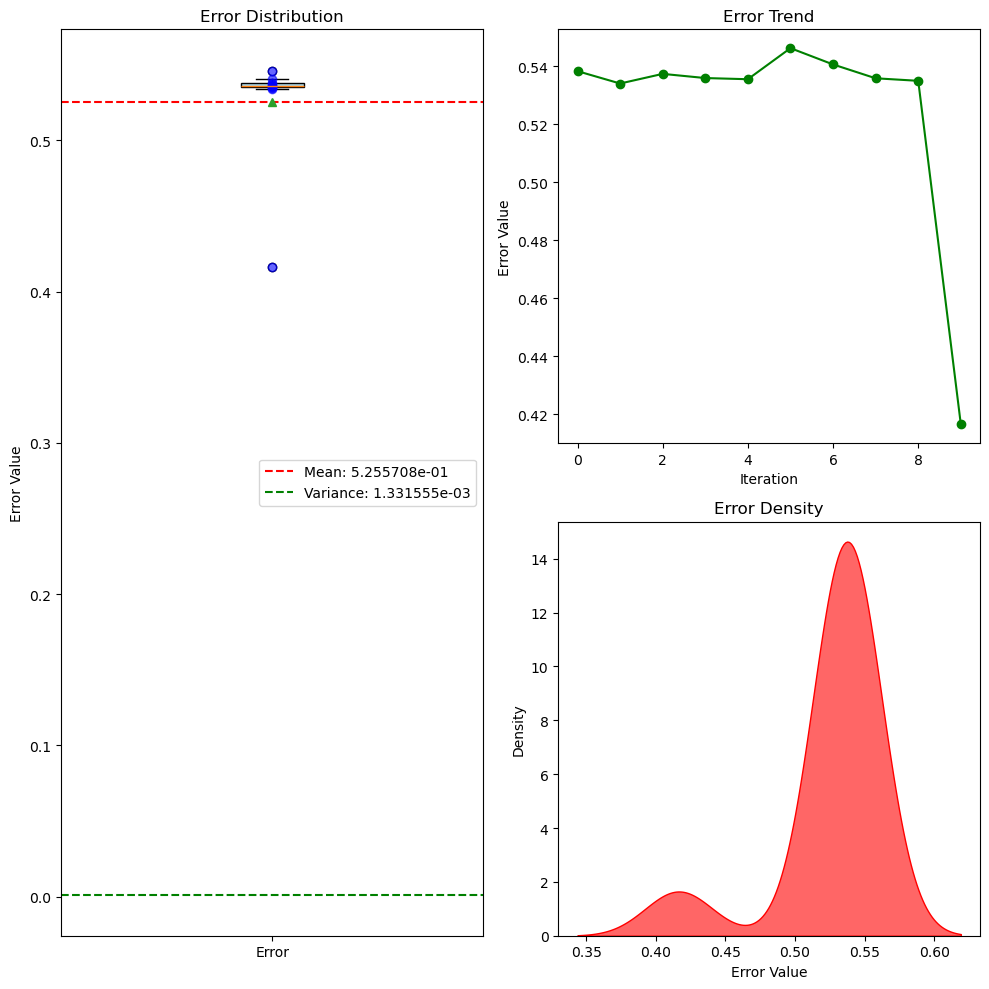

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_u

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean Error u: %e' % (mean_error)) #打印误差
print('Variance Error u: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

In [10]:
len_t = 101
len_x = 101

# --- 反向过程 (您需要的部分) ---

# 假设您现在只有 X_star, u_star，以及 len_t 和 len_x
# len_t = 101
# len_x = 256

# 1. 从 X_star 中分离出展平的 X 和 T
flat_X = X_star[:, 0]
flat_T = X_star[:, 1]

# 2. 使用 reshape 将它们恢复为原始的二维形状
# np.reshape 的默认顺序是 'C' (行主序)，这与 flatten 的默认行为一致
# 我们知道原始形状是 (len_t, len_x)
X = flat_X.reshape(len_t, len_x)
T = flat_T.reshape(len_t, len_x)

U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')


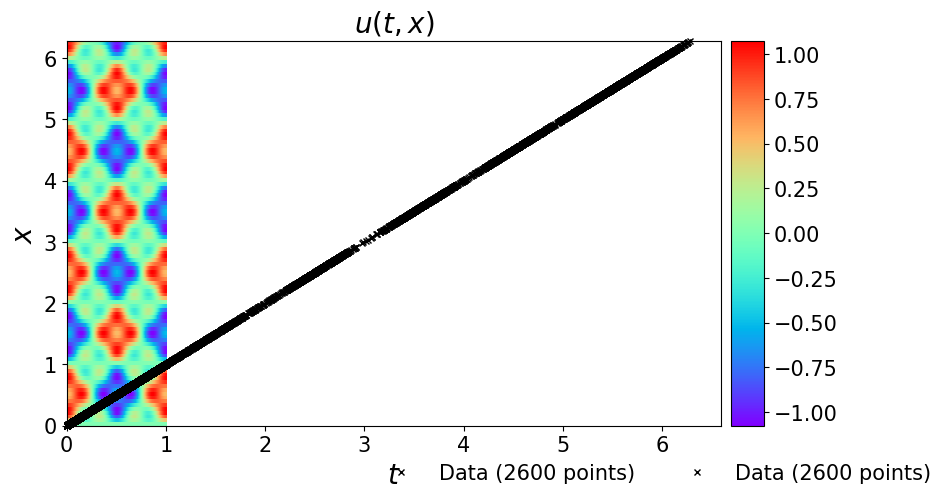

In [11]:
###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
im = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[lb[1], ub[1], lb[0], ub[0]], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是im，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(im, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（im）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f[:,1], 
    X_f[:,0], 
    'kx', label = 'Data (%d points)' % (X_f.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [12]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


16931


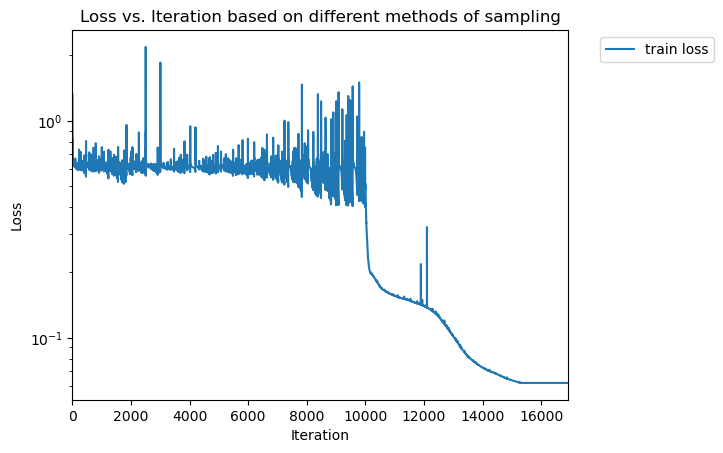

In [13]:
print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,len(trainloss)]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


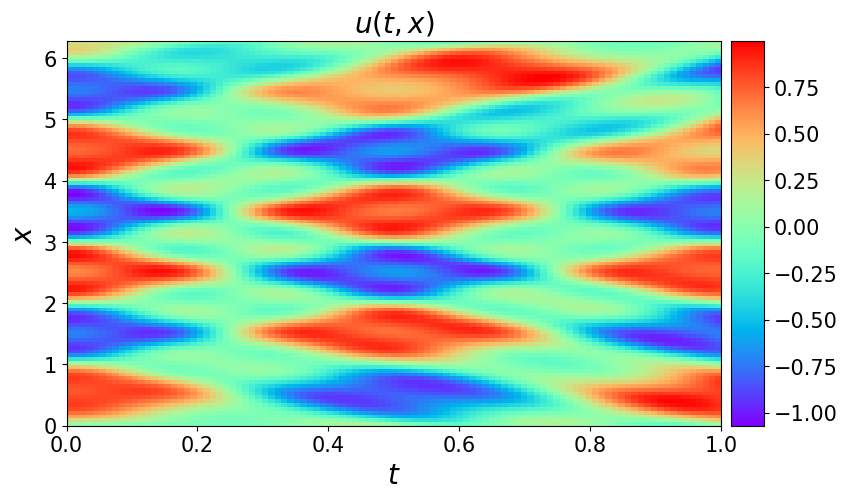

In [14]:
#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
im = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[lb[1], ub[1], lb[0], ub[0]], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(im, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（im）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

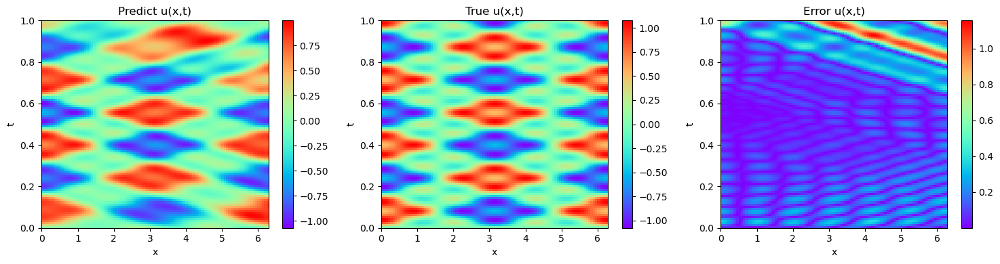

In [15]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predict u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [16]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

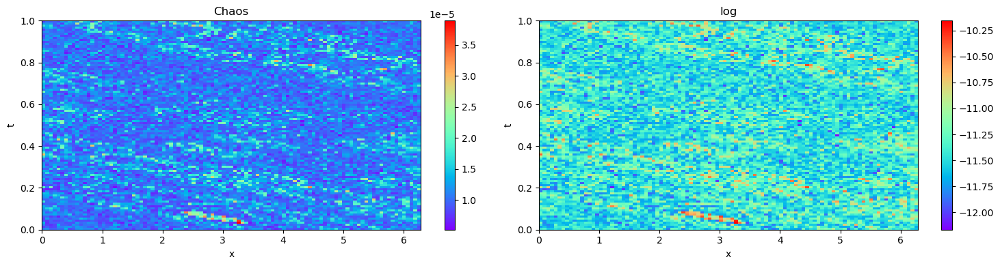

In [17]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()